In [1]:
import numpy as np
import random
import time
import math
import random
import os
import json
import sys
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

random.seed(42)
np.random.seed(42)

# Notebook path
current_directory = os.getcwd()
# Get one behind for calling the other modules
root_directory = os.path.abspath(os.path.join(current_directory, '..'))
sys.path.append(root_directory)

#Network and measures
from to_get_data.net_construction_vis_measures import *
from to_get_data.generate_database import *
#Agrobiodiversity
from to_get_data.agrobiodiversity_data import *

from model_class.Variety import Variety
from model_class.UD_clan import *
from model_class.UD_aleatory_inheritance_clan import *

# Methods for data

In [36]:
def heat_diversity_comm_level(matrix, inherits, alphas, kinship_system, variable= ''):
    # Heatmap of diversity at the community level
    mean_values = np.array([[np.mean(matrix[i][j]['diversity_info'][1]) for j in range(len(alphas))] for i in range(len(inherits))])
    mean_values = np.nan_to_num(mean_values, nan=0.0)
    colors = ['#f0f0f0', '#d4e6f1', '#a9cce3', '#7fb3d5', '#5499c7', '#2980b9']
    n_bins = len(colors)
    cmap = LinearSegmentedColormap.from_list('custom_cmap', colors, N=n_bins)
    fig, ax = plt.subplots(1, 1, figsize=(7, 5), facecolor="white")
    IM = ax.imshow(mean_values, cmap=cmap, vmin=0, vmax=10)
    cbar = fig.colorbar(IM, ax=ax, label="Mean Diversity")
    ax.set_xticks(np.arange(len(alphas)))
    ax.set_yticks(np.arange(len(inherits)))
    ax.set_xticklabels(alphas)
    ax.set_yticklabels(inherits)
    for i in range(len(inherits)):
        for j in range(len(alphas)):
            text = '0' if mean_values[i, j] == 0 else f'{mean_values[i, j]:.2f}'
            text_color = 'black'
            ax.text(j, i, text, ha="center", va="center", color=text_color, fontsize=8)

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    ax.set_ylabel("Inherit percentage")
    ax.set_xlabel(variable)
    plt.title(f"""
    {kinship_system}
    Mean Diversity at the community level for each configuration""")
    plt.tight_layout()
    plt.show()

In [37]:
def diversity_change_graphs (matrix, inherits, alphas, kinship_system, variable = '', limitant =False):
    def is_valid_data(data): #To see if we have at least one succesful experiment
        return not np.isscalar(data) and not np.isnan(data).all()

    # Define Colors
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown', 'pink', 'gray']

    n_rows = len(inherits)
    n_cols = len(alphas)

    # Big graph
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4), sharex=True, sharey=True)

    valid_configs = 0 #in case we have some configuration with no data due to extintion

    for i, inherit in enumerate(inherits):
        for j, alpha in enumerate(alphas):
            # Get data
            data = matrix[i][j]['diversity_info_steps'][1]
            # Subplot
            ax = axes[i, j]

            # Valid
            if not is_valid_data(data):
                ax.text(0.5, 0.5, 'No Data', ha='center', va='center', transform=ax.transAxes)
                ax.set_axis_off()  # Hide the axis if there's no data
                print(f"Skipping Inherit {inherit}%, {variable} {alpha} due to no data")
                continue

            # Mean and std
            mean_data = np.mean(data, axis=0)
            std_data = np.std(data, axis=0)
            # Assign a unique color for each configuration
            color = colors[valid_configs % len(colors)]
            linestyle = '-' if valid_configs % 2 == 0 else '--'

            # Plot
            ax.plot(tempo, mean_data, color=color, linestyle=linestyle)
            ax.fill_between(tempo,mean_data - std_data, mean_data + std_data, color = color, alpha = 0.4)

            # Set labels and title for the subplot
            ax.set_title(f'{inherit}%, {variable} {alpha}')
            ax.grid(True)

            valid_configs += 1 #to change color

    # General figure
    fig.suptitle(f'''
    {kinship_system}
    Diversity Change Over Time for Different Configurations'''
                 , fontsize=16)
    fig.supxlabel('Time Steps')
    fig.supylabel('Diversity')

    # Layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    if limitant == False:
        plt.ylim(0,10)
    plt.show()

In [38]:
def plot_specific_graph(x, y, matrix, inherits, alphas, kinship_system, variable = '', limitant = False):
    """
    Function to plot the graph for specific coordinates (x = i, y = j).
    x corresponds to the 'inherits' index (i), and y corresponds to 'malphas' index (j).
    """
    def is_valid_data(data): #To see if we have at least one succesful experiment
        return not np.isscalar(data) and not np.isnan(data).all()
    if x >= len(inherits) or y >= len(alphas):
        print("Invalid coordinates. Please ensure x and y are within the matrix bounds.")
        return

    # Get data
    inherit = inherits[x]
    alpha = alphas[y]
    data = matrix[x][y]['diversity_info_steps'][1]
    
    # Valid
    if not is_valid_data(data):
        print(f"No valid data for Inherit {inherit}%, {variable} {alpha}.")
        return

    # mean and standard deviation
    mean_data = np.mean(data, axis=0)
    std_data = np.std(data, axis=0)

    # Create a new figure
    plt.figure(figsize=(8, 6))

    # Plot data
    plt.plot(tempo, mean_data, label=f'Inherit {inherit}%, Initial UDs {alpha}', color='r', linestyle='-')

    # Plot the standard deviation as a shaded area
    plt.fill_between(tempo, mean_data - std_data, mean_data + std_data, color='b', alpha=0.2)

    # Add labels, title, and grid
    plt.xlabel('Time Steps')
    plt.ylabel('Diversity Value')
    plt.title(f'''
    {kinship_system}
    Diversity Change Over Time (Inherit {inherit}%, {variable} {alpha})''')
    plt.grid(True)
    if limitant == False:
        plt.ylim(0,10)
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()

In [2]:
def transversal_changes(matrix, inherits, alphas, kinship_system, variable=''):
    # Plot
    plt.figure(figsize=(10, 6))
    for i, inherit in enumerate(inherits):  # Loop for graphs
        means, stds = [], []  # Lists
        for j, malpha in enumerate(alphas):
            # Ensure diversity_info is not None
            diversity_info = matrix[i][j].get('diversity_info')
            if diversity_info is not None and len(diversity_info) > 1:  # Check validity
                data = diversity_info[1]
                means.append(np.mean(data))  # Mean
                stds.append(np.std(data))   # Std
            else:
                # Handle missing or invalid data
                means.append(np.nan)  # Append NaN if no valid data
                stds.append(0)  # Zero standard deviation for NaN

        # Plot for each Initial UDs according to the inheritance strategy
        label = inherit if inherit != 'False' else 'Random'
        plt.errorbar(alphas, means, yerr=stds, label=f'{label}', fmt='-o', capsize=5)

    # Labels and title
    plt.xlabel(variable)
    plt.xticks(alphas)
    plt.ylabel('Diversity at the community level')
    plt.title(f'''
    {kinship_system}
    Diversity at the community level for different {variable}''')
    plt.legend(title="Inheritance Levels")
    plt.grid(True)
    plt.ylim(0, 10)
    plt.show()

In [4]:
def transversal_alive(matrix, inherits, alphas, kinship_system, variable=''):
    """
    Creates an error bar plot showing the 'alive' information from the matrix for different inheritance levels,
    using standard error calculated from matrix[i][j]['std'] and alive count.
    """
    # Plot setup
    plt.figure(figsize=(10, 6))
    for i, inherit in enumerate(inherits):  # Loop over inheritance levels
        means, stds = [], []  # Lists for storing means and standard deviations
        for j, malpha in enumerate(alphas):
            # Safely extract 'alive' and 'std' information
            alive = matrix[i][j].get('alive')
            std = matrix[i][j].get('std', [0])  # Default std to [0] if key is missing

            if alive is not None and len(std) > 0:
                mean = alive  # Extract mean 'alive' information
                std_value = std[-1]  # Extract the last value in 'std'
            else:
                # Handle invalid data
                mean = np.nan  # Mark as NaN if data is missing
                std_value = 0  # Zero standard deviation for invalid data

            means.append(mean)
            stds.append(std_value)
        
        # Plot for each inheritance level
        label = inherit if inherit != 'False' else 'Random'
        plt.errorbar(alphas, means, yerr=stds, label=f'{label}', fmt='-o', capsize=5)
    
    # Plot formatting
    plt.xlabel(variable)
    plt.xticks(alphas)
    plt.ylabel('Alive UDs')
    plt.title(f'''
    {kinship_system}
    Alive UDs for Different {variable}''')
    plt.legend(title="Inheritance Levels")
    plt.grid(True)
    plt.ylim(0, 250)  # Adjust y-limit if necessary
    plt.show()

In [41]:
def heat_population (matrix, inherits, alphas, kinship_system, variable = ''):
    # Heatmap population
    alive_values = np.array([[(matrix[i][j]['alive']) for j in range(len(alphas))] for i in range(len(inherits))])
    fig, ax = plt.subplots(1, 1, figsize=(7, 5), facecolor="white")
    IM = ax.imshow(alive_values, vmin=0, vmax=200)
    cbar = fig.colorbar(IM, ax=ax, label="UDs")
    ax.set_xticks(np.arange(len(alphas)))
    ax.set_yticks(np.arange(len(inherits)))
    ax.set_xticklabels(alphas)
    ax.set_yticklabels(inherits)
    for i in range(len(inherits)):
        for j in range(len(alphas)):
            value = alive_values[i, j]
            bg_color = IM.cmap(IM.norm(value))
            brightness = (0.299 * bg_color[0] + 0.587 * bg_color[1] + 0.114 * bg_color[2])
            text_color = 'white' if brightness < 0.5 else 'black'
            ax.text(j, i, f'{value:.1f}', ha="center", va="center", color=text_color, fontsize=8)
    # Rotate x-axis labels
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    # Labels
    ax.set_ylabel("Inherit percentage")
    ax.set_xlabel(variable)
    plt.title(f"""
    {kinship_system}. Final population""")
    plt.tight_layout()
    plt.show()

In [42]:
def heat_std(matrix, inherits, alphas, kinship_system, variable = ''):
    # Heatmap population
    alive_values = np.array([[np.mean(matrix[i][j]['std']) for j in range(len(alphas))] for i in range(len(inherits))])
    fig, ax = plt.subplots(1, 1, figsize=(7, 5), facecolor="white")
    IM = ax.imshow(alive_values)
    cbar = fig.colorbar(IM, ax=ax, label="UDs")
    ax.set_xticks(np.arange(len(alphas)))
    ax.set_yticks(np.arange(len(inherits)))
    ax.set_xticklabels(alphas)
    ax.set_yticklabels(inherits)
    for i in range(len(inherits)):
        for j in range(len(alphas)):
            value = alive_values[i, j]
            bg_color = IM.cmap(IM.norm(value))
            brightness = (0.299 * bg_color[0] + 0.587 * bg_color[1] + 0.114 * bg_color[2])
            text_color = 'white' if brightness < 0.5 else 'black'
            ax.text(j, i, f'{value:.1f}', ha="center", va="center", color=text_color, fontsize=8)
    # Rotate x-axis labels
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    # Labels
    ax.set_ylabel("Inherit percentage")
    ax.set_xlabel(variable)
    plt.title(f"""
    {kinship_system}. Final population""")
    plt.tight_layout()
    plt.show()

In [55]:
def heat_percentage_population(matrix, inherits, alphas, kinship_system, variable = ''):
    # Heatmap porcentage of extinction
    alive_values = np.array([[(matrix[i][j]['percentage_extinction']) for j in range(len(alphas))] for i in range(len(inherits))])
    #alive_values = np.array([[entry['porcentage_extintion'] for entry in row] for row in matrix])
    fig, ax = plt.subplots(1, 1, figsize=(7, 5), facecolor="white")
    IM = ax.imshow(alive_values, cmap='viridis_r')
    cbar = fig.colorbar(IM, ax=ax, label="UDs")
    ax.set_xticks(np.arange(len(alphas)))
    ax.set_yticks(np.arange(len(inherits)))
    ax.set_xticklabels(alphas)
    ax.set_yticklabels(inherits)
    for i in range(len(inherits)):
        for j in range(len(alphas)):
            value = alive_values[i, j]
            bg_color = IM.cmap(IM.norm(value))
            brightness = (0.299 * bg_color[0] + 0.587 * bg_color[1] + 0.114 * bg_color[2])
            text_color = 'white' if brightness < 0.5 else 'black'
            ax.text(j, i, f'{value:.1f}', ha="center", va="center", color=text_color, fontsize=8)
    # Rotate x-axis labels
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    # Labels
    ax.set_ylabel("Inherit percentage")
    ax.set_xlabel(variable)
    plt.title(f"""
    {kinship_system}. Porcentage of extintion by each configuration""")
    plt.tight_layout()
    plt.show()

In [44]:
def plot_specific_alivegraph(x, y, matrix, inherits, alphas, kinship_system, variable = ''):
    #Graph of experiment with mean and std
    # Main line
    plt.plot(matrix[x][y]['tempo'], matrix[x][y]['mean'], 's-', label='Media', alpha=0.7)

    # Std
    plt.fill_between(matrix[x][y]['tempo'], matrix[x][y]['mean'] - matrix[x][y]['std'],
                     matrix[x][y]['mean'] + matrix[x][y]['std'], color='red', alpha=0.2, label='Std')

    plt.xlabel('Tempo (t)')
    plt.ylabel('UDs')
    plt.ylim(bottom=0)
    plt.title(f'''
    UDs no tempo.
    {variable} {alphas[y]} e Inheritage percentage: {inherits[x]}
    Taxa media de crescimento: {matrix[x][y]['growth rate']}''')
    plt.legend()
    plt.show()

In [45]:
def diversity_change_by_row(matrix, inherits, alphas, kinship_system, variable='', limitant=False):
    def is_valid_data(data):
        return not np.isscalar(data) and not np.isnan(data).all()

    # Define colors
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown', 'pink', 'gray']

    # For each row (inherit percentage)
    for i, inherit in enumerate(inherits):
        fig, ax = plt.subplots(figsize=(10, 6))

        valid_configs = 0  # For assigning unique colors

        for j, alpha in enumerate(alphas):
            data = matrix[i][j]['diversity_info_steps'][1]

            # Skip invalid data
            if not is_valid_data(data):
                print(f"Skipping Inherit {inherit}%, {variable} {alpha} due to no data")
                continue

            mean_data = np.mean(data, axis=0)
            std_data = np.std(data, axis=0)

            color = colors[valid_configs % len(colors)]
            linestyle = '-' if valid_configs % 2 == 0 else '--'

            # Plot for this alpha value
            ax.plot(tempo, mean_data, color=color, linestyle=linestyle, label=f'{variable} {alpha}')
            #ax.fill_between(tempo, mean_data - std_data, mean_data + std_data, color=color, alpha=0.4)

            valid_configs += 1

        ax.set_title(f'Diversity Change Over Time for Inherit {inherit}%')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Diversity')
        ax.grid(True)
        ax.legend(title="Alpha")
        ax.set_ylim(bottom=0)

        if not limitant:
            ax.set_ylim(0, 10)

        plt.tight_layout()
        plt.show()

In [46]:
def diversity_change_by_column(matrix, inherits, alphas, kinship_system, variable='', limitant=False):
    def is_valid_data(data):
        return not np.isscalar(data) and not np.isnan(data).all()

    # Define colors
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown', 'pink', 'gray']

    # For each column (alpha value)
    for j, alpha in enumerate(alphas):
        fig, ax = plt.subplots(figsize=(10, 6))

        valid_configs = 0  # For assigning unique colors

        for i, inherit in enumerate(inherits):
            data = matrix[i][j]['diversity_info_steps'][1]

            # Skip invalid data
            if not is_valid_data(data):
                print(f"Skipping Inherit {inherit}%, {variable} {alpha} due to no data")
                continue

            mean_data = np.mean(data, axis=0)
            std_data = np.std(data, axis=0)

            color = colors[valid_configs % len(colors)]
            linestyle = '-' if valid_configs % 2 == 0 else '--'

            # Plot for this inherit percentage
            ax.plot(tempo, mean_data, color=color, linestyle=linestyle, label=f'{inherit}%')
            #ax.fill_between(tempo, mean_data - std_data, mean_data + std_data, color=color, alpha=0.4)

            valid_configs += 1

        ax.set_title(f'Diversity Change Over Time for {variable} {alpha}')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Diversity')
        ax.grid(True)
        ax.legend(title="Inherit %")
        ax.set_ylim(bottom=0)

        if not limitant:
            ax.set_ylim(0, 10)

        plt.tight_layout()
        plt.show()

# Endogamy

## Initial UDs

Here we experimento with Initial UDs. We try from 10 to 100

In [121]:
# This experiment has different values for Initial UDs
prob_morte = 0.06 #beta
media = 4 # Mean
m = 100 # Initial UDs
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
# inherits = [0, 'False'] #Values for inherit
Emalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
# For data of behaviour
mM = np.empty((len(inherits), len(Emalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 120


print(mM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, iniciais  in enumerate(Emalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} and Initial UDs {iniciais}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            if inherit != 'False':
                
                #### Initialization
                UD_endogamy.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(iniciais) + 1):
                    instancias_ud.append(UD_endogamy(id_ud, media))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_endogamy.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_endogamy.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(iniciais)]
                vivas_tasa_crecimiento = [int(iniciais)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Emalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_endogamy.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_endogamy_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(iniciais) + 1):
                    instancias_ud.append(UD_endogamy_al_inh(id_ud, media))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_endogamy_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_endogamy_al_inh.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(iniciais)]
                vivas_tasa_crecimiento = [int(iniciais)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Emalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, 3)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_endogamy_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            if len(uds_copy) > 0:
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            mM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            mM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit} and initial UDs {iniciais} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Endo_Initial_UDs.npy')
np.save(heat_std, mM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-06 14:58:17.413695
Experiments with inheritance 0 and Initial UDs 10.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 10.0
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 10.0
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 10.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 10.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 10.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 10.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 10.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 10.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 10.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 10.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con unidad

experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 0 con unidades 20.0
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 20.0
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 20.0
experimento 35
acabó en 0 el experimento 35 con herencia 0 con unidades 20.0
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 0 con unidades 20.0
experimento 42
acabó en 0 el experimento 42 con herencia 0 con unidades 20.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 0 con unidades 20.0
experimento 45
acabó en 0 el experimento 45 con herencia 0 con unidades 20.0
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 20.0
experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 20.0
experimento 50
experimento 51
acabó

experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 0 and initial UDs 40.0 is  484.62796807289124
        
Experiments with inheritance 0 and Initial UDs 50.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experime


The total time of the configuration of inherit percentage 0 and initial UDs 80.0 is  607.1622397899628
        
Experiments with inheritance 0 and Initial UDs 90.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
expe

experimento 79
acabó en 0 el experimento 79 con herencia 25 con unidades 10.0
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 10.0
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 10.0
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 10.0
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 10.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 10.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 10.0
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 10.0
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 10.0
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 10.0
experimento 95
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 25 con unidades 10.0
experimento 98
acabó e

experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 30.0
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 30.0
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 30.0
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 25 con unidades 30.0
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 1

experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experiment

experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 50 con unidades 10.0
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 10.0
experimento 23
acabó en 0 el experimento 23 con herencia 50 con unidades 10.0
experimento 24
acabó en 0 el experimento 24 con herencia 50 con unidades 10.0
experimento 25
acabó en 0 el experimento 25 con herencia 50 con unidades 10.0
experimento 26
acabó en 0 el experimento 26 con herencia 50 con unidades 10.0
experimento 27
acabó en 0 el experimento 27 con herencia 50 con unidades 10.0
experimento 28
acabó en 0 el experimento 28 con herencia 50 con unidades 10.0
experimento 29
acabó en 0 el experimento 29 con herencia 50 con unidades 10.0
experimento 30
acabó en 0 el experimento 30 con herencia 50 con unidades 10.0
experimento 31
acabó en 0 el experimento 31 con herencia 50 con unidades 10.0
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 50 con unidades 10.0
experimento 34
expe

experimento 52
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 50 con unidades 20.0
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 50 con unidades 20.0
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 50 con unidades 20.0
experimento 59
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 20.0
experimento 63
experimento 64
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 20.0
experimento 67
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 20.0
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 20.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con unidades 20.0
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 50 con unidades 20.0
experimento 79
experimento 8

experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 50 con unidades 50.0
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 50 and initial UDs 50.0 is  570.201936006546
        
Experiments with inheritance 50 and Initial UDs 60.0
experimento 1
experimento 2
ex

experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 50 and initial UDs 90.0 is  606.7450277805328
        
Experiments with inheritance 50 and Initial UDs 100.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experiment

experimento 89
acabó en 0 el experimento 89 con herencia False con unidades 10.0
experimento 90
acabó en 0 el experimento 90 con herencia False con unidades 10.0
experimento 91
acabó en 0 el experimento 91 con herencia False con unidades 10.0
experimento 92
acabó en 0 el experimento 92 con herencia False con unidades 10.0
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia False con unidades 10.0
experimento 95
acabó en 0 el experimento 95 con herencia False con unidades 10.0
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia False con unidades 10.0
experimento 98
acabó en 0 el experimento 98 con herencia False con unidades 10.0
experimento 99
acabó en 0 el experimento 99 con herencia False con unidades 10.0
experimento 100
acabó en 0 el experimento 100 con herencia False con unidades 10.0
experimento 101
acabó en 0 el experimento 101 con herencia False con unidades 10.0
experimento 102
acabó en 0 el experimento 102 con herencia False con unidad

experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia False con unidades 30.0
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia False con unidades 30.0
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112


experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experiment

In [8]:
# Dowload the documents
#As a reference
m = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Emalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Endo_Initial_UDs.npy')

## General Data
EmM_datos = np.load(heat_std, allow_pickle=True)

### Data and visualizations: diversity

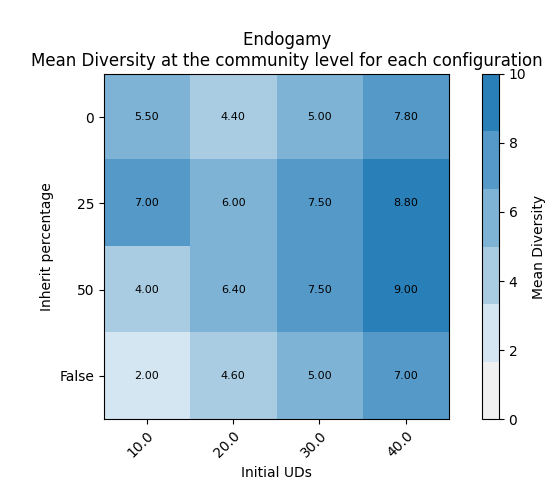

ValueError: x and y must have same first dimension, but have shapes (21,) and (11,)

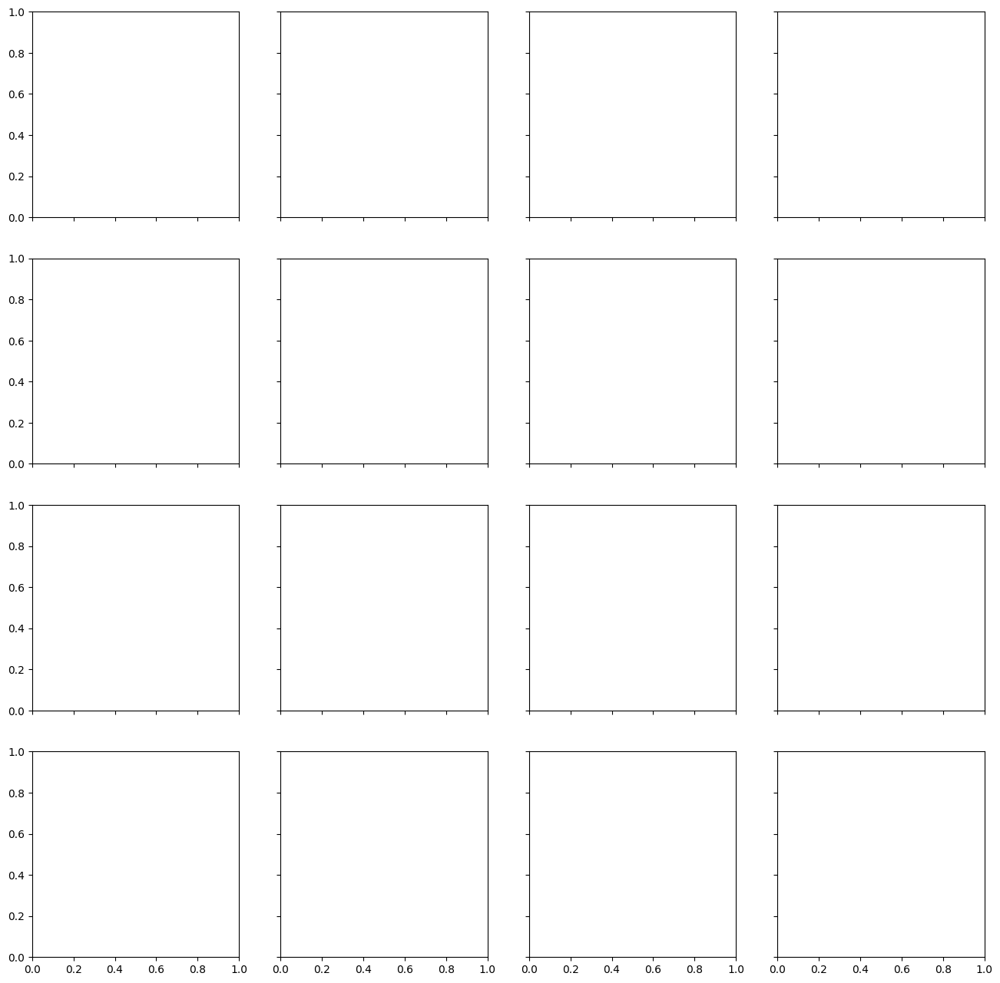

In [47]:
# heat_diversity_comm_level(EmM_datos, inherits, Emalphas, 'Endogamy', variable='Initial UDs')
# diversity_change_graphs(EmM_datos, inherits, Emalphas, 'Endogamy', variable = 'Initial UDs')
# diversity_change_by_row(EmM_datos, inherits, Emalphas, 'Endogamy', variable='Initial UDs')
# diversity_change_by_column(EmM_datos, inherits, Emalphas, 'Endogamy', variable='Initial UDs')
# plot_specific_graph(1, 1, EmM_datos, inherits, Emalphas, 'Endogamy', variable = 'Initial UDs')

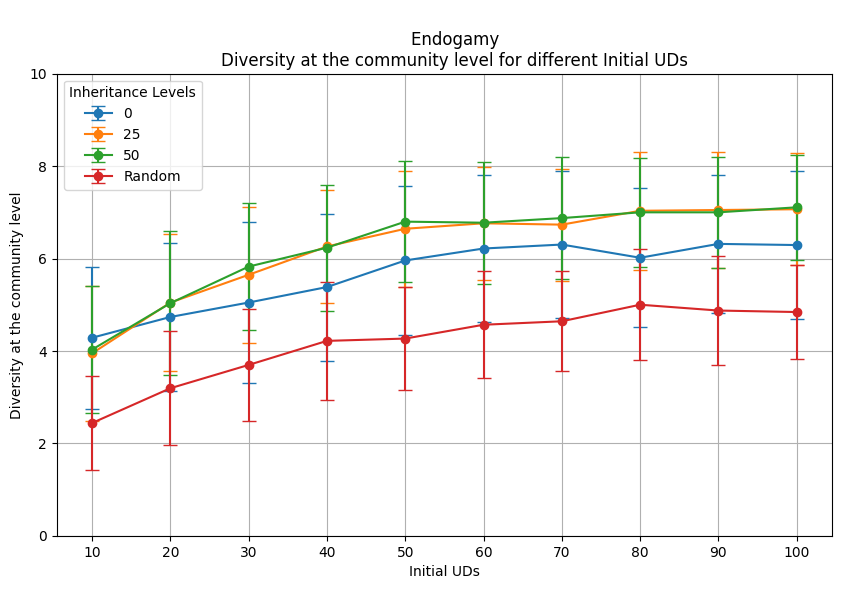

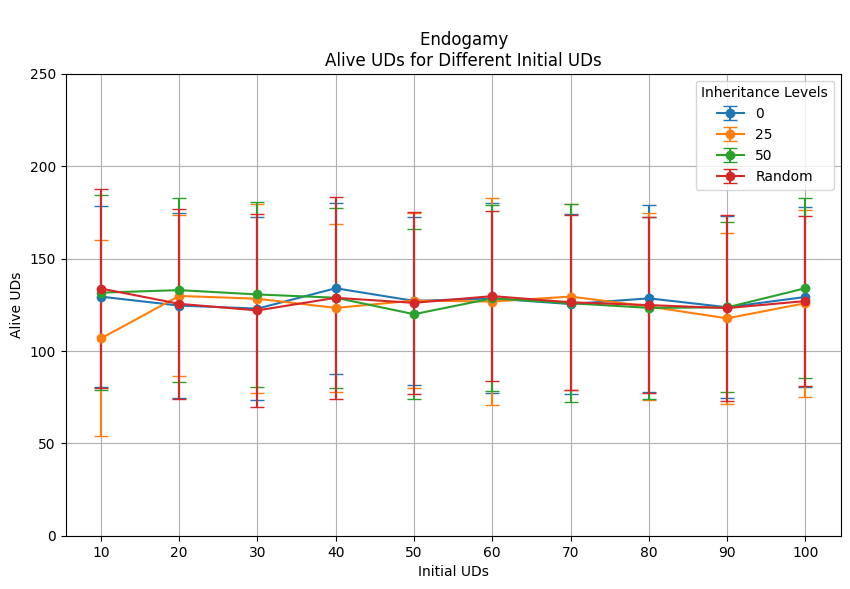

In [9]:
transversal_changes(EmM_datos, inherits, Emalphas, 'Endogamy', variable='Initial UDs')
transversal_alive(EmM_datos, inherits, Emalphas, 'Endogamy', variable='Initial UDs')

### Data and visualizations: population

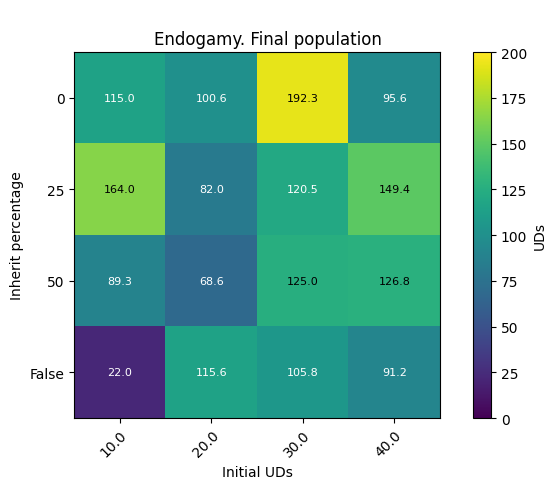

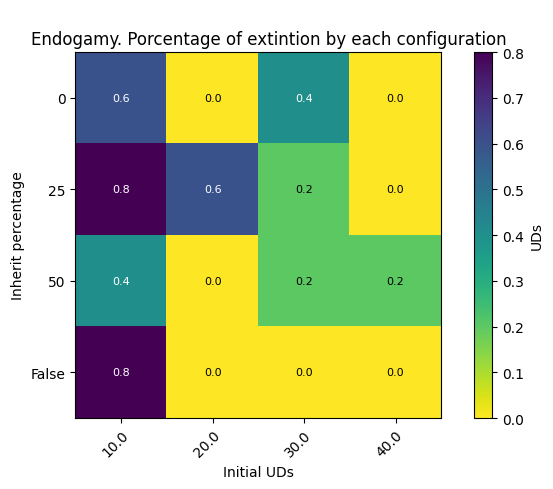

In [56]:
heat_population(EmM_datos, inherits, Emalphas, 'Endogamy', variable='Initial UDs')
heat_percentage_population(EmM_datos, inherits, Emalphas, 'Endogamy', variable='Initial UDs')
heat_std(EmM_datos, inherits, Emalphas, 'Endogamy', variable='Initial UDs')

## Initial Varieties

Here we try with different values for the initial varieties in the system.
We go from 10 to 100.

In [124]:
# This experiment has different values for Initial varieties VVVV
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
v = 100 # Initial varieties
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
# inherits = [0, 'False'] #Values for inherit
Evalphas = np.linspace(10,v,int(v/10)) # Initial Varieties: from 10 to v
# For data of behaviour
vM = np.empty((len(inherits), len(Evalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 120


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, varieties  in enumerate(Evalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} Initial UDs {m} and Initial varieties {varieties}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            if inherit != 'False':
                
                #### Initialization
                UD_endogamy.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_endogamy(id_ud, media))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_endogamy.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(varieties))]
                    for ud in UD_endogamy.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Evalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_endogamy.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_endogamy_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_endogamy_al_inh(id_ud, media))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_endogamy_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(varieties))]
                    for ud in UD_endogamy_al_inh.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Evalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, 3)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_endogamy_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            vM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            vM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit}, 
  initial UDs {m} and Initial varieties {varieties} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Endo_Initial_Varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-06 20:25:10.643916
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 10.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 10.0
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 0 con unidades 10.0
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 10.0
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 10.0
experimento 40
experimento 41
experimento 42
experimento

experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia 0 con unidades 40.0
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108

experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 80.0
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 80.0
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento

experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 10.0
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Initial varieties 10.0 is  522.207827091217
        
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 20.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
expe

experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 50.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 50.0
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
expe

experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Initial varieties 80.0 is  532.3807501792908
        
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 90.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 90.0
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 90.0
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 25 con unidades 

experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 50 con unidades 20.0
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 50 con unidades 20.0
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
expe

experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 50, 
  initial UDs 40 and Initial varieties 50.0 is  514.9813923835754
        
Experiments with inheritance 50 Initial UDs 40 and Initial varieties 60.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experiment

experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 50 con unidades 90.0
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experime

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 30.0
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 30.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experi

experimento 73
acabó en 0 el experimento 73 con herencia False con unidades 60.0
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia False con unidades 60.0
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage False, 
  initial UDs 40 and Initial varieties 60.0 is  490.9043316

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia False con unidades 100.0
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 100.0
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
expe

In [11]:
# Dowload the documents
#As a reference
v = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Evalphas = np.linspace(10,v,int(v/10)) # Initial UDs: from 10 to m
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Endo_Initial_Varieties.npy')
## heatmap and mean
EvM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

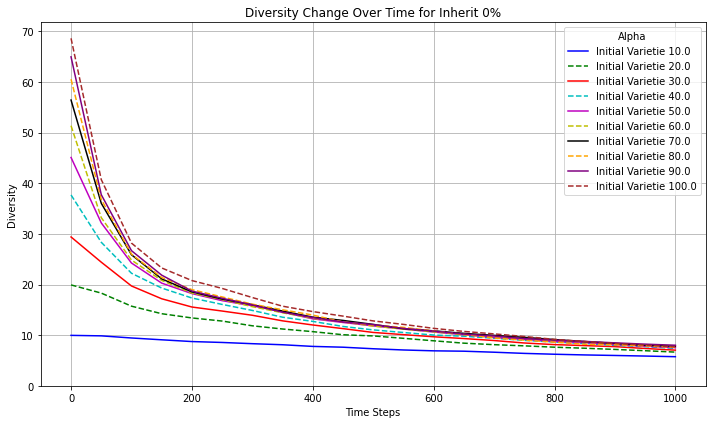

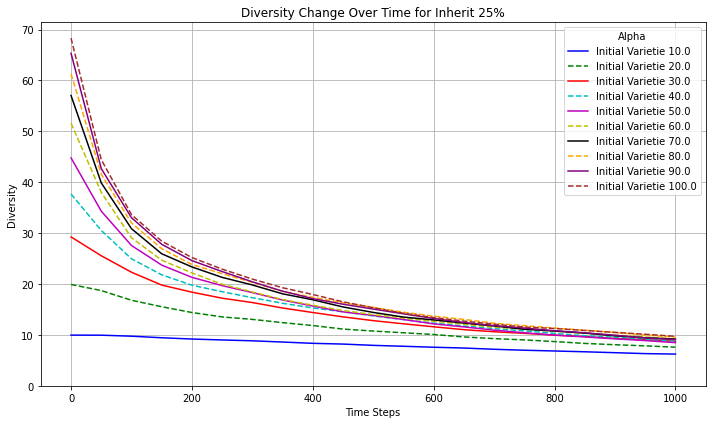

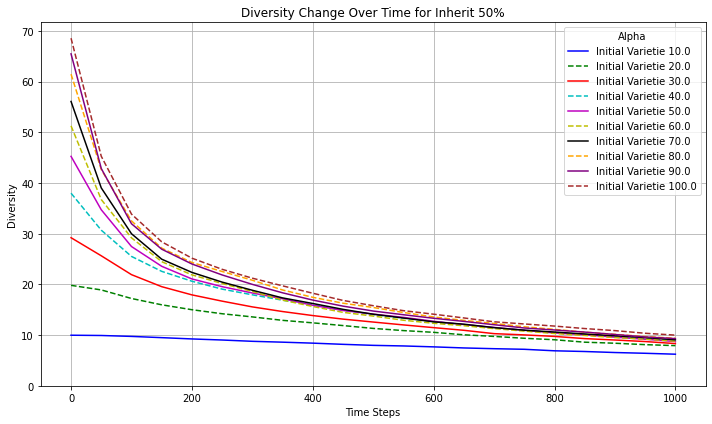

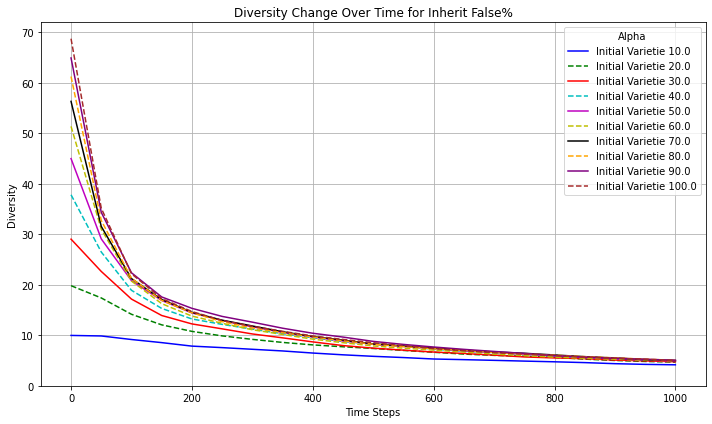

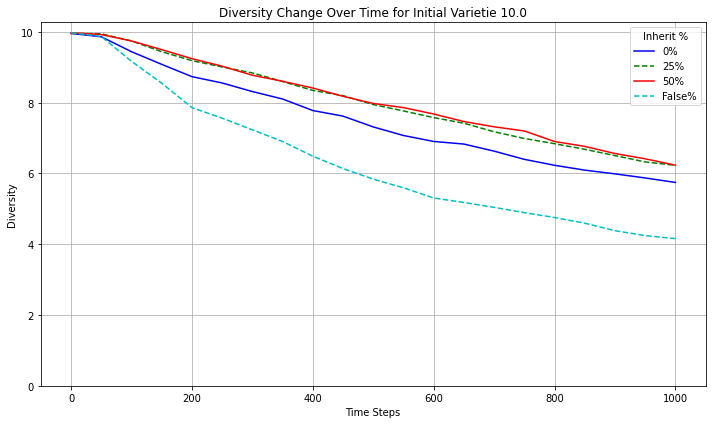

...

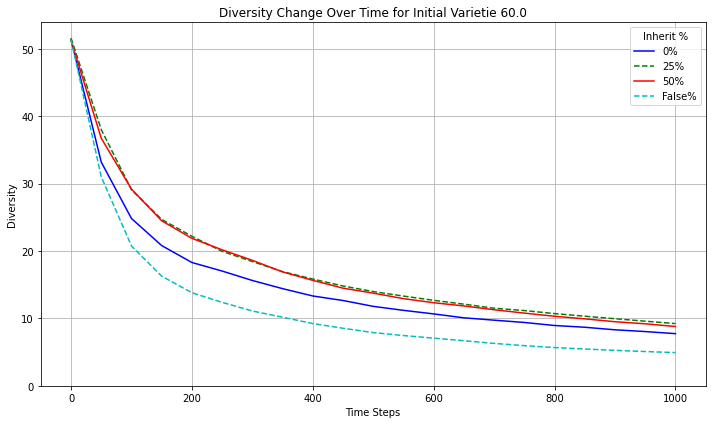

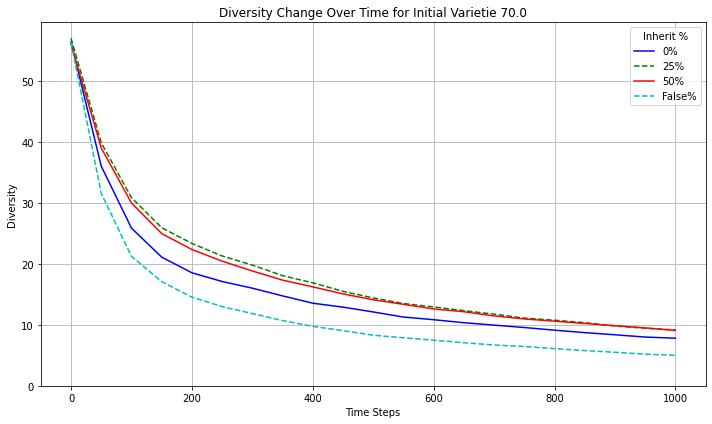

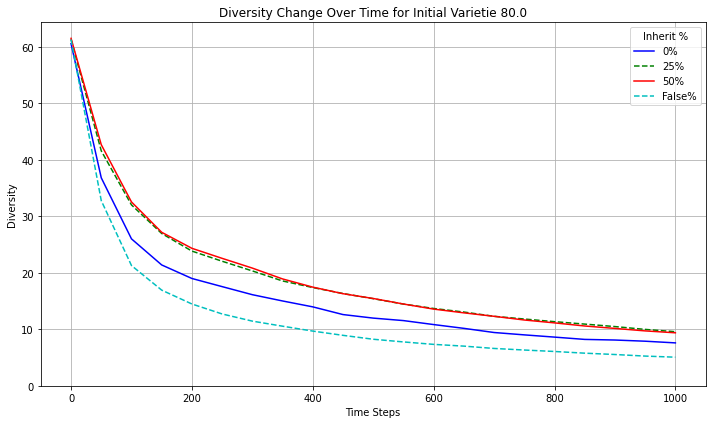

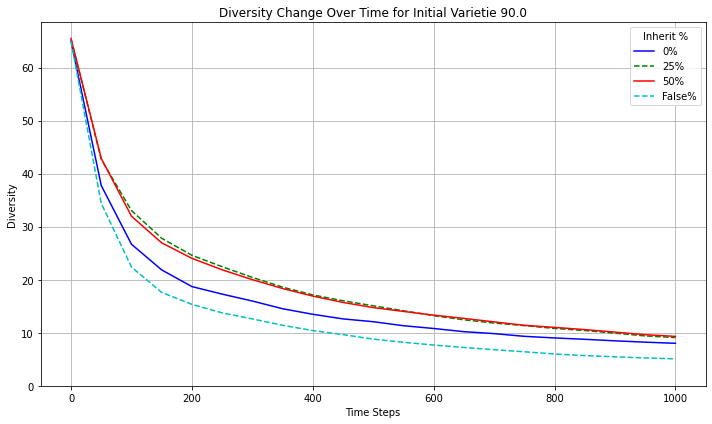

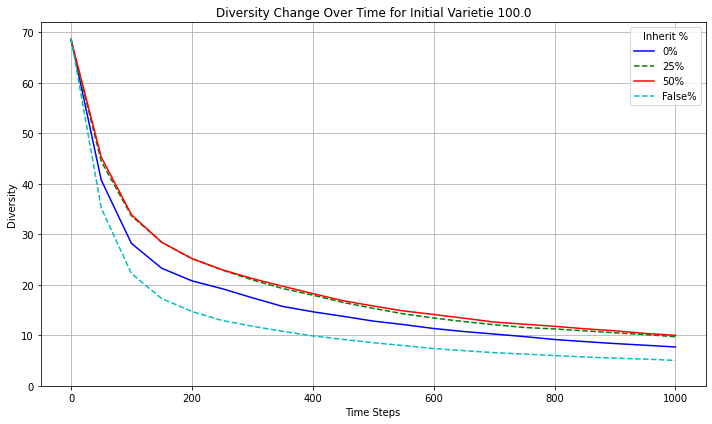

In [28]:
#heat_diversity_comm_level(EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varieties')
#diversity_change_graphs(EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varieties', limitant = True)
#diversity_change_by_row(EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varietie', limitant=True)
#diversity_change_by_column(EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varietie', limitant=True)
#plot_specific_graph(1, 1, EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varieties', limitant = True)

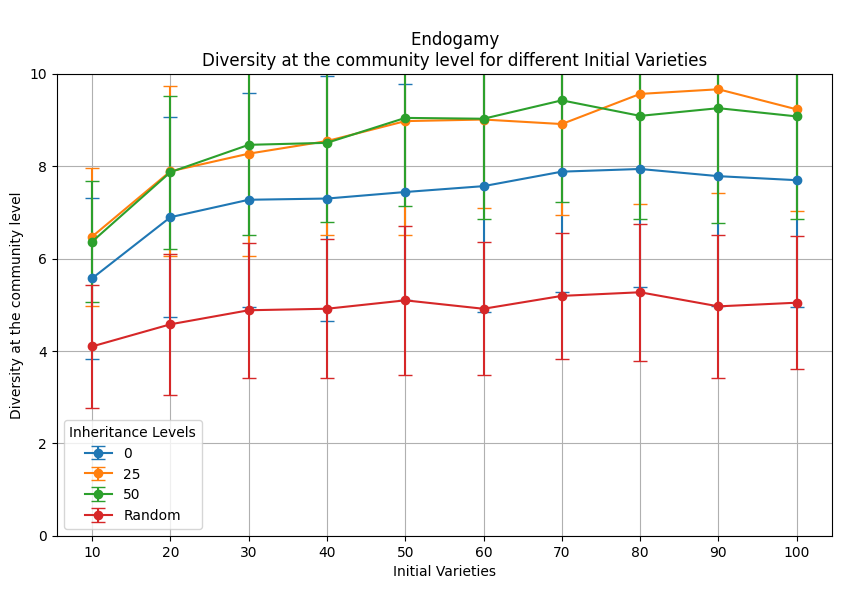

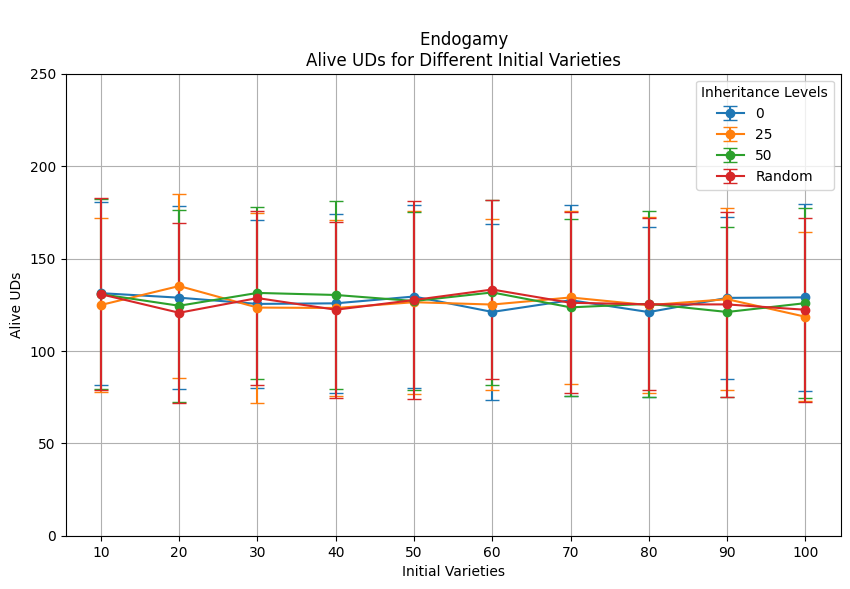

In [12]:
transversal_changes(EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varieties')
transversal_alive(EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varieties')

## Pop dynamics

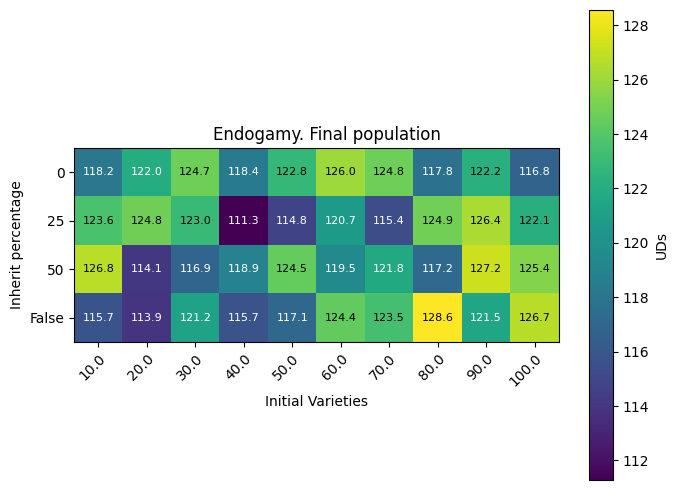

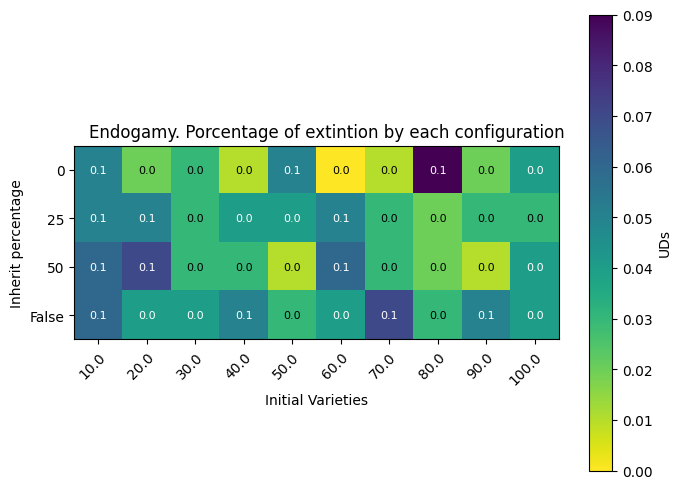

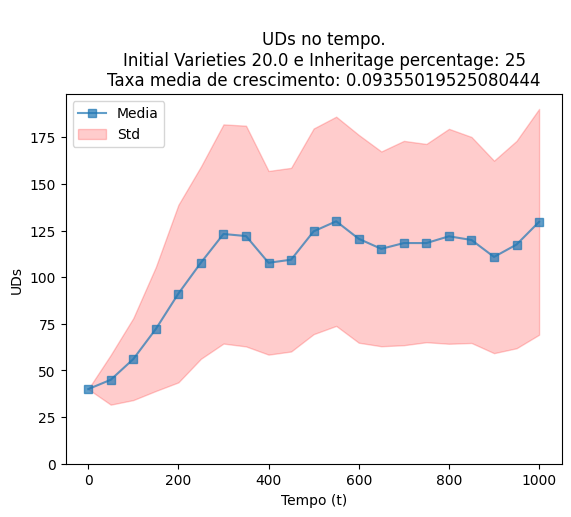

In [20]:
heat_population(EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varieties')

heat_percentage_population(EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varieties')

plot_specific_alivegraph(1, 1, EvM_datos, inherits, Evalphas, 'Endogamy', variable='Initial Varieties')

## Mean of children 


In [127]:
# This experiment has different values for Mean of children
prob_morte = 0.06 #beta
n = 10 # Mean
m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Ecalphas = np.linspace(1,n,n) # Mean of children from 1 to n
# For data of behaviour
cM = np.empty((len(inherits), len(Ecalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 120


print(cM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, media  in enumerate(Ecalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} and Mean of Children {media}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            if inherit != 'False':
                
                #### Initialization
                UD_endogamy.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_endogamy(id_ud, media))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_endogamy.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_endogamy.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Ecalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_endogamy.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_endogamy_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_endogamy_al_inh(id_ud, media))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_endogamy_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_endogamy_al_inh.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Ecalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, 3)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_endogamy_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            cM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            cM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit} and initial UDs {m} and mean {media} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Endo_Mean_children.npy')
np.save(heat_std, cM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-07 02:03:10.012981
Experiments with inheritance 0 and Mean of Children 1.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con mean 1.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con mean 1.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con mean 1.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con mean 1.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con mean 1.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 1.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 1.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 1.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 1.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 1.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 1.0
experimento 13
acabó en 0 el experimento 13 con he

acabó en 0 el experimento 8 con herencia 0 con mean 2.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 2.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 2.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 2.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 2.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con mean 2.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con mean 2.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con mean 2.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 con mean 2.0
experiment

acabó en 0 el experimento 6 con herencia 0 con mean 3.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 3.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 3.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 3.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 3.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 3.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 3.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con mean 3.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con mean 3.0
experimento 15
acabó en 0 el experimento 15 con herencia 0 con mean 3.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con mean 3.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con mean 3.0
experimento 18
acabó en 0 el experimento 18 con herencia 0 con mean 3.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con mean 3.0
experimento 20

acabó en 0 el experimento 120 con herencia 0 con mean 3.0

The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 3.0 is  10.874722003936768
        
Experiments with inheritance 0 and Mean of Children 4.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con mean 4.0
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 4.0
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia 0 con mean 4.0
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
e

experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 7.0 is  1095.5148577690125
        
Experiments with inheritance 0 and Mean of Children 8.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36


acabó en 0 el experimento 47 con herencia 25 con mean 1.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con mean 1.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con mean 1.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 1.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con mean 1.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con mean 1.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con mean 1.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con mean 1.0
experimento 55
acabó en 0 el experimento 55 con herencia 25 con mean 1.0
experimento 56
acabó en 0 el experimento 56 con herencia 25 con mean 1.0
experimento 57
acabó en 0 el experimento 57 con herencia 25 con mean 1.0
experimento 58
acabó en 0 el experimento 58 con herencia 25 con mean 1.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con mean 1.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con me

acabó en 0 el experimento 46 con herencia 25 con mean 2.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con mean 2.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con mean 2.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con mean 2.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 2.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con mean 2.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con mean 2.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con mean 2.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con mean 2.0
experimento 55
acabó en 0 el experimento 55 con herencia 25 con mean 2.0
experimento 56
acabó en 0 el experimento 56 con herencia 25 con mean 2.0
experimento 57
acabó en 0 el experimento 57 con herencia 25 con mean 2.0
experimento 58
acabó en 0 el experimento 58 con herencia 25 con mean 2.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con me

acabó en 0 el experimento 39 con herencia 25 con mean 3.0
experimento 40
acabó en 0 el experimento 40 con herencia 25 con mean 3.0
experimento 41
acabó en 0 el experimento 41 con herencia 25 con mean 3.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con mean 3.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con mean 3.0
experimento 44
acabó en 0 el experimento 44 con herencia 25 con mean 3.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con mean 3.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con mean 3.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con mean 3.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con mean 3.0
experimento 49
acabó en 0 el experimento 49 con herencia 25 con mean 3.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 3.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con mean 3.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con me

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
exp

experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experiment

acabó en 0 el experimento 77 con herencia 50 con mean 1.0
experimento 78
acabó en 0 el experimento 78 con herencia 50 con mean 1.0
experimento 79
acabó en 0 el experimento 79 con herencia 50 con mean 1.0
experimento 80
acabó en 0 el experimento 80 con herencia 50 con mean 1.0
experimento 81
acabó en 0 el experimento 81 con herencia 50 con mean 1.0
experimento 82
acabó en 0 el experimento 82 con herencia 50 con mean 1.0
experimento 83
acabó en 0 el experimento 83 con herencia 50 con mean 1.0
experimento 84
acabó en 0 el experimento 84 con herencia 50 con mean 1.0
experimento 85
acabó en 0 el experimento 85 con herencia 50 con mean 1.0
experimento 86
acabó en 0 el experimento 86 con herencia 50 con mean 1.0
experimento 87
acabó en 0 el experimento 87 con herencia 50 con mean 1.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con mean 1.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con mean 1.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con me

acabó en 0 el experimento 68 con herencia 50 con mean 2.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con mean 2.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con mean 2.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con mean 2.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con mean 2.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con mean 2.0
experimento 74
acabó en 0 el experimento 74 con herencia 50 con mean 2.0
experimento 75
acabó en 0 el experimento 75 con herencia 50 con mean 2.0
experimento 76
acabó en 0 el experimento 76 con herencia 50 con mean 2.0
experimento 77
acabó en 0 el experimento 77 con herencia 50 con mean 2.0
experimento 78
acabó en 0 el experimento 78 con herencia 50 con mean 2.0
experimento 79
acabó en 0 el experimento 79 con herencia 50 con mean 2.0
experimento 80
acabó en 0 el experimento 80 con herencia 50 con mean 2.0
experimento 81
acabó en 0 el experimento 81 con herencia 50 con me

acabó en 0 el experimento 59 con herencia 50 con mean 3.0
experimento 60
acabó en 0 el experimento 60 con herencia 50 con mean 3.0
experimento 61
acabó en 0 el experimento 61 con herencia 50 con mean 3.0
experimento 62
acabó en 0 el experimento 62 con herencia 50 con mean 3.0
experimento 63
acabó en 0 el experimento 63 con herencia 50 con mean 3.0
experimento 64
acabó en 0 el experimento 64 con herencia 50 con mean 3.0
experimento 65
acabó en 0 el experimento 65 con herencia 50 con mean 3.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con mean 3.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con mean 3.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con mean 3.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con mean 3.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con mean 3.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con mean 3.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con me

experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 5.0 is  1160.4093492031097
        
Experiments with inheritance 50 and Mean of Children 6.0
experimento 1
experimento 2
experimento 3
experimento 4
exper

experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 9.0 is  1336.1484725475311
        
Experiments with inheritance 50 and Mean of Children 10.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimen

acabó en 0 el experimento 88 con herencia False con mean 1.0
experimento 89
acabó en 0 el experimento 89 con herencia False con mean 1.0
experimento 90
acabó en 0 el experimento 90 con herencia False con mean 1.0
experimento 91
acabó en 0 el experimento 91 con herencia False con mean 1.0
experimento 92
acabó en 0 el experimento 92 con herencia False con mean 1.0
experimento 93
acabó en 0 el experimento 93 con herencia False con mean 1.0
experimento 94
acabó en 0 el experimento 94 con herencia False con mean 1.0
experimento 95
acabó en 0 el experimento 95 con herencia False con mean 1.0
experimento 96
acabó en 0 el experimento 96 con herencia False con mean 1.0
experimento 97
acabó en 0 el experimento 97 con herencia False con mean 1.0
experimento 98
acabó en 0 el experimento 98 con herencia False con mean 1.0
experimento 99
acabó en 0 el experimento 99 con herencia False con mean 1.0
experimento 100
acabó en 0 el experimento 100 con herencia False con mean 1.0
experimento 101
acabó en 

acabó en 0 el experimento 80 con herencia False con mean 2.0
experimento 81
acabó en 0 el experimento 81 con herencia False con mean 2.0
experimento 82
acabó en 0 el experimento 82 con herencia False con mean 2.0
experimento 83
acabó en 0 el experimento 83 con herencia False con mean 2.0
experimento 84
acabó en 0 el experimento 84 con herencia False con mean 2.0
experimento 85
acabó en 0 el experimento 85 con herencia False con mean 2.0
experimento 86
acabó en 0 el experimento 86 con herencia False con mean 2.0
experimento 87
acabó en 0 el experimento 87 con herencia False con mean 2.0
experimento 88
acabó en 0 el experimento 88 con herencia False con mean 2.0
experimento 89
acabó en 0 el experimento 89 con herencia False con mean 2.0
experimento 90
acabó en 0 el experimento 90 con herencia False con mean 2.0
experimento 91
acabó en 0 el experimento 91 con herencia False con mean 2.0
experimento 92
acabó en 0 el experimento 92 con herencia False con mean 2.0
experimento 93
acabó en 0 e

acabó en 0 el experimento 68 con herencia False con mean 3.0
experimento 69
acabó en 0 el experimento 69 con herencia False con mean 3.0
experimento 70
acabó en 0 el experimento 70 con herencia False con mean 3.0
experimento 71
acabó en 0 el experimento 71 con herencia False con mean 3.0
experimento 72
acabó en 0 el experimento 72 con herencia False con mean 3.0
experimento 73
acabó en 0 el experimento 73 con herencia False con mean 3.0
experimento 74
acabó en 0 el experimento 74 con herencia False con mean 3.0
experimento 75
acabó en 0 el experimento 75 con herencia False con mean 3.0
experimento 76
acabó en 0 el experimento 76 con herencia False con mean 3.0
experimento 77
acabó en 0 el experimento 77 con herencia False con mean 3.0
experimento 78
acabó en 0 el experimento 78 con herencia False con mean 3.0
experimento 79
acabó en 0 el experimento 79 con herencia False con mean 3.0
experimento 80
acabó en 0 el experimento 80 con herencia False con mean 3.0
experimento 81
acabó en 0 e

experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage False and initial UDs 40 and mean 5.0 is  1264.5727896690369
        
Experiments with inheritance False and Mean of Children 6.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44


experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
exp

In [6]:
# Dowload the documents
#As a reference
n = 10 # Mean
# m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Ecalphas = np.linspace(1,n,n) # Mean of children from 1 to n
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Endo_Mean_children.npy')

## General Data
EcM_datos = np.load(heat_std, allow_pickle=True)

### Data and visualizations: diversity

Skipping Inherit 0%, Mean of children 1.0 due to no data
Skipping Inherit 0%, Mean of children 2.0 due to no data
Skipping Inherit 0%, Mean of children 3.0 due to no data


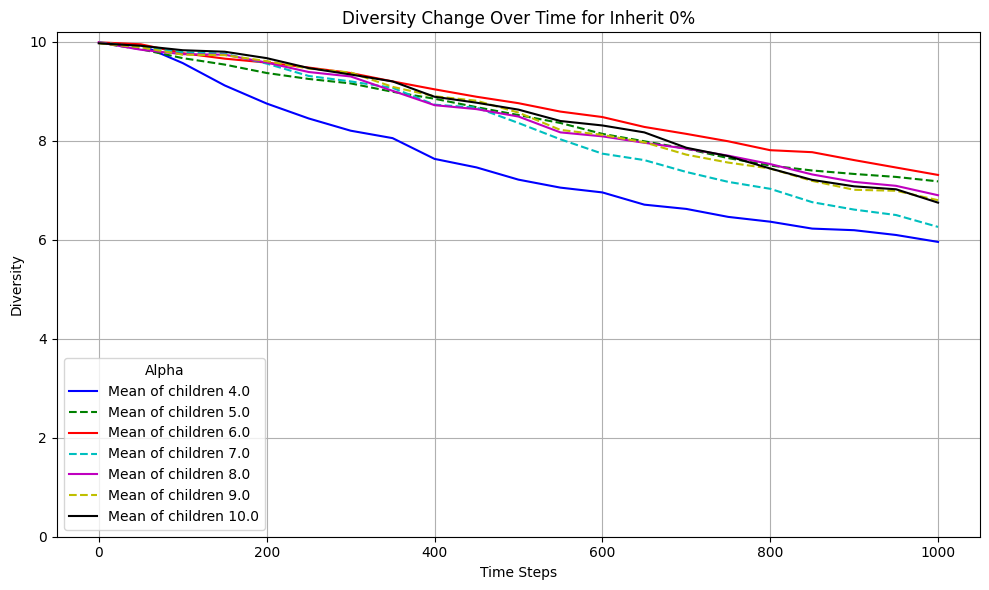

Skipping Inherit 25%, Mean of children 1.0 due to no data
Skipping Inherit 25%, Mean of children 2.0 due to no data
Skipping Inherit 25%, Mean of children 3.0 due to no data


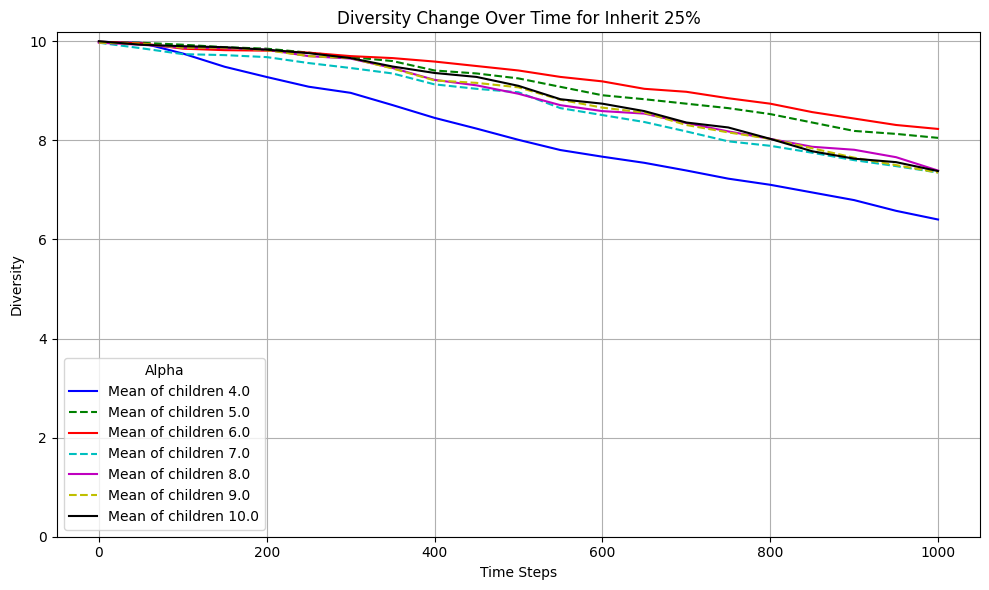

Skipping Inherit 50%, Mean of children 1.0 due to no data
Skipping Inherit 50%, Mean of children 2.0 due to no data
Skipping Inherit 50%, Mean of children 3.0 due to no data


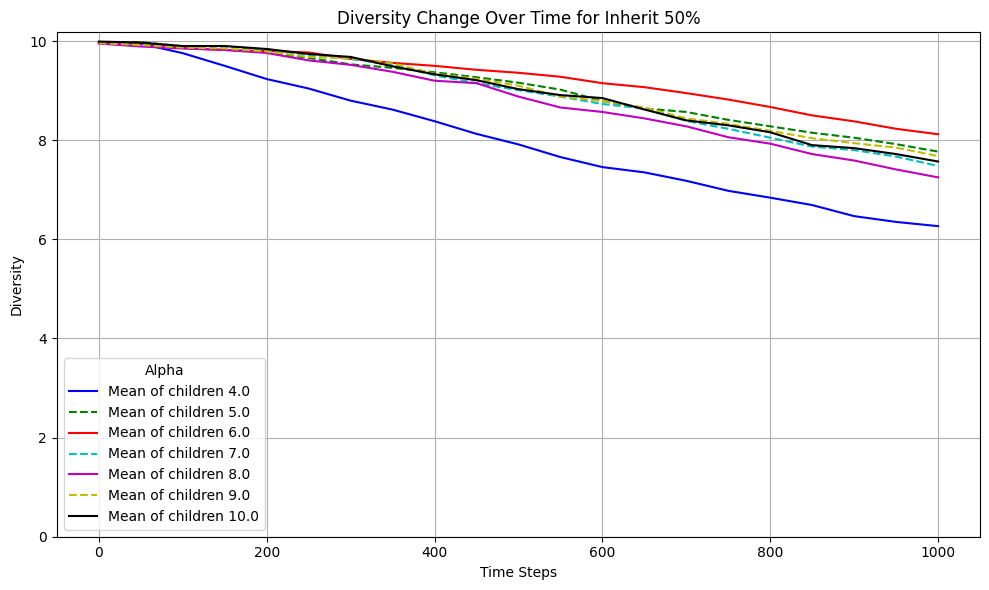

Skipping Inherit False%, Mean of children 1.0 due to no data
Skipping Inherit False%, Mean of children 2.0 due to no data
Skipping Inherit False%, Mean of children 3.0 due to no data


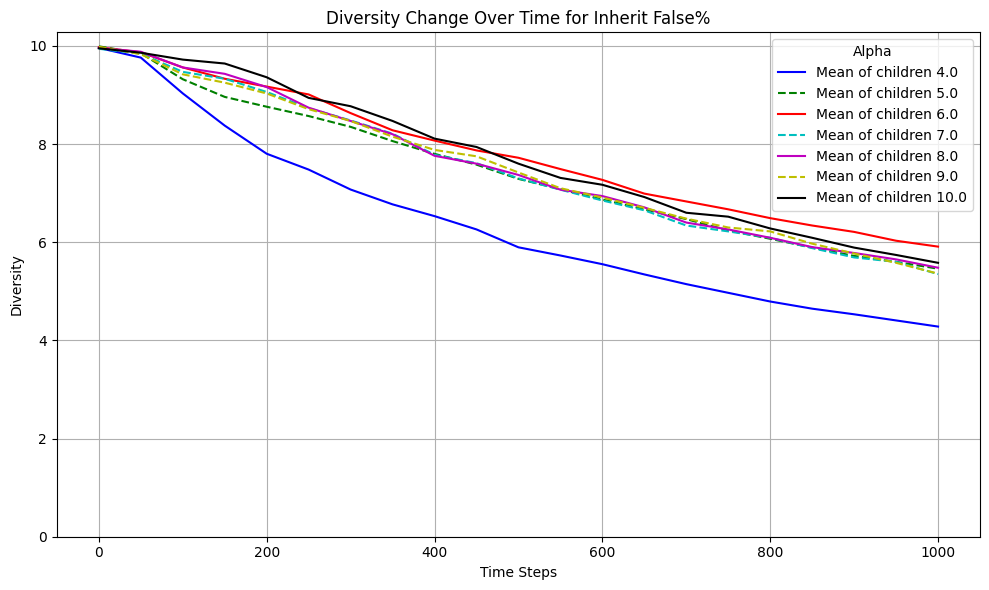

Skipping Inherit 0%, Mean of children 1.0 due to no data
Skipping Inherit 25%, Mean of children 1.0 due to no data
Skipping Inherit 50%, Mean of children 1.0 due to no data
Skipping Inherit False%, Mean of children 1.0 due to no data


C:\Users\jsolm\AppData\Local\Temp\ipykernel_4944\2807128713.py:38: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(title="Inherit %")


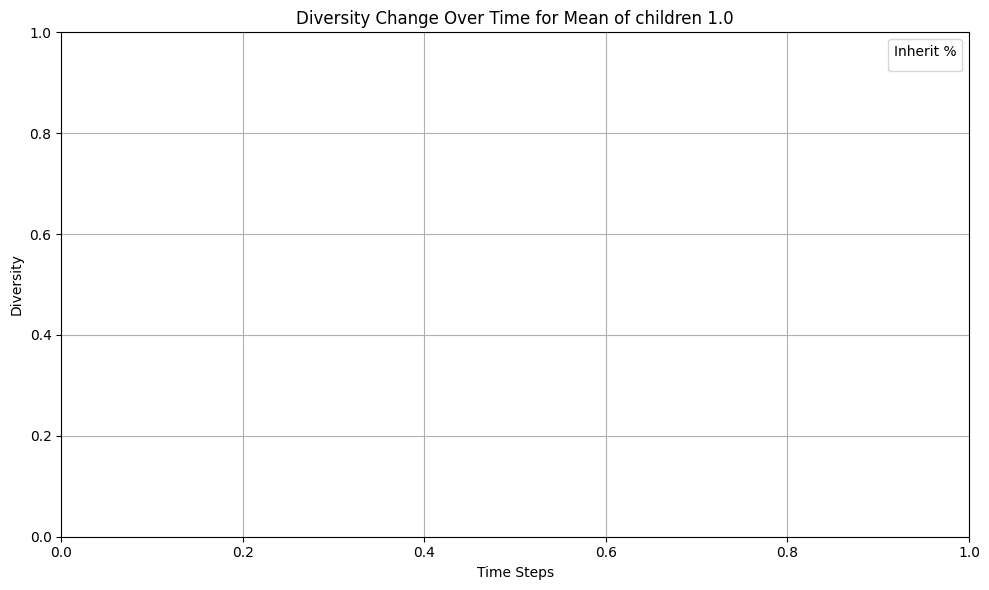

Skipping Inherit 0%, Mean of children 2.0 due to no data
Skipping Inherit 25%, Mean of children 2.0 due to no data
Skipping Inherit 50%, Mean of children 2.0 due to no data
Skipping Inherit False%, Mean of children 2.0 due to no data


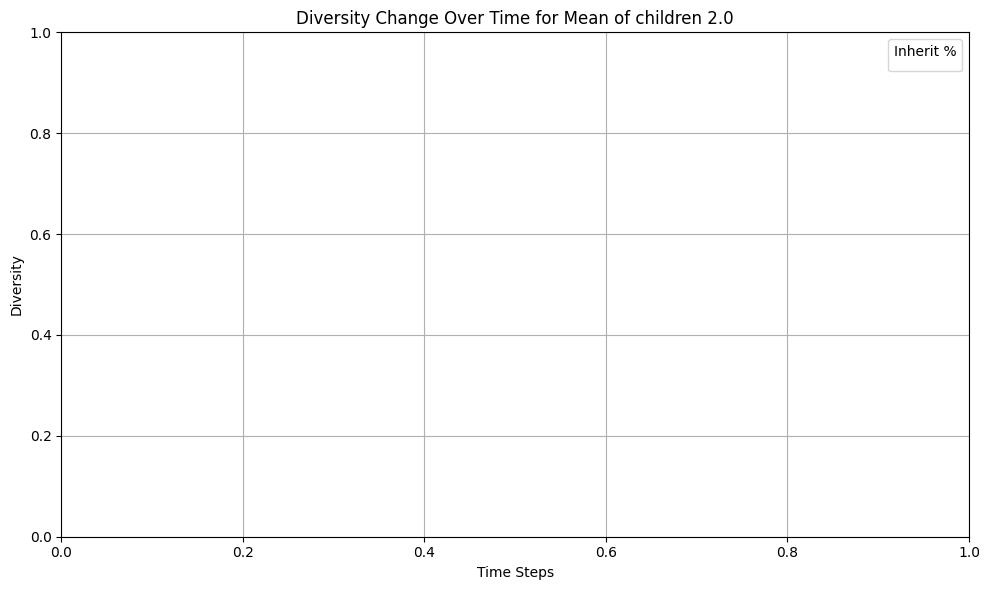

Skipping Inherit 0%, Mean of children 3.0 due to no data
Skipping Inherit 25%, Mean of children 3.0 due to no data
Skipping Inherit 50%, Mean of children 3.0 due to no data
Skipping Inherit False%, Mean of children 3.0 due to no data


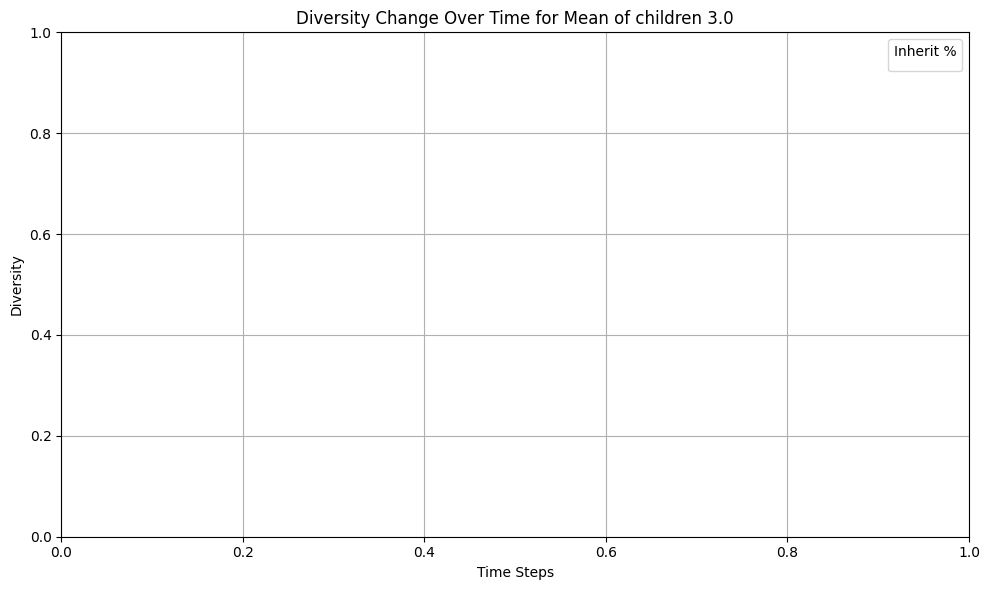

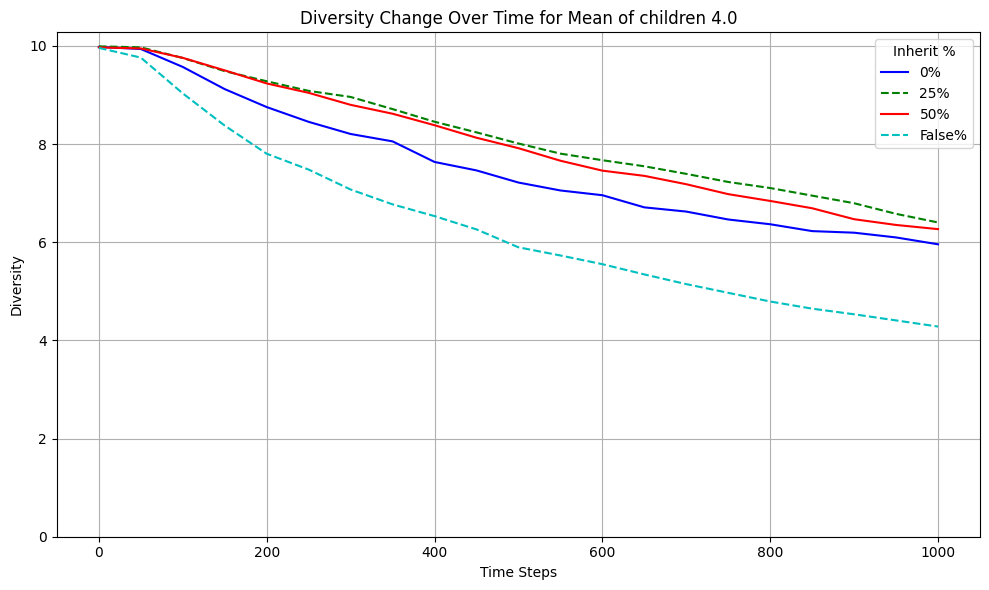

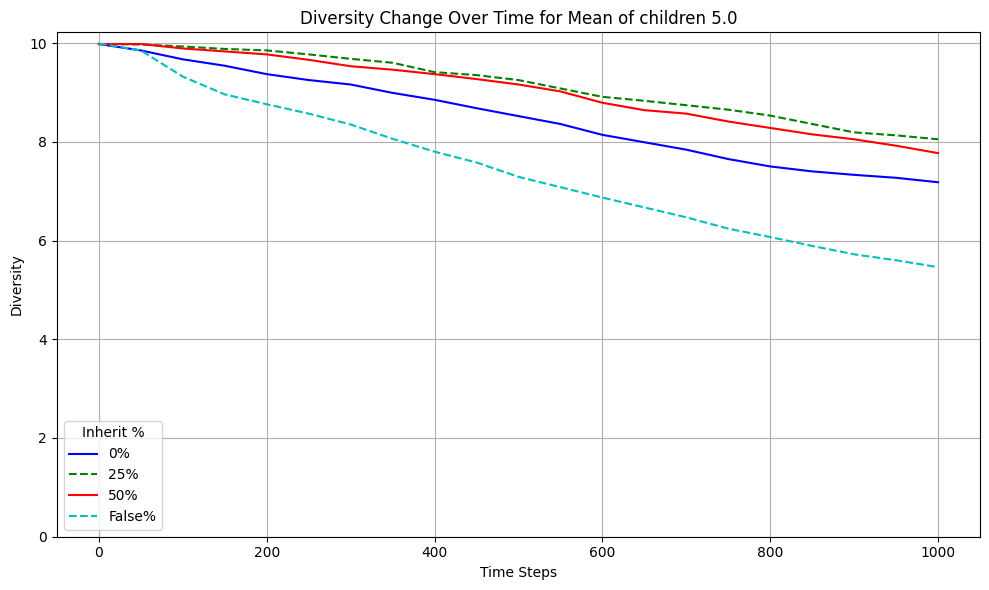

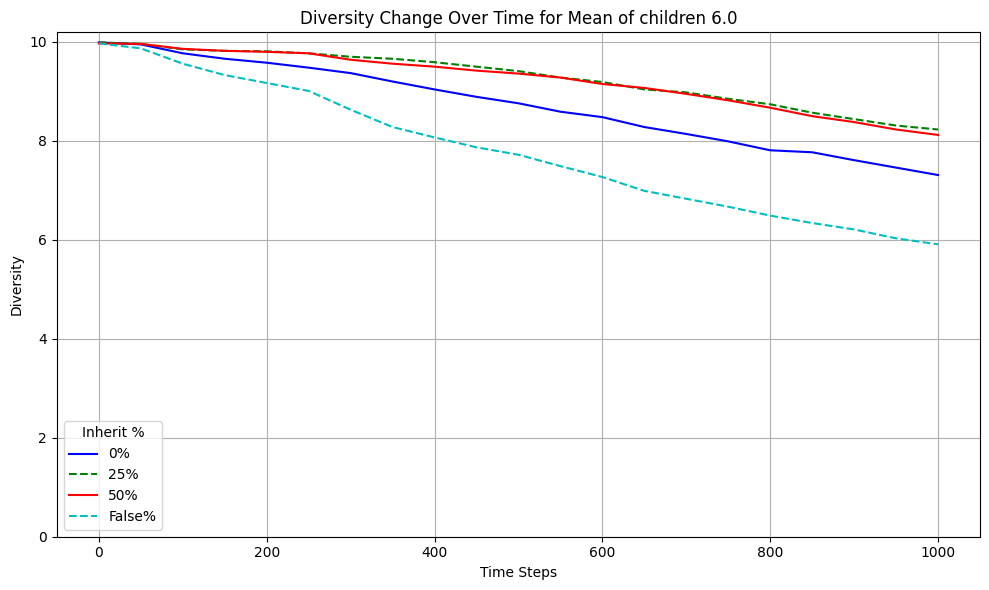

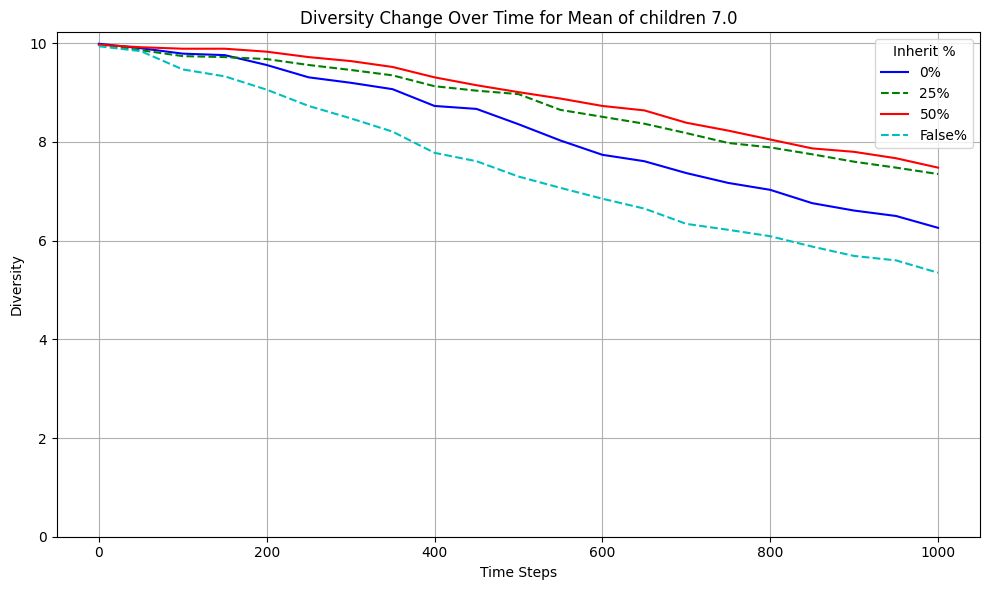

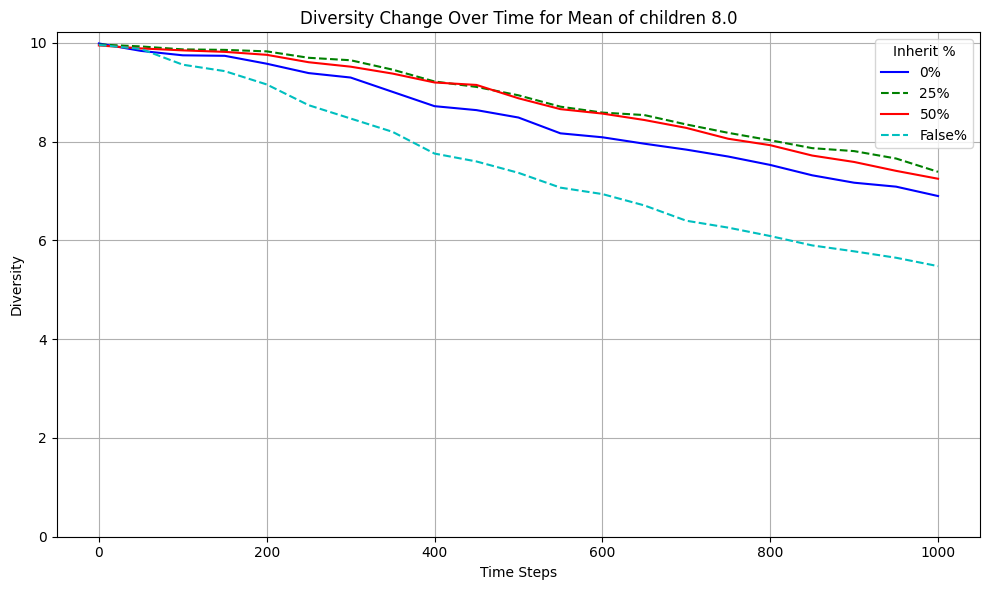

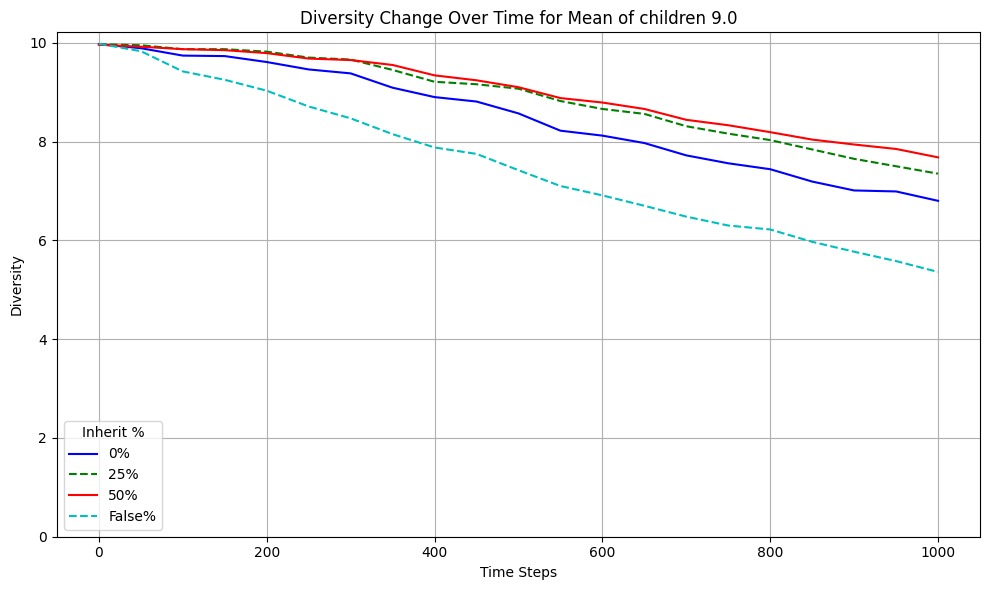

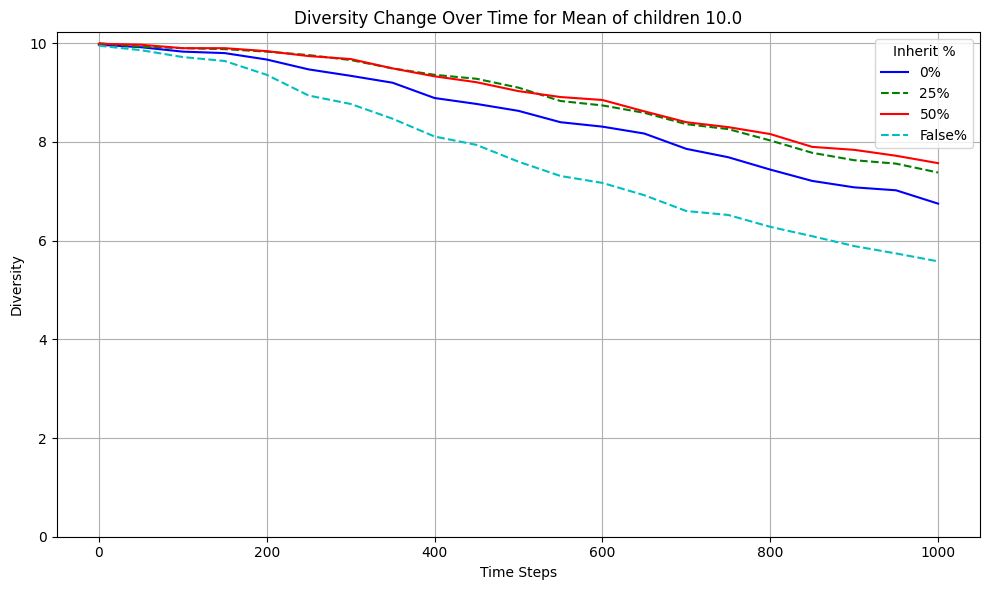

In [19]:
#heat_diversity_comm_level(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children')
#diversity_change_graphs(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children', limitant = True)
#diversity_change_by_row(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children', limitant=True)
#diversity_change_by_column(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children', limitant=True)
#plot_specific_graph(0, 3, EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children', limitant = True)

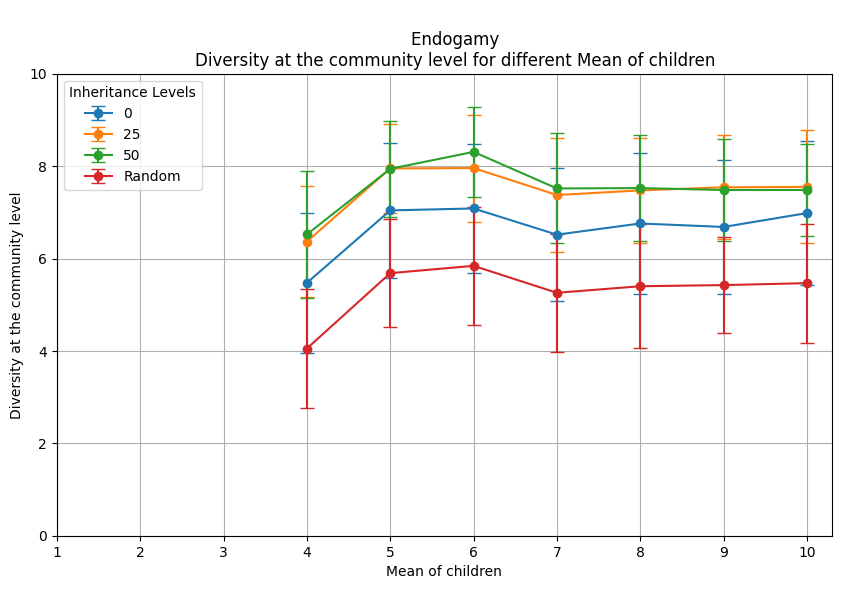

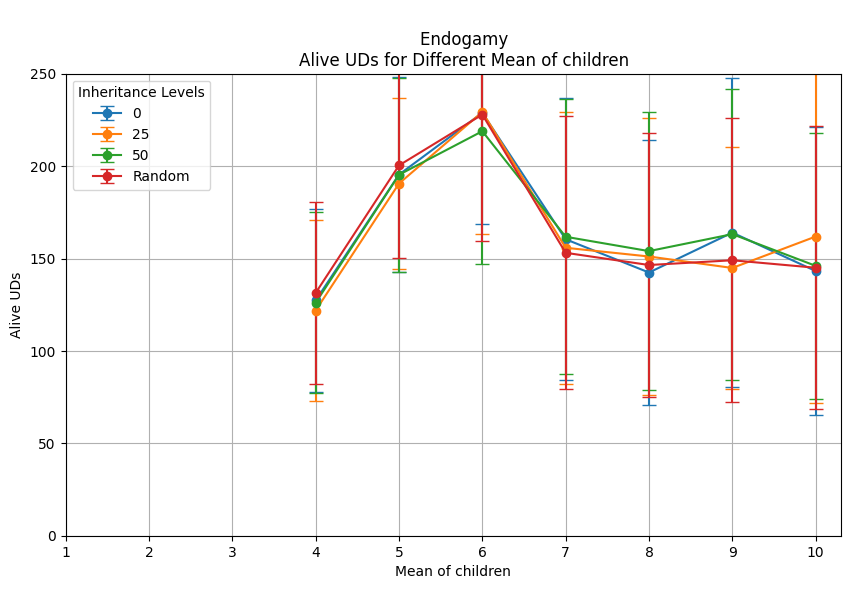

In [13]:
transversal_changes(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children')
transversal_alive(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children')

### Data and visualizations: population

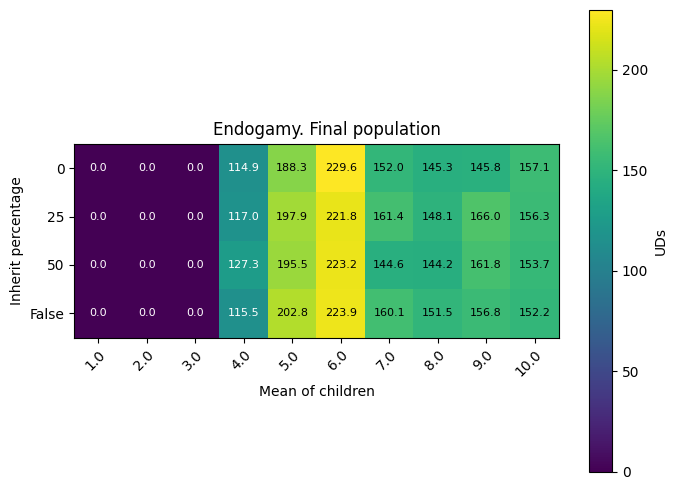

In [23]:
#heat_population(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children')
#heat_percentage_population(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children')
#heat_std(EcM_datos, inherits, Ecalphas, 'Endogamy', variable='Mean of children')

## Mean varieties

In [130]:
# This experiment has different values for Initial varieties mv
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
mv = 10
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
# inherits = [0, 'False'] #Values for inherit
Emvalphas = np.linspace(1,mv,mv)# Mean varieties from 1 to mv
# For data of behaviour
vM = np.empty((len(inherits), len(Emvalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 120


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, mvarieties  in enumerate(Emvalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} Initial UDs {m} and Mean varieties {mvarieties}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            if inherit != 'False':
                
                #### Initialization
                UD_endogamy.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_endogamy(id_ud, media))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_endogamy.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(10))]
                    for ud in UD_endogamy.uds.values():
                        for _ in range(int(mvarieties)):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Emvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_endogamy.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_endogamy.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_endogamy_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_endogamy_al_inh(id_ud, media))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_endogamy_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(10))]
                    for ud in UD_endogamy_al_inh.uds.values():
                        for _ in range(int(mvarieties)):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_endogamy_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Emvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, int(mvarieties))
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_endogamy_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_endogamy_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            vM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            vM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit}, 
  initial UDs {m} and Mean varieties {mvarieties} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Endo_Initial_Mean_varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-07 10:58:56.873370
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 1.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experim

experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 0, 
  initial UDs 40 and Mean varieties 4.0 is  501.38539147377014
        
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 5.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
expe

experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 0 con unidades 8.0
experimento 44
experimento 45
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 8.0
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experime

experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 25 con unidades 1.0
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Mean varieties 1.0 is  490.13021540641785
        
Experiments with inheritance 25 Initial UDs 40 and Mean varieties 2.0
experimento 1
experimento 2
experimento 3
experime

experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 5.0
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 5.0
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 25 con unidades 5.0
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
expe

experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 8.0
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Mean varieties 8.0 is  510.6344437599182
        
Experiments with inheritance 25 Initial UDs 40 and Mean varieties 9.0
experimento 1
experimento 2
experimento 3
experiment

experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
exp


The total time of the configuration of inherit percentage 50, 
  initial UDs 40 and Mean varieties 5.0 is  519.1143255233765
        
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 6.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 50 con unidades 6.0
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
acabó en 0 el experime

experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 50 con unidades 9.0
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia 50 con unidades 9.0
experimento 82
experimento 83
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 50 con unidades 9.0
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimen

experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120

The total time of the configuration of inherit percentage False, 
  initial UDs 40 and Mean varieties 2.0 is  491.97394037246704
        
Experiments with inheritance False Initial UDs 40 and Mean varieties 3.0
experimento 1
acabó en 0 el experimento 1 con herencia False con unidades 3.0
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 3.0
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 3.0
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experiment

experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 6.0
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 6.0
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 6.0
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia False con unidades 6.0
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
exper

experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia False con unidades 9.0
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia False con unidades 9.0
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia False con unidades 9.0
experimento 120

The total time of the configuration of inherit percentage Fals

In [15]:
# Dowload the documents
#As a reference
mv = 10 # Mean
inherits = [0,25,50, 'False']
Emvalphas = np.linspace(1,mv,mv) # Mean of children from 1 to n
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Endo_Initial_Mean_varieties.npy')

## General Data
EmvM_datos = np.load(heat_std, allow_pickle=True)

### Diversity dynamics

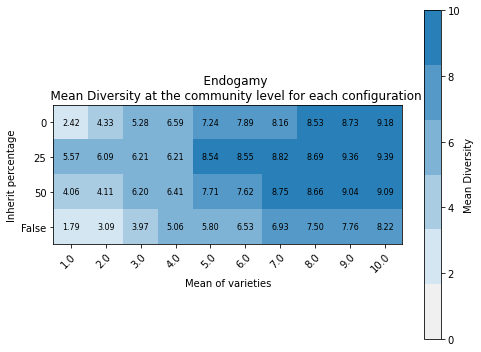

In [24]:
#heat_diversity_comm_level(EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties')
#diversity_change_graphs(EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties', limitant = True)
#diversity_change_by_row(EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties', limitant=True)
#diversity_change_by_column(EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties', limitant=True)
#plot_specific_graph(0, 1, EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties', limitant = True)

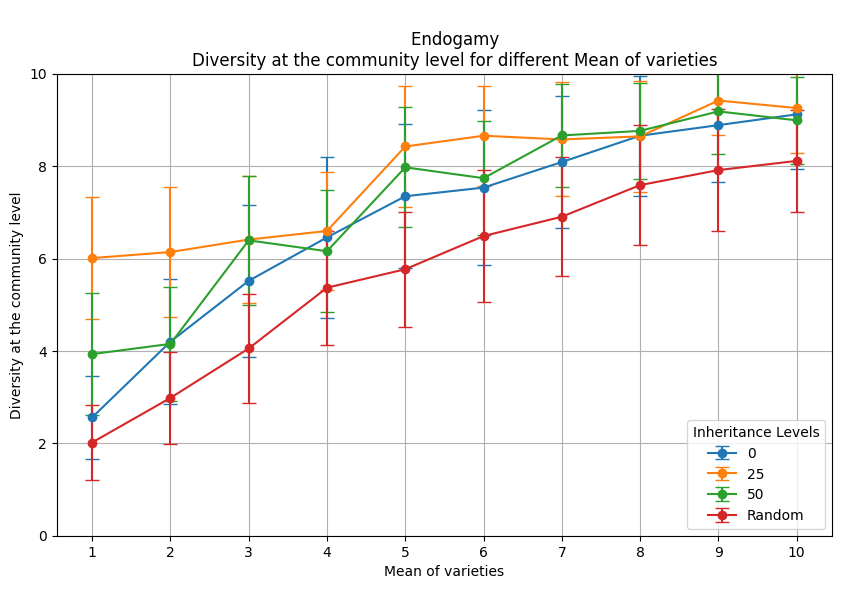

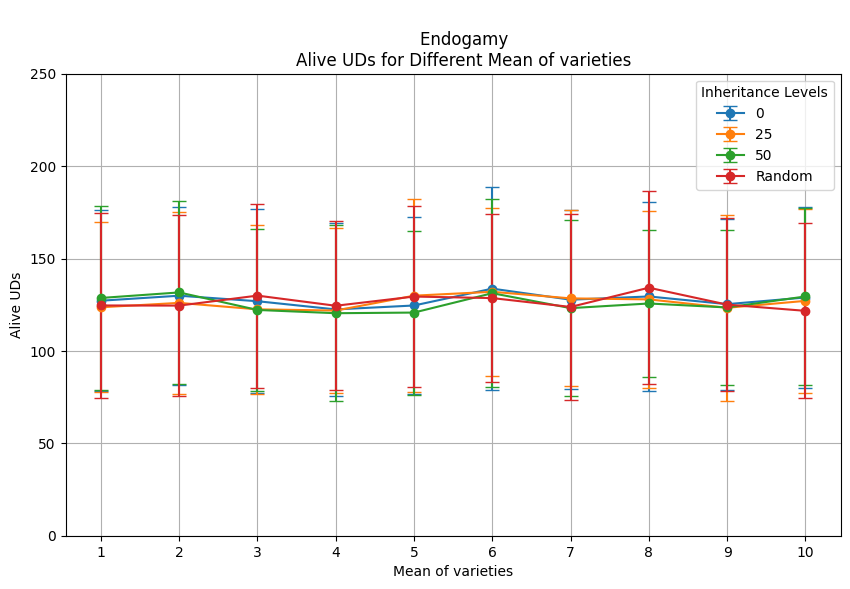

In [16]:
transversal_changes(EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties')
transversal_alive(EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties')

### Population dynamics

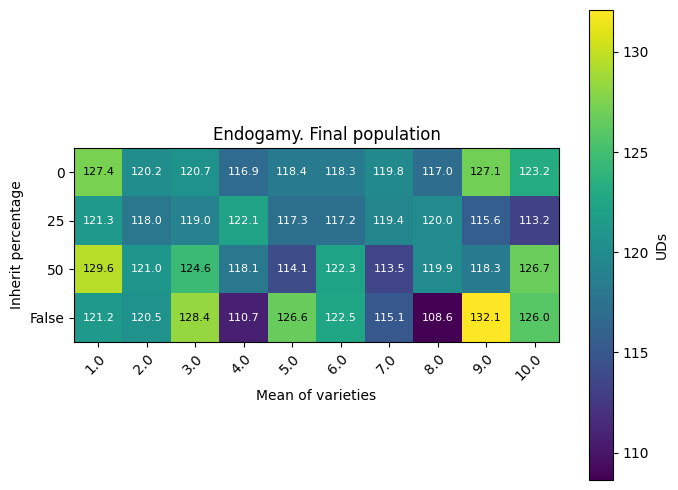

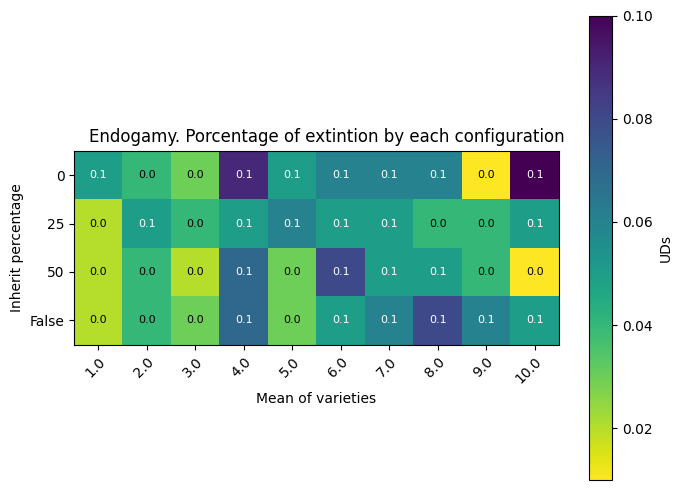

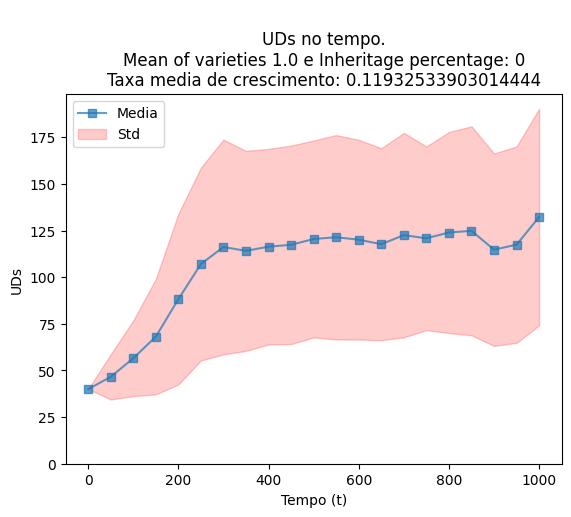

In [17]:
heat_population(EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties')

heat_percentage_population(EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties')

plot_specific_alivegraph(0, 0, EmvM_datos, inherits, Emvalphas, 'Endogamy', variable='Mean of varieties')

# Dual Organization

## Initial UDs

Here we experimento with Initial UDs. We try from 10 to 100

In [134]:
# This experiment has different values for Initial UDs
prob_morte = 0.06 #beta
media = 4 # Mean
m = 100 # Initial UDs
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dmalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
# For data of behaviour
mM = np.empty((len(inherits), len(Dmalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 140


print(mM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, iniciais  in enumerate(Dmalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} and Initial UDs {iniciais}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            ## Clans
            clans = (list(range(1, 2 + 1)) * (int(iniciais) // 2)) # Just 2 clans
            random.shuffle(clans)
            if inherit != 'False':          
                #### Initialization
                UD_dual_organization.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(iniciais) + 1):
                    instancias_ud.append(UD_dual_organization(id_ud, media,clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_dual_organization.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_dual_organization.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(iniciais)]
                vivas_tasa_crecimiento = [int(iniciais)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dmalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_dual_organization.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_dual_organization_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(iniciais) + 1):
                    instancias_ud.append(UD_dual_organization_al_inh(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_dual_organization_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_dual_organization_al_inh.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(iniciais)]
                vivas_tasa_crecimiento = [int(iniciais)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dmalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_dual_organization_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            mM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            mM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit} and initial UDs {iniciais} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Dual_Initial_UDs.npy')
np.save(heat_std, mM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-09 08:52:37.297849
Experiments with inheritance 0 and Initial UDs 10.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 10.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 10.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 10.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 10.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 10.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 10.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 10.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 10.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 10.0
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 10.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 10.0
experimento 13
acabó en 0 el experimento 13 con herencia

acabó en 0 el experimento 122 con herencia 0 con unidades 10.0
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 10.0
experimento 124
acabó en 0 el experimento 124 con herencia 0 con unidades 10.0
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 10.0
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 10.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 10.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con unidades 10.0
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 10.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 10.0
experimento 131
acabó en 0 el experimento 131 con herencia 0 con unidades 10.0
experimento 132
acabó en 0 el experimento 132 con herencia 0 con unidades 10.0
experimento 133
acabó en 0 el experimento 133 con herencia 0 con unidades 10.0
experimento 134
acabó en 0 el experimento 134 con herencia 0 con uni

acabó en 0 el experimento 121 con herencia 0 con unidades 20.0
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 20.0
experimento 124
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 20.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 20.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 20.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 20.0
experimento 131
experimento 132
acabó en 0 el experimento 132 con herencia 0 con unidades 20.0
experimento 133
acabó en 0 el experimento 133 con herencia 0 con unidades 20.0
experimento 134
acabó en 0 el experimento 134 con herencia 0 con unidades 20.0
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 0 con unidades 20.0
experimento 137
acabó en 0 el experimento 137 con herencia 0 con unidades 20.0
experimento 138
experimento 139
experimento 140
aca

experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 40.0
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 0 con unidades 40.0
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 0 con unidades 40.0
experimento 97
experimento 98
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 0 con unidades 40.0
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 40.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 40.0
experimento 112
experimento 

experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 70.0
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia 0 con unidades 70.0
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experi

experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 0 con unidades 100.0
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 0 con unidades 100.0
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 0 con unidades 100.0
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experiment

acabó en 0 el experimento 87 con herencia 25 con unidades 10.0
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 10.0
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 10.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 10.0
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 10.0
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 10.0
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 10.0
experimento 94
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 25 con unidades 10.0
experimento 97
acabó en 0 el experimento 97 con herencia 25 con unidades 10.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con unidades 10.0
experimento 99
acabó en 0 el experimento 99 con herencia 25 con unidades 10.0
experimento 100
acabó en 0 el experimento 100 con herencia 25 con unidades 10.0
experimento 101
acabó en 0 el experimento 101 c

experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 20.0
experimento 81
acabó en 0 el experimento 81 con herencia 25 con unidades 20.0
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 20.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 20.0
experimento 84
acabó en 0 el experimento 84 con herencia 25 con unidades 20.0
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 20.0
experimento 86
acabó en 0 el experimento 86 con herencia 25 con unidades 20.0
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 20.0
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 20.0
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 20.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con unidades 20.0
experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 20.0
experimento 92
experimento 93
acabó en 0 el experimento 93 con h

experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 25 con unidades 30.0
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 25 con unidades 30.0
experimento 120
acabó en 0 el experimento 120 con herencia 25 con unidades 30.0
experimento 121
acabó en 0 el experimento 121 con herencia 25 con unidades 30.0
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 25 con unidades 30.0
experimento 124
acabó en 0 el experimento 124 con herencia 25 con unidades 30.0
experimento 125
acabó en 0 el experimento 125 con herencia 25 con unidades 30.0
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 25 con unidades 30.0
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 25 con unidades 30.0
experimento 139
experime

experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 60.0
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 60.0
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experi

experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 90.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
exper

experimento 58
acabó en 0 el experimento 58 con herencia 50 con unidades 10.0
experimento 59
acabó en 0 el experimento 59 con herencia 50 con unidades 10.0
experimento 60
acabó en 0 el experimento 60 con herencia 50 con unidades 10.0
experimento 61
acabó en 0 el experimento 61 con herencia 50 con unidades 10.0
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 10.0
experimento 63
acabó en 0 el experimento 63 con herencia 50 con unidades 10.0
experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 10.0
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 10.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 10.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 10.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 10.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 10.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con 

acabó en 0 el experimento 34 con herencia 50 con unidades 20.0
experimento 35
acabó en 0 el experimento 35 con herencia 50 con unidades 20.0
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 50 con unidades 20.0
experimento 38
acabó en 0 el experimento 38 con herencia 50 con unidades 20.0
experimento 39
acabó en 0 el experimento 39 con herencia 50 con unidades 20.0
experimento 40
acabó en 0 el experimento 40 con herencia 50 con unidades 20.0
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 50 con unidades 20.0
experimento 43
acabó en 0 el experimento 43 con herencia 50 con unidades 20.0
experimento 44
acabó en 0 el experimento 44 con herencia 50 con unidades 20.0
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 50 con unidades 20.0
experimento 47
acabó en 0 el experimento 47 con herencia 50 con unidades 20.0
experimento 48
acabó en 0 el experimento 48 con herencia 50 con unidades 20.0
experimento 49
experimento 50
acab

experimento 61
acabó en 0 el experimento 61 con herencia 50 con unidades 30.0
experimento 62
acabó en 0 el experimento 62 con herencia 50 con unidades 30.0
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 30.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 30.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 30.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 30.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 30.0
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 30.0
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 50 con unidades 30.0
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 50 con unidades 30.0
experimento 78
experimento 79
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia 50 con unidad

experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 50 con unidades 50.0
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 50.0
experimento 69
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 50.0
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 50 con unidades 50.0
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 9

experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 11

acabó en 0 el experimento 20 con herencia False con unidades 10.0
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 10.0
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 10.0
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 10.0
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 10.0
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 10.0
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 10.0
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 10.0
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 10.0
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 10.0
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 10.0
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 10.0
experimento 32
experimento 33
acabó en 0 el

acabó en 0 el experimento 131 con herencia False con unidades 10.0
experimento 132
acabó en 0 el experimento 132 con herencia False con unidades 10.0
experimento 133
acabó en 0 el experimento 133 con herencia False con unidades 10.0
experimento 134
acabó en 0 el experimento 134 con herencia False con unidades 10.0
experimento 135
acabó en 0 el experimento 135 con herencia False con unidades 10.0
experimento 136
acabó en 0 el experimento 136 con herencia False con unidades 10.0
experimento 137
acabó en 0 el experimento 137 con herencia False con unidades 10.0
experimento 138
acabó en 0 el experimento 138 con herencia False con unidades 10.0
experimento 139
acabó en 0 el experimento 139 con herencia False con unidades 10.0
experimento 140
acabó en 0 el experimento 140 con herencia False con unidades 10.0

The total time of the configuration of inherit percentage False and initial UDs 10.0 is  39.99419951438904
        
Experiments with inheritance False and Initial UDs 20.0
experimento 1

acabó en 0 el experimento 118 con herencia False con unidades 20.0
experimento 119
acabó en 0 el experimento 119 con herencia False con unidades 20.0
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia False con unidades 20.0
experimento 123
acabó en 0 el experimento 123 con herencia False con unidades 20.0
experimento 124
acabó en 0 el experimento 124 con herencia False con unidades 20.0
experimento 125
acabó en 0 el experimento 125 con herencia False con unidades 20.0
experimento 126
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia False con unidades 20.0
experimento 129
acabó en 0 el experimento 129 con herencia False con unidades 20.0
experimento 130
acabó en 0 el experimento 130 con herencia False con unidades 20.0
experimento 131
acabó en 0 el experimento 131 con herencia False con unidades 20.0
experimento 132
acabó en 0 el experimento 132 con herencia False con unidades 20.0
experimento 133
experimento 134
acabó e

experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 40.0
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 40.0
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 40.0
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia False con unidades 40.0
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia False con unidades 40.0
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia False con unidades 40.0
expe

experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
acabó en 0 el experimento 135 con herencia False con unidades 60.0
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140

The total time of the configuration of inherit percentage False and initial UDs 60.0 is  698.6289517879486
        
Experiments with inheritance False and Initial UDs 70.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia False con unidades 100.0
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 

In [18]:
# Dowload the documents
#As a reference
m = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dmalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Dual_Initial_UDs.npy')

## General Data
DmM_datos = np.load(heat_std, allow_pickle=True)

## Data and visualizations: diversity

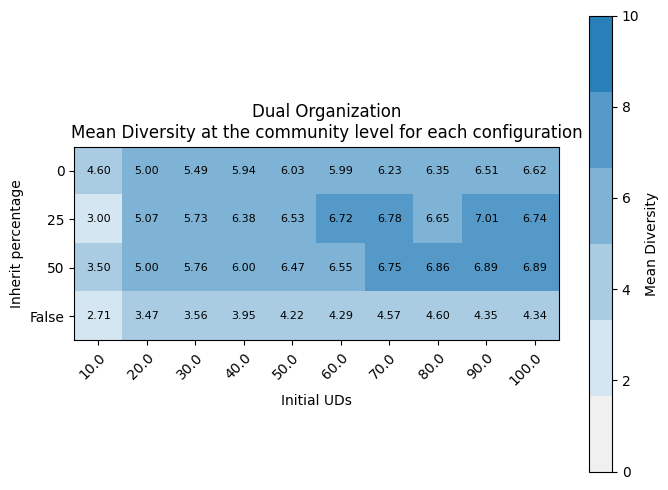

In [72]:
heat_diversity_comm_level(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable='Initial UDs')

#diversity_change_graphs(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable='Initial UDs', limitant=True)

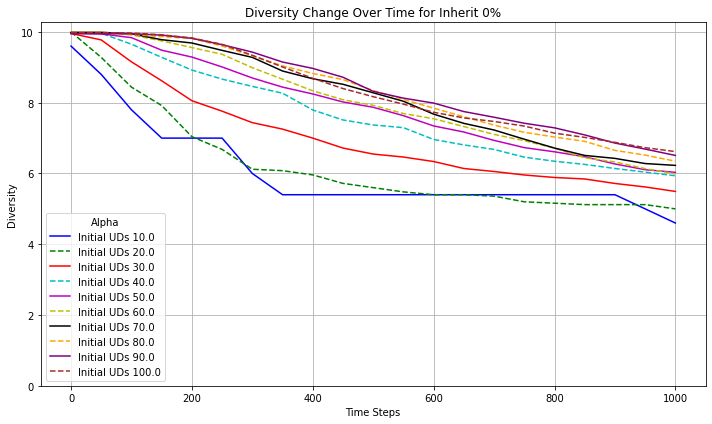

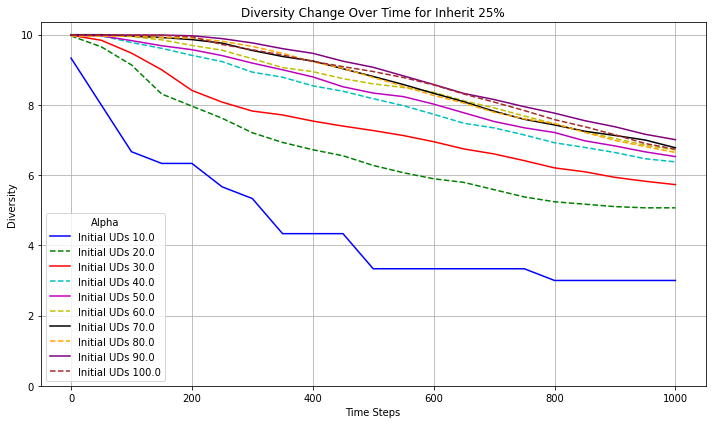

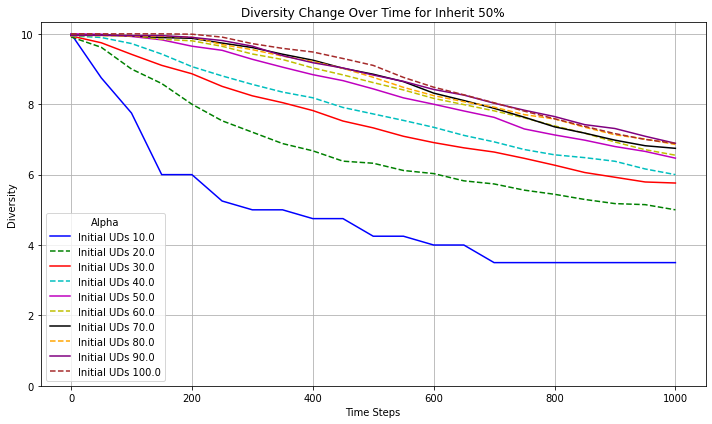

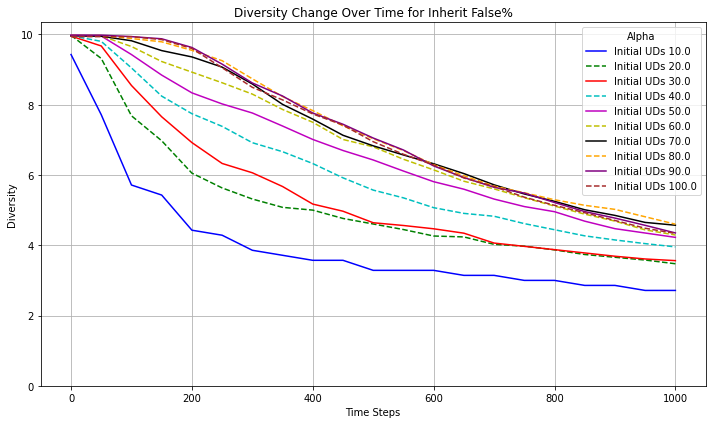

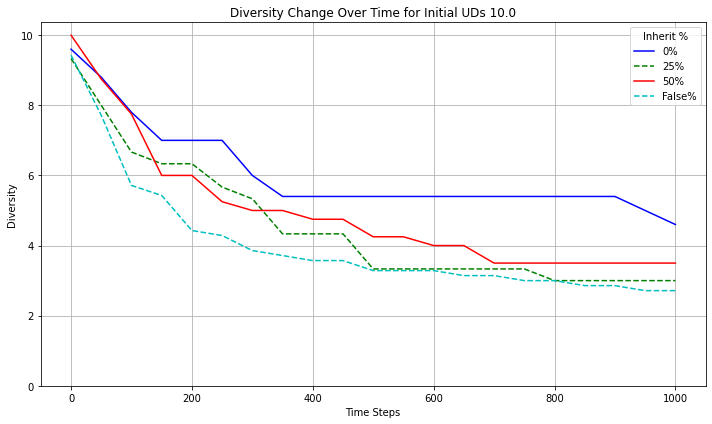

...

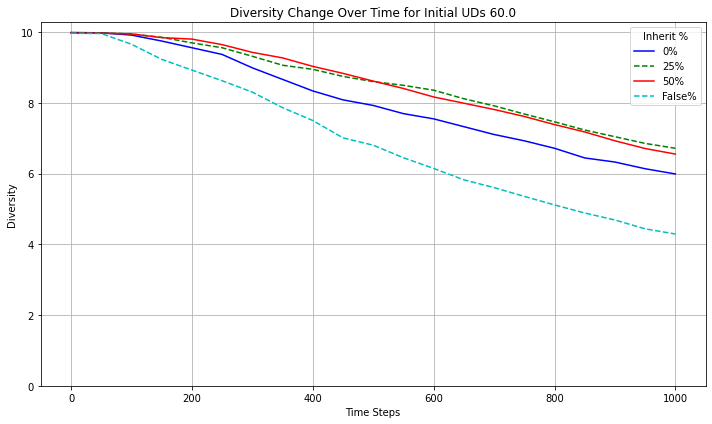

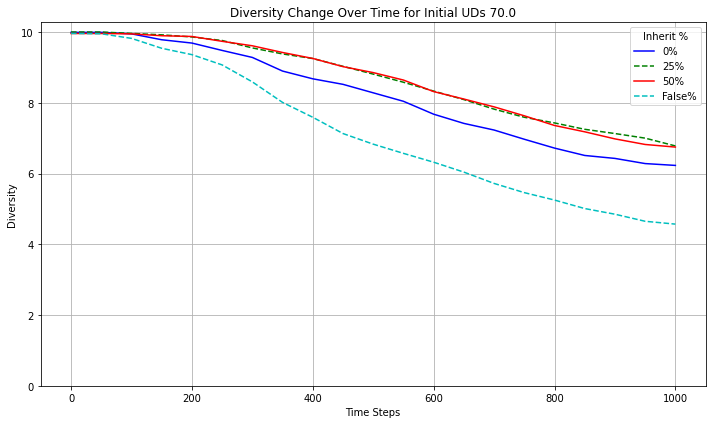

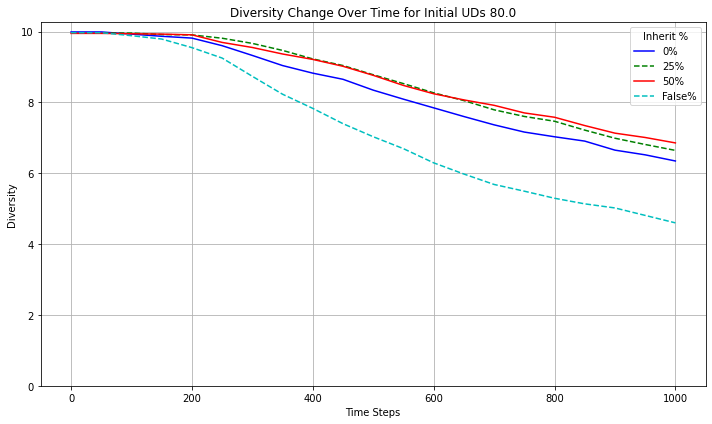

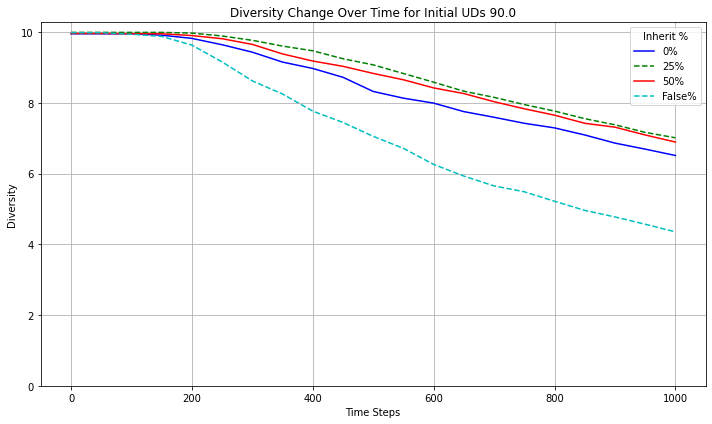

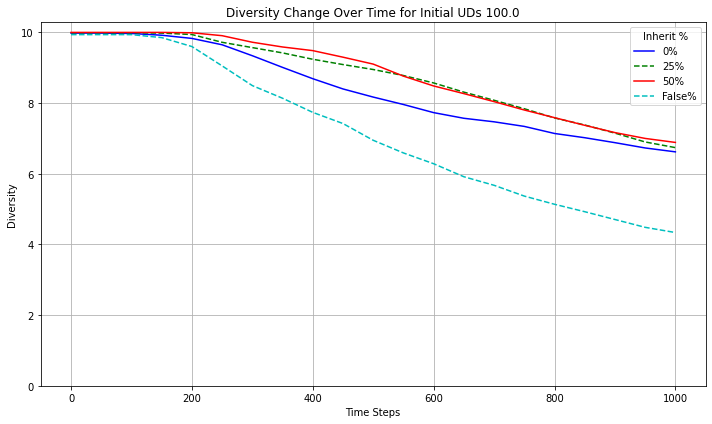

In [34]:
diversity_change_by_row(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable='Initial UDs', limitant=True)

diversity_change_by_column(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable='Initial UDs', limitant=True)

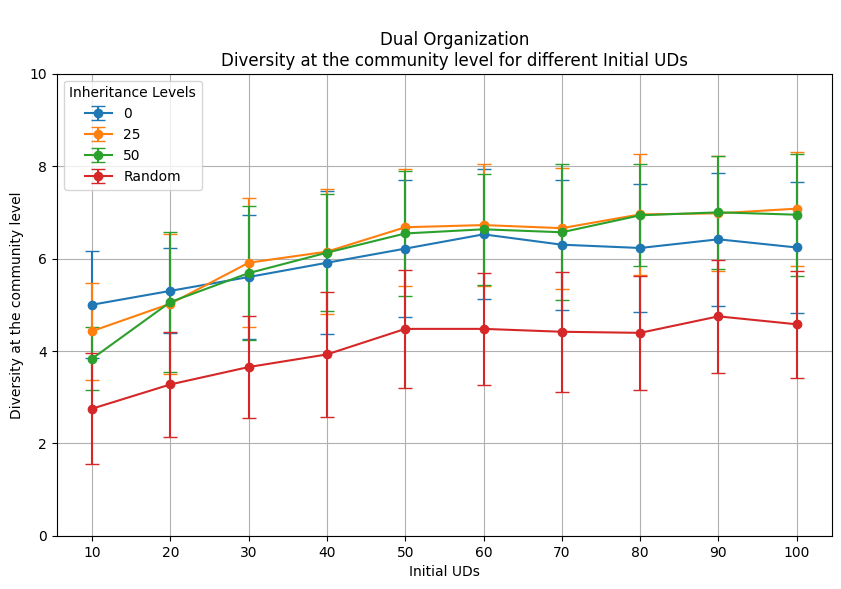

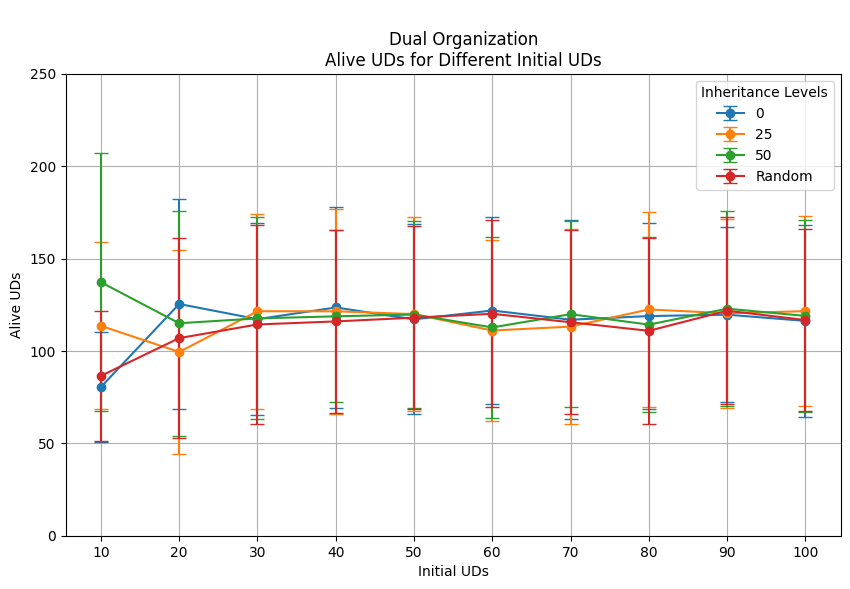

In [19]:
transversal_changes(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable='Initial UDs')
transversal_alive(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable='Initial UDs')

## Data and visualizations: pop

TypeError: Image data of dtype object cannot be converted to float

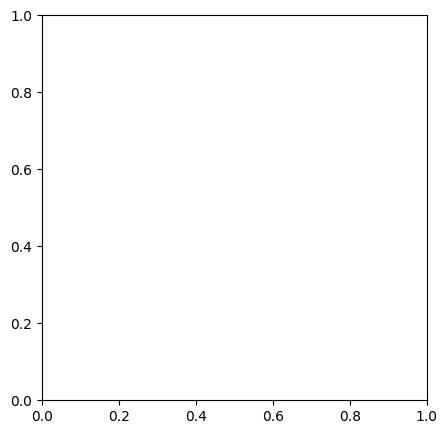

In [83]:
heat_population(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable='Initial UDs')

heat_percentage_population(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable='Initial UDs')

heat_std(DmM_datos, inherits, Dmalphas, 'Dual Organization', variable = 'Initial UDs')

## Initial Varieties

Here we try with different values for the initial varieties in the system.
We go from 10 to 100.

In [137]:
# This experiment has different values for Initial varieties VVVV
prob_morte = 0.06 #beta
media = 4 # Mean
iniciais = 40
v = 100 # Initial varieties
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dvalphas = np.linspace(10,v,int(v/10)) # Initial Varieties: from 10 to v
# For data of behaviour
vM = np.empty((len(inherits), len(Dvalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 140


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, varieties  in enumerate(Dvalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} Initial UDs {iniciais} and Initial varieties {varieties}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            ## Clans
            clans = (list(range(1, 2 + 1)) * (int(iniciais) // 2)) # Just 2 clans
            random.shuffle(clans)
            if inherit != 'False':    
                #### Initialization
                UD_dual_organization.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(iniciais) + 1):
                    instancias_ud.append(UD_dual_organization(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_dual_organization.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(varieties))]
                    for ud in UD_dual_organization.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(iniciais)]
                vivas_tasa_crecimiento = [int(iniciais)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_dual_organization.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_dual_organization_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(iniciais) + 1):
                    instancias_ud.append(UD_dual_organization_al_inh(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_dual_organization_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(varieties))]
                    for ud in UD_dual_organization_al_inh.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(iniciais)]
                vivas_tasa_crecimiento = [int(iniciais)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_dual_organization_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            vM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            vM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit}, 
  initial UDs {iniciais} and Initial varieties {varieties} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Dual_Initial_Varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-09 17:36:25.506008
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 10.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 10.0
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 10.0
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 10.0
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 0 con unidades 10.0
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 0 con unidades 10.0
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 10.0
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unid

experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 30.0
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 0 con unidades 30.0
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unidades 30.0
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia 0 con unidades 30.0
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 30.0
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 0 con unidades 30.0
experimento 57
acabó en 0 el

experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 50.0
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 0 con unidades 50.0
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 0 con unidades 50.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 50.0
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 50.0
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 0 con unidades 50.0
experimento 8

experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 70.0
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 0 con unidades 70.0
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 0 con unidades 70.0
experimento 99
acabó en 0 el experimento 99 con herencia 0 con unidades 70.0
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 70.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con unidades 70.0
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 70.0
experimento 110
experimento 111
experimento 112
experiment

experimento 103
experimento 104
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 0 con unidades 90.0
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 90.0
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 0 con unidades 90.0
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia 0 con unidades 90.0
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 90.0
experimento 124
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 90.0
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
acabó en 0 el experimento 131 con herencia 0 con unidades 90.0
experimento 132
acabó en 0 el experimento 132 con herencia 0 con unidades 90.0
experimento 133


experimento 138
experimento 139
experimento 140
acabó en 0 el experimento 140 con herencia 25 con unidades 10.0

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Initial varieties 10.0 is  546.7016360759735
        
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 20.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con unidades 20.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 20.0
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 20.0
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 20.0
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29

experimento 137
experimento 138
experimento 139
experimento 140

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Initial varieties 30.0 is  515.4418849945068
        
Experiments with inheritance 25 Initial UDs 40 and Initial varieties 40.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 40.0
experimento 3
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 25 con unidades 40.0
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 40.0
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 40.0
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 25 con unidades 40.0

experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 60.0
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 25 con unidades 60.0
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 60.0
experimento 23
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 25 con unidades 60.0
experimento 27
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 25 con unidades 60.0
experimento 31
acabó en 0 el experimento 31 con herencia 25 con unidades 60.0
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 25 con unidades 60.0
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 60.0
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 25 c

experimento 51
acabó en 0 el experimento 51 con herencia 25 con unidades 80.0
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 80.0
experimento 54
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 25 con unidades 80.0
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia 25 con unidades 80.0
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 80.0
experimento 72
acabó en 0 el experimento 72 con herencia 25 con unidades 80.0
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 80.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 80.0
e

experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 100.0
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 25 con unidades 100.0
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 100.0
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 25 con unidades 100.0
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 25 con unidades 100.0
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia 25 con unidades 100.0
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 25 con unidades 100.0
experimento 111
experimento 112
acabó en 0 el experimento 

experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 50 con unidades 20.0
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 20.0
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 20.0
experimento 108
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 50 con unidades 20.0
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 50 con unidades 20.0
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades

experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
acabó en 0 el experimento 132 con herencia 50 con unidades 40.0
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 40.0
experimento 140
acabó en 0 el experimento 140 con herencia 50 con unidades 40.0

The total time of the configuration of inherit percentage 50, 
  initial UDs 40 and Initial varieties 40.0 is  545.979674577713
        
Experiments with inheritance 50 Initial UDs 40 and Initial varieties 50.0
experimento 1
acabó en 0 el experimento 1 con herencia 50 con unidades 50.0
experimento 2
experiment

experimento 128
acabó en 0 el experimento 128 con herencia 50 con unidades 60.0
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 50 con unidades 60.0
experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 60.0
experimento 140

The total time of the configuration of inherit percentage 50, 
  initial UDs 40 and Initial varieties 60.0 is  504.4801459312439
        
Experiments with inheritance 50 Initial UDs 40 and Initial varieties 70.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 70.0
experimento 11
acabó en 0 el experimento 11 con herencia 50 con unidades 70.0
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
acabó en 0 el experimento 16 c

experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 90.0
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 50 con unidades 90.0
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia 50 con unidades 90.0
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 50 con unidades 90.0
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 50 con unidades 90.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento

experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 10.0
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 10.0
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 10.0
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia False con unidades 10.0
experimento 54
experimento 55
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia False con unidades 10.0
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
acabó en 0 el experimento

experimento 57
acabó en 0 el experimento 57 con herencia False con unidades 30.0
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia False con unidades 30.0
experimento 68
acabó en 0 el experimento 68 con herencia False con unidades 30.0
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia False con unidades 30.0
experimento 74
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia False con unidades 30.0
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia False con unidades 30.0
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
expe

experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 50.0
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia False con unidades 50.0
experimento 61
experimento 62
experimento 63
acabó en 0 el experimento 63 con herencia False con unidades 50.0
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia False con unidades 50.0
experimento 97
experimento 98
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia Fa

experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 70.0
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia False con unidades 70.0
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
acabó en 0 el experimento 63 con herencia False con unidades 70.0
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia False con unidades 70.0
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia False con unidades 70.0
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia False con unidades 70.0
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
acab

experimento 79
experimento 80
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia False con unidades 90.0
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia False con unidades 90.0
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia False con unidades 90.0
experimento 95
acabó en 0 el experimento 95 con herencia False con unidades 90.0
experimento 96
acabó en 0 el experimento 96 con herencia False con unidades 90.0
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia False con unidades 90.0
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 90.0
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia False con unidades 90.0
experimento 108
experimento

In [20]:
# Dowload the documents
#As a reference
v = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dvalphas = np.linspace(10,v,int(v/10)) # Initial UDs: from 10 to m
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Dual_Initial_Varieties.npy')
## heatmap and mean
DvM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

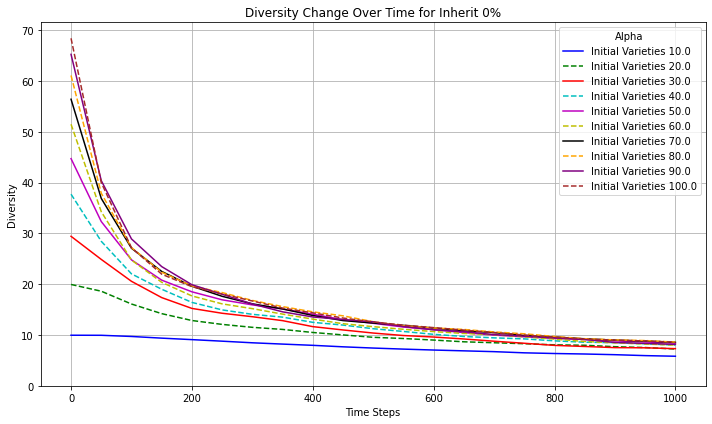

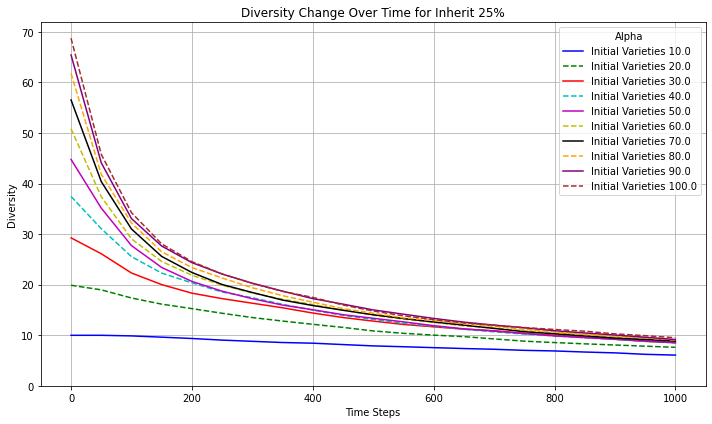

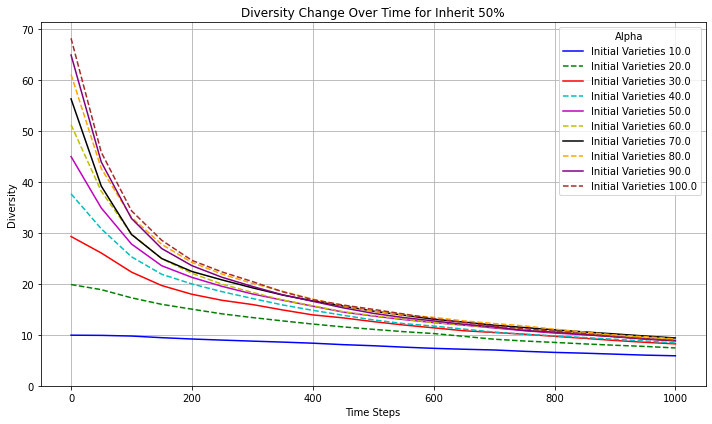

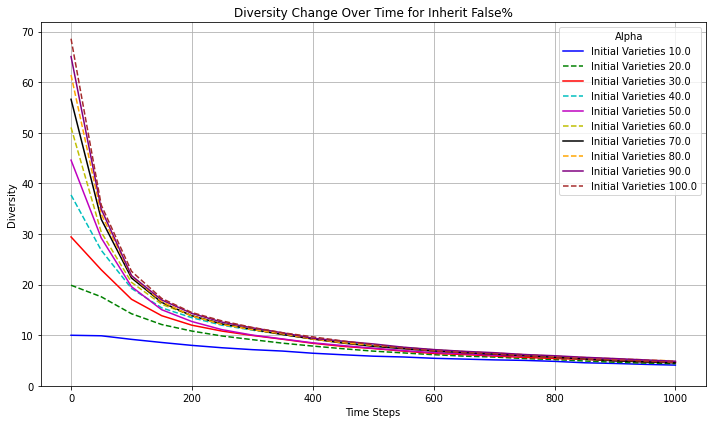

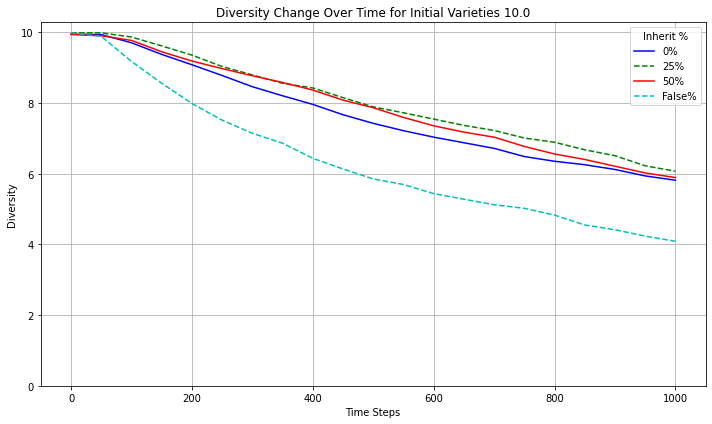

...

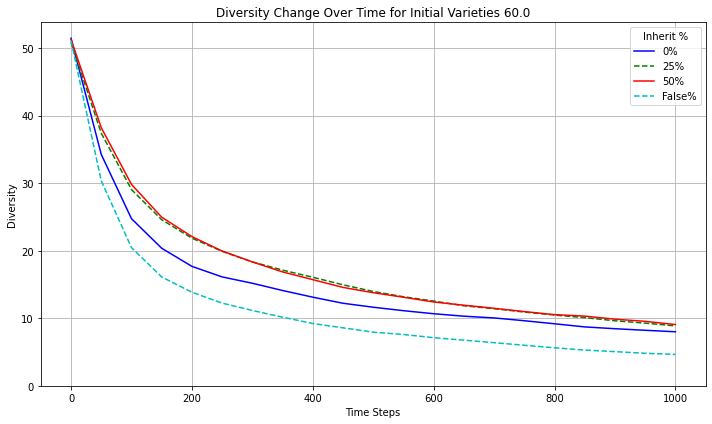

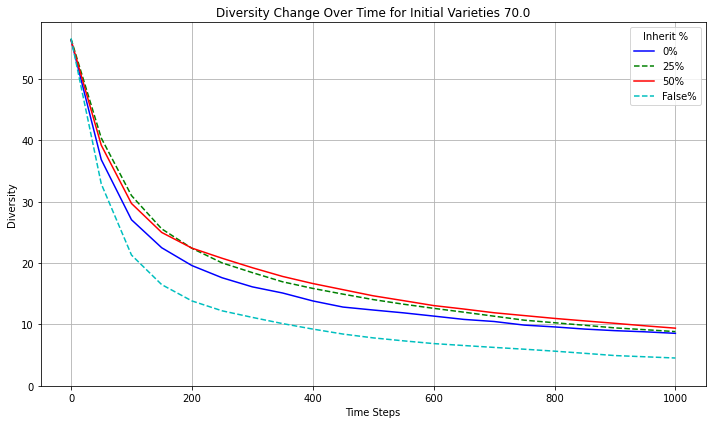

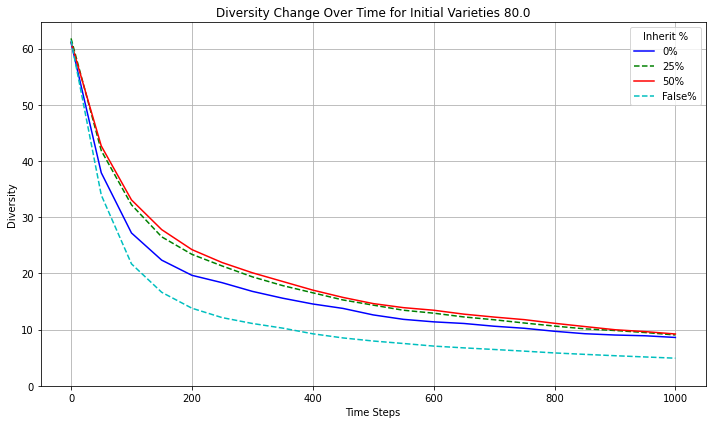

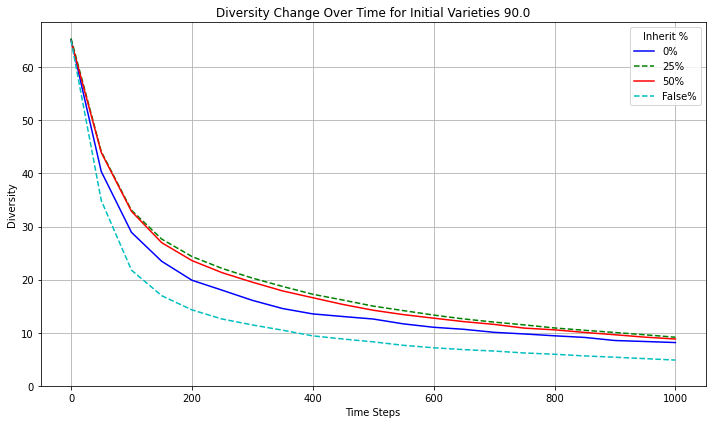

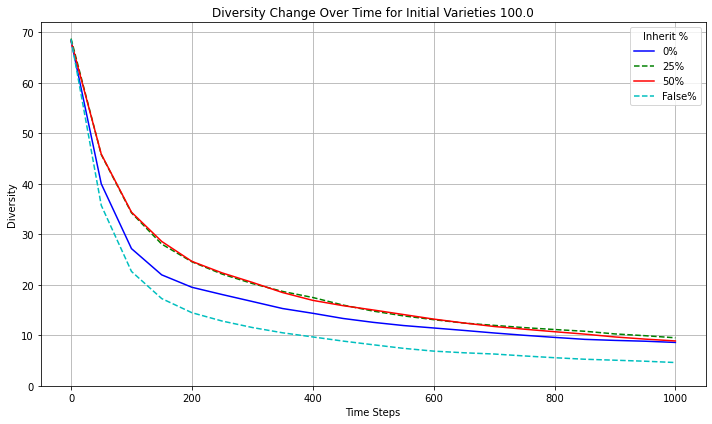

In [36]:
#heat_diversity_comm_level(DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties')
#diversity_change_graphs(DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties', limitant = True)
#diversity_change_by_row(DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties', limitant=True)
#diversity_change_by_column(DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties', limitant=True)
#plot_specific_graph(1, 1, DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties', limitant = True)


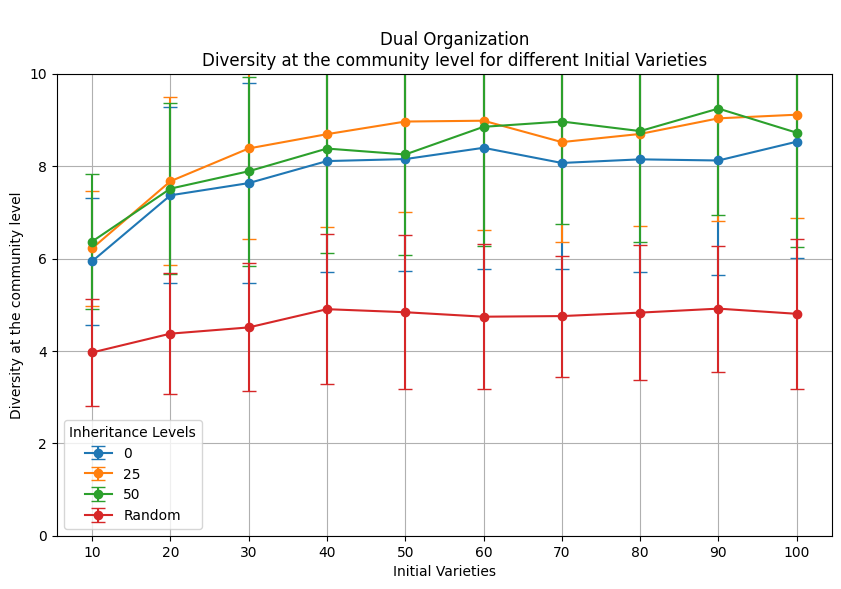

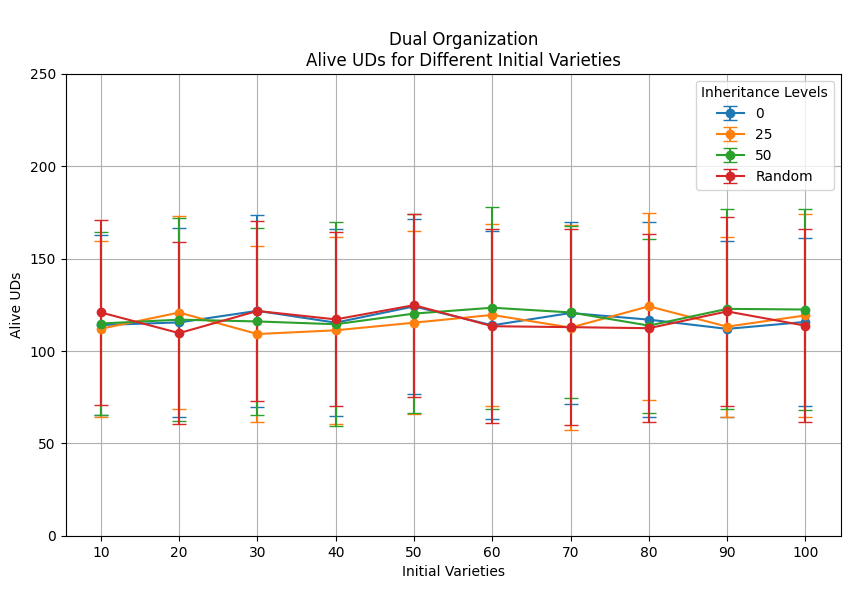

In [21]:
transversal_changes(DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties')
transversal_alive(DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties')

## Pop dynamics

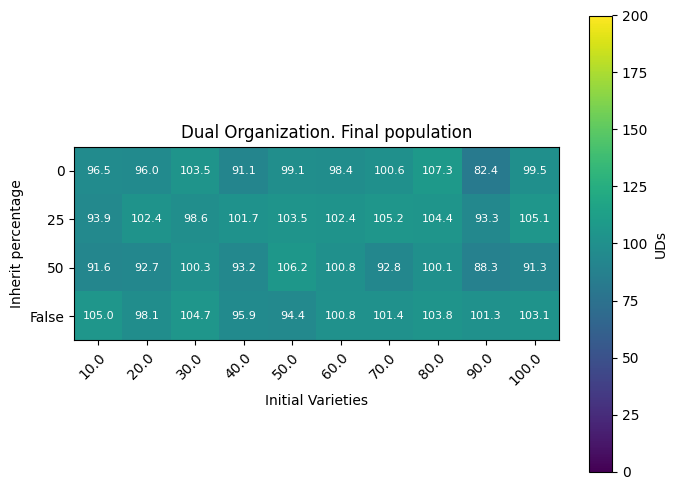

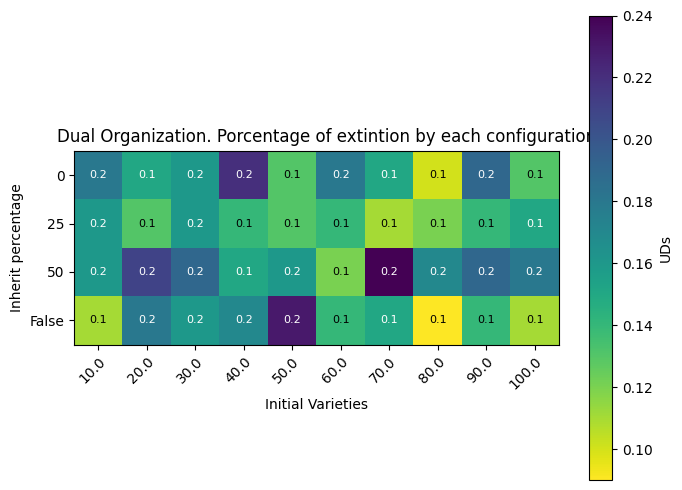

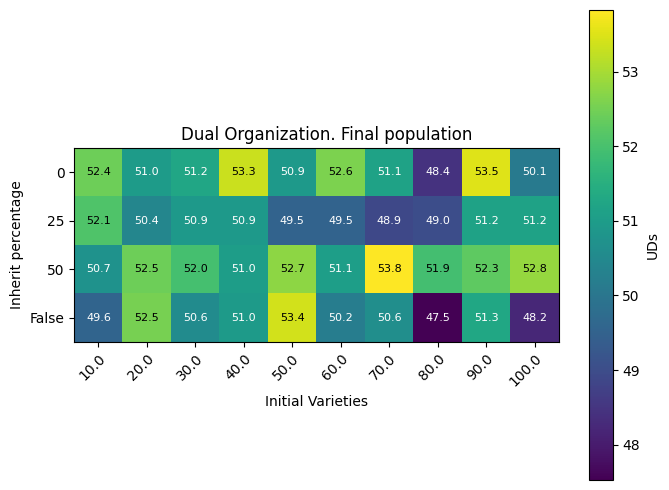

In [92]:
heat_population(DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties')

heat_percentage_population(DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties')

heat_std (DvM_datos, inherits, Dvalphas, 'Dual Organization', variable='Initial Varieties')

## Mean of children

In [140]:
# This experiment has different values for Mean of children
prob_morte = 0.06 #beta
n = 10 # Mean
m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Dcalphas = np.linspace(1,n,n) # Mean of children from 1 to n
# For data of behaviour
cM = np.empty((len(inherits), len(Dcalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 140


print(cM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, media  in enumerate(Dcalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} and Mean of Children {media}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            ## Clans
            clans = (list(range(1, 2 + 1)) * (int(m) // 2)) # Just 2 clans
            random.shuffle(clans)
            if inherit != 'False':
                #### Initialization
                UD_dual_organization.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_dual_organization(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_dual_organization.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_dual_organization.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Dcalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_dual_organization.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_dual_organization_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_dual_organization_al_inh(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_dual_organization_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_dual_organization_al_inh.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Dcalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_dual_organization_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            cM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            cM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit} and initial UDs {m} and mean {media} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Dual_Mean_children.npy')
np.save(heat_std, cM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-09 23:26:19.807904
Experiments with inheritance 0 and Mean of Children 1.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con mean 1.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con mean 1.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con mean 1.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con mean 1.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con mean 1.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 1.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 1.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 1.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 1.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 1.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 1.0
experimento 13
acabó en 0 el experimento 13 con he

acabó en 0 el experimento 116 con herencia 0 con mean 1.0
experimento 117
acabó en 0 el experimento 117 con herencia 0 con mean 1.0
experimento 118
acabó en 0 el experimento 118 con herencia 0 con mean 1.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con mean 1.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con mean 1.0
experimento 121
acabó en 0 el experimento 121 con herencia 0 con mean 1.0
experimento 122
acabó en 0 el experimento 122 con herencia 0 con mean 1.0
experimento 123
acabó en 0 el experimento 123 con herencia 0 con mean 1.0
experimento 124
acabó en 0 el experimento 124 con herencia 0 con mean 1.0
experimento 125
acabó en 0 el experimento 125 con herencia 0 con mean 1.0
experimento 126
acabó en 0 el experimento 126 con herencia 0 con mean 1.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con mean 1.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con mean 1.0
experimento 129
acabó en 0 el experimento 129 con here

acabó en 0 el experimento 90 con herencia 0 con mean 2.0
experimento 91
acabó en 0 el experimento 91 con herencia 0 con mean 2.0
experimento 92
acabó en 0 el experimento 92 con herencia 0 con mean 2.0
experimento 93
acabó en 0 el experimento 93 con herencia 0 con mean 2.0
experimento 94
acabó en 0 el experimento 94 con herencia 0 con mean 2.0
experimento 95
acabó en 0 el experimento 95 con herencia 0 con mean 2.0
experimento 96
acabó en 0 el experimento 96 con herencia 0 con mean 2.0
experimento 97
acabó en 0 el experimento 97 con herencia 0 con mean 2.0
experimento 98
acabó en 0 el experimento 98 con herencia 0 con mean 2.0
experimento 99
acabó en 0 el experimento 99 con herencia 0 con mean 2.0
experimento 100
acabó en 0 el experimento 100 con herencia 0 con mean 2.0
experimento 101
acabó en 0 el experimento 101 con herencia 0 con mean 2.0
experimento 102
acabó en 0 el experimento 102 con herencia 0 con mean 2.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con mean 2.0

acabó en 0 el experimento 62 con herencia 0 con mean 3.0
experimento 63
acabó en 0 el experimento 63 con herencia 0 con mean 3.0
experimento 64
acabó en 0 el experimento 64 con herencia 0 con mean 3.0
experimento 65
acabó en 0 el experimento 65 con herencia 0 con mean 3.0
experimento 66
acabó en 0 el experimento 66 con herencia 0 con mean 3.0
experimento 67
acabó en 0 el experimento 67 con herencia 0 con mean 3.0
experimento 68
acabó en 0 el experimento 68 con herencia 0 con mean 3.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con mean 3.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con mean 3.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con mean 3.0
experimento 72
acabó en 0 el experimento 72 con herencia 0 con mean 3.0
experimento 73
acabó en 0 el experimento 73 con herencia 0 con mean 3.0
experimento 74
acabó en 0 el experimento 74 con herencia 0 con mean 3.0
experimento 75
acabó en 0 el experimento 75 con herencia 0 con mean 3.0
experim

experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 0 con mean 4.0
experimento 109
acabó en 0 el experimento 109 con herencia 0 con mean 4.0
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 0 con mean 4.0
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia 0 con mean 4.0
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 0 con mean 4.0
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
acabó en 0 el experimento 133 con herencia 0 con mean 4.0
exp

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
exp

acabó en 0 el experimento 23 con herencia 25 con mean 1.0
experimento 24
acabó en 0 el experimento 24 con herencia 25 con mean 1.0
experimento 25
acabó en 0 el experimento 25 con herencia 25 con mean 1.0
experimento 26
acabó en 0 el experimento 26 con herencia 25 con mean 1.0
experimento 27
acabó en 0 el experimento 27 con herencia 25 con mean 1.0
experimento 28
acabó en 0 el experimento 28 con herencia 25 con mean 1.0
experimento 29
acabó en 0 el experimento 29 con herencia 25 con mean 1.0
experimento 30
acabó en 0 el experimento 30 con herencia 25 con mean 1.0
experimento 31
acabó en 0 el experimento 31 con herencia 25 con mean 1.0
experimento 32
acabó en 0 el experimento 32 con herencia 25 con mean 1.0
experimento 33
acabó en 0 el experimento 33 con herencia 25 con mean 1.0
experimento 34
acabó en 0 el experimento 34 con herencia 25 con mean 1.0
experimento 35
acabó en 0 el experimento 35 con herencia 25 con mean 1.0
experimento 36
acabó en 0 el experimento 36 con herencia 25 con me

acabó en 0 el experimento 139 con herencia 25 con mean 1.0
experimento 140
acabó en 0 el experimento 140 con herencia 25 con mean 1.0

The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 1.0 is  1.7665138244628906
        
Experiments with inheritance 25 and Mean of Children 2.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con mean 2.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con mean 2.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con mean 2.0
experimento 4
acabó en 0 el experimento 4 con herencia 25 con mean 2.0
experimento 5
acabó en 0 el experimento 5 con herencia 25 con mean 2.0
experimento 6
acabó en 0 el experimento 6 con herencia 25 con mean 2.0
experimento 7
acabó en 0 el experimento 7 con herencia 25 con mean 2.0
experimento 8
acabó en 0 el experimento 8 con herencia 25 con mean 2.0
experimento 9
acabó en 0 el experimento 9 con herencia 25 con mean 2.0
experimento 10
acabó en 0 el experimento 10 

acabó en 0 el experimento 115 con herencia 25 con mean 2.0
experimento 116
acabó en 0 el experimento 116 con herencia 25 con mean 2.0
experimento 117
acabó en 0 el experimento 117 con herencia 25 con mean 2.0
experimento 118
acabó en 0 el experimento 118 con herencia 25 con mean 2.0
experimento 119
acabó en 0 el experimento 119 con herencia 25 con mean 2.0
experimento 120
acabó en 0 el experimento 120 con herencia 25 con mean 2.0
experimento 121
acabó en 0 el experimento 121 con herencia 25 con mean 2.0
experimento 122
acabó en 0 el experimento 122 con herencia 25 con mean 2.0
experimento 123
acabó en 0 el experimento 123 con herencia 25 con mean 2.0
experimento 124
acabó en 0 el experimento 124 con herencia 25 con mean 2.0
experimento 125
acabó en 0 el experimento 125 con herencia 25 con mean 2.0
experimento 126
acabó en 0 el experimento 126 con herencia 25 con mean 2.0
experimento 127
acabó en 0 el experimento 127 con herencia 25 con mean 2.0
experimento 128
acabó en 0 el experimento

acabó en 0 el experimento 89 con herencia 25 con mean 3.0
experimento 90
acabó en 0 el experimento 90 con herencia 25 con mean 3.0
experimento 91
acabó en 0 el experimento 91 con herencia 25 con mean 3.0
experimento 92
acabó en 0 el experimento 92 con herencia 25 con mean 3.0
experimento 93
acabó en 0 el experimento 93 con herencia 25 con mean 3.0
experimento 94
acabó en 0 el experimento 94 con herencia 25 con mean 3.0
experimento 95
acabó en 0 el experimento 95 con herencia 25 con mean 3.0
experimento 96
acabó en 0 el experimento 96 con herencia 25 con mean 3.0
experimento 97
acabó en 0 el experimento 97 con herencia 25 con mean 3.0
experimento 98
acabó en 0 el experimento 98 con herencia 25 con mean 3.0
experimento 99
acabó en 0 el experimento 99 con herencia 25 con mean 3.0
experimento 100
acabó en 0 el experimento 100 con herencia 25 con mean 3.0
experimento 101
acabó en 0 el experimento 101 con herencia 25 con mean 3.0
experimento 102
acabó en 0 el experimento 102 con herencia 25 

experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experiment

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
exp

acabó en 0 el experimento 66 con herencia 50 con mean 1.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con mean 1.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con mean 1.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con mean 1.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con mean 1.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con mean 1.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con mean 1.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con mean 1.0
experimento 74
acabó en 0 el experimento 74 con herencia 50 con mean 1.0
experimento 75
acabó en 0 el experimento 75 con herencia 50 con mean 1.0
experimento 76
acabó en 0 el experimento 76 con herencia 50 con mean 1.0
experimento 77
acabó en 0 el experimento 77 con herencia 50 con mean 1.0
experimento 78
acabó en 0 el experimento 78 con herencia 50 con mean 1.0
experimento 79
acabó en 0 el experimento 79 con herencia 50 con me

acabó en 0 el experimento 40 con herencia 50 con mean 2.0
experimento 41
acabó en 0 el experimento 41 con herencia 50 con mean 2.0
experimento 42
acabó en 0 el experimento 42 con herencia 50 con mean 2.0
experimento 43
acabó en 0 el experimento 43 con herencia 50 con mean 2.0
experimento 44
acabó en 0 el experimento 44 con herencia 50 con mean 2.0
experimento 45
acabó en 0 el experimento 45 con herencia 50 con mean 2.0
experimento 46
acabó en 0 el experimento 46 con herencia 50 con mean 2.0
experimento 47
acabó en 0 el experimento 47 con herencia 50 con mean 2.0
experimento 48
acabó en 0 el experimento 48 con herencia 50 con mean 2.0
experimento 49
acabó en 0 el experimento 49 con herencia 50 con mean 2.0
experimento 50
acabó en 0 el experimento 50 con herencia 50 con mean 2.0
experimento 51
acabó en 0 el experimento 51 con herencia 50 con mean 2.0
experimento 52
acabó en 0 el experimento 52 con herencia 50 con mean 2.0
experimento 53
acabó en 0 el experimento 53 con herencia 50 con me

acabó en 0 el experimento 9 con herencia 50 con mean 3.0
experimento 10
acabó en 0 el experimento 10 con herencia 50 con mean 3.0
experimento 11
acabó en 0 el experimento 11 con herencia 50 con mean 3.0
experimento 12
acabó en 0 el experimento 12 con herencia 50 con mean 3.0
experimento 13
acabó en 0 el experimento 13 con herencia 50 con mean 3.0
experimento 14
acabó en 0 el experimento 14 con herencia 50 con mean 3.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con mean 3.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con mean 3.0
experimento 17
acabó en 0 el experimento 17 con herencia 50 con mean 3.0
experimento 18
acabó en 0 el experimento 18 con herencia 50 con mean 3.0
experimento 19
acabó en 0 el experimento 19 con herencia 50 con mean 3.0
experimento 20
acabó en 0 el experimento 20 con herencia 50 con mean 3.0
experimento 21
acabó en 0 el experimento 21 con herencia 50 con mean 3.0
experimento 22
acabó en 0 el experimento 22 con herencia 50 con mea

acabó en 0 el experimento 121 con herencia 50 con mean 3.0
experimento 122
acabó en 0 el experimento 122 con herencia 50 con mean 3.0
experimento 123
acabó en 0 el experimento 123 con herencia 50 con mean 3.0
experimento 124
acabó en 0 el experimento 124 con herencia 50 con mean 3.0
experimento 125
acabó en 0 el experimento 125 con herencia 50 con mean 3.0
experimento 126
acabó en 0 el experimento 126 con herencia 50 con mean 3.0
experimento 127
acabó en 0 el experimento 127 con herencia 50 con mean 3.0
experimento 128
acabó en 0 el experimento 128 con herencia 50 con mean 3.0
experimento 129
acabó en 0 el experimento 129 con herencia 50 con mean 3.0
experimento 130
acabó en 0 el experimento 130 con herencia 50 con mean 3.0
experimento 131
acabó en 0 el experimento 131 con herencia 50 con mean 3.0
experimento 132
acabó en 0 el experimento 132 con herencia 50 con mean 3.0
experimento 133
acabó en 0 el experimento 133 con herencia 50 con mean 3.0
experimento 134
acabó en 0 el experimento

experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimen

experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140

The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 9.0 is  1767.7541484832764
        
Experiments with inheritance 50 and Mean of Children 10.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experim

acabó en 0 el experimento 82 con herencia False con mean 1.0
experimento 83
acabó en 0 el experimento 83 con herencia False con mean 1.0
experimento 84
acabó en 0 el experimento 84 con herencia False con mean 1.0
experimento 85
acabó en 0 el experimento 85 con herencia False con mean 1.0
experimento 86
acabó en 0 el experimento 86 con herencia False con mean 1.0
experimento 87
acabó en 0 el experimento 87 con herencia False con mean 1.0
experimento 88
acabó en 0 el experimento 88 con herencia False con mean 1.0
experimento 89
acabó en 0 el experimento 89 con herencia False con mean 1.0
experimento 90
acabó en 0 el experimento 90 con herencia False con mean 1.0
experimento 91
acabó en 0 el experimento 91 con herencia False con mean 1.0
experimento 92
acabó en 0 el experimento 92 con herencia False con mean 1.0
experimento 93
acabó en 0 el experimento 93 con herencia False con mean 1.0
experimento 94
acabó en 0 el experimento 94 con herencia False con mean 1.0
experimento 95
acabó en 0 e

acabó en 0 el experimento 53 con herencia False con mean 2.0
experimento 54
acabó en 0 el experimento 54 con herencia False con mean 2.0
experimento 55
acabó en 0 el experimento 55 con herencia False con mean 2.0
experimento 56
acabó en 0 el experimento 56 con herencia False con mean 2.0
experimento 57
acabó en 0 el experimento 57 con herencia False con mean 2.0
experimento 58
acabó en 0 el experimento 58 con herencia False con mean 2.0
experimento 59
acabó en 0 el experimento 59 con herencia False con mean 2.0
experimento 60
acabó en 0 el experimento 60 con herencia False con mean 2.0
experimento 61
acabó en 0 el experimento 61 con herencia False con mean 2.0
experimento 62
acabó en 0 el experimento 62 con herencia False con mean 2.0
experimento 63
acabó en 0 el experimento 63 con herencia False con mean 2.0
experimento 64
acabó en 0 el experimento 64 con herencia False con mean 2.0
experimento 65
acabó en 0 el experimento 65 con herencia False con mean 2.0
experimento 66
acabó en 0 e

acabó en 0 el experimento 19 con herencia False con mean 3.0
experimento 20
acabó en 0 el experimento 20 con herencia False con mean 3.0
experimento 21
acabó en 0 el experimento 21 con herencia False con mean 3.0
experimento 22
acabó en 0 el experimento 22 con herencia False con mean 3.0
experimento 23
acabó en 0 el experimento 23 con herencia False con mean 3.0
experimento 24
acabó en 0 el experimento 24 con herencia False con mean 3.0
experimento 25
acabó en 0 el experimento 25 con herencia False con mean 3.0
experimento 26
acabó en 0 el experimento 26 con herencia False con mean 3.0
experimento 27
acabó en 0 el experimento 27 con herencia False con mean 3.0
experimento 28
acabó en 0 el experimento 28 con herencia False con mean 3.0
experimento 29
acabó en 0 el experimento 29 con herencia False con mean 3.0
experimento 30
acabó en 0 el experimento 30 con herencia False con mean 3.0
experimento 31
acabó en 0 el experimento 31 con herencia False con mean 3.0
experimento 32
acabó en 0 e

acabó en 0 el experimento 129 con herencia False con mean 3.0
experimento 130
acabó en 0 el experimento 130 con herencia False con mean 3.0
experimento 131
acabó en 0 el experimento 131 con herencia False con mean 3.0
experimento 132
acabó en 0 el experimento 132 con herencia False con mean 3.0
experimento 133
acabó en 0 el experimento 133 con herencia False con mean 3.0
experimento 134
acabó en 0 el experimento 134 con herencia False con mean 3.0
experimento 135
acabó en 0 el experimento 135 con herencia False con mean 3.0
experimento 136
acabó en 0 el experimento 136 con herencia False con mean 3.0
experimento 137
acabó en 0 el experimento 137 con herencia False con mean 3.0
experimento 138
acabó en 0 el experimento 138 con herencia False con mean 3.0
experimento 139
acabó en 0 el experimento 139 con herencia False con mean 3.0
experimento 140
acabó en 0 el experimento 140 con herencia False con mean 3.0

The total time of the configuration of inherit percentage False and initial UDs

experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140

The total time of the configuration of inherit percentage False and initial UDs 40 and mean 6.0 is  2436.257444381714
        
Experiments with inheritance False and Mean of Children 7.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 

experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experiment

In [22]:
# Dowload the documents
#As a reference
n = 10 # Mean
# m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Dcalphas = np.linspace(1,n,n) # Mean of children from 1 to n
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Dual_Mean_children.npy')

## General Data
DcM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

Skipping Inherit 0%, Mean of children 1.0 due to no data
Skipping Inherit 0%, Mean of children 2.0 due to no data
Skipping Inherit 0%, Mean of children 3.0 due to no data


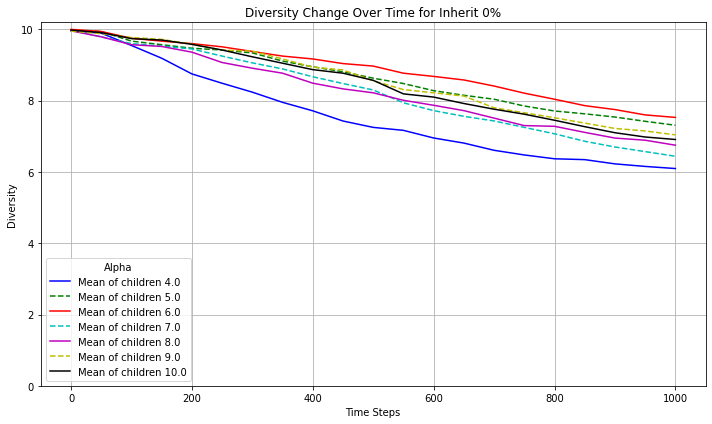

Skipping Inherit 25%, Mean of children 1.0 due to no data
Skipping Inherit 25%, Mean of children 2.0 due to no data
Skipping Inherit 25%, Mean of children 3.0 due to no data


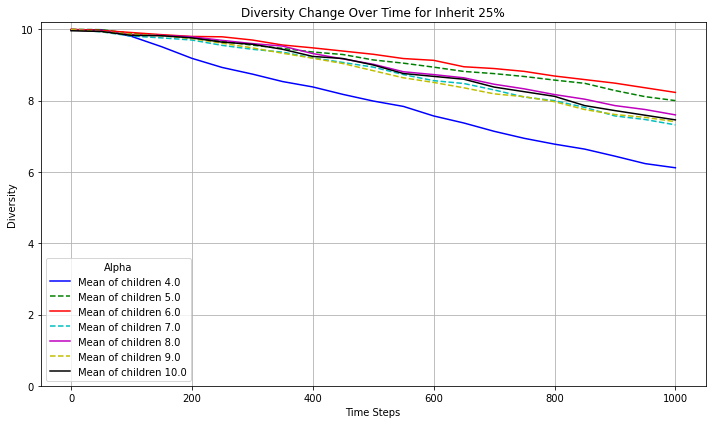

Skipping Inherit 50%, Mean of children 1.0 due to no data
Skipping Inherit 50%, Mean of children 2.0 due to no data
Skipping Inherit 50%, Mean of children 3.0 due to no data


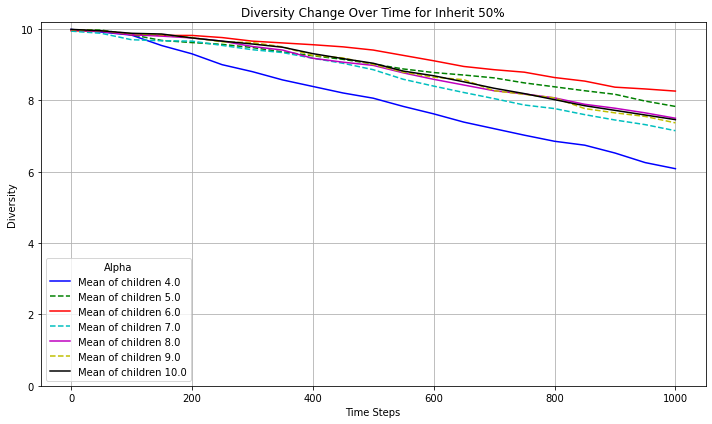

Skipping Inherit False%, Mean of children 1.0 due to no data
Skipping Inherit False%, Mean of children 2.0 due to no data
Skipping Inherit False%, Mean of children 3.0 due to no data


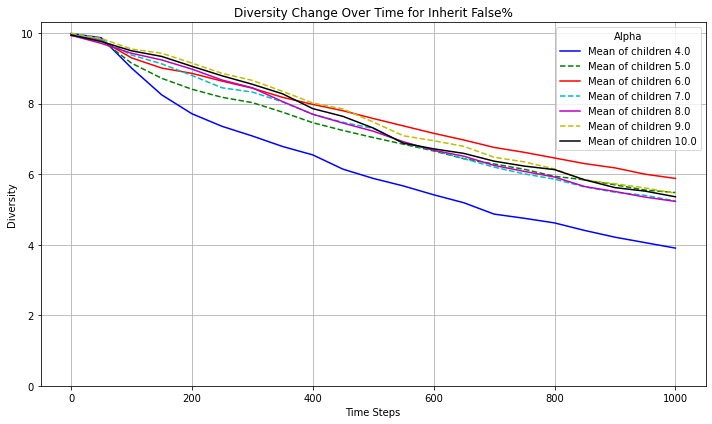

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Skipping Inherit 0%, Mean of children 1.0 due to no data
Skipping Inherit 25%, Mean of children 1.0 due to no data
Skipping Inherit 50%, Mean of children 1.0 due to no data
Skipping Inherit False%, Mean of children 1.0 due to no data


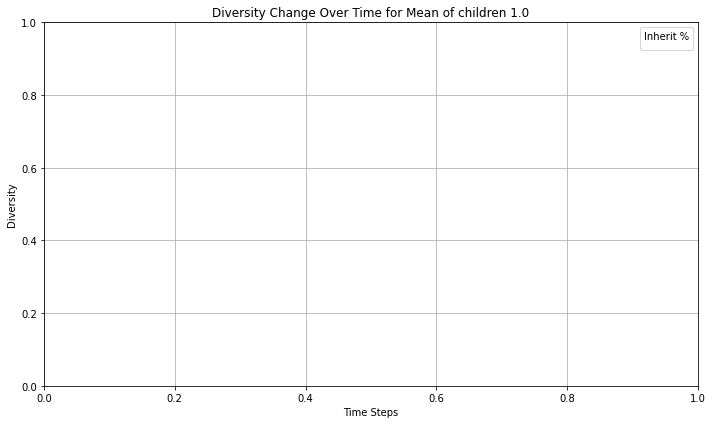

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Skipping Inherit 0%, Mean of children 2.0 due to no data
Skipping Inherit 25%, Mean of children 2.0 due to no data
Skipping Inherit 50%, Mean of children 2.0 due to no data
Skipping Inherit False%, Mean of children 2.0 due to no data


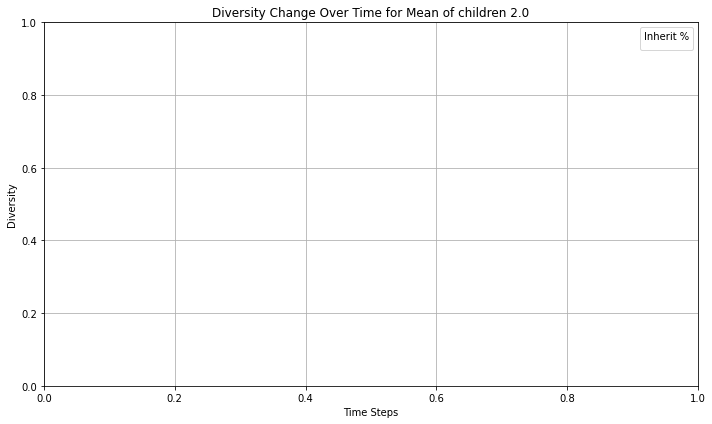

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Skipping Inherit 0%, Mean of children 3.0 due to no data
Skipping Inherit 25%, Mean of children 3.0 due to no data
Skipping Inherit 50%, Mean of children 3.0 due to no data
Skipping Inherit False%, Mean of children 3.0 due to no data


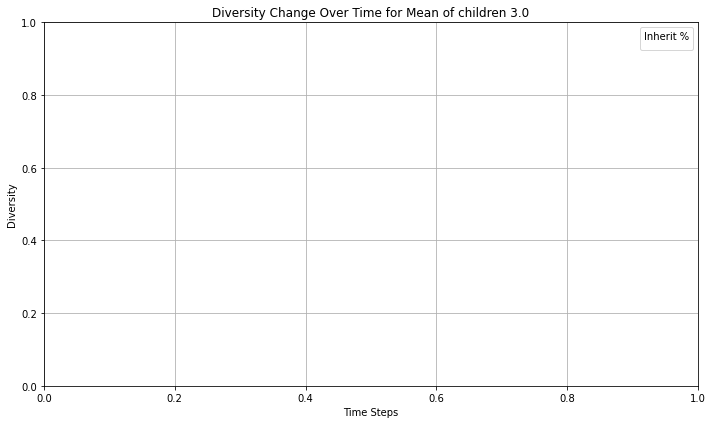

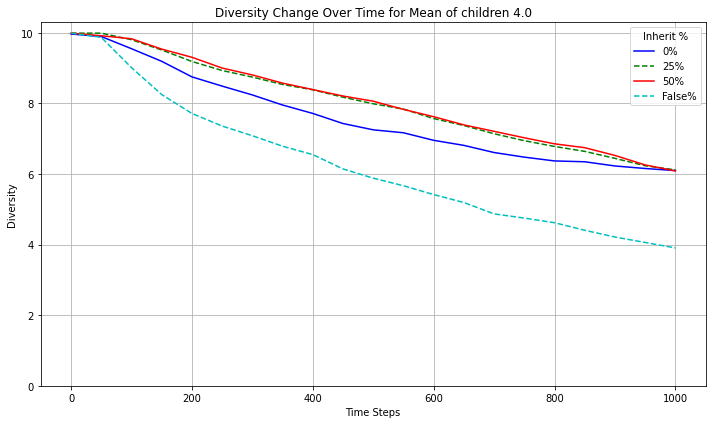

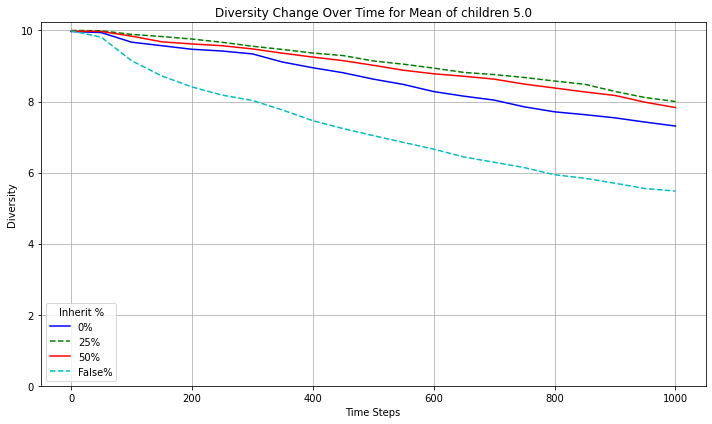

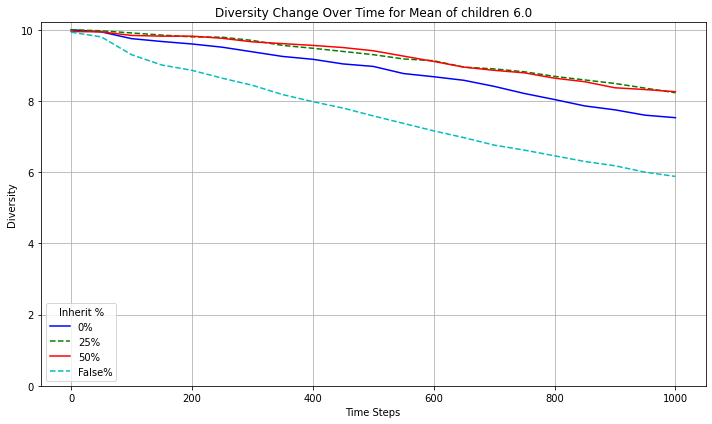

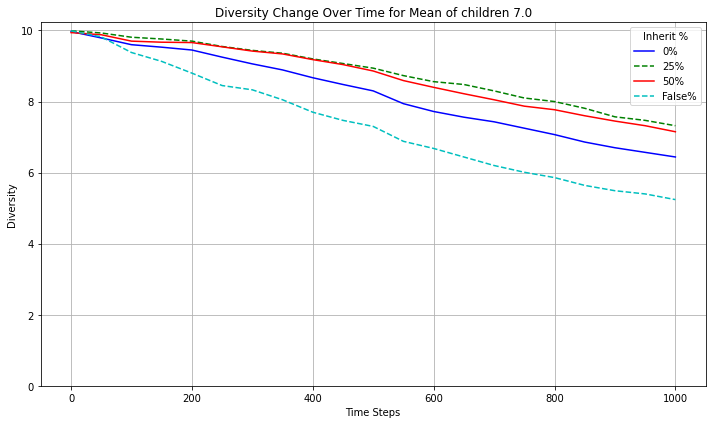

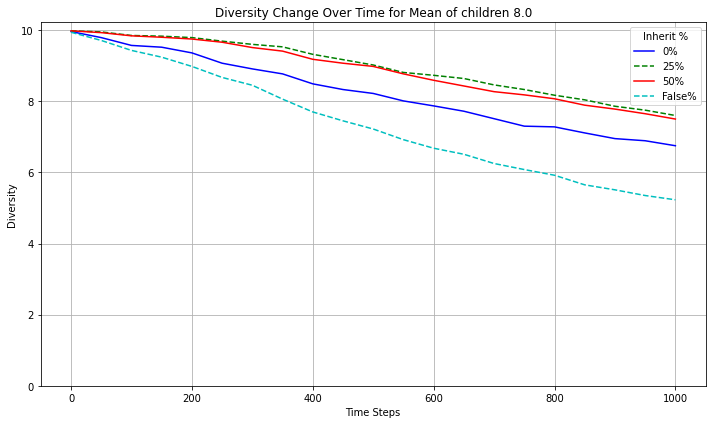

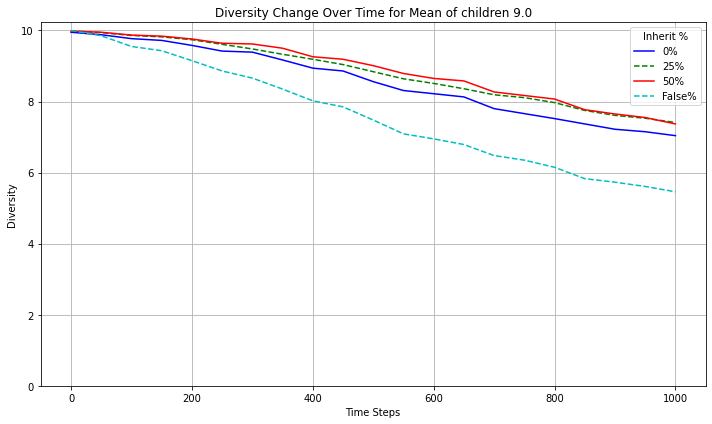

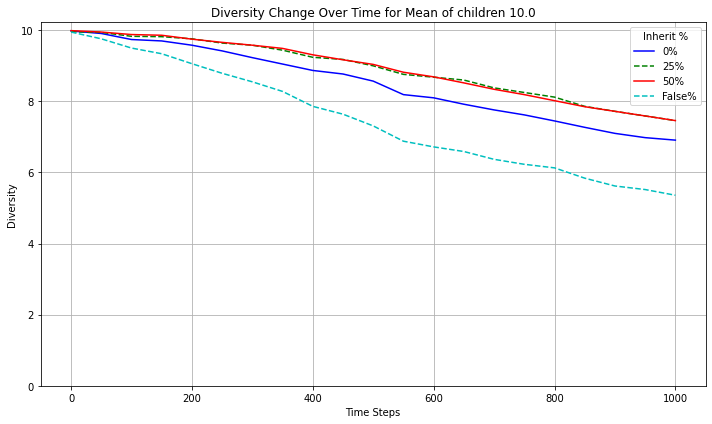

In [38]:
#heat_diversity_comm_level(DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children')
#diversity_change_graphs(DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children', limitant = True)
#diversity_change_by_row(DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children', limitant=True)
#diversity_change_by_column(DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children', limitant=True)

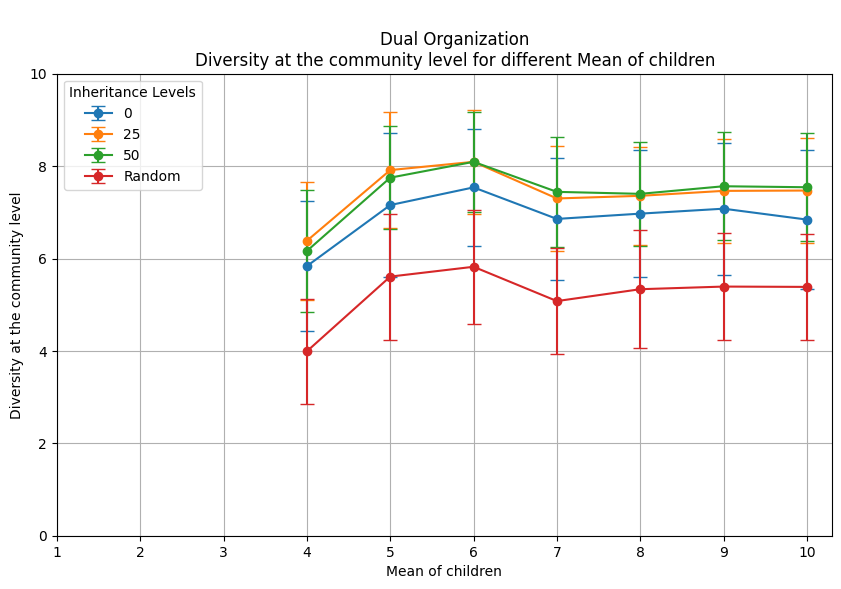

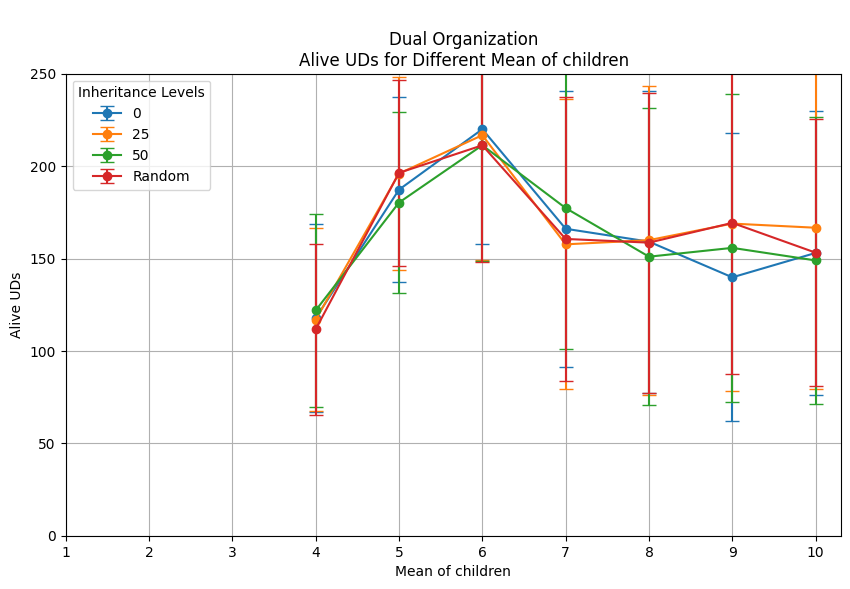

In [23]:
transversal_changes(DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children')
transversal_alive(DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children')

## Pop dynamics

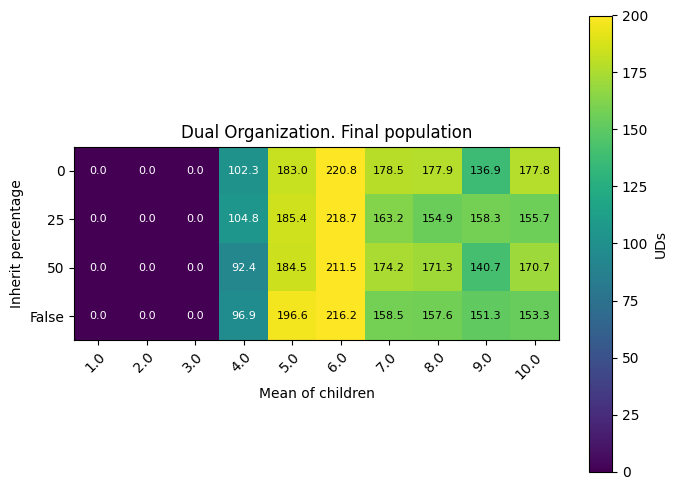

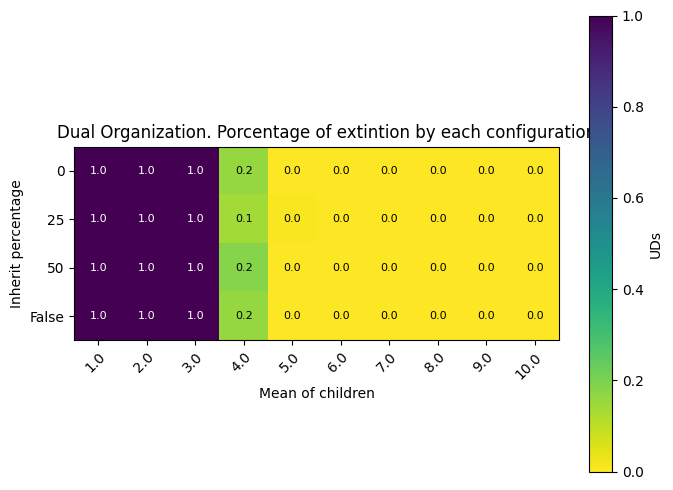

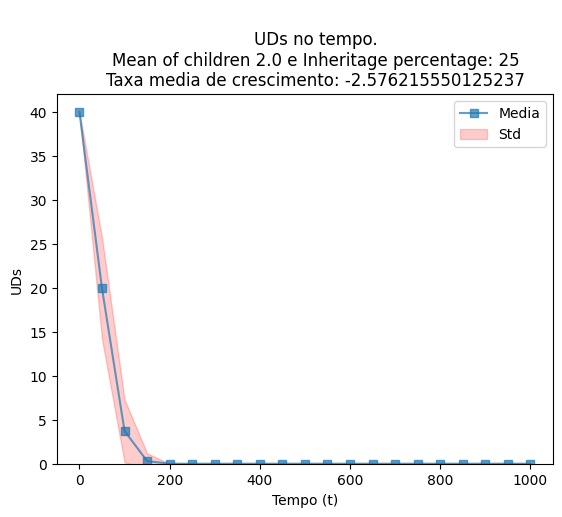

In [93]:
heat_population(DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children')

heat_percentage_population(DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children')

plot_specific_alivegraph(1, 1, DcM_datos, inherits, Dcalphas, 'Dual Organization', variable='Mean of children')

## Mean varieties

In [143]:
# This experiment has different values for Initial varieties mv
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
#v = 10 # Initial varieties
mv = 10
inherits = [0,25,50, 'False'] #Values for inherit
# inherits = [0,25,50] #Values for inherit
Dmvalphas = np.linspace(1,mv,mv)# Mean varieties from 1 to mv
# For data of behaviour
vM = np.empty((len(inherits), len(Dmvalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 140


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, mvarieties  in enumerate(Dmvalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} Initial UDs {m} and Mean varieties {mvarieties}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            ## Clans
            clans = (list(range(1, 2 + 1)) * (int(m) // 2)) # Just 2 clans
            random.shuffle(clans)
            if inherit != 'False':
                #### Initialization
                UD_dual_organization.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_dual_organization(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_dual_organization.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(10))]
                    for ud in UD_dual_organization.uds.values():
                        for _ in range(int(mvarieties)):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dmvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_dual_organization.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_dual_organization.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_dual_organization_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_dual_organization_al_inh(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_dual_organization_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(10))]
                    for ud in UD_dual_organization_al_inh.uds.values():
                        for _ in range(int(mvarieties)):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_dual_organization_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dmvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, True, int(mvarieties), 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_dual_organization_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_dual_organization_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            vM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            vM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit}, 
  initial UDs {m} and Mean varieties {mvarieties} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Dual_Initial_Mean_varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-10 11:22:14.502057
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 1.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 1.0
experimento 3
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 1.0
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 1.0
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 1.0
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 0 con unidades 1.0
experimento 19
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 0 con unidades 1.0
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 1.0
experimento 29
experimento 30
experimento 31
exp

experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 3.0
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 3.0
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 0 con unidades 3.0
experimento 18
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 0 con unidades 3.0
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 3.0
experimento 24
acabó en 0 el experimento 24 con herencia 0 con unidades 3.0
experimento 25
acabó en 0 el experimento 25 con herencia 0 con unidades 3.0
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 3.0
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 3.0
experim

experimento 29
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 5.0
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 5.0
experimento 40
acabó en 0 el experimento 40 con herencia 0 con unidades 5.0
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 5.0
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 0 con unidades 5.0
experimento 72
acabó en 0 el experimento 72 con he

acabó en 0 el experimento 31 con herencia 0 con unidades 7.0
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 7.0
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 0 con unidades 7.0
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 7.0
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 7.0
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 0 con unidades 7.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 7.0
exp

experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 9.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia 0 con unidades 9.0
experimento 71
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 9.0
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia 0 con unidades 9.0
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 9.0
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 9.0
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 0 con unidades 9.0
experimento 87
acabó en 0 el experimento 87 con 

experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 25 con unidades 1.0
experimento 103
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 25 con unidades 1.0
experimento 106
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 25 con unidades 1.0
experimento 109
acabó en 0 el experimento 109 con herencia 25 con unidades 1.0
experimento 110
acabó en 0 el experimento 110 con herencia 25 con unidades 1.0
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 25 con unidades 1.0
experimento 118
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 25 con unidades 1.0
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 25 con 

experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Mean varieties 3.0 is  553.3347821235657
        
Experiments with inheritance 25 Initial UDs 40 and Mean varieties 4.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 4.0
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 4.0
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 4.0
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 4.0
experimento 26
experimento 27
experim

experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 6.0
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 6.0
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia 25 con unidades 6.0
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 6.0
experimento 20
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 6.0
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 25 con unidades 6.0
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 6.0
experimento 37
experimento 38
experimento 39
acabó

experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 25 con unidades 8.0
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 8.0
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia 25 con unidades 8.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con 

experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 25 con unidades 10.0
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 10.0
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 10.0
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia 25 con unidades 10.0
experimento 75
acabó en 0 el experimento 75 con herencia 25 con unidades 10.0
experimento 76
acabó en 0 el experimento 76 con herencia 25 con unidades 10.0
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 25 con unidades 10.0
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
expe

experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia 50 con unidades 2.0
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 50 con unidades 2.0
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 50 con unidades 2.0
experimento 91
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 50 con unidades 2.0
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 2.0
experimento 96
experimento 97
experimento 98


experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 50 con unidades 4.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con unidades 4.0
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 4.0
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unidades 4.0
experimento 105
experimento 106
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 4.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 4.0
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 50 con unidades 4.0
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 50 con unidades 4.0
e

acabó en 0 el experimento 102 con herencia 50 con unidades 6.0
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 50 con unidades 6.0
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 6.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 6.0
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
acabó en 0 el experimento 135 con herencia 50 con unidades 6.0
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140

The total time of the configuration of inherit percentage 50, 
  initial UDs

experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 8.0
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140

The total time of the configuration of inherit percentage 50, 
  initial UDs 40 and Mean varieties 8.0 is  729.3019132614136
        
Experiments with inheritance 50 Initial UDs 40 and Mean varieties 9.0
experimento 1
acabó en 0 el experimento 1 con herencia 50 con unidades 9.0
experimento 2
acabó en 0 el experimento 2 con herencia 50 con unidades 9.0
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 50 con unidades 9.0
experimento 9
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 50 con unidades 9.0
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 9.0
experimento 16
ex

acabó en 0 el experimento 118 con herencia 50 con unidades 10.0
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades 10.0
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
acabó en 0 el experimento 135 con herencia 50 con unidades 10.0
experimento 136
experimento 137
acabó en 0 el experimento 137 con herencia 50 con unidades 10.0
experimento 138
experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 10.0
experimento 140

The total time of the configuration of inherit percentage 50, 
  initial UDs 40 and Mean varieties 10.0 is  929.6996839046478
        
Experiments with inheritance False Initial UDs 40 and Mean varieties 1.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experim

experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia False con unidades 3.0
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 3.0
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia False con unidades 3.0
experimento 30
experimento 31
acabó en 0 el experimento 31 con herencia False con unidades 3.0
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 3.0
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 3.0
experimento 41
experimento 42
acabó

experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 5.0
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 5.0
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia False con unidades 5.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia False con unidades 5.0
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 5.0
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia False con unidades 5.0
experimento 79
experimento 80
experiment

experimento 48
experimento 49
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 7.0
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia False con unidades 7.0
experimento 56
acabó en 0 el experimento 56 con herencia False con unidades 7.0
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia False con unidades 7.0
experimento 62
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia False con unidades 7.0
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
acabó en 0 el experimento 70 con herencia False con unidades 7.0
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 7.0
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
acabó en 0 el experimento 81 con he

experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia False con unidades 9.0
experimento 67
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia False con unidades 9.0
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 9.0
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia False con unidades 9.0
experimento 78
experimento 79
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia False con unidades 9.0
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia False con unidades 9.0
experimento 97
experimento 98
experimento 99
acabó en 0

In [24]:
# Dowload the documents
#As a reference
mv = 10 # Mean
inherits = [0,25,50, 'False']
#inherits = [0,'False']
Dmvalphas = np.linspace(1,mv,mv) # Mean of children from 1 to n
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Dual_Initial_Mean_varieties.npy')

## General Data
DmvM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

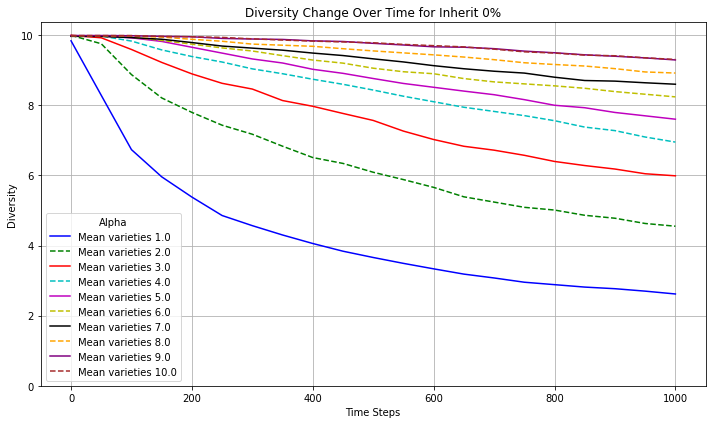

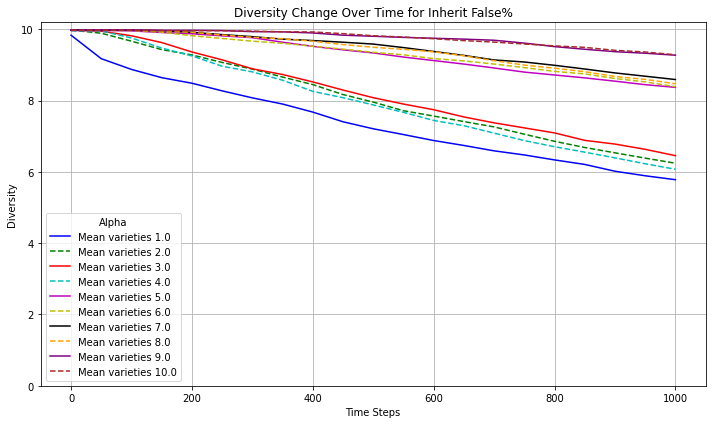

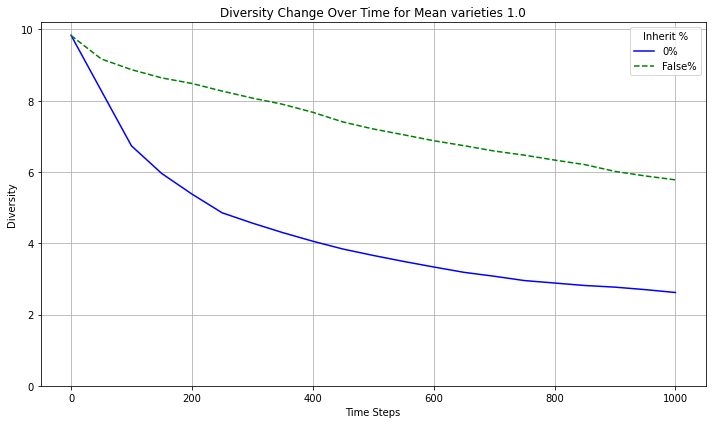

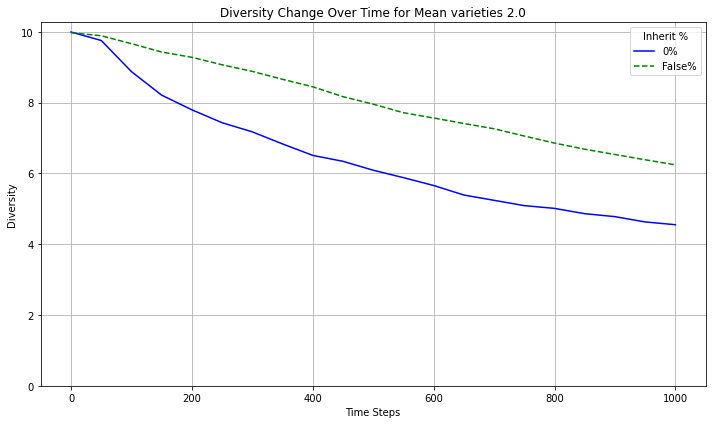

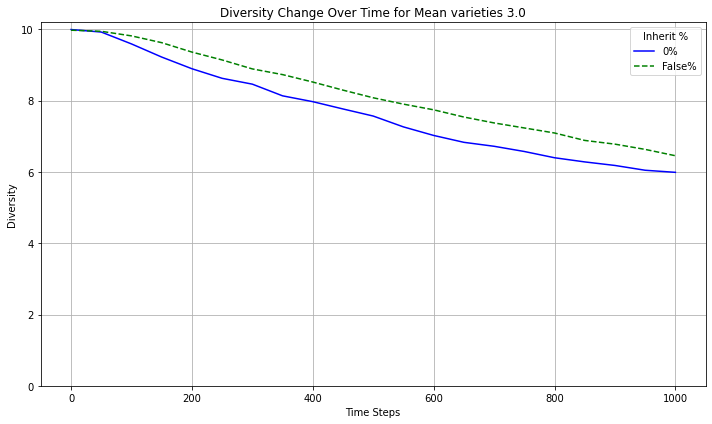

...

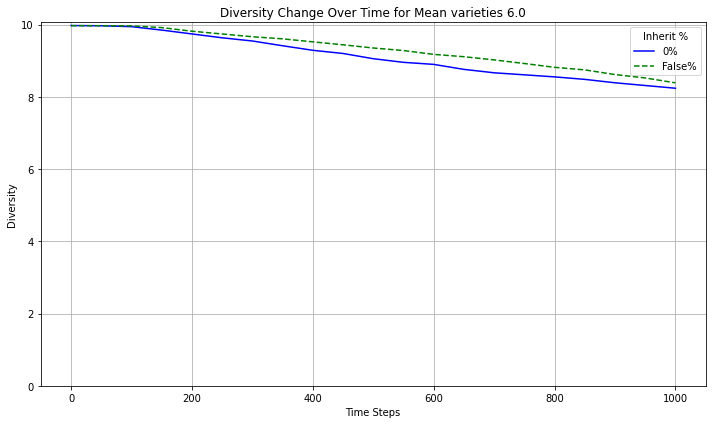

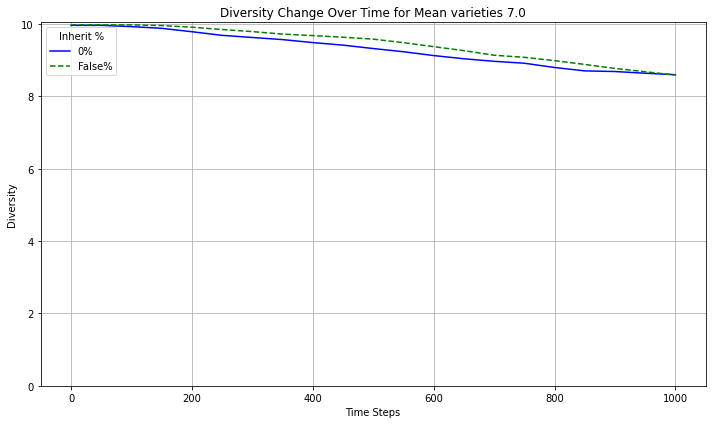

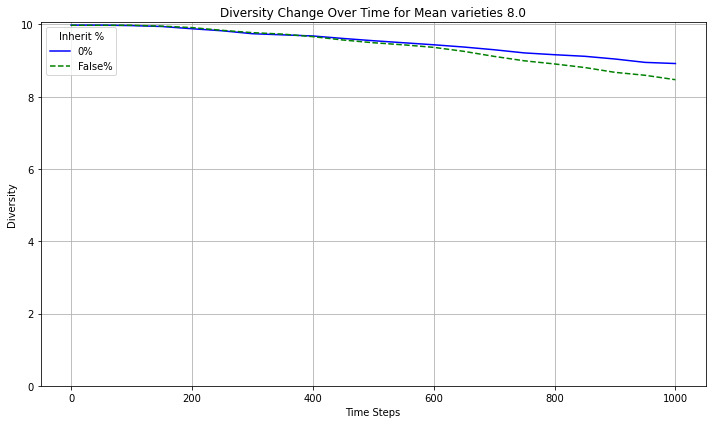

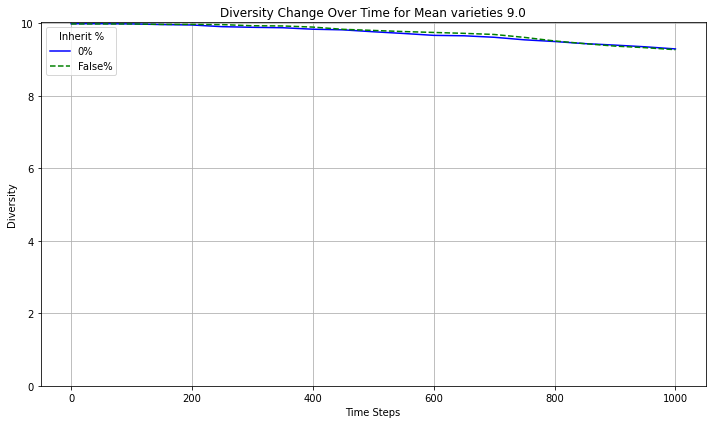

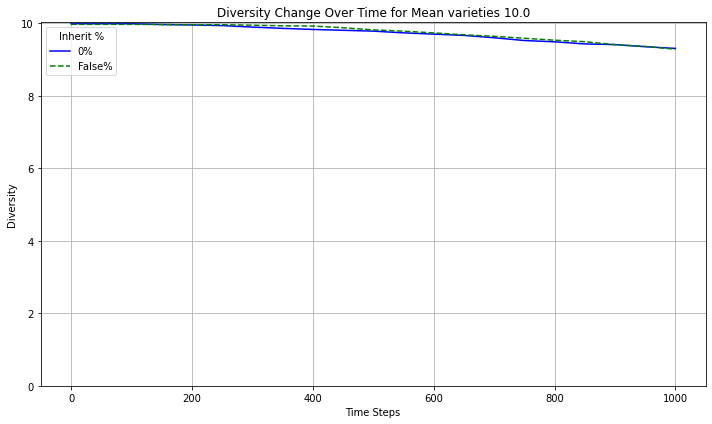

In [26]:
#heat_diversity_comm_level(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties')
#diversity_change_graphs(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties', limitant = True)
#diversity_change_by_row(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties', limitant=True)
#diversity_change_by_column(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties', limitant=True)

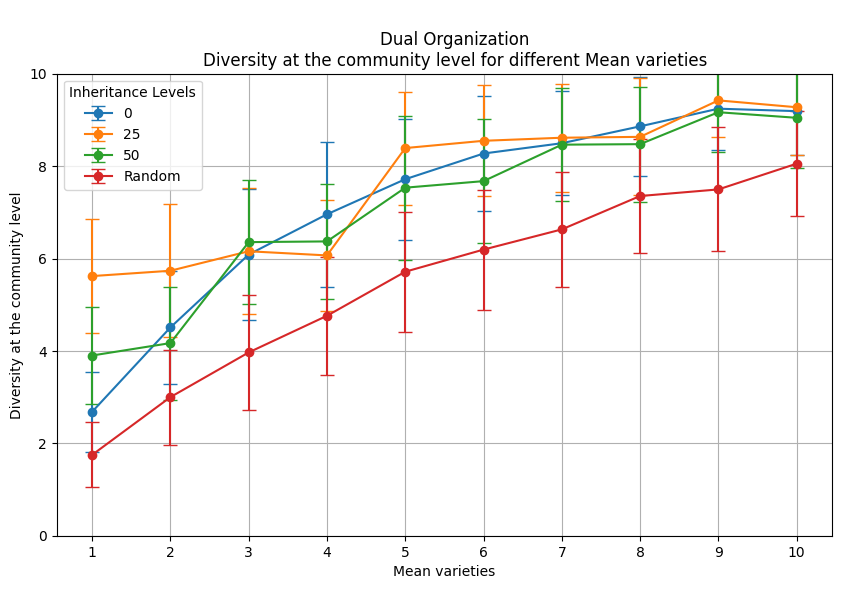

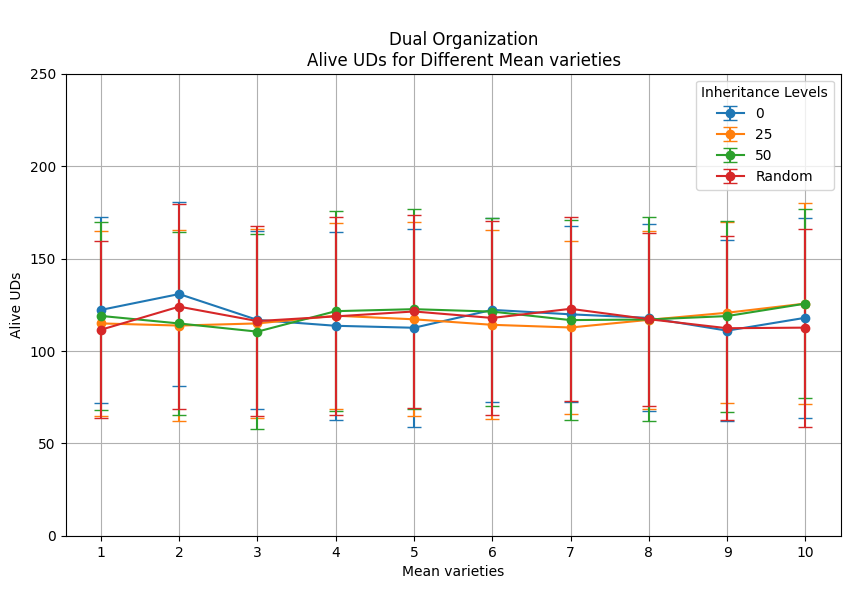

In [25]:
transversal_changes(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties')
transversal_alive(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties')

## Population dynamics

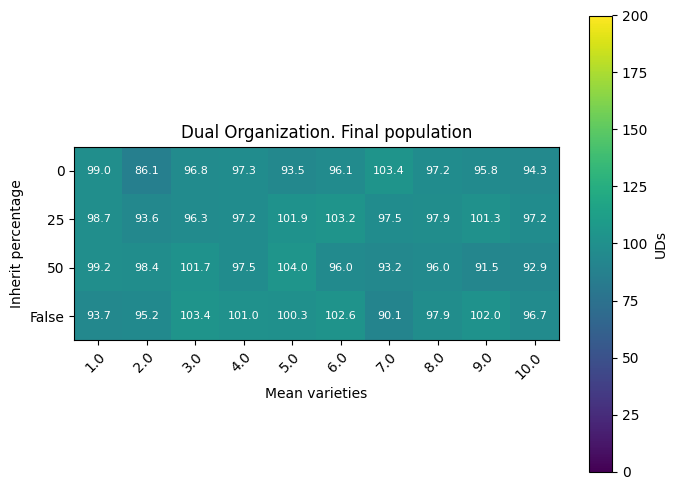

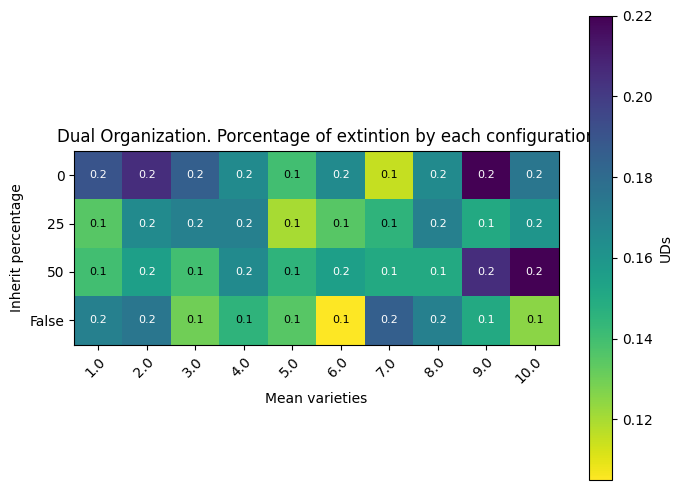

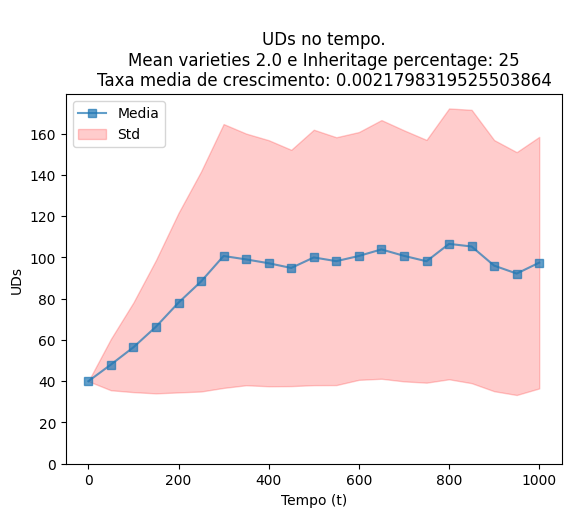

In [100]:
heat_population(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties')
heat_percentage_population(DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties')
plot_specific_alivegraph(1, 1, DmvM_datos, inherits, Dmvalphas, 'Dual Organization', variable='Mean varieties')

# Generalized

## Initial UDs

Here we experimento with Initial UDs. We try from 10 to 100

In [26]:
# This experiment has different values for Initial UDs
prob_morte = 0.06 #beta
media = 4 # Mean
m = 100 # Initial UDs
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
#inherits = ['False'] #Values for inherit
Gmalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
# For data of behaviour
mM = np.empty((len(inherits), len(Gmalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 300

print(mM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, iniciais  in enumerate(Gmalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} and Initial UDs {iniciais}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            ## Clans
            clans = (list(range(1, 4)) * (int(iniciais) // 3 + 1))[:int(iniciais)] # Just 3 clans
            random.shuffle(clans)
            if inherit != 'False':          
                #### Initialization
                UD_generalized.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(iniciais) + 1):
                    instancias_ud.append(UD_generalized(id_ud, media,clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_generalized.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_generalized.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(iniciais)]
                vivas_tasa_crecimiento = [int(iniciais)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_generalized.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Gmalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_generalized.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_generalized_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(iniciais) + 1):
                    instancias_ud.append(UD_generalized_al_inh(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_generalized_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_generalized_al_inh.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(iniciais)]
                vivas_tasa_crecimiento = [int(iniciais)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_generalized_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Gmalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_generalized_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            mM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            mM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit} and initial UDs {iniciais} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Generalized_Initial_UDs.npy')
np.save(heat_std, mM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-12 09:38:48.638246
Experiments with inheritance 0 and Initial UDs 10.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con unidades 10.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 10.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 10.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 10.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 10.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 10.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 10.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 10.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 10.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 10.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 10.0
experimento 13
acabó en 0 el experimento 13 con herenci

acabó en 0 el experimento 108 con herencia 0 con unidades 10.0
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 10.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 10.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 10.0
experimento 112
acabó en 0 el experimento 112 con herencia 0 con unidades 10.0
experimento 113
acabó en 0 el experimento 113 con herencia 0 con unidades 10.0
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 10.0
experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 10.0
experimento 116
acabó en 0 el experimento 116 con herencia 0 con unidades 10.0
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 10.0
experimento 118
acabó en 0 el experimento 118 con herencia 0 con unidades 10.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con unidades 10.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con uni

acabó en 0 el experimento 219 con herencia 0 con unidades 10.0
experimento 220
acabó en 0 el experimento 220 con herencia 0 con unidades 10.0
experimento 221
acabó en 0 el experimento 221 con herencia 0 con unidades 10.0
experimento 222
acabó en 0 el experimento 222 con herencia 0 con unidades 10.0
experimento 223
acabó en 0 el experimento 223 con herencia 0 con unidades 10.0
experimento 224
acabó en 0 el experimento 224 con herencia 0 con unidades 10.0
experimento 225
acabó en 0 el experimento 225 con herencia 0 con unidades 10.0
experimento 226
acabó en 0 el experimento 226 con herencia 0 con unidades 10.0
experimento 227
acabó en 0 el experimento 227 con herencia 0 con unidades 10.0
experimento 228
acabó en 0 el experimento 228 con herencia 0 con unidades 10.0
experimento 229
acabó en 0 el experimento 229 con herencia 0 con unidades 10.0
experimento 230
acabó en 0 el experimento 230 con herencia 0 con unidades 10.0
experimento 231
acabó en 0 el experimento 231 con herencia 0 con uni

acabó en 0 el experimento 24 con herencia 0 con unidades 20.0
experimento 25
acabó en 0 el experimento 25 con herencia 0 con unidades 20.0
experimento 26
acabó en 0 el experimento 26 con herencia 0 con unidades 20.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 20.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 0 con unidades 20.0
experimento 30
acabó en 0 el experimento 30 con herencia 0 con unidades 20.0
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unidades 20.0
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 20.0
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 20.0
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 20.0
experimento 35
acabó en 0 el experimento 35 con herencia 0 con unidades 20.0
experimento 36
acabó en 0 el experimento 36 con herencia 0 con unidades 20.0
experimento 37
acabó en 0 el experimento 37 con herencia 0 con unidades 20.0

acabó en 0 el experimento 131 con herencia 0 con unidades 20.0
experimento 132
acabó en 0 el experimento 132 con herencia 0 con unidades 20.0
experimento 133
acabó en 0 el experimento 133 con herencia 0 con unidades 20.0
experimento 134
acabó en 0 el experimento 134 con herencia 0 con unidades 20.0
experimento 135
acabó en 0 el experimento 135 con herencia 0 con unidades 20.0
experimento 136
acabó en 0 el experimento 136 con herencia 0 con unidades 20.0
experimento 137
acabó en 0 el experimento 137 con herencia 0 con unidades 20.0
experimento 138
acabó en 0 el experimento 138 con herencia 0 con unidades 20.0
experimento 139
acabó en 0 el experimento 139 con herencia 0 con unidades 20.0
experimento 140
acabó en 0 el experimento 140 con herencia 0 con unidades 20.0
experimento 141
acabó en 0 el experimento 141 con herencia 0 con unidades 20.0
experimento 142
acabó en 0 el experimento 142 con herencia 0 con unidades 20.0
experimento 143
acabó en 0 el experimento 143 con herencia 0 con uni

acabó en 0 el experimento 242 con herencia 0 con unidades 20.0
experimento 243
acabó en 0 el experimento 243 con herencia 0 con unidades 20.0
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 20.0
experimento 245
acabó en 0 el experimento 245 con herencia 0 con unidades 20.0
experimento 246
acabó en 0 el experimento 246 con herencia 0 con unidades 20.0
experimento 247
acabó en 0 el experimento 247 con herencia 0 con unidades 20.0
experimento 248
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 0 con unidades 20.0
experimento 251
acabó en 0 el experimento 251 con herencia 0 con unidades 20.0
experimento 252
acabó en 0 el experimento 252 con herencia 0 con unidades 20.0
experimento 253
acabó en 0 el experimento 253 con herencia 0 con unidades 20.0
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 0 con unidades 20.0
experimento 256
acabó en 0 el experimento 256 con herencia 0 con unidades 20.0
experimento 257
acab

experimento 67
acabó en 0 el experimento 67 con herencia 0 con unidades 30.0
experimento 68
acabó en 0 el experimento 68 con herencia 0 con unidades 30.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 30.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con unidades 30.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con unidades 30.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 30.0
experimento 74
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 0 con unidades 30.0
experimento 78
acabó en 0 el experimento 78 con herencia 0 con unidades 30.0
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 30.0
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia 0 con unidades 30.0
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 0 con unidades 30.0
experimento 85
acabó en 0 el experimento 85 con 

experimento 199
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 30.0
experimento 201
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 30.0
experimento 204
acabó en 0 el experimento 204 con herencia 0 con unidades 30.0
experimento 205
acabó en 0 el experimento 205 con herencia 0 con unidades 30.0
experimento 206
acabó en 0 el experimento 206 con herencia 0 con unidades 30.0
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 0 con unidades 30.0
experimento 209
acabó en 0 el experimento 209 con herencia 0 con unidades 30.0
experimento 210
acabó en 0 el experimento 210 con herencia 0 con unidades 30.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 0 con unidades 30.0
experimento 213
acabó en 0 el experimento 213 con herencia 0 con unidades 30.0
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia 0 con unidades 30.0
experimento 216
acabó en 0 el exper

acabó en 0 el experimento 48 con herencia 0 con unidades 40.0
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
acabó en 0 el experimento 55 con herencia 0 con unidades 40.0
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 40.0
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 40.0
experimento 59
acabó en 0 el experimento 59 con herencia 0 con unidades 40.0
experimento 60
acabó en 0 el experimento 60 con herencia 0 con unidades 40.0
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 0 con unidades 40.0
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 0 con unidades 40.0
experimento 66
acabó en 0 el experimento 66 con herencia 0 con unidades 40.0
experimento 67
acabó en 0 el experimento 67 con herencia 0 con unidades 40.0
experimento 68
acabó en 0 el experimento 68 con herencia 0 con unidades 40.0
experimento 69
exp

experimento 220
experimento 221
acabó en 0 el experimento 221 con herencia 0 con unidades 40.0
experimento 222
experimento 223
experimento 224
experimento 225
experimento 226
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia 0 con unidades 40.0
experimento 229
acabó en 0 el experimento 229 con herencia 0 con unidades 40.0
experimento 230
acabó en 0 el experimento 230 con herencia 0 con unidades 40.0
experimento 231
acabó en 0 el experimento 231 con herencia 0 con unidades 40.0
experimento 232
acabó en 0 el experimento 232 con herencia 0 con unidades 40.0
experimento 233
experimento 234
experimento 235
acabó en 0 el experimento 235 con herencia 0 con unidades 40.0
experimento 236
experimento 237
acabó en 0 el experimento 237 con herencia 0 con unidades 40.0
experimento 238
acabó en 0 el experimento 238 con herencia 0 con unidades 40.0
experimento 239
experimento 240
experimento 241
experimento 242
experimento 243
experimento 244
acabó en 0 el experimento 244 con

experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 50.0
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 50.0
experimento 130
experimento 131
acabó en 0 el experimento 131 con herencia 0 con unidades 50.0
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 0 con unidades 50.0
experimento 137
experimento 138
experimento 139
acabó en 0 el experimento 139 con herencia 0 con unidades 50.0
experimento 140
experimento 141
acabó en 0 el experimento 141 con herencia 0 con unidades 50.0
experimento 142
acabó en 0 el experimento 142 con herencia 0 con unidades 50.0
experimento 143
experimento 144
experimento 145
experimento 146
acabó en 0 el experimento 146 con herencia 0 con unidades 50.0
experimento 147
experimento 148
experimento 149
experimento 150
acabó en 0 el experimento 150 con herencia 0 con unidades 50.0
experimento 151
experimento 152
e

experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia 0 con unidades 60.0
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia 0 con unidades 60.0
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 60.0
experimento 74
acabó en 0 el experimento 74 con herencia 0 con unidades 60.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 0 con unidades 60.0
experimento 77
acabó en 0 el experimento 77 con herencia 0 con unidades 60.0
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 60.0
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
acabó en 0 el experimento 

experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 70.0
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 70.0
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 70.0
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 70.0
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 70.0
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 0 con unidades 70.

acabó en 0 el experimento 8 con herencia 0 con unidades 80.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 80.0
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 80.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con unidades 80.0
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 0 con unidades 80.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 0 con unidades 80.0
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 80.0
experimento 34
experimento 35
experimento 36
experimento 37
acabó en 0 el experimento 37 con herencia 0 con unidades 80.0
experimento 38
experimento 39
experimento 40
experimento 41
experimento 

acabó en 0 el experimento 295 con herencia 0 con unidades 80.0
experimento 296
acabó en 0 el experimento 296 con herencia 0 con unidades 80.0
experimento 297
experimento 298
experimento 299
experimento 300

The total time of the configuration of inherit percentage 0 and initial UDs 80.0 is  1537.9413418769836
        
Experiments with inheritance 0 and Initial UDs 90.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 90.0
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 0 con unidades 90.0
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
exp

experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
acabó en 0 el experimento 293 con herencia 0 con unidades 90.0
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
acabó en 0 el experimento 298 con herencia 0 con unidades 90.0
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia 0 con unidades 90.0

The total time of the configuration of inherit percentage 0 and initial UDs 90.0 is  1573.497845172882
        
Experiments with inheritance 0 and Initial UDs 100.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 100.0
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 100.0
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 0 con unid

acabó en 0 el experimento 261 con herencia 0 con unidades 100.0
experimento 262
experimento 263
experimento 264
acabó en 0 el experimento 264 con herencia 0 con unidades 100.0
experimento 265
acabó en 0 el experimento 265 con herencia 0 con unidades 100.0
experimento 266
experimento 267
experimento 268
experimento 269
experimento 270
acabó en 0 el experimento 270 con herencia 0 con unidades 100.0
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia 0 con unidades 100.0
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

The total time of the configuration of inherit percenta

acabó en 0 el experimento 106 con herencia 25 con unidades 10.0
experimento 107
acabó en 0 el experimento 107 con herencia 25 con unidades 10.0
experimento 108
acabó en 0 el experimento 108 con herencia 25 con unidades 10.0
experimento 109
acabó en 0 el experimento 109 con herencia 25 con unidades 10.0
experimento 110
acabó en 0 el experimento 110 con herencia 25 con unidades 10.0
experimento 111
acabó en 0 el experimento 111 con herencia 25 con unidades 10.0
experimento 112
acabó en 0 el experimento 112 con herencia 25 con unidades 10.0
experimento 113
acabó en 0 el experimento 113 con herencia 25 con unidades 10.0
experimento 114
acabó en 0 el experimento 114 con herencia 25 con unidades 10.0
experimento 115
acabó en 0 el experimento 115 con herencia 25 con unidades 10.0
experimento 116
acabó en 0 el experimento 116 con herencia 25 con unidades 10.0
experimento 117
acabó en 0 el experimento 117 con herencia 25 con unidades 10.0
experimento 118
acabó en 0 el experimento 118 con herenc

acabó en 0 el experimento 212 con herencia 25 con unidades 10.0
experimento 213
acabó en 0 el experimento 213 con herencia 25 con unidades 10.0
experimento 214
acabó en 0 el experimento 214 con herencia 25 con unidades 10.0
experimento 215
acabó en 0 el experimento 215 con herencia 25 con unidades 10.0
experimento 216
acabó en 0 el experimento 216 con herencia 25 con unidades 10.0
experimento 217
acabó en 0 el experimento 217 con herencia 25 con unidades 10.0
experimento 218
acabó en 0 el experimento 218 con herencia 25 con unidades 10.0
experimento 219
acabó en 0 el experimento 219 con herencia 25 con unidades 10.0
experimento 220
acabó en 0 el experimento 220 con herencia 25 con unidades 10.0
experimento 221
acabó en 0 el experimento 221 con herencia 25 con unidades 10.0
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 10.0
experimento 223
acabó en 0 el experimento 223 con herencia 25 con unidades 10.0
experimento 224
acabó en 0 el experimento 224 con herenc

acabó en 0 el experimento 20 con herencia 25 con unidades 20.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 20.0
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 20.0
experimento 24
acabó en 0 el experimento 24 con herencia 25 con unidades 20.0
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 20.0
experimento 26
acabó en 0 el experimento 26 con herencia 25 con unidades 20.0
experimento 27
acabó en 0 el experimento 27 con herencia 25 con unidades 20.0
experimento 28
acabó en 0 el experimento 28 con herencia 25 con unidades 20.0
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 20.0
experimento 30
acabó en 0 el experimento 30 con herencia 25 con unidades 20.0
experimento 31
acabó en 0 el experimento 31 con herencia 25 con unidades 20.0
experimento 32
acabó en 0 el experimento 32 con herencia 25 con unidades 20.0
experimento 33
acabó en 0 el experimento 33 con herencia 25 con 

acabó en 0 el experimento 131 con herencia 25 con unidades 20.0
experimento 132
acabó en 0 el experimento 132 con herencia 25 con unidades 20.0
experimento 133
acabó en 0 el experimento 133 con herencia 25 con unidades 20.0
experimento 134
acabó en 0 el experimento 134 con herencia 25 con unidades 20.0
experimento 135
acabó en 0 el experimento 135 con herencia 25 con unidades 20.0
experimento 136
acabó en 0 el experimento 136 con herencia 25 con unidades 20.0
experimento 137
acabó en 0 el experimento 137 con herencia 25 con unidades 20.0
experimento 138
acabó en 0 el experimento 138 con herencia 25 con unidades 20.0
experimento 139
acabó en 0 el experimento 139 con herencia 25 con unidades 20.0
experimento 140
acabó en 0 el experimento 140 con herencia 25 con unidades 20.0
experimento 141
acabó en 0 el experimento 141 con herencia 25 con unidades 20.0
experimento 142
acabó en 0 el experimento 142 con herencia 25 con unidades 20.0
experimento 143
acabó en 0 el experimento 143 con herenc

experimento 240
acabó en 0 el experimento 240 con herencia 25 con unidades 20.0
experimento 241
acabó en 0 el experimento 241 con herencia 25 con unidades 20.0
experimento 242
acabó en 0 el experimento 242 con herencia 25 con unidades 20.0
experimento 243
acabó en 0 el experimento 243 con herencia 25 con unidades 20.0
experimento 244
acabó en 0 el experimento 244 con herencia 25 con unidades 20.0
experimento 245
acabó en 0 el experimento 245 con herencia 25 con unidades 20.0
experimento 246
acabó en 0 el experimento 246 con herencia 25 con unidades 20.0
experimento 247
acabó en 0 el experimento 247 con herencia 25 con unidades 20.0
experimento 248
acabó en 0 el experimento 248 con herencia 25 con unidades 20.0
experimento 249
acabó en 0 el experimento 249 con herencia 25 con unidades 20.0
experimento 250
acabó en 0 el experimento 250 con herencia 25 con unidades 20.0
experimento 251
acabó en 0 el experimento 251 con herencia 25 con unidades 20.0
experimento 252
acabó en 0 el experiment

acabó en 0 el experimento 52 con herencia 25 con unidades 30.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 30.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con unidades 30.0
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 25 con unidades 30.0
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 25 con unidades 30.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 30.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con unidades 30.0
experimento 61
acabó en 0 el experimento 61 con herencia 25 con unidades 30.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 30.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 30.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con unidades 30.0
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 30.0
experimento 67
acabó en 0 el exper

acabó en 0 el experimento 180 con herencia 25 con unidades 30.0
experimento 181
acabó en 0 el experimento 181 con herencia 25 con unidades 30.0
experimento 182
acabó en 0 el experimento 182 con herencia 25 con unidades 30.0
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 30.0
experimento 184
acabó en 0 el experimento 184 con herencia 25 con unidades 30.0
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia 25 con unidades 30.0
experimento 187
acabó en 0 el experimento 187 con herencia 25 con unidades 30.0
experimento 188
acabó en 0 el experimento 188 con herencia 25 con unidades 30.0
experimento 189
acabó en 0 el experimento 189 con herencia 25 con unidades 30.0
experimento 190
acabó en 0 el experimento 190 con herencia 25 con unidades 30.0
experimento 191
acabó en 0 el experimento 191 con herencia 25 con unidades 30.0
experimento 192
acabó en 0 el experimento 192 con herencia 25 con unidades 30.0
experimento 193
experimento 194
experime

acabó en 0 el experimento 1 con herencia 25 con unidades 40.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 40.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 40.0
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 25 con unidades 40.0
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 25 con unidades 40.0
experimento 14
acabó en 0 el experimento 14 con herencia 25 con unidades 40.0
experimento 15
acabó en 0 el experimento 15 con herencia 25 con unidades 40.0
experimento 16
acabó en 0 el experimento 16 con herencia 25 con unidades 40.0
experimento 17
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 25 con unidades 40.0
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 40.0
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 40.0
expe

acabó en 0 el experimento 176 con herencia 25 con unidades 40.0
experimento 177
acabó en 0 el experimento 177 con herencia 25 con unidades 40.0
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 25 con unidades 40.0
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia 25 con unidades 40.0
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 40.0
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia 25 con unidades 40.0
experimento 186
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 25 con unidades 40.0
experimento 189
acabó en 0 el experimento 189 con herencia 25 con unidades 40.0
experimento 190
acabó en 0 el experimento 190 con herencia 25 con unidades 40.0
experimento 191
acabó en 0 el experimento 191 con herencia 25 con unidades 40.0
experimento 192
acabó en 0 el experimento 192 con herencia 25 con unidades 40.0
experimento 193
acabó en 0 el experiment

acabó en 0 el experimento 41 con herencia 25 con unidades 50.0
experimento 42
acabó en 0 el experimento 42 con herencia 25 con unidades 50.0
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 50.0
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 25 con unidades 50.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 50.0
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 25 con unidades 50.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 50.0
experimento 54
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 25 con unidades 50.0
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 50.0
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 7

experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
acabó en 0 el experimento 288 con herencia 25 con unidades 50.0
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
acabó en 0 el experimento 293 con herencia 25 con unidades 50.0
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 25 con unidades 50.0
experimento 300

The total time of the configuration of inherit percentage 25 and initial UDs 50.0 is  1059.8438284397125
        
Experiments with inheritance 25 and Initial UDs 60.0
experimento 1
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 60.0
experimento 4
acabó en 0 el experimento 4 con herencia 25 con unidades 60.0
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 25 con unidades 60.0
expe

experimento 249
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
acabó en 0 el experimento 254 con herencia 25 con unidades 60.0
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
acabó en 0 el experimento 260 con herencia 25 con unidades 60.0
experimento 261
acabó en 0 el experimento 261 con herencia 25 con unidades 60.0
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia 25 con unidades 60.0
experimento 264
experimento 265
acabó en 0 el experimento 265 con herencia 25 con unidades 60.0
experimento 266
acabó en 0 el experimento 266 con herencia 25 con unidades 60.0
experimento 267
acabó en 0 el experimento 267 con herencia 25 con unidades 60.0
experimento 268
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
acabó en 0 el experimento 277 con herencia 25 con unidades 60.0
experimento 278
acabó en

acabó en 0 el experimento 220 con herencia 25 con unidades 70.0
experimento 221
experimento 222
experimento 223
experimento 224
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 25 con unidades 70.0
experimento 227
experimento 228
experimento 229
experimento 230
experimento 231
experimento 232
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 25 con unidades 70.0
experimento 235
experimento 236
acabó en 0 el experimento 236 con herencia 25 con unidades 70.0
experimento 237
experimento 238
acabó en 0 el experimento 238 con herencia 25 con unidades 70.0
experimento 239
experimento 240
experimento 241
experimento 242
experimento 243
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia 25 con unidades 70.0
experimento 246
acabó en 0 el experimento 246 con herencia 25 con unidades 70.0
experimento 247
experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
acabó en 0 el experimento 252 con herenc

experimento 172
experimento 173
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia 25 con unidades 80.0
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 25 con unidades 80.0
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia 25 con unidades 80.0
experimento 183
experimento 184
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia 25 con unidades 80.0
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia 25 con unidades 80.0
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia 25 con unidades 80.0
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia 25 con unidades 80.0
experimento 205
experime

experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 25 con unidades 90.0
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 25 con unidades 90.0
experimento 189
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia 25 con unidades 90.0
experimento 192
acabó en 0 el experimento 192 con herencia 25 con unidades 90.0
experimento 193
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 25 con unidades 90.0
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia 25 con unidades 90.0
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 25 con unidades 90.0
experimento 215
experime

experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 25 con unidades 100.0
experimento 130
experimento 131
acabó en 0 el experimento 131 con herencia 25 con unidades 100.0
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 25 con unidades 100.0
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
acabó en 0 el experimento 144 con herencia 25 con unidades 100.0
experimento 145
acabó en 0 el experimento 145 con herencia 25 con unidades 100.0
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
acabó en 0 el experimento 157 con herencia 25 con unidades 100.0
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
ac

acabó en 0 el experimento 63 con herencia 50 con unidades 10.0
experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 10.0
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 10.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 10.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 10.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 10.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 10.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 10.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 10.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 10.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con unidades 10.0
experimento 74
acabó en 0 el experimento 74 con herencia 50 con unidades 10.0
experimento 75
acabó en 0 el experimento 75 con herencia 50 con unidades 10.0
e

acabó en 0 el experimento 175 con herencia 50 con unidades 10.0
experimento 176
acabó en 0 el experimento 176 con herencia 50 con unidades 10.0
experimento 177
acabó en 0 el experimento 177 con herencia 50 con unidades 10.0
experimento 178
acabó en 0 el experimento 178 con herencia 50 con unidades 10.0
experimento 179
acabó en 0 el experimento 179 con herencia 50 con unidades 10.0
experimento 180
acabó en 0 el experimento 180 con herencia 50 con unidades 10.0
experimento 181
acabó en 0 el experimento 181 con herencia 50 con unidades 10.0
experimento 182
acabó en 0 el experimento 182 con herencia 50 con unidades 10.0
experimento 183
acabó en 0 el experimento 183 con herencia 50 con unidades 10.0
experimento 184
acabó en 0 el experimento 184 con herencia 50 con unidades 10.0
experimento 185
acabó en 0 el experimento 185 con herencia 50 con unidades 10.0
experimento 186
acabó en 0 el experimento 186 con herencia 50 con unidades 10.0
experimento 187
acabó en 0 el experimento 187 con herenc

acabó en 0 el experimento 282 con herencia 50 con unidades 10.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 10.0
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 10.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con unidades 10.0
experimento 286
acabó en 0 el experimento 286 con herencia 50 con unidades 10.0
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 10.0
experimento 288
acabó en 0 el experimento 288 con herencia 50 con unidades 10.0
experimento 289
acabó en 0 el experimento 289 con herencia 50 con unidades 10.0
experimento 290
acabó en 0 el experimento 290 con herencia 50 con unidades 10.0
experimento 291
acabó en 0 el experimento 291 con herencia 50 con unidades 10.0
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidades 10.0
experimento 293
acabó en 0 el experimento 293 con herencia 50 con unidades 10.0
experimento 294
acabó en 0 el experimento 294 con herenc

acabó en 0 el experimento 92 con herencia 50 con unidades 20.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con unidades 20.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con unidades 20.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 20.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 20.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 20.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con unidades 20.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con unidades 20.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 20.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 20.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 20.0
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 20.0
experimento 104
acabó en 0 el experimento 104 con herencia 50 con unida

acabó en 0 el experimento 199 con herencia 50 con unidades 20.0
experimento 200
acabó en 0 el experimento 200 con herencia 50 con unidades 20.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia 50 con unidades 20.0
experimento 203
acabó en 0 el experimento 203 con herencia 50 con unidades 20.0
experimento 204
acabó en 0 el experimento 204 con herencia 50 con unidades 20.0
experimento 205
acabó en 0 el experimento 205 con herencia 50 con unidades 20.0
experimento 206
acabó en 0 el experimento 206 con herencia 50 con unidades 20.0
experimento 207
acabó en 0 el experimento 207 con herencia 50 con unidades 20.0
experimento 208
acabó en 0 el experimento 208 con herencia 50 con unidades 20.0
experimento 209
acabó en 0 el experimento 209 con herencia 50 con unidades 20.0
experimento 210
acabó en 0 el experimento 210 con herencia 50 con unidades 20.0
experimento 211
acabó en 0 el experimento 211 con herencia 50 con unidades 20.0
experimento 212
experimento 213
acabó en

acabó en 0 el experimento 6 con herencia 50 con unidades 30.0
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 50 con unidades 30.0
experimento 9
acabó en 0 el experimento 9 con herencia 50 con unidades 30.0
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 30.0
experimento 11
acabó en 0 el experimento 11 con herencia 50 con unidades 30.0
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 30.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 30.0
experimento 17
acabó en 0 el experimento 17 con herencia 50 con unidades 30.0
experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 30.0
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 30.0
experimento 21
acabó en 0 el experimento 21 con herencia 50 con unidades 30.0
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 30.0
experiment

acabó en 0 el experimento 135 con herencia 50 con unidades 30.0
experimento 136
experimento 137
acabó en 0 el experimento 137 con herencia 50 con unidades 30.0
experimento 138
experimento 139
experimento 140
experimento 141
acabó en 0 el experimento 141 con herencia 50 con unidades 30.0
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 30.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 30.0
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 30.0
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 30.0
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 30.0
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 30.0
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 30.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 30.0
experimento 151
acabó en 0 el experimento 151 con herenc

acabó en 0 el experimento 262 con herencia 50 con unidades 30.0
experimento 263
experimento 264
experimento 265
acabó en 0 el experimento 265 con herencia 50 con unidades 30.0
experimento 266
acabó en 0 el experimento 266 con herencia 50 con unidades 30.0
experimento 267
acabó en 0 el experimento 267 con herencia 50 con unidades 30.0
experimento 268
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 30.0
experimento 270
acabó en 0 el experimento 270 con herencia 50 con unidades 30.0
experimento 271
acabó en 0 el experimento 271 con herencia 50 con unidades 30.0
experimento 272
acabó en 0 el experimento 272 con herencia 50 con unidades 30.0
experimento 273
experimento 274
acabó en 0 el experimento 274 con herencia 50 con unidades 30.0
experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 30.0
experimento 276
acabó en 0 el experimento 276 con herencia 50 con unidades 30.0
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidad

experimento 124
acabó en 0 el experimento 124 con herencia 50 con unidades 40.0
experimento 125
acabó en 0 el experimento 125 con herencia 50 con unidades 40.0
experimento 126
acabó en 0 el experimento 126 con herencia 50 con unidades 40.0
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 50 con unidades 40.0
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 40.0
experimento 130
acabó en 0 el experimento 130 con herencia 50 con unidades 40.0
experimento 131
experimento 132
acabó en 0 el experimento 132 con herencia 50 con unidades 40.0
experimento 133
acabó en 0 el experimento 133 con herencia 50 con unidades 40.0
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 40.0
experimento 135
experimento 136
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 50 con unidades 40.0
experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 40.0
experimento 140
acabó en 0 el experiment

experimento 2
acabó en 0 el experimento 2 con herencia 50 con unidades 50.0
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 50 con unidades 50.0
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 50.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 50 con unidades 50.0
experimento 13
acabó en 0 el experimento 13 con herencia 50 con unidades 50.0
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 50.0
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 50.0
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 50 con unidades 50.0
experimento 31
experimento 32
experimento 33
acabó en 0 el experimento 

experimento 225
acabó en 0 el experimento 225 con herencia 50 con unidades 50.0
experimento 226
acabó en 0 el experimento 226 con herencia 50 con unidades 50.0
experimento 227
experimento 228
experimento 229
experimento 230
experimento 231
acabó en 0 el experimento 231 con herencia 50 con unidades 50.0
experimento 232
experimento 233
acabó en 0 el experimento 233 con herencia 50 con unidades 50.0
experimento 234
acabó en 0 el experimento 234 con herencia 50 con unidades 50.0
experimento 235
acabó en 0 el experimento 235 con herencia 50 con unidades 50.0
experimento 236
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 50 con unidades 50.0
experimento 240
acabó en 0 el experimento 240 con herencia 50 con unidades 50.0
experimento 241
experimento 242
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 50 con unidades 50.0
experimento 245
acabó en 0 el experimento 245 con herencia 50 con unidades 50.0
experimento 246
experime

experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia 50 con unidades 60.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia 50 con unidades 60.0
experimento 193
acabó en 0 el experimento 193 con herencia 50 con unidades 60.0
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia 50 con unidades 60.0
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 50 con unidades 60.0
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 50 con unidades 60.0
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia 50 con unidades 60.0
experime

experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 70.0
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
acabó en 0 el experimento 162 con herencia 50 con unidades 70.0
experimento 163
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia 50 con unidades 70.0
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia 50 con unidades 70.0
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia 50 con unidades 70.0
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experime

experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 80.0
experimento 144
experimento 145
acabó en 0 el experimento 145 con herencia 50 con unidades 80.0
experimento 146
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 80.0
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia 50 con unidades 80.0
experimento 157
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 50 con unidades 80.0
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 50 con unidades 80.0
experimento 167
experimento 168
experimento 169
acabó en 0 el experimento 169 con herencia 50 con unidades 80.0
experimento 170
experimento 171
experime

acabó en 0 el experimento 123 con herencia 50 con unidades 90.0
experimento 124
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 90.0
experimento 128
acabó en 0 el experimento 128 con herencia 50 con unidades 90.0
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 90.0
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 90.0
experimento 145
experimento 146
experimento 147
acabó en 0 el experimento 147 con herencia 50 con unidades 90.0
experimento 148
experimento 149
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 90.0
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
acabó en

experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 50 con unidades 100.0
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia 50 con unidades 100.0
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 50 con unidades 100.0
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 50 con unidades 100.0
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 50 con unidades 100.0
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 100.0
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 100.0
experimento 137
experimento 138
e

acabó en 0 el experimento 39 con herencia False con unidades 10.0
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 10.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 10.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 10.0
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 10.0
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 10.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 10.0
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 10.0
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 10.0
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 10.0
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 10.0
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 10.0
experimento 51
acabó en 0 el experimento 51

acabó en 0 el experimento 146 con herencia False con unidades 10.0
experimento 147
acabó en 0 el experimento 147 con herencia False con unidades 10.0
experimento 148
acabó en 0 el experimento 148 con herencia False con unidades 10.0
experimento 149
acabó en 0 el experimento 149 con herencia False con unidades 10.0
experimento 150
acabó en 0 el experimento 150 con herencia False con unidades 10.0
experimento 151
acabó en 0 el experimento 151 con herencia False con unidades 10.0
experimento 152
acabó en 0 el experimento 152 con herencia False con unidades 10.0
experimento 153
acabó en 0 el experimento 153 con herencia False con unidades 10.0
experimento 154
acabó en 0 el experimento 154 con herencia False con unidades 10.0
experimento 155
acabó en 0 el experimento 155 con herencia False con unidades 10.0
experimento 156
acabó en 0 el experimento 156 con herencia False con unidades 10.0
experimento 157
acabó en 0 el experimento 157 con herencia False con unidades 10.0
experimento 158
acab

acabó en 0 el experimento 267 con herencia False con unidades 10.0
experimento 268
acabó en 0 el experimento 268 con herencia False con unidades 10.0
experimento 269
acabó en 0 el experimento 269 con herencia False con unidades 10.0
experimento 270
acabó en 0 el experimento 270 con herencia False con unidades 10.0
experimento 271
acabó en 0 el experimento 271 con herencia False con unidades 10.0
experimento 272
acabó en 0 el experimento 272 con herencia False con unidades 10.0
experimento 273
acabó en 0 el experimento 273 con herencia False con unidades 10.0
experimento 274
acabó en 0 el experimento 274 con herencia False con unidades 10.0
experimento 275
acabó en 0 el experimento 275 con herencia False con unidades 10.0
experimento 276
acabó en 0 el experimento 276 con herencia False con unidades 10.0
experimento 277
acabó en 0 el experimento 277 con herencia False con unidades 10.0
experimento 278
acabó en 0 el experimento 278 con herencia False con unidades 10.0
experimento 279
acab

acabó en 0 el experimento 70 con herencia False con unidades 20.0
experimento 71
acabó en 0 el experimento 71 con herencia False con unidades 20.0
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 20.0
experimento 73
acabó en 0 el experimento 73 con herencia False con unidades 20.0
experimento 74
acabó en 0 el experimento 74 con herencia False con unidades 20.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia False con unidades 20.0
experimento 77
acabó en 0 el experimento 77 con herencia False con unidades 20.0
experimento 78
acabó en 0 el experimento 78 con herencia False con unidades 20.0
experimento 79
acabó en 0 el experimento 79 con herencia False con unidades 20.0
experimento 80
acabó en 0 el experimento 80 con herencia False con unidades 20.0
experimento 81
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia False con unidades 20.0
experimento 84
acabó en 0 el experimento 84 con herencia False con unidades 20.

experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 20.0
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 20.0
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 20.0
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 20.0
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 20.0
experimento 182
acabó en 0 el experimento 182 con herencia False con unidades 20.0
experimento 183
acabó en 0 el experimento 183 con herencia False con unidades 20.0
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 20.0
experimento 185
acabó en 0 el experimento 185 con herencia False con unidades 20.0
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 20.0
experimento 187
acabó en 0 el experimento 187 con herencia False con unidades 20.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia False con un

acabó en 0 el experimento 285 con herencia False con unidades 20.0
experimento 286
acabó en 0 el experimento 286 con herencia False con unidades 20.0
experimento 287
acabó en 0 el experimento 287 con herencia False con unidades 20.0
experimento 288
acabó en 0 el experimento 288 con herencia False con unidades 20.0
experimento 289
acabó en 0 el experimento 289 con herencia False con unidades 20.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia False con unidades 20.0
experimento 292
acabó en 0 el experimento 292 con herencia False con unidades 20.0
experimento 293
acabó en 0 el experimento 293 con herencia False con unidades 20.0
experimento 294
acabó en 0 el experimento 294 con herencia False con unidades 20.0
experimento 295
acabó en 0 el experimento 295 con herencia False con unidades 20.0
experimento 296
acabó en 0 el experimento 296 con herencia False con unidades 20.0
experimento 297
acabó en 0 el experimento 297 con herencia False con unidades 20.0
expe

acabó en 0 el experimento 108 con herencia False con unidades 30.0
experimento 109
acabó en 0 el experimento 109 con herencia False con unidades 30.0
experimento 110
acabó en 0 el experimento 110 con herencia False con unidades 30.0
experimento 111
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia False con unidades 30.0
experimento 115
acabó en 0 el experimento 115 con herencia False con unidades 30.0
experimento 116
acabó en 0 el experimento 116 con herencia False con unidades 30.0
experimento 117
acabó en 0 el experimento 117 con herencia False con unidades 30.0
experimento 118
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia False con unidades 30.0
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia False con unidades 30.0
experimento 123
acabó en 0 el experimento 123 con herencia False con unidades 30.0
experimento 124
acabó en 0 el experimento 124 con herencia False con unidades 30.0
experim

acabó en 0 el experimento 235 con herencia False con unidades 30.0
experimento 236
acabó en 0 el experimento 236 con herencia False con unidades 30.0
experimento 237
acabó en 0 el experimento 237 con herencia False con unidades 30.0
experimento 238
acabó en 0 el experimento 238 con herencia False con unidades 30.0
experimento 239
acabó en 0 el experimento 239 con herencia False con unidades 30.0
experimento 240
acabó en 0 el experimento 240 con herencia False con unidades 30.0
experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia False con unidades 30.0
experimento 243
acabó en 0 el experimento 243 con herencia False con unidades 30.0
experimento 244
acabó en 0 el experimento 244 con herencia False con unidades 30.0
experimento 245
acabó en 0 el experimento 245 con herencia False con unidades 30.0
experimento 246
acabó en 0 el experimento 246 con herencia False con unidades 30.0
experimento 247
acabó en 0 el experimento 247 con herencia False con unidades 30.0
expe

experimento 86
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia False con unidades 40.0
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia False con unidades 40.0
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia False con unidades 40.0
experimento 96
acabó en 0 el experimento 96 con herencia False con unidades 40.0
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia False con unidades 40.0
experimento 99
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia False con unidades 40.0
experimento 102
experimento 103
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia False con unidades 40.0
experimento 106
acabó en 0 el experimento 106 con herencia False con unidades 40.0
experimento 107
acabó en 0 el experimento 107 con herencia False con unidades 40.0
experimento 108
experimento 109
acabó en 0 el experimento 109 co

experimento 261
acabó en 0 el experimento 261 con herencia False con unidades 40.0
experimento 262
acabó en 0 el experimento 262 con herencia False con unidades 40.0
experimento 263
acabó en 0 el experimento 263 con herencia False con unidades 40.0
experimento 264
acabó en 0 el experimento 264 con herencia False con unidades 40.0
experimento 265
acabó en 0 el experimento 265 con herencia False con unidades 40.0
experimento 266
acabó en 0 el experimento 266 con herencia False con unidades 40.0
experimento 267
experimento 268
acabó en 0 el experimento 268 con herencia False con unidades 40.0
experimento 269
experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia False con unidades 40.0
experimento 272
acabó en 0 el experimento 272 con herencia False con unidades 40.0
experimento 273
experimento 274
acabó en 0 el experimento 274 con herencia False con unidades 40.0
experimento 275
acabó en 0 el experimento 275 con herencia False con unidades 40.0
experimento 276
acabó e

experimento 141
experimento 142
experimento 143
acabó en 0 el experimento 143 con herencia False con unidades 50.0
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia False con unidades 50.0
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia False con unidades 50.0
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia False con unidades 50.0
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
acabó en 0 el experimento 161 con herencia False con unidades 50.0
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia False con unidades 50.0
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia False con unidades 50.0
experimento 166
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 50.0
experimento 169


experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia False con unidades 60.0
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia False con unidades 60.0
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 60.0
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia False con unidades 60.0
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia False con unidades 60.0
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia False con unidades 60.0
experim

experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 70.0
experimento 49
experimento 50
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 70.0
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 70.0
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia False con unidades 70.0
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia False con unidades 70.0
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia False con unidades 70.0
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia False con unidades 70.0
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia False con unidades 70.0
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia False con 

experimento 4
acabó en 0 el experimento 4 con herencia False con unidades 80.0
experimento 5
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia False con unidades 80.0
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 80.0
experimento 10
experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia False con unidades 80.0
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 80.0
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 80.0
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 80.0
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 80.0
experimento 25
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia False con unidades 80.0
experimento 28
experimento 29
experimento 30
experiment

experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia False con unidades 80.0
experimento 300

The total time of the configuration of inherit percentage False and initial UDs 80.0 is  1338.0134377479553
        
Experiments with inheritance False and Initial UDs 90.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 90.0
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia False con unidades 90.0
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 90.0
experimento 16
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 90.0
experimento 20
experimento 21
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 90.0
experimento 24
experimento 25
experimento 26
ex

experimento 279
acabó en 0 el experimento 279 con herencia False con unidades 90.0
experimento 280
experimento 281
acabó en 0 el experimento 281 con herencia False con unidades 90.0
experimento 282
experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia False con unidades 90.0
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
acabó en 0 el experimento 293 con herencia False con unidades 90.0
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

The total time of the configuration of inherit percentage False and initial UDs 90.0 is  1352.912593126297
        
Experiments with inheritance False and Initial UDs 100.0
experimento 1
experimento 2
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia False con unidades 100.0
experimento 5
experimento 6
experimento 7
experimento 8
acabó en 0 el experimento 8 

experimento 256
experimento 257
acabó en 0 el experimento 257 con herencia False con unidades 100.0
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia False con unidades 100.0
experimento 264
experimento 265
acabó en 0 el experimento 265 con herencia False con unidades 100.0
experimento 266
experimento 267
acabó en 0 el experimento 267 con herencia False con unidades 100.0
experimento 268
experimento 269
experimento 270
acabó en 0 el experimento 270 con herencia False con unidades 100.0
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia False con unidades 100.0
experimento 280
experimento 281
experimento 282
acabó en 0 el experimento 282 con herencia False con unidades 100.0
experimento 283
experimento 284
experimento 285
acabó en 0 el experimento 285 con herencia F

In [27]:
# Dowload the documents
#As a reference
m = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Gmalphas = np.linspace(10,m,int(m/10)) # Initial UDs: from 10 to m
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Generalized_Initial_UDs.npy')

## General Data
GmM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

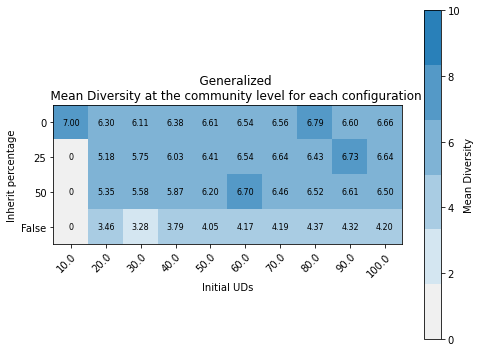

In [40]:
heat_diversity_comm_level(GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs')

#diversity_change_graphs(GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs')
diversity_change_by_row(GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs', limitant=True)

diversity_change_by_column(GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs', limitant=True)

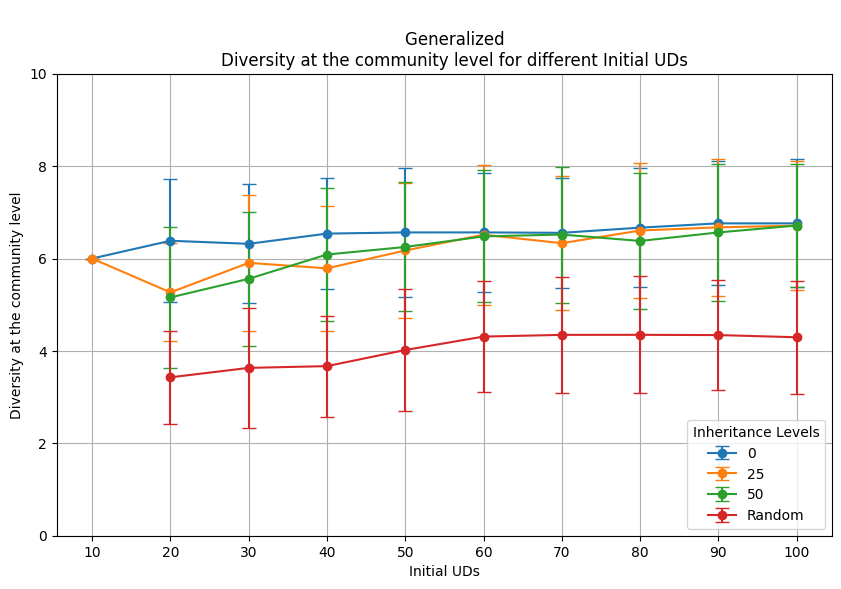

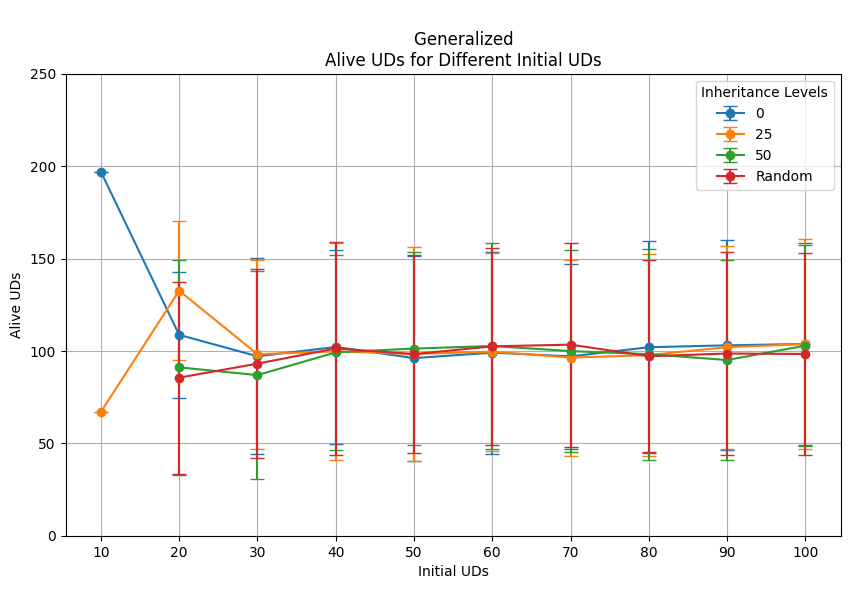

In [28]:
transversal_changes(GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs')
transversal_alive(GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs')

## Pop dynamics

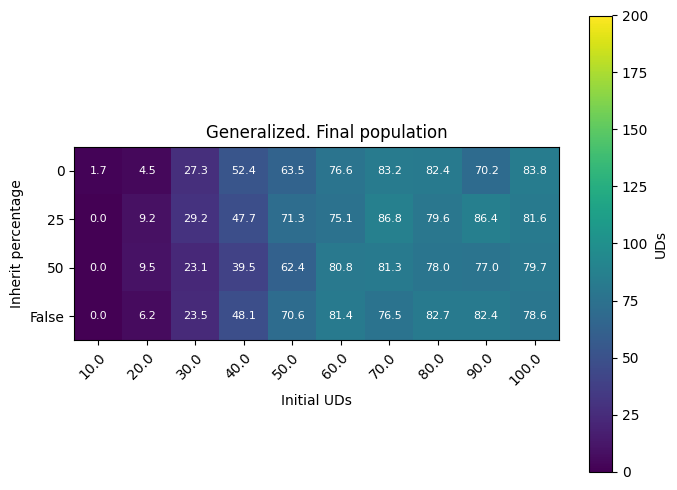

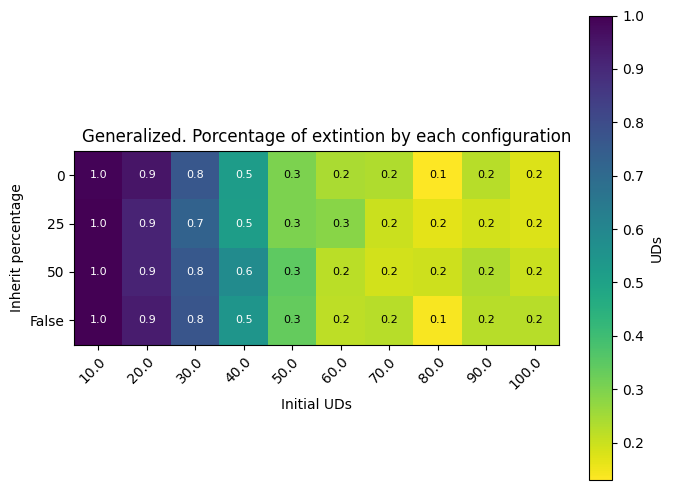

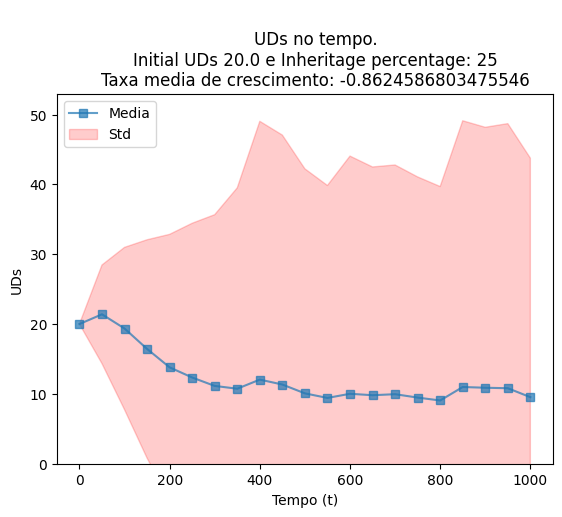

In [13]:
heat_population(GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs')

heat_percentage_population(GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs')

plot_specific_alivegraph(1, 1, GmM_datos, inherits, Gmalphas, 'Generalized', variable='Initial UDs')

## Initial Varieties

Here we try with different values for the initial varieties in the system.
We go from 10 to 100.

In [29]:
# This experiment has different values for Initial varieties VVVV
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
v = 100 # Initial varieties
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
#inherits = ['False'] #Values for inherit
Dvalphas = np.linspace(10,v,int(v/10)) # Initial Varieties: from 10 to v
# For data of behaviour
vM = np.empty((len(inherits), len(Dvalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 300


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, varieties  in enumerate(Dvalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} Initial UDs {m} and Initial varieties {varieties}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            #### Initialization generalized_exchange
            ## Clans
            clans = (list(range(1, 4)) * (m // 3 + 1))[:m] # Just 3 clans
            random.shuffle(clans)
            if inherit != 'False':    
                #### Initialization
                UD_generalized.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_generalized(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_generalized.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(varieties))]
                    for ud in UD_generalized.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_generalized.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_generalized.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_generalized_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_generalized_al_inh(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_generalized_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(varieties))]
                    for ud in UD_generalized_al_inh.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_generalized_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Dvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_generalized_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            vM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            vM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit}, 
  initial UDs {m} and Initial varieties {varieties} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Generalized_Initial_Varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-12 21:03:06.901619
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 10.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 10.0
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 10.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 10.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 10.0
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 10.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 10.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 10.0
experimento 13
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 10.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con unidades 10.0
experimento 17
acabó en 0 el experimento 17 con herencia 0 con unidades 10.0
experimento 18
ac

experimento 173
acabó en 0 el experimento 173 con herencia 0 con unidades 10.0
experimento 174
acabó en 0 el experimento 174 con herencia 0 con unidades 10.0
experimento 175
acabó en 0 el experimento 175 con herencia 0 con unidades 10.0
experimento 176
experimento 177
acabó en 0 el experimento 177 con herencia 0 con unidades 10.0
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 0 con unidades 10.0
experimento 181
acabó en 0 el experimento 181 con herencia 0 con unidades 10.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 0 con unidades 10.0
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia 0 con unidades 10.0
experimento 186
acabó en 0 el experimento 186 con herencia 0 con unidades 10.0
experimento 187
acabó en 0 el experimento 187 con herencia 0 con unidades 10.0
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
acabó en 0 el experimento 193 con 

experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 0 con unidades 20.0
experimento 39
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 0 con unidades 20.0
experimento 43
acabó en 0 el experimento 43 con herencia 0 con unidades 20.0
experimento 44
experimento 45
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 20.0
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 20.0
experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 20.0
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 20.0
experimento 51
acabó en 0 el experimento 51 con herencia 0 con unidades 20.0
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 20.0
experimento 54
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 0 con unidades 20.0
experimento 57
acabó en 0 el experimento 57 con he

acabó en 0 el experimento 219 con herencia 0 con unidades 20.0
experimento 220
experimento 221
experimento 222
experimento 223
acabó en 0 el experimento 223 con herencia 0 con unidades 20.0
experimento 224
acabó en 0 el experimento 224 con herencia 0 con unidades 20.0
experimento 225
acabó en 0 el experimento 225 con herencia 0 con unidades 20.0
experimento 226
experimento 227
experimento 228
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 0 con unidades 20.0
experimento 231
acabó en 0 el experimento 231 con herencia 0 con unidades 20.0
experimento 232
acabó en 0 el experimento 232 con herencia 0 con unidades 20.0
experimento 233
acabó en 0 el experimento 233 con herencia 0 con unidades 20.0
experimento 234
experimento 235
acabó en 0 el experimento 235 con herencia 0 con unidades 20.0
experimento 236
acabó en 0 el experimento 236 con herencia 0 con unidades 20.0
experimento 237
experimento 238
acabó en 0 el experimento 238 con herencia 0 con unidades 20.0
exp

acabó en 0 el experimento 83 con herencia 0 con unidades 30.0
experimento 84
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia 0 con unidades 30.0
experimento 87
experimento 88
experimento 89
acabó en 0 el experimento 89 con herencia 0 con unidades 30.0
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 0 con unidades 30.0
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 0 con unidades 30.0
experimento 94
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 0 con unidades 30.0
experimento 97
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia 0 con unidades 30.0
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 30.0
experimento 103
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 0 con unidades 30.0
experimento 106
acabó en 0 el experimento 106 con herencia 0 con unidades 30.0
experimento 107
experimen

experimento 247
acabó en 0 el experimento 247 con herencia 0 con unidades 30.0
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 0 con unidades 30.0
experimento 250
experimento 251
acabó en 0 el experimento 251 con herencia 0 con unidades 30.0
experimento 252
experimento 253
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 0 con unidades 30.0
experimento 256
acabó en 0 el experimento 256 con herencia 0 con unidades 30.0
experimento 257
experimento 258
acabó en 0 el experimento 258 con herencia 0 con unidades 30.0
experimento 259
acabó en 0 el experimento 259 con herencia 0 con unidades 30.0
experimento 260
acabó en 0 el experimento 260 con herencia 0 con unidades 30.0
experimento 261
experimento 262
experimento 263
experimento 264
experimento 265
acabó en 0 el experimento 265 con herencia 0 con unidades 30.0
experimento 266
acabó en 0 el experimento 266 con herencia 0 con unidades 30.0
experimento 267
experimento 268
experimento 269
ex

acabó en 0 el experimento 121 con herencia 0 con unidades 40.0
experimento 122
experimento 123
acabó en 0 el experimento 123 con herencia 0 con unidades 40.0
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 0 con unidades 40.0
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 40.0
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 40.0
experimento 130
experimento 131
experimento 132
experimento 133
acabó en 0 el experimento 133 con herencia 0 con unidades 40.0
experimento 134
acabó en 0 el experimento 134 con herencia 0 con unidades 40.0
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
acabó en 0 el experimento 141 con herencia 0 con unidades 40.0
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
acabó en 0 el experimento 146 con herencia 0 con unidades 40.0
experimento 147
experimento 148
a

experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 0 con unidades 40.0
experimento 300

The total time of the configuration of inherit percentage 0, 
  initial UDs 40 and Initial varieties 40.0 is  713.3912243843079
        
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 50.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 50.0
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 50.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 50.0
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 50.0
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 0 con unidades 50.0
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 50.0
experimento 14
acabó en 0 el experimento 14 con herencia 0 con unidades 50.0
experimento 15
experimento 16
acabó en 0 el exp

experimento 165
acabó en 0 el experimento 165 con herencia 0 con unidades 50.0
experimento 166
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia 0 con unidades 50.0
experimento 169
acabó en 0 el experimento 169 con herencia 0 con unidades 50.0
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia 0 con unidades 50.0
experimento 172
acabó en 0 el experimento 172 con herencia 0 con unidades 50.0
experimento 173
acabó en 0 el experimento 173 con herencia 0 con unidades 50.0
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
acabó en 0 el experimento 178 con herencia 0 con unidades 50.0
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia 0 con unidades 50.0
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia 0 con unidades 50.0
experimento 183
acabó en 0 el experimento 183 con herencia 0 con unidades 50.0
experimento 184
acabó en 0 el experimento 184 con herencia 0 con u

experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 0 con unidades 60.0
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia 0 con unidades 60.0
experimento 25
experimento 26
acabó en 0 el experimento 26 con herencia 0 con unidades 60.0
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 0 con unidades 60.0
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 0 con unidades 60.0
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 60.0
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 0 con unidades 60.0
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 0 con unidades 60.0
experimento 39
acabó en 0 el experimento 39 con herencia 0 con unidades 60.0
experimento 40
acabó en 0 el experimento 40 con herencia 0 con unidades 60.0
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 0 con un

experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 60.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 60.0
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 0 con unidades 60.0
experimento 207
acabó en 0 el experimento 207 con herencia 0 con unidades 60.0
experimento 208
acabó en 0 el experimento 208 con herencia 0 con unidades 60.0
experimento 209
acabó en 0 el experimento 209 con herencia 0 con unidades 60.0
experimento 210
acabó en 0 el experimento 210 con herencia 0 con unidades 60.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 0 con unidades 60.0
experimento 213
experimento 214
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia 0 con unidades 60.0
experimento 217
acabó en 0 el experimento 217 con herencia 0 con unidades 60.0
experimento 218
experimento 219
acabó en 0 el expe

experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 70.0
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 0 con unidades 70.0
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 0 con unidades 70.0
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 70.0
experimento 80
acabó en 0 el experimento 80 con herencia 0 con unidades 70.0
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 0 con unidades 70.0
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 70.0
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 0 con unidades 70.0
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 0 con unidades 70.0
experimento 88
acabó en 0 el experimento 88 con herencia 0 con unidades 70.0
experimento 89
experimento 90
experimento 91
acabó

experimento 246
acabó en 0 el experimento 246 con herencia 0 con unidades 70.0
experimento 247
acabó en 0 el experimento 247 con herencia 0 con unidades 70.0
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 0 con unidades 70.0
experimento 250
experimento 251
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia 0 con unidades 70.0
experimento 254
experimento 255
experimento 256
acabó en 0 el experimento 256 con herencia 0 con unidades 70.0
experimento 257
experimento 258
experimento 259
acabó en 0 el experimento 259 con herencia 0 con unidades 70.0
experimento 260
acabó en 0 el experimento 260 con herencia 0 con unidades 70.0
experimento 261
acabó en 0 el experimento 261 con herencia 0 con unidades 70.0
experimento 262
experimento 263
experimento 264
acabó en 0 el experimento 264 con herencia 0 con unidades 70.0
experimento 265
experimento 266
experimento 267
acabó en 0 el experimento 267 con herencia 0 con unidades 70.0
experimento 268
ac

experimento 122
acabó en 0 el experimento 122 con herencia 0 con unidades 80.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 0 con unidades 80.0
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 0 con unidades 80.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con unidades 80.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con unidades 80.0
experimento 129
acabó en 0 el experimento 129 con herencia 0 con unidades 80.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con unidades 80.0
experimento 131
experimento 132
acabó en 0 el experimento 132 con herencia 0 con unidades 80.0
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 0 con unidades 80.0
experimento 135
acabó en 0 el experimento 135 con herencia 0 con unidades 80.0
experimento 136
acabó en 0 el experimento 136 con herencia 0 con unidades 80.0
experimento 137
experimento 138
experimento 139
experimento 140
exp

experimento 298
experimento 299
acabó en 0 el experimento 299 con herencia 0 con unidades 80.0
experimento 300

The total time of the configuration of inherit percentage 0, 
  initial UDs 40 and Initial varieties 80.0 is  719.1756296157837
        
Experiments with inheritance 0 Initial UDs 40 and Initial varieties 90.0
experimento 1
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 90.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 90.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 90.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 90.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 90.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 90.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con unidades 90.0
experimento 11
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 0 con u

experimento 173
acabó en 0 el experimento 173 con herencia 0 con unidades 90.0
experimento 174
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia 0 con unidades 90.0
experimento 177
experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia 0 con unidades 90.0
experimento 180
experimento 181
acabó en 0 el experimento 181 con herencia 0 con unidades 90.0
experimento 182
experimento 183
acabó en 0 el experimento 183 con herencia 0 con unidades 90.0
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia 0 con unidades 90.0
experimento 186
acabó en 0 el experimento 186 con herencia 0 con unidades 90.0
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 0 con unidades 90.0
experimento 189
acabó en 0 el experimento 189 con herencia 0 con unidades 90.0
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
acabó en 0 el experimento 197 con

acabó en 0 el experimento 45 con herencia 0 con unidades 100.0
experimento 46
experimento 47
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 100.0
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 100.0
experimento 54
acabó en 0 el experimento 54 con herencia 0 con unidades 100.0
experimento 55
experimento 56
experimento 57
acabó en 0 el experimento 57 con herencia 0 con unidades 100.0
experimento 58
acabó en 0 el experimento 58 con herencia 0 con unidades 100.0
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
acabó en 0 el experimento 63 con herencia 0 con unidades 100.0
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 0 con unidades 100.0
experimento 72
experimento 73
acabó en 0 el experimento 73 con herencia 0 con unidades 100.0
experimento 7

acabó en 0 el experimento 238 con herencia 0 con unidades 100.0
experimento 239
acabó en 0 el experimento 239 con herencia 0 con unidades 100.0
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 0 con unidades 100.0
experimento 242
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 100.0
experimento 245
experimento 246
acabó en 0 el experimento 246 con herencia 0 con unidades 100.0
experimento 247
acabó en 0 el experimento 247 con herencia 0 con unidades 100.0
experimento 248
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 0 con unidades 100.0
experimento 251
acabó en 0 el experimento 251 con herencia 0 con unidades 100.0
experimento 252
acabó en 0 el experimento 252 con herencia 0 con unidades 100.0
experimento 253
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 0 con unidades 100.0
experimento 256
acabó en 0 el experimento 256 con herencia 0 con unidades 100.0
experime

acabó en 0 el experimento 111 con herencia 25 con unidades 10.0
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia 25 con unidades 10.0
experimento 114
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 25 con unidades 10.0
experimento 118
acabó en 0 el experimento 118 con herencia 25 con unidades 10.0
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 25 con unidades 10.0
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 25 con unidades 10.0
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
acabó en 0 el experimento 132 con herencia 25 con unidades 10.0
experimento 133
acabó en 0 el experimento 133 con herencia 25 con unidades 10.0
experimento 134
experimento 135
acabó en 0 el experimento 135 con herencia 25 con unidades 10.0
experimento 136
experimento 137
experime

acabó en 0 el experimento 282 con herencia 25 con unidades 10.0
experimento 283
acabó en 0 el experimento 283 con herencia 25 con unidades 10.0
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
acabó en 0 el experimento 289 con herencia 25 con unidades 10.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia 25 con unidades 10.0
experimento 292
experimento 293
acabó en 0 el experimento 293 con herencia 25 con unidades 10.0
experimento 294
acabó en 0 el experimento 294 con herencia 25 con unidades 10.0
experimento 295
experimento 296
acabó en 0 el experimento 296 con herencia 25 con unidades 10.0
experimento 297
acabó en 0 el experimento 297 con herencia 25 con unidades 10.0
experimento 298
acabó en 0 el experimento 298 con herencia 25 con unidades 10.0
experimento 299
acabó en 0 el experimento 299 con herencia 25 con unidades 10.0
experimento 300

The total time of the configuration of inherit percentage 25, 
  initia

experimento 145
acabó en 0 el experimento 145 con herencia 25 con unidades 20.0
experimento 146
experimento 147
acabó en 0 el experimento 147 con herencia 25 con unidades 20.0
experimento 148
acabó en 0 el experimento 148 con herencia 25 con unidades 20.0
experimento 149
acabó en 0 el experimento 149 con herencia 25 con unidades 20.0
experimento 150
acabó en 0 el experimento 150 con herencia 25 con unidades 20.0
experimento 151
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 20.0
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 20.0
experimento 155
acabó en 0 el experimento 155 con herencia 25 con unidades 20.0
experimento 156
acabó en 0 el experimento 156 con herencia 25 con unidades 20.0
experimento 157
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 20.0
experimento 160
acabó en 0 el experimento 160 con herencia 25 con unidades 20.0
experimento 161
acabó en 0 el experiment

acabó en 0 el experimento 1 con herencia 25 con unidades 30.0
experimento 2
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 25 con unidades 30.0
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 30.0
experimento 11
acabó en 0 el experimento 11 con herencia 25 con unidades 30.0
experimento 12
acabó en 0 el experimento 12 con herencia 25 con unidades 30.0
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia 25 con unidades 30.0
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 25 con unidades 30.0
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 30.0
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 30.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 30.0
experimento 26
acabó

experimento 186
acabó en 0 el experimento 186 con herencia 25 con unidades 30.0
experimento 187
experimento 188
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia 25 con unidades 30.0
experimento 191
acabó en 0 el experimento 191 con herencia 25 con unidades 30.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 25 con unidades 30.0
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 25 con unidades 30.0
experimento 196
acabó en 0 el experimento 196 con herencia 25 con unidades 30.0
experimento 197
acabó en 0 el experimento 197 con herencia 25 con unidades 30.0
experimento 198
acabó en 0 el experimento 198 con herencia 25 con unidades 30.0
experimento 199
experimento 200
acabó en 0 el experimento 200 con herencia 25 con unidades 30.0
experimento 201
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 25 con unidades 30.0
experimento 204
acabó en 0 el experimento 204 con herencia 25 con unidad

experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 25 con unidades 40.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con unidades 40.0
experimento 52
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 25 con unidades 40.0
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 25 con unidades 40.0
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 25 con unidades 40.0
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 40.0
experimento 64
acabó en 0 el experimento 64 con herencia 25 con unidades 40.0
experimento 65
acabó en 0 el experimento 65 con herencia 25 con unidades 40.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 40.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 40.0
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experiment

experimento 230
experimento 231
experimento 232
experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 40.0
experimento 234
experimento 235
acabó en 0 el experimento 235 con herencia 25 con unidades 40.0
experimento 236
acabó en 0 el experimento 236 con herencia 25 con unidades 40.0
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 25 con unidades 40.0
experimento 240
acabó en 0 el experimento 240 con herencia 25 con unidades 40.0
experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia 25 con unidades 40.0
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 25 con unidades 40.0
experimento 245
acabó en 0 el experimento 245 con herencia 25 con unidades 40.0
experimento 246
acabó en 0 el experimento 246 con herencia 25 con unidades 40.0
experimento 247
experimento 248
acabó en 0 el experimento 248 con herencia 25 con unidades 40.0
experimento 249
acabó en 0 el experimento 249 con herenc

experimento 115
acabó en 0 el experimento 115 con herencia 25 con unidades 50.0
experimento 116
acabó en 0 el experimento 116 con herencia 25 con unidades 50.0
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia 25 con unidades 50.0
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 25 con unidades 50.0
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia 25 con unidades 50.0
experimento 123
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia 25 con unidades 50.0
experimento 126
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 25 con unidades 50.0
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 25 con unidades 50.0
experimento 131
acabó en 0 el experimento 131 con herencia 25 con unidades 50.0
experimento 132
acabó en 0 el experimento 132 con herencia 25 con unidades 50.0
experimento 133
acabó en 0 el experimento 133 con herencia 25 con unidad

experimento 280
acabó en 0 el experimento 280 con herencia 25 con unidades 50.0
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
acabó en 0 el experimento 289 con herencia 25 con unidades 50.0
experimento 290
acabó en 0 el experimento 290 con herencia 25 con unidades 50.0
experimento 291
experimento 292
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia 25 con unidades 50.0
experimento 295
acabó en 0 el experimento 295 con herencia 25 con unidades 50.0
experimento 296
acabó en 0 el experimento 296 con herencia 25 con unidades 50.0
experimento 297
acabó en 0 el experimento 297 con herencia 25 con unidades 50.0
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia 25 con unidades 50.0

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Initial varieties 50.0 is  736.0402989387512
        
Experiments w

experimento 157
acabó en 0 el experimento 157 con herencia 25 con unidades 60.0
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
acabó en 0 el experimento 162 con herencia 25 con unidades 60.0
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 60.0
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia 25 con unidades 60.0
experimento 166
acabó en 0 el experimento 166 con herencia 25 con unidades 60.0
experimento 167
experimento 168
experimento 169
acabó en 0 el experimento 169 con herencia 25 con unidades 60.0
experimento 170
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia 25 con unidades 60.0
experimento 173
acabó en 0 el experimento 173 con herencia 25 con unidades 60.0
experimento 174
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia 25 con unidades 60.0
experimento 177
acabó en 0 el experimento 177 con herencia 25 con unidades 60.0
experimento 178
acabó en

acabó en 0 el experimento 19 con herencia 25 con unidades 70.0
experimento 20
acabó en 0 el experimento 20 con herencia 25 con unidades 70.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 70.0
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 70.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 70.0
experimento 26
experimento 27
acabó en 0 el experimento 27 con herencia 25 con unidades 70.0
experimento 28
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia 25 con unidades 70.0
experimento 31
acabó en 0 el experimento 31 con herencia 25 con unidades 70.0
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 70.0
experimento 37
acabó en 0 el experimento 37 con herencia 25 con unidades 70.0
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 70.0
experimento 39
experim

acabó en 0 el experimento 195 con herencia 25 con unidades 70.0
experimento 196
acabó en 0 el experimento 196 con herencia 25 con unidades 70.0
experimento 197
acabó en 0 el experimento 197 con herencia 25 con unidades 70.0
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia 25 con unidades 70.0
experimento 203
acabó en 0 el experimento 203 con herencia 25 con unidades 70.0
experimento 204
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia 25 con unidades 70.0
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 25 con unidades 70.0
experimento 209
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia 25 con unidades 70.0
experimento 212
acabó en 0 el experimento 212 con herencia 25 con unidades 70.0
experimento 213
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia 25 con unidades 70.0
experimento 216
acabó en 0 el experiment

acabó en 0 el experimento 62 con herencia 25 con unidades 80.0
experimento 63
acabó en 0 el experimento 63 con herencia 25 con unidades 80.0
experimento 64
experimento 65
experimento 66
acabó en 0 el experimento 66 con herencia 25 con unidades 80.0
experimento 67
acabó en 0 el experimento 67 con herencia 25 con unidades 80.0
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia 25 con unidades 80.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con unidades 80.0
experimento 71
acabó en 0 el experimento 71 con herencia 25 con unidades 80.0
experimento 72
acabó en 0 el experimento 72 con herencia 25 con unidades 80.0
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 25 con unidades 80.0
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 25 con unidades 80.0
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
acabó en 0

experimento 238
experimento 239
experimento 240
acabó en 0 el experimento 240 con herencia 25 con unidades 80.0
experimento 241
acabó en 0 el experimento 241 con herencia 25 con unidades 80.0
experimento 242
acabó en 0 el experimento 242 con herencia 25 con unidades 80.0
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 25 con unidades 80.0
experimento 245
experimento 246
acabó en 0 el experimento 246 con herencia 25 con unidades 80.0
experimento 247
experimento 248
acabó en 0 el experimento 248 con herencia 25 con unidades 80.0
experimento 249
acabó en 0 el experimento 249 con herencia 25 con unidades 80.0
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
acabó en 0 el experimento 258 con herencia 25 con unidades 80.0
experimento 259
acabó en 0 el experimento 259 con herencia 25 con unidades 80.0
experimento 260
experimento 261
experimento 262
experimento 263
acabó en

acabó en 0 el experimento 110 con herencia 25 con unidades 90.0
experimento 111
acabó en 0 el experimento 111 con herencia 25 con unidades 90.0
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 25 con unidades 90.0
experimento 115
acabó en 0 el experimento 115 con herencia 25 con unidades 90.0
experimento 116
acabó en 0 el experimento 116 con herencia 25 con unidades 90.0
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 25 con unidades 90.0
experimento 120
acabó en 0 el experimento 120 con herencia 25 con unidades 90.0
experimento 121
acabó en 0 el experimento 121 con herencia 25 con unidades 90.0
experimento 122
acabó en 0 el experimento 122 con herencia 25 con unidades 90.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 25 con unidades 90.0
experimento 125
experimento 126
acabó en 0 el experimento 126 con herencia 25 con unidades 90.0
experimento 127
experimento 128
acabó en

experimento 282
acabó en 0 el experimento 282 con herencia 25 con unidades 90.0
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
acabó en 0 el experimento 290 con herencia 25 con unidades 90.0
experimento 291
acabó en 0 el experimento 291 con herencia 25 con unidades 90.0
experimento 292
acabó en 0 el experimento 292 con herencia 25 con unidades 90.0
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia 25 con unidades 90.0
experimento 295
acabó en 0 el experimento 295 con herencia 25 con unidades 90.0
experimento 296
acabó en 0 el experimento 296 con herencia 25 con unidades 90.0
experimento 297
acabó en 0 el experimento 297 con herencia 25 con unidades 90.0
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia 25 con unidades 90.0

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Initial varieties 90.0 is  688.5311

experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 25 con unidades 100.0
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 100.0
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia 25 con unidades 100.0
experimento 156
acabó en 0 el experimento 156 con herencia 25 con unidades 100.0
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 100.0
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 100.0
experimento 160
experimento 161
acabó en 0 el experimento 161 con herencia 25 con unidades 100.0
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 100.0
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia 25 con unidades 100.0
experimento 166
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia 25 con unidades 100.0
experimento 169
acabó en 0 el experimento 169 con herencia 25 

acabó en 0 el experimento 29 con herencia 50 con unidades 10.0
experimento 30
acabó en 0 el experimento 30 con herencia 50 con unidades 10.0
experimento 31
acabó en 0 el experimento 31 con herencia 50 con unidades 10.0
experimento 32
acabó en 0 el experimento 32 con herencia 50 con unidades 10.0
experimento 33
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 50 con unidades 10.0
experimento 37
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia 50 con unidades 10.0
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 50 con unidades 10.0
experimento 43
acabó en 0 el experimento 43 con herencia 50 con unidades 10.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
acabó en 0 el experimento 48 con herencia 50 con unidades 10.0
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 50 con unidades 10.0
experiment

acabó en 0 el experimento 202 con herencia 50 con unidades 10.0
experimento 203
acabó en 0 el experimento 203 con herencia 50 con unidades 10.0
experimento 204
acabó en 0 el experimento 204 con herencia 50 con unidades 10.0
experimento 205
acabó en 0 el experimento 205 con herencia 50 con unidades 10.0
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 50 con unidades 10.0
experimento 208
acabó en 0 el experimento 208 con herencia 50 con unidades 10.0
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia 50 con unidades 10.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 50 con unidades 10.0
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 50 con unidades 10.0
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia 50 con unidades 10.0
experimento 217
acabó en 0 el experimento 217 con herencia 50 con unidades 10.0
experimento 218
experimento 219
experimento 220
acabó en

experimento 65
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 20.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 20.0
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 20.0
experimento 72
acabó en 0 el experimento 72 con herencia 50 con unidades 20.0
experimento 73
acabó en 0 el experimento 73 con herencia 50 con unidades 20.0
experimento 74
experimento 75
acabó en 0 el experimento 75 con herencia 50 con unidades 20.0
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 50 con unidades 20.0
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
acabó en 0 el experimento 84 con herencia 50 con unidades 20.0
experimento 85
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 50 con unidades 20.0
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 5

experimento 244
acabó en 0 el experimento 244 con herencia 50 con unidades 20.0
experimento 245
experimento 246
experimento 247
acabó en 0 el experimento 247 con herencia 50 con unidades 20.0
experimento 248
acabó en 0 el experimento 248 con herencia 50 con unidades 20.0
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 50 con unidades 20.0
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
acabó en 0 el experimento 256 con herencia 50 con unidades 20.0
experimento 257
acabó en 0 el experimento 257 con herencia 50 con unidades 20.0
experimento 258
acabó en 0 el experimento 258 con herencia 50 con unidades 20.0
experimento 259
experimento 260
experimento 261
acabó en 0 el experimento 261 con herencia 50 con unidades 20.0
experimento 262
acabó en 0 el experimento 262 con herencia 50 con unidades 20.0
experimento 263
experimento 264
experimento 265
experimento 266
acabó en 0 el experimento 266 con herencia 50 con unidad

experimento 116
acabó en 0 el experimento 116 con herencia 50 con unidades 30.0
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 30.0
experimento 120
acabó en 0 el experimento 120 con herencia 50 con unidades 30.0
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 30.0
experimento 123
acabó en 0 el experimento 123 con herencia 50 con unidades 30.0
experimento 124
acabó en 0 el experimento 124 con herencia 50 con unidades 30.0
experimento 125
acabó en 0 el experimento 125 con herencia 50 con unidades 30.0
experimento 126
acabó en 0 el experimento 126 con herencia 50 con unidades 30.0
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia 50 con unidades 30.0
experimento 129
acabó en 0 el experimento 129 con herencia 50 con unidades 30.0
experimento 130
acabó en 0 el experimento 130 con herencia 50 con unidades 30.0
experimento 131
acabó en 0 el experimento 131 con herenc

experimento 261
acabó en 0 el experimento 261 con herencia 50 con unidades 30.0
experimento 262
acabó en 0 el experimento 262 con herencia 50 con unidades 30.0
experimento 263
experimento 264
acabó en 0 el experimento 264 con herencia 50 con unidades 30.0
experimento 265
acabó en 0 el experimento 265 con herencia 50 con unidades 30.0
experimento 266
acabó en 0 el experimento 266 con herencia 50 con unidades 30.0
experimento 267
experimento 268
acabó en 0 el experimento 268 con herencia 50 con unidades 30.0
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 30.0
experimento 270
experimento 271
experimento 272
experimento 273
experimento 274
acabó en 0 el experimento 274 con herencia 50 con unidades 30.0
experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 30.0
experimento 276
acabó en 0 el experimento 276 con herencia 50 con unidades 30.0
experimento 277
experimento 278
acabó en 0 el experimento 278 con herencia 50 con unidades 30.0
experime

experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 50 con unidades 40.0
experimento 131
acabó en 0 el experimento 131 con herencia 50 con unidades 40.0
experimento 132
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 50 con unidades 40.0
experimento 135
acabó en 0 el experimento 135 con herencia 50 con unidades 40.0
experimento 136
acabó en 0 el experimento 136 con herencia 50 con unidades 40.0
experimento 137
acabó en 0 el experimento 137 con herencia 50 con unidades 40.0
experimento 138
acabó en 0 el experimento 138 con herencia 50 con unidades 40.0
experimento 139
acabó en 0 el experimento 139 con herencia 50 con unidades 40.0
experimento 140
experimento 141
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 40.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 40.0
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experime

experimento 295
acabó en 0 el experimento 295 con herencia 50 con unidades 40.0
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia 50 con unidades 40.0
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia 50 con unidades 40.0

The total time of the configuration of inherit percentage 50, 
  initial UDs 40 and Initial varieties 40.0 is  724.7088408470154
        
Experiments with inheritance 50 Initial UDs 40 and Initial varieties 50.0
experimento 1
acabó en 0 el experimento 1 con herencia 50 con unidades 50.0
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 50 con unidades 50.0
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia 50 con unidades 50.0
experimento 6
acabó en 0 el experimento 6 con herencia 50 con unidades 50.0
experimento 7
experimento 8
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 50.0
experimento 11
acabó en 0 el experimento 11 con

acabó en 0 el experimento 171 con herencia 50 con unidades 50.0
experimento 172
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 50 con unidades 50.0
experimento 175
acabó en 0 el experimento 175 con herencia 50 con unidades 50.0
experimento 176
acabó en 0 el experimento 176 con herencia 50 con unidades 50.0
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
acabó en 0 el experimento 182 con herencia 50 con unidades 50.0
experimento 183
acabó en 0 el experimento 183 con herencia 50 con unidades 50.0
experimento 184
experimento 185
acabó en 0 el experimento 185 con herencia 50 con unidades 50.0
experimento 186
acabó en 0 el experimento 186 con herencia 50 con unidades 50.0
experimento 187
experimento 188
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia 50 con unidades 50.0
experimento 191
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 50 con unidades 50.0
experime

experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 50 con unidades 60.0
experimento 39
acabó en 0 el experimento 39 con herencia 50 con unidades 60.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 50 con unidades 60.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 50 con unidades 60.0
experimento 44
acabó en 0 el experimento 44 con herencia 50 con unidades 60.0
experimento 45
acabó en 0 el experimento 45 con herencia 50 con unidades 60.0
experimento 46
acabó en 0 el experimento 46 con herencia 50 con unidades 60.0
experimento 47
acabó en 0 el experimento 47 con herencia 50 con unidades 60.0
experimento 48
acabó en 0 el experimento 48 con herencia 50 con unidades 60.0
experimento 49
experimento 50
acabó en 0 el experimento 50 con herencia 50 con unidades 60.0
experimento 51
acabó en 0 el experimento 51 con herencia 50 con unidades 60.0
experimento 52
acabó en 0 el experimento 52 con herencia 50 con uni

experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 50 con unidades 60.0
experimento 200
acabó en 0 el experimento 200 con herencia 50 con unidades 60.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia 50 con unidades 60.0
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia 50 con unidades 60.0
experimento 205
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 50 con unidades 60.0
experimento 208
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia 50 con unidades 60.0
experimento 211
acabó en 0 el experimento 211 con herencia 50 con unidades 60.0
experimento 212
experimento 213
acabó en 0 el experimento 213 con herencia 50 con unidades 60.0
experimento 214
acabó en 0 el experimento 214 con herencia 50 con unidades 60.0
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia 50 con unidades 60.0
experimento 217
experimento 218
acabó en 0 el experiment

experimento 64
acabó en 0 el experimento 64 con herencia 50 con unidades 70.0
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 70.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 70.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 70.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 70.0
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 70.0
experimento 70
acabó en 0 el experimento 70 con herencia 50 con unidades 70.0
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 70.0
experimento 72
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia 50 con unidades 70.0
experimento 75
acabó en 0 el experimento 75 con herencia 50 con unidades 70.0
experimento 76
experimento 77
experimento 78
acabó en 0 el experimento 78 con herencia 50 con unidades 70.0
experimento 79
acabó en 0 el experimento 79 con herencia 50 con unidades 70.0
expe

experimento 221
acabó en 0 el experimento 221 con herencia 50 con unidades 70.0
experimento 222
experimento 223
experimento 224
acabó en 0 el experimento 224 con herencia 50 con unidades 70.0
experimento 225
experimento 226
acabó en 0 el experimento 226 con herencia 50 con unidades 70.0
experimento 227
experimento 228
experimento 229
acabó en 0 el experimento 229 con herencia 50 con unidades 70.0
experimento 230
experimento 231
experimento 232
experimento 233
acabó en 0 el experimento 233 con herencia 50 con unidades 70.0
experimento 234
acabó en 0 el experimento 234 con herencia 50 con unidades 70.0
experimento 235
experimento 236
experimento 237
acabó en 0 el experimento 237 con herencia 50 con unidades 70.0
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 50 con unidades 70.0
experimento 240
acabó en 0 el experimento 240 con herencia 50 con unidades 70.0
experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia 50 con unidades 70.0
experime

experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 50 con unidades 80.0
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia 50 con unidades 80.0
experimento 96
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 50 con unidades 80.0
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 80.0
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 80.0
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia 50 con unidades 80.0
experimento 111
acabó en 0 el experimento 111 con herencia 50 con unidades 80.0
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 50 con unidades 80.0
experimento 115
acabó en 0 el experimento 115 con herencia 50 con unidades 80.0
experi

experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 80.0
experimento 276
acabó en 0 el experimento 276 con herencia 50 con unidades 80.0
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 80.0
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia 50 con unidades 80.0
experimento 280
experimento 281
experimento 282
experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 80.0
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 80.0
experimento 285
experimento 286
acabó en 0 el experimento 286 con herencia 50 con unidades 80.0
experimento 287
acabó en 0 el experimento 287 con herencia 50 con unidades 80.0
experimento 288
acabó en 0 el experimento 288 con herencia 50 con unidades 80.0
experimento 289
acabó en 0 el experimento 289 con herencia 50 con unidades 80.0
experimento 290
experimento 291
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidades 80.0
experime

experimento 141
experimento 142
acabó en 0 el experimento 142 con herencia 50 con unidades 90.0
experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 90.0
experimento 144
experimento 145
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 90.0
experimento 147
acabó en 0 el experimento 147 con herencia 50 con unidades 90.0
experimento 148
acabó en 0 el experimento 148 con herencia 50 con unidades 90.0
experimento 149
acabó en 0 el experimento 149 con herencia 50 con unidades 90.0
experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 90.0
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 90.0
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 50 con unidades 90.0
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia 50 con unidades 90.0
experimento 156
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia 50 con unidades 90.0
experime

experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 50 con unidades 100.0
experimento 8
experimento 9
experimento 10
experimento 11
acabó en 0 el experimento 11 con herencia 50 con unidades 100.0
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 100.0
experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 50 con unidades 100.0
experimento 19
acabó en 0 el experimento 19 con herencia 50 con unidades 100.0
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 100.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 100.0
experimento 23
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 50 con unidades 100.0
experimento 26
acabó en 0 el experimento 26 con herencia 50 con unidades 100.0
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
acabó en 0 el experimento 31 con herenc

acabó en 0 el experimento 187 con herencia 50 con unidades 100.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia 50 con unidades 100.0
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
acabó en 0 el experimento 195 con herencia 50 con unidades 100.0
experimento 196
experimento 197
acabó en 0 el experimento 197 con herencia 50 con unidades 100.0
experimento 198
acabó en 0 el experimento 198 con herencia 50 con unidades 100.0
experimento 199
acabó en 0 el experimento 199 con herencia 50 con unidades 100.0
experimento 200
acabó en 0 el experimento 200 con herencia 50 con unidades 100.0
experimento 201
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 50 con unidades 100.0
experimento 204
acabó en 0 el experimento 204 con herencia 50 con unidades 100.0
experimento 205
acabó en 0 el experimento 205 con herencia 50 con unidades 100.0
experimento 206
acabó en 0 el experimento 206 con herencia 50 

experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 10.0
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia False con unidades 10.0
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia False con unidades 10.0
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia False con unidades 10.0
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia False con unidades 10.0
experimento 60
acabó en 0 el experimento 60 con herencia False con unidades 10.0
experimento 61
experimento 62
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia False con unidades 10.0
experimento 65
acabó en 0 el experimento 65 con herencia False con unidades 10.0
experimento 66
experimento 67
experimento 68
acabó en 0 el experimento 68 con herencia False con unidades 10.0
experimento 69
acabó en 0 el experimento 69 con herencia False con unidades 10.0
experimento 70
acabó en 0 el experimento

experimento 220
acabó en 0 el experimento 220 con herencia False con unidades 10.0
experimento 221
acabó en 0 el experimento 221 con herencia False con unidades 10.0
experimento 222
acabó en 0 el experimento 222 con herencia False con unidades 10.0
experimento 223
acabó en 0 el experimento 223 con herencia False con unidades 10.0
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia False con unidades 10.0
experimento 226
experimento 227
acabó en 0 el experimento 227 con herencia False con unidades 10.0
experimento 228
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia False con unidades 10.0
experimento 231
experimento 232
acabó en 0 el experimento 232 con herencia False con unidades 10.0
experimento 233
experimento 234
experimento 235
acabó en 0 el experimento 235 con herencia False con unidades 10.0
experimento 236
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia False con unidades 10.0
experiment

acabó en 0 el experimento 74 con herencia False con unidades 20.0
experimento 75
acabó en 0 el experimento 75 con herencia False con unidades 20.0
experimento 76
acabó en 0 el experimento 76 con herencia False con unidades 20.0
experimento 77
acabó en 0 el experimento 77 con herencia False con unidades 20.0
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia False con unidades 20.0
experimento 80
acabó en 0 el experimento 80 con herencia False con unidades 20.0
experimento 81
acabó en 0 el experimento 81 con herencia False con unidades 20.0
experimento 82
acabó en 0 el experimento 82 con herencia False con unidades 20.0
experimento 83
acabó en 0 el experimento 83 con herencia False con unidades 20.0
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia False con unidades 20.0
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia False con unidades 20.0
experimento 91
acabó en 0 el exper

experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia False con unidades 20.0
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia False con unidades 20.0
experimento 245
acabó en 0 el experimento 245 con herencia False con unidades 20.0
experimento 246
experimento 247
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia False con unidades 20.0
experimento 250
acabó en 0 el experimento 250 con herencia False con unidades 20.0
experimento 251
acabó en 0 el experimento 251 con herencia False con unidades 20.0
experimento 252
acabó en 0 el experimento 252 con herencia False con unidades 20.0
experimento 253
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia False con unidades 20.0
experimento 256
experimento 257
experimento 258
acabó en 0 el experimento 258 con herencia False con unidades 20.0
experimento 259
acabó en 0 el experimento 259 con herencia False con unidades 20.0
experimento 260
experiment

experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia False con unidades 30.0
experimento 118
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia False con unidades 30.0
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia False con unidades 30.0
experimento 123
experimento 124
experimento 125
acabó en 0 el experimento 125 con herencia False con unidades 30.0
experimento 126
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia False con unidades 30.0
experimento 130
experimento 131
experimento 132
acabó en 0 el experimento 132 con herencia False con unidades 30.0
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia False con unidades 30.0
experimento 135
acabó en 0 el experimento 135 con herencia False con unidades 30.0
experimento 136
acabó en 0 el experimento 136 con herencia False con unidades 30.0
experimento 137
experimento 138
acabó en 0 el

experimento 289
experimento 290
acabó en 0 el experimento 290 con herencia False con unidades 30.0
experimento 291
acabó en 0 el experimento 291 con herencia False con unidades 30.0
experimento 292
acabó en 0 el experimento 292 con herencia False con unidades 30.0
experimento 293
acabó en 0 el experimento 293 con herencia False con unidades 30.0
experimento 294
acabó en 0 el experimento 294 con herencia False con unidades 30.0
experimento 295
acabó en 0 el experimento 295 con herencia False con unidades 30.0
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia False con unidades 30.0
experimento 298
acabó en 0 el experimento 298 con herencia False con unidades 30.0
experimento 299
acabó en 0 el experimento 299 con herencia False con unidades 30.0
experimento 300

The total time of the configuration of inherit percentage False, 
  initial UDs 40 and Initial varieties 30.0 is  756.2587506771088
        
Experiments with inheritance False Initial UDs 40 and Initial v

acabó en 0 el experimento 150 con herencia False con unidades 40.0
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia False con unidades 40.0
experimento 153
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia False con unidades 40.0
experimento 156
acabó en 0 el experimento 156 con herencia False con unidades 40.0
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia False con unidades 40.0
experimento 159
acabó en 0 el experimento 159 con herencia False con unidades 40.0
experimento 160
experimento 161
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia False con unidades 40.0
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia False con unidades 40.0
experimento 166
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 40.0
experimento 168
experimento 169
experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 40.0
experiment

experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia False con unidades 50.0
experimento 15
acabó en 0 el experimento 15 con herencia False con unidades 50.0
experimento 16
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 50.0
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 50.0
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 50.0
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 50.0
experimento 23
experimento 24
acabó en 0 el experimento 24 con herencia False con unidades 50.0
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 50.0
experimento 33
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 50.0
e

experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 50.0
experimento 191
experimento 192
experimento 193
experimento 194
acabó en 0 el experimento 194 con herencia False con unidades 50.0
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 50.0
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 50.0
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 50.0
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 50.0
experimento 202
experimento 203
experimento 204
experimento 205
acabó en 0 el experimento 205 con herencia False con unidades 50.0
experimento 206
acabó en 0 el experimento 206 con herencia False con unidades 50.0
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia False con unidades 50.0
experimento 2

acabó en 0 el experimento 55 con herencia False con unidades 60.0
experimento 56
acabó en 0 el experimento 56 con herencia False con unidades 60.0
experimento 57
acabó en 0 el experimento 57 con herencia False con unidades 60.0
experimento 58
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia False con unidades 60.0
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia False con unidades 60.0
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia False con unidades 60.0
experimento 68
acabó en 0 el experimento 68 con herencia False con unidades 60.0
experimento 69
acabó en 0 el experimento 69 con herencia False con unidades 60.0
experimento 70
acabó en 0 el experimento 70 con herencia False con unidades 60.0
experimento 71
acabó en 0 el experimento 71 con herencia False con unidades 60.0
experimento 72
experimento 73
experimento 74
experimento 75
acabó en 0 el experimento 75 con herenci

experimento 217
experimento 218
experimento 219
acabó en 0 el experimento 219 con herencia False con unidades 60.0
experimento 220
experimento 221
acabó en 0 el experimento 221 con herencia False con unidades 60.0
experimento 222
acabó en 0 el experimento 222 con herencia False con unidades 60.0
experimento 223
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia False con unidades 60.0
experimento 226
acabó en 0 el experimento 226 con herencia False con unidades 60.0
experimento 227
acabó en 0 el experimento 227 con herencia False con unidades 60.0
experimento 228
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia False con unidades 60.0
experimento 231
experimento 232
experimento 233
experimento 234
experimento 235
experimento 236
experimento 237
experimento 238
experimento 239
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia False con unidades 60.0
experimento 242
experimento 243
acabó en 0 el experimento 243 co

experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia False con unidades 70.0
experimento 87
experimento 88
acabó en 0 el experimento 88 con herencia False con unidades 70.0
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia False con unidades 70.0
experimento 91
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia False con unidades 70.0
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia False con unidades 70.0
experimento 96
experimento 97
experimento 98
experimento 99
acabó en 0 el experimento 99 con herencia False con unidades 70.0
experimento 100
acabó en 0 el experimento 100 con herencia False con unidades 70.0
experimento 101
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 70.0
experimento 105
acabó en 0 el experimento 105 con herencia False con unidades 70.0
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia False c

experimento 260
acabó en 0 el experimento 260 con herencia False con unidades 70.0
experimento 261
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia False con unidades 70.0
experimento 264
acabó en 0 el experimento 264 con herencia False con unidades 70.0
experimento 265
acabó en 0 el experimento 265 con herencia False con unidades 70.0
experimento 266
acabó en 0 el experimento 266 con herencia False con unidades 70.0
experimento 267
experimento 268
acabó en 0 el experimento 268 con herencia False con unidades 70.0
experimento 269
acabó en 0 el experimento 269 con herencia False con unidades 70.0
experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia False con unidades 70.0
experimento 272
experimento 273
acabó en 0 el experimento 273 con herencia False con unidades 70.0
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia False con unidades 70.0
experimento 276
acabó en 0 el experimento 276 con herencia False con unida

experimento 127
acabó en 0 el experimento 127 con herencia False con unidades 80.0
experimento 128
acabó en 0 el experimento 128 con herencia False con unidades 80.0
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia False con unidades 80.0
experimento 131
experimento 132
acabó en 0 el experimento 132 con herencia False con unidades 80.0
experimento 133
acabó en 0 el experimento 133 con herencia False con unidades 80.0
experimento 134
experimento 135
experimento 136
acabó en 0 el experimento 136 con herencia False con unidades 80.0
experimento 137
acabó en 0 el experimento 137 con herencia False con unidades 80.0
experimento 138
experimento 139
acabó en 0 el experimento 139 con herencia False con unidades 80.0
experimento 140
acabó en 0 el experimento 140 con herencia False con unidades 80.0
experimento 141
acabó en 0 el experimento 141 con herencia False con unidades 80.0
experimento 142
acabó en 0 el experimento 142 con herencia False con unidades 80.0
experim

acabó en 0 el experimento 289 con herencia False con unidades 80.0
experimento 290
acabó en 0 el experimento 290 con herencia False con unidades 80.0
experimento 291
acabó en 0 el experimento 291 con herencia False con unidades 80.0
experimento 292
acabó en 0 el experimento 292 con herencia False con unidades 80.0
experimento 293
acabó en 0 el experimento 293 con herencia False con unidades 80.0
experimento 294
experimento 295
acabó en 0 el experimento 295 con herencia False con unidades 80.0
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia False con unidades 80.0
experimento 298
acabó en 0 el experimento 298 con herencia False con unidades 80.0
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia False con unidades 80.0

The total time of the configuration of inherit percentage False, 
  initial UDs 40 and Initial varieties 80.0 is  709.2939991950989
        
Experiments with inheritance False Initial UDs 40 and Initial varieties 90.0
ex

acabó en 0 el experimento 155 con herencia False con unidades 90.0
experimento 156
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia False con unidades 90.0
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia False con unidades 90.0
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 90.0
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 90.0
experimento 169
experimento 170
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia False con unidades 90.0
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 90.0
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 90.0
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
acabó en 0 el experimento 180 con herencia False con unidades 90

experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 100.0
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia False con unidades 100.0
experimento 33
acabó en 0 el experimento 33 con herencia False con unidades 100.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia False con unidades 100.0
experimento 36
acabó en 0 el experimento 36 con herencia False con unidades 100.0
experimento 37
acabó en 0 el experimento 37 con herencia False con unidades 100.0
experimento 38
experimento 39
acabó en 0 el experimento 39 con herencia False con unidades 100.0
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 100.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 100.0
experimento 43
acabó en 0 el experimento 43 con herencia False con unidades 100.0
experimento 44
experimento 45
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades

acabó en 0 el experimento 187 con herencia False con unidades 100.0
experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 100.0
experimento 189
acabó en 0 el experimento 189 con herencia False con unidades 100.0
experimento 190
acabó en 0 el experimento 190 con herencia False con unidades 100.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia False con unidades 100.0
experimento 193
experimento 194
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 100.0
experimento 197
acabó en 0 el experimento 197 con herencia False con unidades 100.0
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 100.0
experimento 200
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 100.0
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 100.0
experimento 203
acabó en 0 el experimento 203 con herencia False con unidades 10

In [30]:
# Dowload the documents
#As a reference
v = 100
inherits = [0,25,50, 'False']#Values for inherit
# inherits = [0, 'False'] #Values for inherit
Dvalphas = np.linspace(10,v,int(v/10)) # Initial UDs: from 10 to m
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Generalized_Initial_Varieties.npy')
## heatmap and mean
DvM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

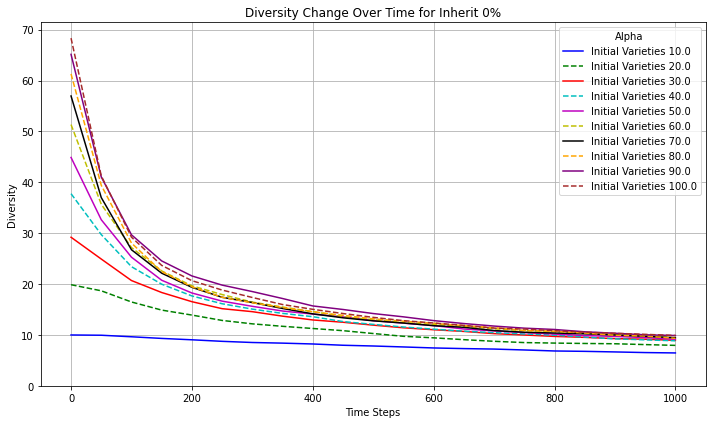

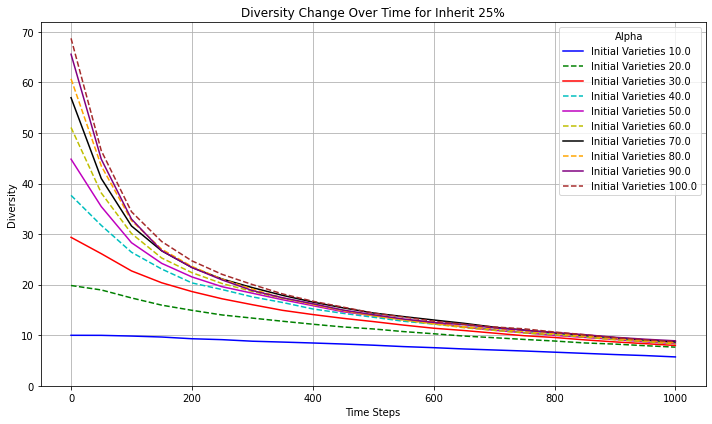

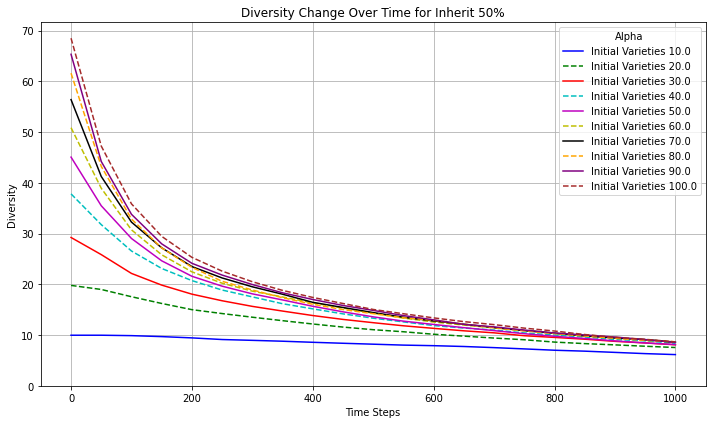

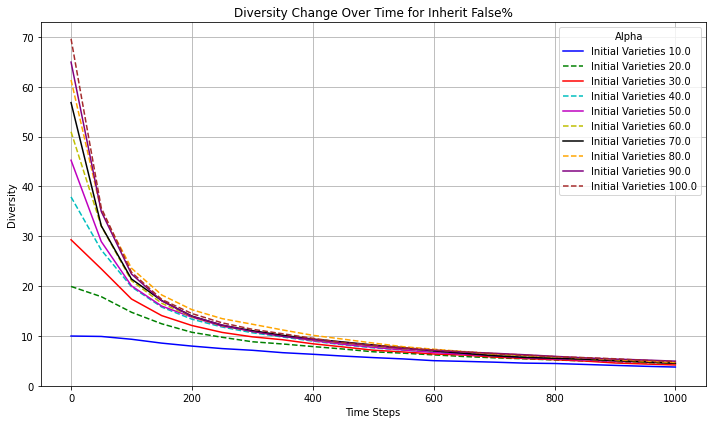

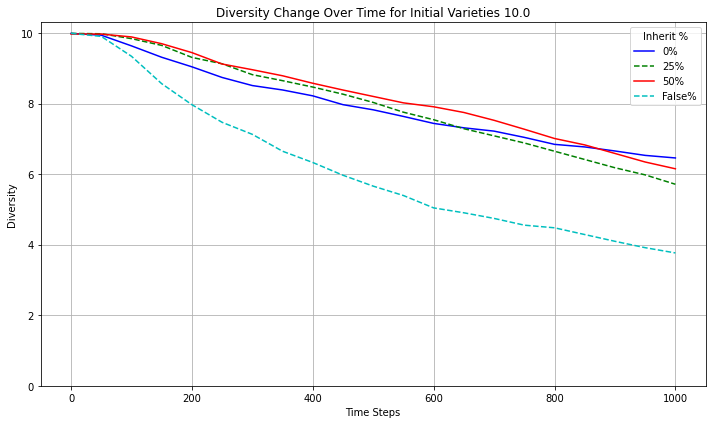

...

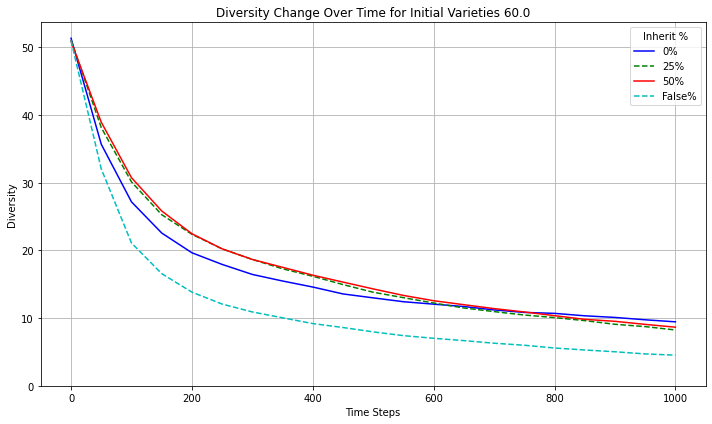

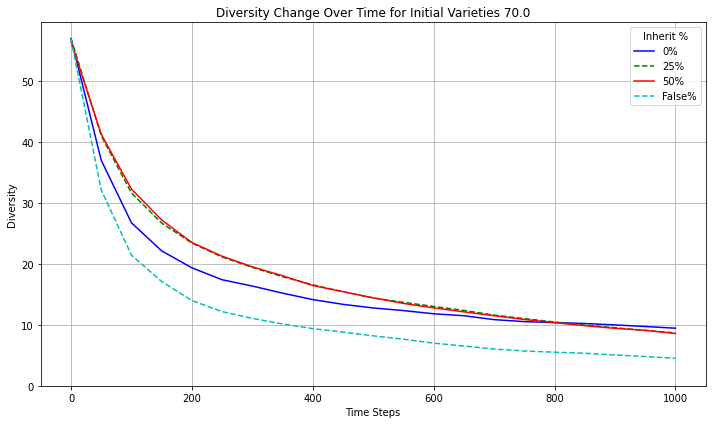

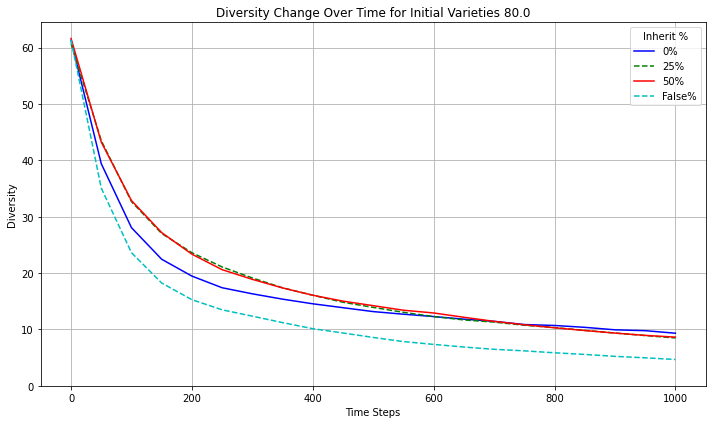

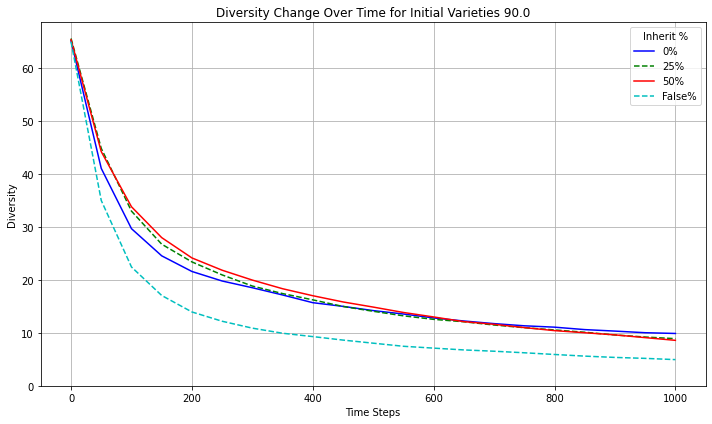

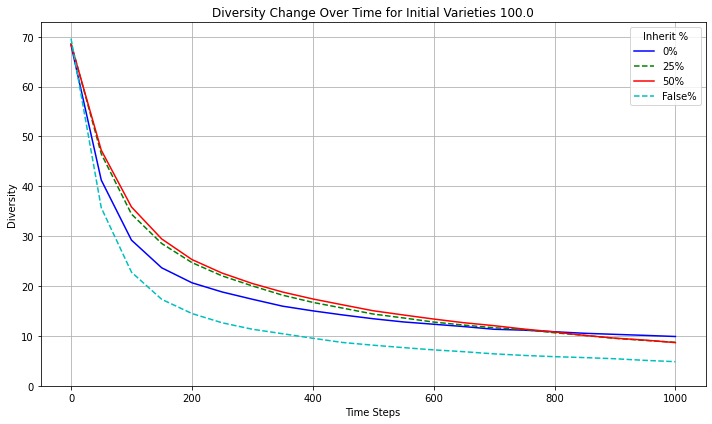

In [38]:
#heat_diversity_comm_level(DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial Varieties')
#diversity_change_graphs(DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial Varieties', limitant = True)
#diversity_change_by_row(DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial Varieties', limitant = True)
#diversity_change_by_column(DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial Varieties', limitant = True)

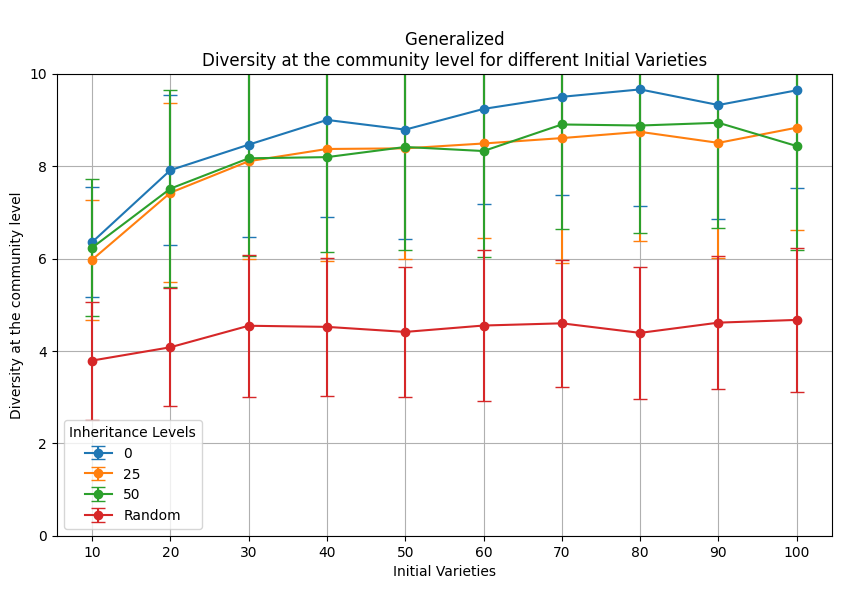

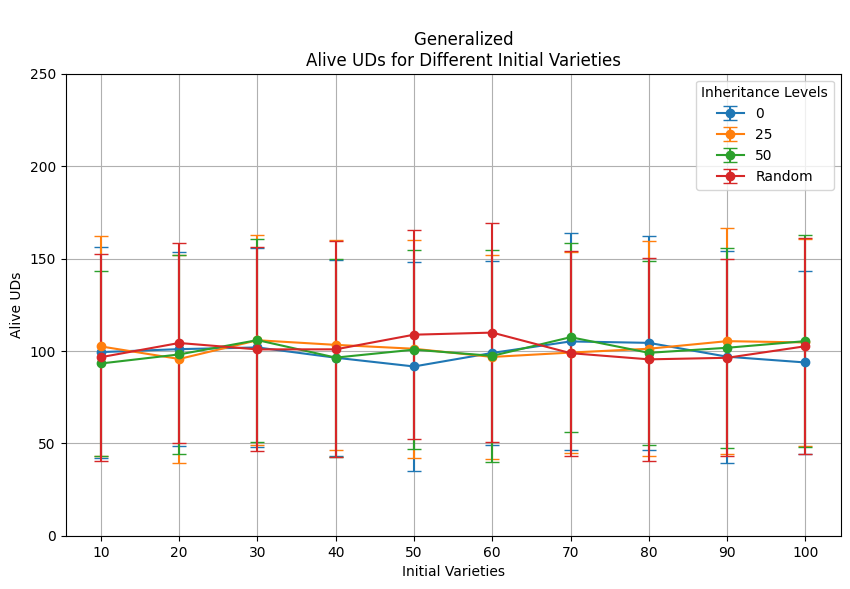

In [31]:
transversal_changes(DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial Varieties')
transversal_alive(DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial Varieties')

## Pop dynamics

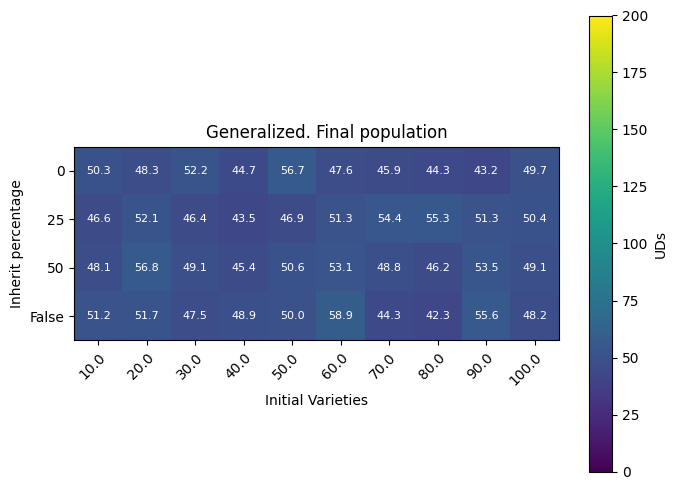

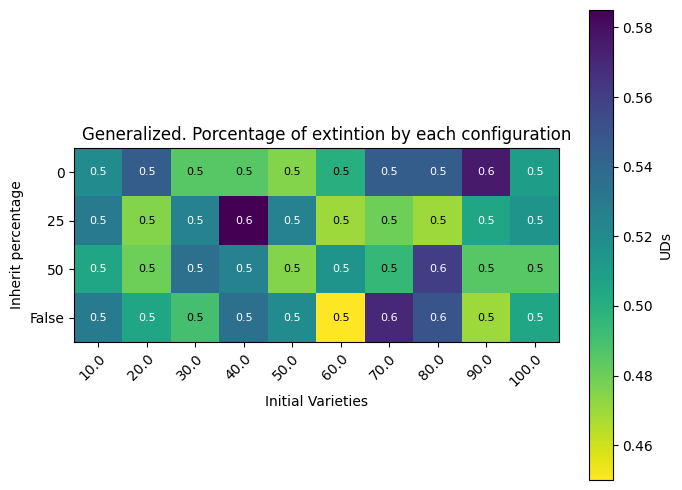

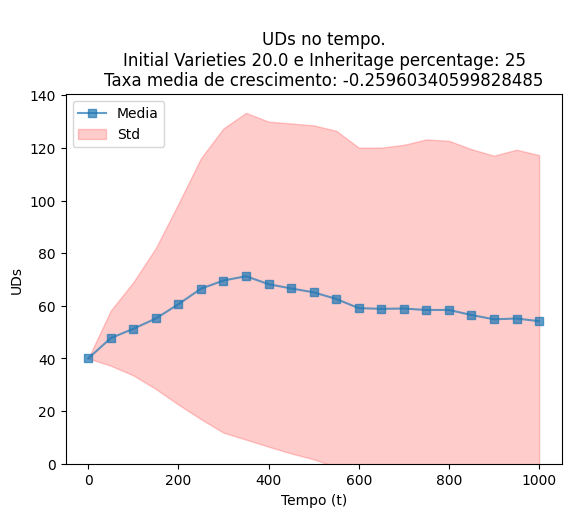

In [15]:
heat_population(DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial Varieties')
heat_percentage_population(DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial Varieties')
plot_specific_alivegraph(1, 1, DvM_datos, inherits, Dvalphas, 'Generalized', variable='Initial Varieties')

## Mean of children

In [32]:
# This experiment has different values for Mean of children
prob_morte = 0.06 #beta
n = 10 # Mean
m = 40 # Initial UDs
iniciais = m
inherits = [0,25,50, 'False']
#inherits = ['False']
Gcalphas = np.linspace(1,n,n) # Mean of children from 1 to n
# For data of behaviour
cM = np.empty((len(inherits), len(Gcalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 300


print(cM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, media  in enumerate(Gcalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} and Mean of Children {media}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            ## Clans
            clans = (list(range(1, 4)) * (int(iniciais) // 3 + 1))[:int(iniciais)] # Just 3 clans
            random.shuffle(clans)
            if inherit != 'False':
                #### Initialization
                UD_generalized.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_generalized(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_generalized.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_generalized.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_generalized.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Gcalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_generalized.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_generalized_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_generalized_al_inh(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_generalized_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (10)]
                    for ud in UD_generalized_al_inh.uds.values():
                        for _ in range(3):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_generalized_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con mean {Gcalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, True, 3, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_generalized_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            cM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            cM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit} and initial UDs {m} and mean {media} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Data
heat_std = os.path.join(folder_name, 'Generalized_Mean_children.npy')
np.save(heat_std, cM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-13 04:59:17.954578
Experiments with inheritance 0 and Mean of Children 1.0
experimento 1
acabó en 0 el experimento 1 con herencia 0 con mean 1.0
experimento 2
acabó en 0 el experimento 2 con herencia 0 con mean 1.0
experimento 3
acabó en 0 el experimento 3 con herencia 0 con mean 1.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con mean 1.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con mean 1.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con mean 1.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia 0 con mean 1.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con mean 1.0
experimento 10
acabó en 0 el experimento 10 con herencia 0 con mean 1.0
experimento 11
acabó en 0 el experimento 11 con herencia 0 con mean 1.0
experimento 12
acabó en 0 el experimento 12 con herencia 0 con mean 1.0
experimento 13
acabó en 0 el experimento 13 con he

acabó en 0 el experimento 118 con herencia 0 con mean 1.0
experimento 119
acabó en 0 el experimento 119 con herencia 0 con mean 1.0
experimento 120
acabó en 0 el experimento 120 con herencia 0 con mean 1.0
experimento 121
acabó en 0 el experimento 121 con herencia 0 con mean 1.0
experimento 122
acabó en 0 el experimento 122 con herencia 0 con mean 1.0
experimento 123
acabó en 0 el experimento 123 con herencia 0 con mean 1.0
experimento 124
acabó en 0 el experimento 124 con herencia 0 con mean 1.0
experimento 125
acabó en 0 el experimento 125 con herencia 0 con mean 1.0
experimento 126
acabó en 0 el experimento 126 con herencia 0 con mean 1.0
experimento 127
acabó en 0 el experimento 127 con herencia 0 con mean 1.0
experimento 128
acabó en 0 el experimento 128 con herencia 0 con mean 1.0
experimento 129
acabó en 0 el experimento 129 con herencia 0 con mean 1.0
experimento 130
acabó en 0 el experimento 130 con herencia 0 con mean 1.0
experimento 131
acabó en 0 el experimento 131 con here

acabó en 0 el experimento 244 con herencia 0 con mean 1.0
experimento 245
acabó en 0 el experimento 245 con herencia 0 con mean 1.0
experimento 246
acabó en 0 el experimento 246 con herencia 0 con mean 1.0
experimento 247
acabó en 0 el experimento 247 con herencia 0 con mean 1.0
experimento 248
acabó en 0 el experimento 248 con herencia 0 con mean 1.0
experimento 249
acabó en 0 el experimento 249 con herencia 0 con mean 1.0
experimento 250
acabó en 0 el experimento 250 con herencia 0 con mean 1.0
experimento 251
acabó en 0 el experimento 251 con herencia 0 con mean 1.0
experimento 252
acabó en 0 el experimento 252 con herencia 0 con mean 1.0
experimento 253
acabó en 0 el experimento 253 con herencia 0 con mean 1.0
experimento 254
acabó en 0 el experimento 254 con herencia 0 con mean 1.0
experimento 255
acabó en 0 el experimento 255 con herencia 0 con mean 1.0
experimento 256
acabó en 0 el experimento 256 con herencia 0 con mean 1.0
experimento 257
acabó en 0 el experimento 257 con here

acabó en 0 el experimento 59 con herencia 0 con mean 2.0
experimento 60
acabó en 0 el experimento 60 con herencia 0 con mean 2.0
experimento 61
acabó en 0 el experimento 61 con herencia 0 con mean 2.0
experimento 62
acabó en 0 el experimento 62 con herencia 0 con mean 2.0
experimento 63
acabó en 0 el experimento 63 con herencia 0 con mean 2.0
experimento 64
acabó en 0 el experimento 64 con herencia 0 con mean 2.0
experimento 65
acabó en 0 el experimento 65 con herencia 0 con mean 2.0
experimento 66
acabó en 0 el experimento 66 con herencia 0 con mean 2.0
experimento 67
acabó en 0 el experimento 67 con herencia 0 con mean 2.0
experimento 68
acabó en 0 el experimento 68 con herencia 0 con mean 2.0
experimento 69
acabó en 0 el experimento 69 con herencia 0 con mean 2.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con mean 2.0
experimento 71
acabó en 0 el experimento 71 con herencia 0 con mean 2.0
experimento 72
acabó en 0 el experimento 72 con herencia 0 con mean 2.0
experim

acabó en 0 el experimento 175 con herencia 0 con mean 2.0
experimento 176
acabó en 0 el experimento 176 con herencia 0 con mean 2.0
experimento 177
acabó en 0 el experimento 177 con herencia 0 con mean 2.0
experimento 178
acabó en 0 el experimento 178 con herencia 0 con mean 2.0
experimento 179
acabó en 0 el experimento 179 con herencia 0 con mean 2.0
experimento 180
acabó en 0 el experimento 180 con herencia 0 con mean 2.0
experimento 181
acabó en 0 el experimento 181 con herencia 0 con mean 2.0
experimento 182
acabó en 0 el experimento 182 con herencia 0 con mean 2.0
experimento 183
acabó en 0 el experimento 183 con herencia 0 con mean 2.0
experimento 184
acabó en 0 el experimento 184 con herencia 0 con mean 2.0
experimento 185
acabó en 0 el experimento 185 con herencia 0 con mean 2.0
experimento 186
acabó en 0 el experimento 186 con herencia 0 con mean 2.0
experimento 187
acabó en 0 el experimento 187 con herencia 0 con mean 2.0
experimento 188
acabó en 0 el experimento 188 con here

acabó en 0 el experimento 288 con herencia 0 con mean 2.0
experimento 289
acabó en 0 el experimento 289 con herencia 0 con mean 2.0
experimento 290
acabó en 0 el experimento 290 con herencia 0 con mean 2.0
experimento 291
acabó en 0 el experimento 291 con herencia 0 con mean 2.0
experimento 292
acabó en 0 el experimento 292 con herencia 0 con mean 2.0
experimento 293
acabó en 0 el experimento 293 con herencia 0 con mean 2.0
experimento 294
acabó en 0 el experimento 294 con herencia 0 con mean 2.0
experimento 295
acabó en 0 el experimento 295 con herencia 0 con mean 2.0
experimento 296
acabó en 0 el experimento 296 con herencia 0 con mean 2.0
experimento 297
acabó en 0 el experimento 297 con herencia 0 con mean 2.0
experimento 298
acabó en 0 el experimento 298 con herencia 0 con mean 2.0
experimento 299
acabó en 0 el experimento 299 con herencia 0 con mean 2.0
experimento 300
acabó en 0 el experimento 300 con herencia 0 con mean 2.0

The total time of the configuration of inherit percen

acabó en 0 el experimento 102 con herencia 0 con mean 3.0
experimento 103
acabó en 0 el experimento 103 con herencia 0 con mean 3.0
experimento 104
acabó en 0 el experimento 104 con herencia 0 con mean 3.0
experimento 105
acabó en 0 el experimento 105 con herencia 0 con mean 3.0
experimento 106
acabó en 0 el experimento 106 con herencia 0 con mean 3.0
experimento 107
acabó en 0 el experimento 107 con herencia 0 con mean 3.0
experimento 108
acabó en 0 el experimento 108 con herencia 0 con mean 3.0
experimento 109
acabó en 0 el experimento 109 con herencia 0 con mean 3.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con mean 3.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con mean 3.0
experimento 112
acabó en 0 el experimento 112 con herencia 0 con mean 3.0
experimento 113
acabó en 0 el experimento 113 con herencia 0 con mean 3.0
experimento 114
acabó en 0 el experimento 114 con herencia 0 con mean 3.0
experimento 115
acabó en 0 el experimento 115 con here

acabó en 0 el experimento 213 con herencia 0 con mean 3.0
experimento 214
acabó en 0 el experimento 214 con herencia 0 con mean 3.0
experimento 215
acabó en 0 el experimento 215 con herencia 0 con mean 3.0
experimento 216
acabó en 0 el experimento 216 con herencia 0 con mean 3.0
experimento 217
acabó en 0 el experimento 217 con herencia 0 con mean 3.0
experimento 218
acabó en 0 el experimento 218 con herencia 0 con mean 3.0
experimento 219
acabó en 0 el experimento 219 con herencia 0 con mean 3.0
experimento 220
acabó en 0 el experimento 220 con herencia 0 con mean 3.0
experimento 221
acabó en 0 el experimento 221 con herencia 0 con mean 3.0
experimento 222
acabó en 0 el experimento 222 con herencia 0 con mean 3.0
experimento 223
acabó en 0 el experimento 223 con herencia 0 con mean 3.0
experimento 224
acabó en 0 el experimento 224 con herencia 0 con mean 3.0
experimento 225
acabó en 0 el experimento 225 con herencia 0 con mean 3.0
experimento 226
acabó en 0 el experimento 226 con here

experimento 40
acabó en 0 el experimento 40 con herencia 0 con mean 4.0
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 0 con mean 4.0
experimento 43
acabó en 0 el experimento 43 con herencia 0 con mean 4.0
experimento 44
experimento 45
acabó en 0 el experimento 45 con herencia 0 con mean 4.0
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 0 con mean 4.0
experimento 53
acabó en 0 el experimento 53 con herencia 0 con mean 4.0
experimento 54
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 0 con mean 4.0
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 0 con mean 4.0
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia 0 con mean 4.0
experimento 61
acabó en 0 el experimento 61 con herencia 0 con mean 4.0
experimento 62
acabó en 0 el experimento 62 con herencia 0 con mean 4.0
experimento 63
experimento 6

acabó en 0 el experimento 240 con herencia 0 con mean 4.0
experimento 241
acabó en 0 el experimento 241 con herencia 0 con mean 4.0
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia 0 con mean 4.0
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia 0 con mean 4.0
experimento 246
experimento 247
acabó en 0 el experimento 247 con herencia 0 con mean 4.0
experimento 248
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 0 con mean 4.0
experimento 251
acabó en 0 el experimento 251 con herencia 0 con mean 4.0
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia 0 con mean 4.0
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 0 con mean 4.0
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
acabó en 0 el experimento 260 con herencia 0 con mean 4.0
experimento 261
acabó en 0 el experimento 261 con herencia 0 con mean 4.0
experimento 262
experiment


The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 5.0 is  2808.3356323242188
        
Experiments with inheritance 0 and Mean of Children 6.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
exp

experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
experimento 217
experimento 218
experimento 219
experimento 220
experimento 221
experimento 222
experimento 223
experimento 224
experimento 225
experimento 226
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia 0 con mean 7.0
experimento 229
experimento 230
experimento 231
experimento 232
experimento 233
experimento 234
experimento 235
experimento 236
experimento 237
experimento 238
experimento 239
experimento 240
experimento 241
experimento 242
experimento 243
experimento 244
experimento 245
experimento 246
experimento 247
experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 25

experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experim

experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

The total time of the configuration of inherit percentage 0 and initial UDs 40 and mean 10.0 is  3804.4070060253143
        
Experiments with inheritance 25 and Mean of Children 1.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con mean 1.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con mean 1.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con mean 1.0
experimento 4
acabó en 0 el experimento 4 con herencia 25 con mean 1.0
experimento 5
acabó en 0 el experimento 5 con herencia 25 con mean 1.0
experimento 6
acabó en 0 el experimento 6 con herencia 25 con mean 1.0
experimento 7
acabó en 0 el experimento 7 con herencia 25 con mean 1.0
experimento 8
acabó en 0 el experimento 8 con herencia 25 con mean 1.0
experimento 9
acabó en 0 

acabó en 0 el experimento 129 con herencia 25 con mean 1.0
experimento 130
acabó en 0 el experimento 130 con herencia 25 con mean 1.0
experimento 131
acabó en 0 el experimento 131 con herencia 25 con mean 1.0
experimento 132
acabó en 0 el experimento 132 con herencia 25 con mean 1.0
experimento 133
acabó en 0 el experimento 133 con herencia 25 con mean 1.0
experimento 134
acabó en 0 el experimento 134 con herencia 25 con mean 1.0
experimento 135
acabó en 0 el experimento 135 con herencia 25 con mean 1.0
experimento 136
acabó en 0 el experimento 136 con herencia 25 con mean 1.0
experimento 137
acabó en 0 el experimento 137 con herencia 25 con mean 1.0
experimento 138
acabó en 0 el experimento 138 con herencia 25 con mean 1.0
experimento 139
acabó en 0 el experimento 139 con herencia 25 con mean 1.0
experimento 140
acabó en 0 el experimento 140 con herencia 25 con mean 1.0
experimento 141
acabó en 0 el experimento 141 con herencia 25 con mean 1.0
experimento 142
acabó en 0 el experimento

acabó en 0 el experimento 247 con herencia 25 con mean 1.0
experimento 248
acabó en 0 el experimento 248 con herencia 25 con mean 1.0
experimento 249
acabó en 0 el experimento 249 con herencia 25 con mean 1.0
experimento 250
acabó en 0 el experimento 250 con herencia 25 con mean 1.0
experimento 251
acabó en 0 el experimento 251 con herencia 25 con mean 1.0
experimento 252
acabó en 0 el experimento 252 con herencia 25 con mean 1.0
experimento 253
acabó en 0 el experimento 253 con herencia 25 con mean 1.0
experimento 254
acabó en 0 el experimento 254 con herencia 25 con mean 1.0
experimento 255
acabó en 0 el experimento 255 con herencia 25 con mean 1.0
experimento 256
acabó en 0 el experimento 256 con herencia 25 con mean 1.0
experimento 257
acabó en 0 el experimento 257 con herencia 25 con mean 1.0
experimento 258
acabó en 0 el experimento 258 con herencia 25 con mean 1.0
experimento 259
acabó en 0 el experimento 259 con herencia 25 con mean 1.0
experimento 260
acabó en 0 el experimento

acabó en 0 el experimento 68 con herencia 25 con mean 2.0
experimento 69
acabó en 0 el experimento 69 con herencia 25 con mean 2.0
experimento 70
acabó en 0 el experimento 70 con herencia 25 con mean 2.0
experimento 71
acabó en 0 el experimento 71 con herencia 25 con mean 2.0
experimento 72
acabó en 0 el experimento 72 con herencia 25 con mean 2.0
experimento 73
acabó en 0 el experimento 73 con herencia 25 con mean 2.0
experimento 74
acabó en 0 el experimento 74 con herencia 25 con mean 2.0
experimento 75
acabó en 0 el experimento 75 con herencia 25 con mean 2.0
experimento 76
acabó en 0 el experimento 76 con herencia 25 con mean 2.0
experimento 77
acabó en 0 el experimento 77 con herencia 25 con mean 2.0
experimento 78
acabó en 0 el experimento 78 con herencia 25 con mean 2.0
experimento 79
acabó en 0 el experimento 79 con herencia 25 con mean 2.0
experimento 80
acabó en 0 el experimento 80 con herencia 25 con mean 2.0
experimento 81
acabó en 0 el experimento 81 con herencia 25 con me

acabó en 0 el experimento 179 con herencia 25 con mean 2.0
experimento 180
acabó en 0 el experimento 180 con herencia 25 con mean 2.0
experimento 181
acabó en 0 el experimento 181 con herencia 25 con mean 2.0
experimento 182
acabó en 0 el experimento 182 con herencia 25 con mean 2.0
experimento 183
acabó en 0 el experimento 183 con herencia 25 con mean 2.0
experimento 184
acabó en 0 el experimento 184 con herencia 25 con mean 2.0
experimento 185
acabó en 0 el experimento 185 con herencia 25 con mean 2.0
experimento 186
acabó en 0 el experimento 186 con herencia 25 con mean 2.0
experimento 187
acabó en 0 el experimento 187 con herencia 25 con mean 2.0
experimento 188
acabó en 0 el experimento 188 con herencia 25 con mean 2.0
experimento 189
acabó en 0 el experimento 189 con herencia 25 con mean 2.0
experimento 190
acabó en 0 el experimento 190 con herencia 25 con mean 2.0
experimento 191
acabó en 0 el experimento 191 con herencia 25 con mean 2.0
experimento 192
acabó en 0 el experimento

acabó en 0 el experimento 290 con herencia 25 con mean 2.0
experimento 291
acabó en 0 el experimento 291 con herencia 25 con mean 2.0
experimento 292
acabó en 0 el experimento 292 con herencia 25 con mean 2.0
experimento 293
acabó en 0 el experimento 293 con herencia 25 con mean 2.0
experimento 294
acabó en 0 el experimento 294 con herencia 25 con mean 2.0
experimento 295
acabó en 0 el experimento 295 con herencia 25 con mean 2.0
experimento 296
acabó en 0 el experimento 296 con herencia 25 con mean 2.0
experimento 297
acabó en 0 el experimento 297 con herencia 25 con mean 2.0
experimento 298
acabó en 0 el experimento 298 con herencia 25 con mean 2.0
experimento 299
acabó en 0 el experimento 299 con herencia 25 con mean 2.0
experimento 300
acabó en 0 el experimento 300 con herencia 25 con mean 2.0

The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 2.0 is  7.847395181655884
        
Experiments with inheritance 25 and Mean of Children 3.0
experimen

acabó en 0 el experimento 104 con herencia 25 con mean 3.0
experimento 105
acabó en 0 el experimento 105 con herencia 25 con mean 3.0
experimento 106
acabó en 0 el experimento 106 con herencia 25 con mean 3.0
experimento 107
acabó en 0 el experimento 107 con herencia 25 con mean 3.0
experimento 108
acabó en 0 el experimento 108 con herencia 25 con mean 3.0
experimento 109
acabó en 0 el experimento 109 con herencia 25 con mean 3.0
experimento 110
acabó en 0 el experimento 110 con herencia 25 con mean 3.0
experimento 111
acabó en 0 el experimento 111 con herencia 25 con mean 3.0
experimento 112
acabó en 0 el experimento 112 con herencia 25 con mean 3.0
experimento 113
acabó en 0 el experimento 113 con herencia 25 con mean 3.0
experimento 114
acabó en 0 el experimento 114 con herencia 25 con mean 3.0
experimento 115
acabó en 0 el experimento 115 con herencia 25 con mean 3.0
experimento 116
acabó en 0 el experimento 116 con herencia 25 con mean 3.0
experimento 117
acabó en 0 el experimento

acabó en 0 el experimento 217 con herencia 25 con mean 3.0
experimento 218
acabó en 0 el experimento 218 con herencia 25 con mean 3.0
experimento 219
acabó en 0 el experimento 219 con herencia 25 con mean 3.0
experimento 220
acabó en 0 el experimento 220 con herencia 25 con mean 3.0
experimento 221
acabó en 0 el experimento 221 con herencia 25 con mean 3.0
experimento 222
acabó en 0 el experimento 222 con herencia 25 con mean 3.0
experimento 223
acabó en 0 el experimento 223 con herencia 25 con mean 3.0
experimento 224
acabó en 0 el experimento 224 con herencia 25 con mean 3.0
experimento 225
acabó en 0 el experimento 225 con herencia 25 con mean 3.0
experimento 226
acabó en 0 el experimento 226 con herencia 25 con mean 3.0
experimento 227
acabó en 0 el experimento 227 con herencia 25 con mean 3.0
experimento 228
acabó en 0 el experimento 228 con herencia 25 con mean 3.0
experimento 229
acabó en 0 el experimento 229 con herencia 25 con mean 3.0
experimento 230
acabó en 0 el experimento

experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 25 con mean 4.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con mean 4.0
experimento 51
acabó en 0 el experimento 51 con herencia 25 con mean 4.0
experimento 52
acabó en 0 el experimento 52 con herencia 25 con mean 4.0
experimento 53
experimento 54
acabó en 0 el experimento 54 con herencia 25 con mean 4.0
experimento 55
acabó en 0 el experimento 55 con herencia 25 con mean 4.0
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 25 con mean 4.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con mean 4.0
experimento 60
experimento 61
acabó en 0 el experimento 61 con herencia 25 con mean 4.0
experimento 62
acabó en 0 el experimento 62 con herencia 25 con mean 4.0
experimento 63
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 25 con mean 4.0
experimento 66
acabó en 0 el experimento 66 con herencia 25 con mean 4.0
experimento 67
expe

acabó en 0 el experimento 230 con herencia 25 con mean 4.0
experimento 231
experimento 232
acabó en 0 el experimento 232 con herencia 25 con mean 4.0
experimento 233
acabó en 0 el experimento 233 con herencia 25 con mean 4.0
experimento 234
experimento 235
experimento 236
acabó en 0 el experimento 236 con herencia 25 con mean 4.0
experimento 237
experimento 238
acabó en 0 el experimento 238 con herencia 25 con mean 4.0
experimento 239
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 25 con mean 4.0
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia 25 con mean 4.0
experimento 244
experimento 245
experimento 246
acabó en 0 el experimento 246 con herencia 25 con mean 4.0
experimento 247
acabó en 0 el experimento 247 con herencia 25 con mean 4.0
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 25 con mean 4.0
experimento 250
experimento 251
experimento 252
experimento 253
acabó en 0 el experimento 253 con herencia

experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 5.0 is  2951.965451478958
        
Experiments with inheritance 25 and Mean of Children 6.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 

experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
acabó en 0 el experimento 210 con herencia 25 con mean 7.0
experimento 211
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
experimento 2

experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109


experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
experimento 264
experimento 265
experimento 266
experimento 267
experimento 268
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

The total time of the configuration of inherit percentage 25 and initial UDs 40 and mean 10.0 is  3729.4302871227264
        
Experiments with inherita

acabó en 0 el experimento 107 con herencia 50 con mean 1.0
experimento 108
acabó en 0 el experimento 108 con herencia 50 con mean 1.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con mean 1.0
experimento 110
acabó en 0 el experimento 110 con herencia 50 con mean 1.0
experimento 111
acabó en 0 el experimento 111 con herencia 50 con mean 1.0
experimento 112
acabó en 0 el experimento 112 con herencia 50 con mean 1.0
experimento 113
acabó en 0 el experimento 113 con herencia 50 con mean 1.0
experimento 114
acabó en 0 el experimento 114 con herencia 50 con mean 1.0
experimento 115
acabó en 0 el experimento 115 con herencia 50 con mean 1.0
experimento 116
acabó en 0 el experimento 116 con herencia 50 con mean 1.0
experimento 117
acabó en 0 el experimento 117 con herencia 50 con mean 1.0
experimento 118
acabó en 0 el experimento 118 con herencia 50 con mean 1.0
experimento 119
acabó en 0 el experimento 119 con herencia 50 con mean 1.0
experimento 120
acabó en 0 el experimento

acabó en 0 el experimento 217 con herencia 50 con mean 1.0
experimento 218
acabó en 0 el experimento 218 con herencia 50 con mean 1.0
experimento 219
acabó en 0 el experimento 219 con herencia 50 con mean 1.0
experimento 220
acabó en 0 el experimento 220 con herencia 50 con mean 1.0
experimento 221
acabó en 0 el experimento 221 con herencia 50 con mean 1.0
experimento 222
acabó en 0 el experimento 222 con herencia 50 con mean 1.0
experimento 223
acabó en 0 el experimento 223 con herencia 50 con mean 1.0
experimento 224
acabó en 0 el experimento 224 con herencia 50 con mean 1.0
experimento 225
acabó en 0 el experimento 225 con herencia 50 con mean 1.0
experimento 226
acabó en 0 el experimento 226 con herencia 50 con mean 1.0
experimento 227
acabó en 0 el experimento 227 con herencia 50 con mean 1.0
experimento 228
acabó en 0 el experimento 228 con herencia 50 con mean 1.0
experimento 229
acabó en 0 el experimento 229 con herencia 50 con mean 1.0
experimento 230
acabó en 0 el experimento

acabó en 0 el experimento 32 con herencia 50 con mean 2.0
experimento 33
acabó en 0 el experimento 33 con herencia 50 con mean 2.0
experimento 34
acabó en 0 el experimento 34 con herencia 50 con mean 2.0
experimento 35
acabó en 0 el experimento 35 con herencia 50 con mean 2.0
experimento 36
acabó en 0 el experimento 36 con herencia 50 con mean 2.0
experimento 37
acabó en 0 el experimento 37 con herencia 50 con mean 2.0
experimento 38
acabó en 0 el experimento 38 con herencia 50 con mean 2.0
experimento 39
acabó en 0 el experimento 39 con herencia 50 con mean 2.0
experimento 40
acabó en 0 el experimento 40 con herencia 50 con mean 2.0
experimento 41
acabó en 0 el experimento 41 con herencia 50 con mean 2.0
experimento 42
acabó en 0 el experimento 42 con herencia 50 con mean 2.0
experimento 43
acabó en 0 el experimento 43 con herencia 50 con mean 2.0
experimento 44
acabó en 0 el experimento 44 con herencia 50 con mean 2.0
experimento 45
acabó en 0 el experimento 45 con herencia 50 con me

acabó en 0 el experimento 156 con herencia 50 con mean 2.0
experimento 157
acabó en 0 el experimento 157 con herencia 50 con mean 2.0
experimento 158
acabó en 0 el experimento 158 con herencia 50 con mean 2.0
experimento 159
acabó en 0 el experimento 159 con herencia 50 con mean 2.0
experimento 160
acabó en 0 el experimento 160 con herencia 50 con mean 2.0
experimento 161
acabó en 0 el experimento 161 con herencia 50 con mean 2.0
experimento 162
acabó en 0 el experimento 162 con herencia 50 con mean 2.0
experimento 163
acabó en 0 el experimento 163 con herencia 50 con mean 2.0
experimento 164
acabó en 0 el experimento 164 con herencia 50 con mean 2.0
experimento 165
acabó en 0 el experimento 165 con herencia 50 con mean 2.0
experimento 166
acabó en 0 el experimento 166 con herencia 50 con mean 2.0
experimento 167
acabó en 0 el experimento 167 con herencia 50 con mean 2.0
experimento 168
acabó en 0 el experimento 168 con herencia 50 con mean 2.0
experimento 169
acabó en 0 el experimento

acabó en 0 el experimento 275 con herencia 50 con mean 2.0
experimento 276
acabó en 0 el experimento 276 con herencia 50 con mean 2.0
experimento 277
acabó en 0 el experimento 277 con herencia 50 con mean 2.0
experimento 278
acabó en 0 el experimento 278 con herencia 50 con mean 2.0
experimento 279
acabó en 0 el experimento 279 con herencia 50 con mean 2.0
experimento 280
acabó en 0 el experimento 280 con herencia 50 con mean 2.0
experimento 281
acabó en 0 el experimento 281 con herencia 50 con mean 2.0
experimento 282
acabó en 0 el experimento 282 con herencia 50 con mean 2.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con mean 2.0
experimento 284
acabó en 0 el experimento 284 con herencia 50 con mean 2.0
experimento 285
acabó en 0 el experimento 285 con herencia 50 con mean 2.0
experimento 286
acabó en 0 el experimento 286 con herencia 50 con mean 2.0
experimento 287
acabó en 0 el experimento 287 con herencia 50 con mean 2.0
experimento 288
acabó en 0 el experimento

acabó en 0 el experimento 87 con herencia 50 con mean 3.0
experimento 88
acabó en 0 el experimento 88 con herencia 50 con mean 3.0
experimento 89
acabó en 0 el experimento 89 con herencia 50 con mean 3.0
experimento 90
acabó en 0 el experimento 90 con herencia 50 con mean 3.0
experimento 91
acabó en 0 el experimento 91 con herencia 50 con mean 3.0
experimento 92
acabó en 0 el experimento 92 con herencia 50 con mean 3.0
experimento 93
acabó en 0 el experimento 93 con herencia 50 con mean 3.0
experimento 94
acabó en 0 el experimento 94 con herencia 50 con mean 3.0
experimento 95
acabó en 0 el experimento 95 con herencia 50 con mean 3.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con mean 3.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con mean 3.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con mean 3.0
experimento 99
acabó en 0 el experimento 99 con herencia 50 con mean 3.0
experimento 100
acabó en 0 el experimento 100 con herencia 50 con 

acabó en 0 el experimento 197 con herencia 50 con mean 3.0
experimento 198
acabó en 0 el experimento 198 con herencia 50 con mean 3.0
experimento 199
acabó en 0 el experimento 199 con herencia 50 con mean 3.0
experimento 200
acabó en 0 el experimento 200 con herencia 50 con mean 3.0
experimento 201
acabó en 0 el experimento 201 con herencia 50 con mean 3.0
experimento 202
acabó en 0 el experimento 202 con herencia 50 con mean 3.0
experimento 203
acabó en 0 el experimento 203 con herencia 50 con mean 3.0
experimento 204
acabó en 0 el experimento 204 con herencia 50 con mean 3.0
experimento 205
acabó en 0 el experimento 205 con herencia 50 con mean 3.0
experimento 206
acabó en 0 el experimento 206 con herencia 50 con mean 3.0
experimento 207
acabó en 0 el experimento 207 con herencia 50 con mean 3.0
experimento 208
acabó en 0 el experimento 208 con herencia 50 con mean 3.0
experimento 209
acabó en 0 el experimento 209 con herencia 50 con mean 3.0
experimento 210
acabó en 0 el experimento

acabó en 0 el experimento 5 con herencia 50 con mean 4.0
experimento 6
experimento 7
acabó en 0 el experimento 7 con herencia 50 con mean 4.0
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 50 con mean 4.0
experimento 10
acabó en 0 el experimento 10 con herencia 50 con mean 4.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 50 con mean 4.0
experimento 13
acabó en 0 el experimento 13 con herencia 50 con mean 4.0
experimento 14
acabó en 0 el experimento 14 con herencia 50 con mean 4.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con mean 4.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con mean 4.0
experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia 50 con mean 4.0
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 50 con mean 4.0
experimento 22
acabó en 0 el experimento 22 con herencia 50 con mean 4.0
experimento 23
acabó en 0 el experimento 23 con herencia

acabó en 0 el experimento 184 con herencia 50 con mean 4.0
experimento 185
acabó en 0 el experimento 185 con herencia 50 con mean 4.0
experimento 186
acabó en 0 el experimento 186 con herencia 50 con mean 4.0
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 50 con mean 4.0
experimento 189
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia 50 con mean 4.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 50 con mean 4.0
experimento 194
acabó en 0 el experimento 194 con herencia 50 con mean 4.0
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia 50 con mean 4.0
experimento 197
acabó en 0 el experimento 197 con herencia 50 con mean 4.0
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia 50 con mean 4.0
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia 50 con mean 4.0
experimento 205
acabó en 0 el e

experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 50 con mean 5.0
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 50 con mean 5.0
experimento 215
experimento 216
experimento 217
experimento 218
ex

experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
experimento 50
experimento 51
experimento 52
experimento 53
experimento 54
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
experimento 61
experimento 62
experimento 63
experimento 64
experimento 65
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia 50 con mean 7.0
experimento 68
experimento 69
experimento 70
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
experimento 78
experimento 79
experimento 80
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
experimento 92
experimento 93
experimento 94
experimento 95
experimento 96
experimento 97
experimento 98
experimento 99
experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
exper

experimento 245
experimento 246
experimento 247
experimento 248
experimento 249
experimento 250
experimento 251
experimento 252
experimento 253
experimento 254
experimento 255
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
experimento 264
experimento 265
experimento 266
experimento 267
experimento 268
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
experimento 274
experimento 275
experimento 276
experimento 277
experimento 278
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
experimento 285
experimento 286
experimento 287
experimento 288
experimento 289
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

The total time of the configuration of inherit percentage 50 and initial UDs 40 and mean 8.0 is  3313.2

experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 165
experimento 166
experimento 167
experimento 168
experimento 169
experimento 170
experimento 171
experimento 172
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
experime

acabó en 0 el experimento 74 con herencia False con mean 1.0
experimento 75
acabó en 0 el experimento 75 con herencia False con mean 1.0
experimento 76
acabó en 0 el experimento 76 con herencia False con mean 1.0
experimento 77
acabó en 0 el experimento 77 con herencia False con mean 1.0
experimento 78
acabó en 0 el experimento 78 con herencia False con mean 1.0
experimento 79
acabó en 0 el experimento 79 con herencia False con mean 1.0
experimento 80
acabó en 0 el experimento 80 con herencia False con mean 1.0
experimento 81
acabó en 0 el experimento 81 con herencia False con mean 1.0
experimento 82
acabó en 0 el experimento 82 con herencia False con mean 1.0
experimento 83
acabó en 0 el experimento 83 con herencia False con mean 1.0
experimento 84
acabó en 0 el experimento 84 con herencia False con mean 1.0
experimento 85
acabó en 0 el experimento 85 con herencia False con mean 1.0
experimento 86
acabó en 0 el experimento 86 con herencia False con mean 1.0
experimento 87
acabó en 0 e

acabó en 0 el experimento 194 con herencia False con mean 1.0
experimento 195
acabó en 0 el experimento 195 con herencia False con mean 1.0
experimento 196
acabó en 0 el experimento 196 con herencia False con mean 1.0
experimento 197
acabó en 0 el experimento 197 con herencia False con mean 1.0
experimento 198
acabó en 0 el experimento 198 con herencia False con mean 1.0
experimento 199
acabó en 0 el experimento 199 con herencia False con mean 1.0
experimento 200
acabó en 0 el experimento 200 con herencia False con mean 1.0
experimento 201
acabó en 0 el experimento 201 con herencia False con mean 1.0
experimento 202
acabó en 0 el experimento 202 con herencia False con mean 1.0
experimento 203
acabó en 0 el experimento 203 con herencia False con mean 1.0
experimento 204
acabó en 0 el experimento 204 con herencia False con mean 1.0
experimento 205
acabó en 0 el experimento 205 con herencia False con mean 1.0
experimento 206
acabó en 0 el experimento 206 con herencia False con mean 1.0
ex

acabó en 0 el experimento 10 con herencia False con mean 2.0
experimento 11
acabó en 0 el experimento 11 con herencia False con mean 2.0
experimento 12
acabó en 0 el experimento 12 con herencia False con mean 2.0
experimento 13
acabó en 0 el experimento 13 con herencia False con mean 2.0
experimento 14
acabó en 0 el experimento 14 con herencia False con mean 2.0
experimento 15
acabó en 0 el experimento 15 con herencia False con mean 2.0
experimento 16
acabó en 0 el experimento 16 con herencia False con mean 2.0
experimento 17
acabó en 0 el experimento 17 con herencia False con mean 2.0
experimento 18
acabó en 0 el experimento 18 con herencia False con mean 2.0
experimento 19
acabó en 0 el experimento 19 con herencia False con mean 2.0
experimento 20
acabó en 0 el experimento 20 con herencia False con mean 2.0
experimento 21
acabó en 0 el experimento 21 con herencia False con mean 2.0
experimento 22
acabó en 0 el experimento 22 con herencia False con mean 2.0
experimento 23
acabó en 0 e

acabó en 0 el experimento 121 con herencia False con mean 2.0
experimento 122
acabó en 0 el experimento 122 con herencia False con mean 2.0
experimento 123
acabó en 0 el experimento 123 con herencia False con mean 2.0
experimento 124
acabó en 0 el experimento 124 con herencia False con mean 2.0
experimento 125
acabó en 0 el experimento 125 con herencia False con mean 2.0
experimento 126
acabó en 0 el experimento 126 con herencia False con mean 2.0
experimento 127
acabó en 0 el experimento 127 con herencia False con mean 2.0
experimento 128
acabó en 0 el experimento 128 con herencia False con mean 2.0
experimento 129
acabó en 0 el experimento 129 con herencia False con mean 2.0
experimento 130
acabó en 0 el experimento 130 con herencia False con mean 2.0
experimento 131
acabó en 0 el experimento 131 con herencia False con mean 2.0
experimento 132
acabó en 0 el experimento 132 con herencia False con mean 2.0
experimento 133
acabó en 0 el experimento 133 con herencia False con mean 2.0
ex

acabó en 0 el experimento 232 con herencia False con mean 2.0
experimento 233
acabó en 0 el experimento 233 con herencia False con mean 2.0
experimento 234
acabó en 0 el experimento 234 con herencia False con mean 2.0
experimento 235
acabó en 0 el experimento 235 con herencia False con mean 2.0
experimento 236
acabó en 0 el experimento 236 con herencia False con mean 2.0
experimento 237
acabó en 0 el experimento 237 con herencia False con mean 2.0
experimento 238
acabó en 0 el experimento 238 con herencia False con mean 2.0
experimento 239
acabó en 0 el experimento 239 con herencia False con mean 2.0
experimento 240
acabó en 0 el experimento 240 con herencia False con mean 2.0
experimento 241
acabó en 0 el experimento 241 con herencia False con mean 2.0
experimento 242
acabó en 0 el experimento 242 con herencia False con mean 2.0
experimento 243
acabó en 0 el experimento 243 con herencia False con mean 2.0
experimento 244
acabó en 0 el experimento 244 con herencia False con mean 2.0
ex

acabó en 0 el experimento 36 con herencia False con mean 3.0
experimento 37
acabó en 0 el experimento 37 con herencia False con mean 3.0
experimento 38
acabó en 0 el experimento 38 con herencia False con mean 3.0
experimento 39
acabó en 0 el experimento 39 con herencia False con mean 3.0
experimento 40
acabó en 0 el experimento 40 con herencia False con mean 3.0
experimento 41
acabó en 0 el experimento 41 con herencia False con mean 3.0
experimento 42
acabó en 0 el experimento 42 con herencia False con mean 3.0
experimento 43
acabó en 0 el experimento 43 con herencia False con mean 3.0
experimento 44
acabó en 0 el experimento 44 con herencia False con mean 3.0
experimento 45
acabó en 0 el experimento 45 con herencia False con mean 3.0
experimento 46
acabó en 0 el experimento 46 con herencia False con mean 3.0
experimento 47
acabó en 0 el experimento 47 con herencia False con mean 3.0
experimento 48
acabó en 0 el experimento 48 con herencia False con mean 3.0
experimento 49
acabó en 0 e

acabó en 0 el experimento 143 con herencia False con mean 3.0
experimento 144
acabó en 0 el experimento 144 con herencia False con mean 3.0
experimento 145
acabó en 0 el experimento 145 con herencia False con mean 3.0
experimento 146
acabó en 0 el experimento 146 con herencia False con mean 3.0
experimento 147
acabó en 0 el experimento 147 con herencia False con mean 3.0
experimento 148
acabó en 0 el experimento 148 con herencia False con mean 3.0
experimento 149
acabó en 0 el experimento 149 con herencia False con mean 3.0
experimento 150
acabó en 0 el experimento 150 con herencia False con mean 3.0
experimento 151
acabó en 0 el experimento 151 con herencia False con mean 3.0
experimento 152
acabó en 0 el experimento 152 con herencia False con mean 3.0
experimento 153
acabó en 0 el experimento 153 con herencia False con mean 3.0
experimento 154
acabó en 0 el experimento 154 con herencia False con mean 3.0
experimento 155
acabó en 0 el experimento 155 con herencia False con mean 3.0
ex

acabó en 0 el experimento 249 con herencia False con mean 3.0
experimento 250
acabó en 0 el experimento 250 con herencia False con mean 3.0
experimento 251
acabó en 0 el experimento 251 con herencia False con mean 3.0
experimento 252
acabó en 0 el experimento 252 con herencia False con mean 3.0
experimento 253
acabó en 0 el experimento 253 con herencia False con mean 3.0
experimento 254
acabó en 0 el experimento 254 con herencia False con mean 3.0
experimento 255
acabó en 0 el experimento 255 con herencia False con mean 3.0
experimento 256
acabó en 0 el experimento 256 con herencia False con mean 3.0
experimento 257
acabó en 0 el experimento 257 con herencia False con mean 3.0
experimento 258
acabó en 0 el experimento 258 con herencia False con mean 3.0
experimento 259
acabó en 0 el experimento 259 con herencia False con mean 3.0
experimento 260
acabó en 0 el experimento 260 con herencia False con mean 3.0
experimento 261
acabó en 0 el experimento 261 con herencia False con mean 3.0
ex

experimento 92
acabó en 0 el experimento 92 con herencia False con mean 4.0
experimento 93
acabó en 0 el experimento 93 con herencia False con mean 4.0
experimento 94
experimento 95
acabó en 0 el experimento 95 con herencia False con mean 4.0
experimento 96
acabó en 0 el experimento 96 con herencia False con mean 4.0
experimento 97
acabó en 0 el experimento 97 con herencia False con mean 4.0
experimento 98
acabó en 0 el experimento 98 con herencia False con mean 4.0
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia False con mean 4.0
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia False con mean 4.0
experimento 103
acabó en 0 el experimento 103 con herencia False con mean 4.0
experimento 104
acabó en 0 el experimento 104 con herencia False con mean 4.0
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia False con mean 4.0
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia F

experimento 275
acabó en 0 el experimento 275 con herencia False con mean 4.0
experimento 276
acabó en 0 el experimento 276 con herencia False con mean 4.0
experimento 277
experimento 278
acabó en 0 el experimento 278 con herencia False con mean 4.0
experimento 279
experimento 280
experimento 281
experimento 282
experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia False con mean 4.0
experimento 285
experimento 286
acabó en 0 el experimento 286 con herencia False con mean 4.0
experimento 287
acabó en 0 el experimento 287 con herencia False con mean 4.0
experimento 288
experimento 289
experimento 290
acabó en 0 el experimento 290 con herencia False con mean 4.0
experimento 291
acabó en 0 el experimento 291 con herencia False con mean 4.0
experimento 292
acabó en 0 el experimento 292 con herencia False con mean 4.0
experimento 293
experimento 294
experimento 295
experimento 296
acabó en 0 el experimento 296 con herencia False con mean 4.0
experimento 297
acabó en 0 e

experimento 100
experimento 101
experimento 102
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
experimento 110
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
experimento 123
experimento 124
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
experimento 135
experimento 136
experimento 137
experimento 138
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
experimento 147
experimento 148
experimento 149
experimento 150
experimento 151
experimento 152
experimento 153
experimento 154
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
experimento 161
experime

experimento 296
experimento 297
experimento 298
experimento 299
experimento 300

The total time of the configuration of inherit percentage False and initial UDs 40 and mean 7.0 is  2995.7961151599884
        
Experiments with inheritance False and Mean of Children 8.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
experimento 6
experimento 7
experimento 8
experimento 9
experimento 10
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
experimento 22
experimento 23
experimento 24
experimento 25
experimento 26
experimento 27
experimento 28
experimento 29
experimento 30
experimento 31
experimento 32
experimento 33
experimento 34
experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
experimento 42
experimento 43
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48
experimento 49
exper

experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
experimento 185
experimento 186
experimento 187
experimento 188
experimento 189
experimento 190
experimento 191
experimento 192
experimento 193
experimento 194
experimento 195
experimento 196
experimento 197
experimento 198
experimento 199
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
experimento 214
experimento 215
experimento 216
experimento 217
experimento 218
experimento 219
experimento 220
experimento 221
experimento 222
experimento 223
experimento 224
experimento 225
experimento 226
experimento 227
experimento 228
experimento 229
experimento 230
experimento 231
experimento 232
experimento 233
experimento 234
experimento 235
experimento 236
experimento 237
experimento 238
experimento 239
experimento 240
experime

In [33]:
# Dowload the documents
#As a reference
n = 10 # Mean
# m = 40 # Initial UDs
inherits = [0,25,50, 'False']
Gcalphas = np.linspace(1,n,n) # Mean of children from 1 to n
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters'
heat_std = os.path.join(folder_name, 'Generalized_Mean_children.npy')

## General Data
GcM_datos = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

Skipping Inherit 0%, Mean of Children 1.0 due to no data
Skipping Inherit 0%, Mean of Children 2.0 due to no data
Skipping Inherit 0%, Mean of Children 3.0 due to no data


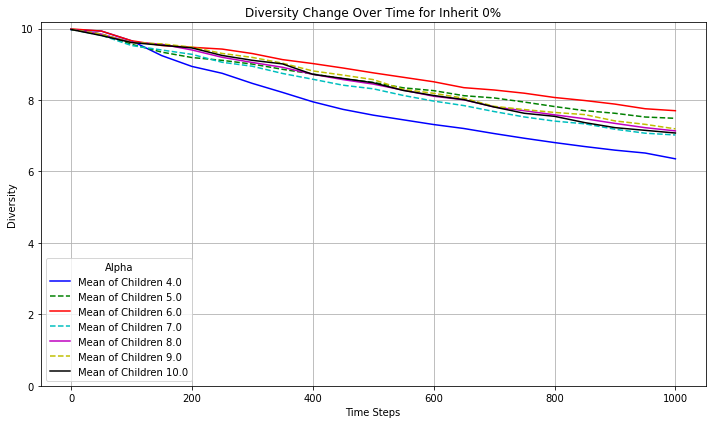

Skipping Inherit 25%, Mean of Children 1.0 due to no data
Skipping Inherit 25%, Mean of Children 2.0 due to no data
Skipping Inherit 25%, Mean of Children 3.0 due to no data


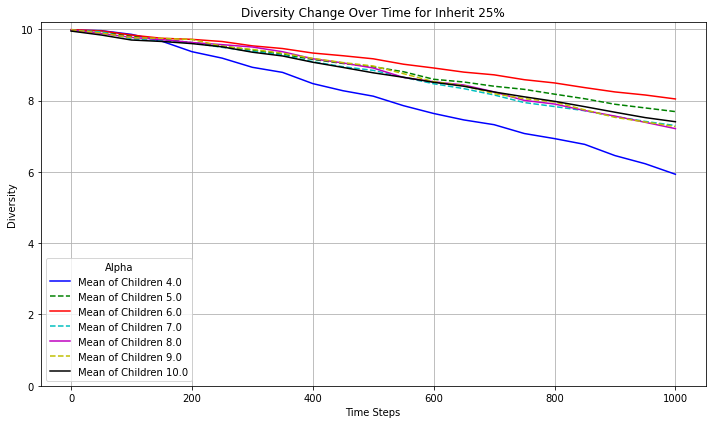

Skipping Inherit 50%, Mean of Children 1.0 due to no data
Skipping Inherit 50%, Mean of Children 2.0 due to no data
Skipping Inherit 50%, Mean of Children 3.0 due to no data


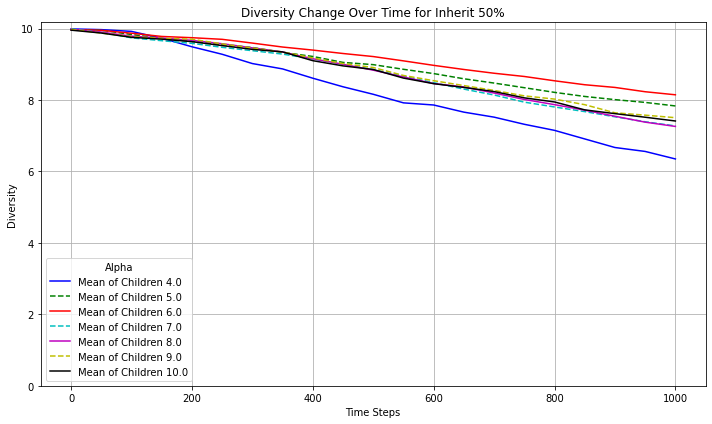

Skipping Inherit False%, Mean of Children 1.0 due to no data
Skipping Inherit False%, Mean of Children 2.0 due to no data
Skipping Inherit False%, Mean of Children 3.0 due to no data


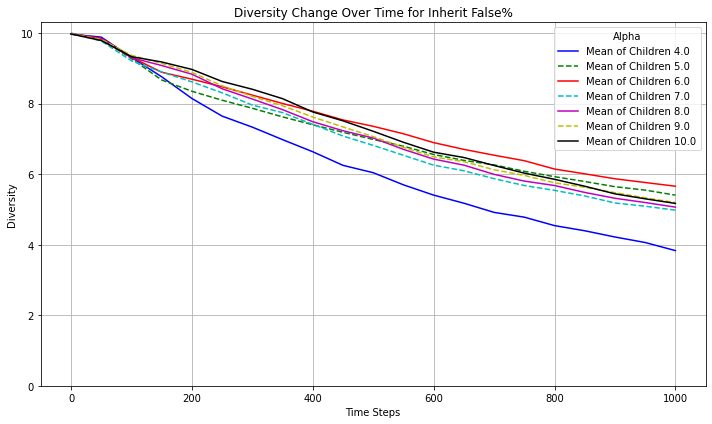

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Skipping Inherit 0%, Mean of Children 1.0 due to no data
Skipping Inherit 25%, Mean of Children 1.0 due to no data
Skipping Inherit 50%, Mean of Children 1.0 due to no data
Skipping Inherit False%, Mean of Children 1.0 due to no data


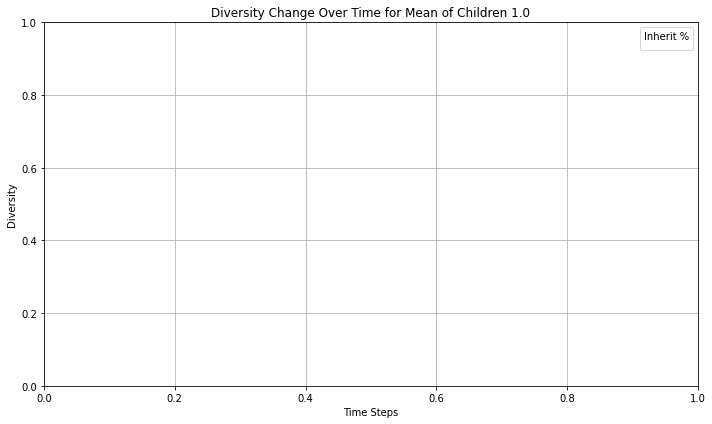

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Skipping Inherit 0%, Mean of Children 2.0 due to no data
Skipping Inherit 25%, Mean of Children 2.0 due to no data
Skipping Inherit 50%, Mean of Children 2.0 due to no data
Skipping Inherit False%, Mean of Children 2.0 due to no data


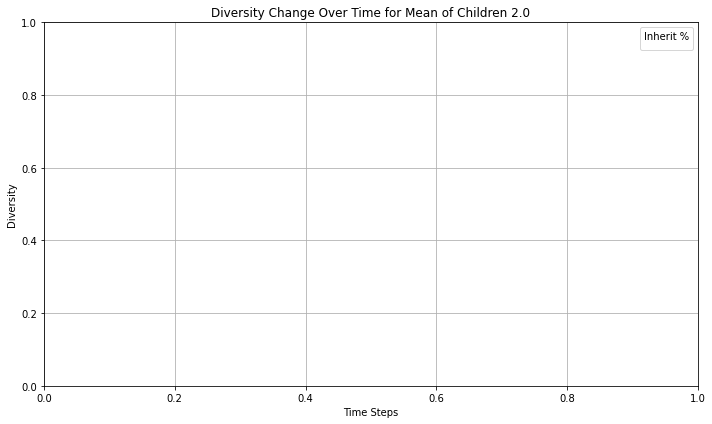

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Skipping Inherit 0%, Mean of Children 3.0 due to no data
Skipping Inherit 25%, Mean of Children 3.0 due to no data
Skipping Inherit 50%, Mean of Children 3.0 due to no data
Skipping Inherit False%, Mean of Children 3.0 due to no data


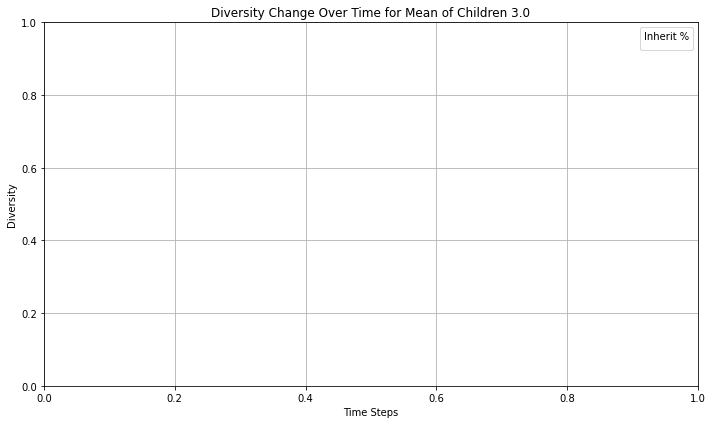

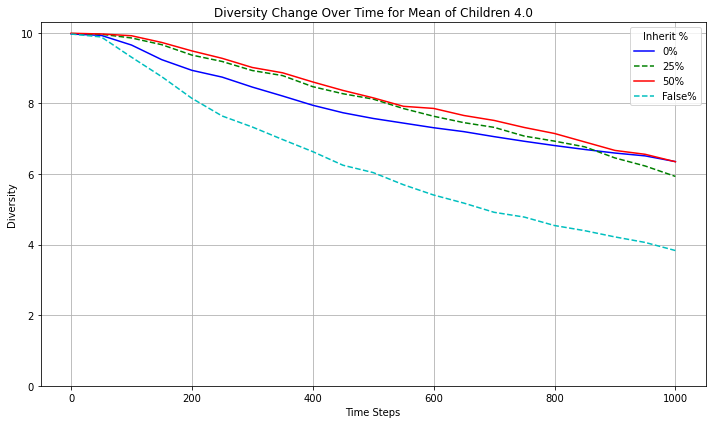

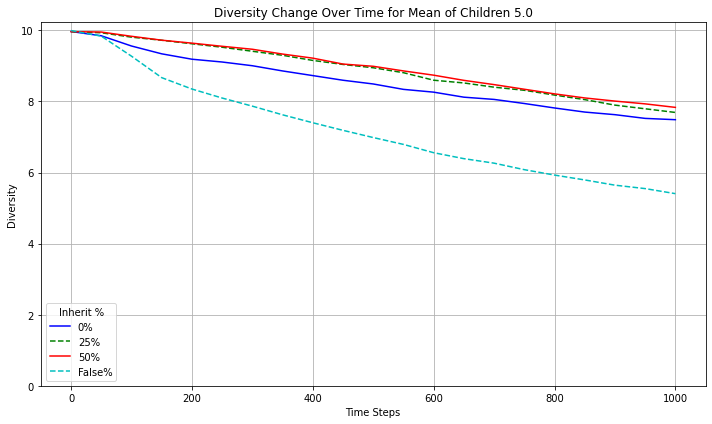

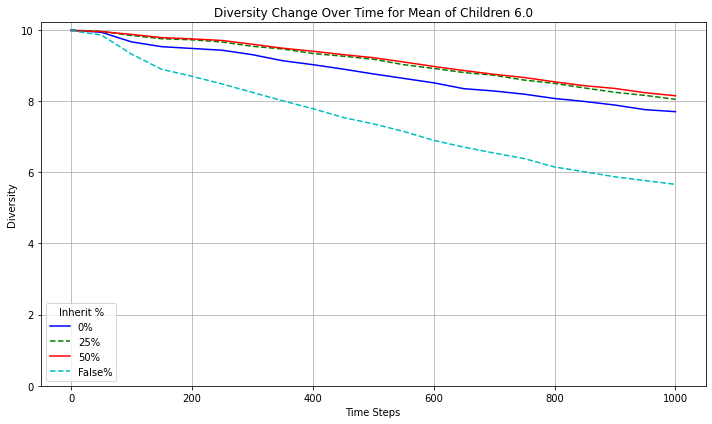

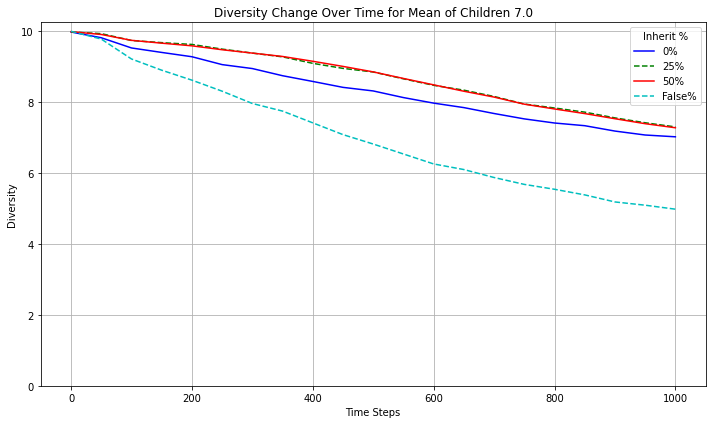

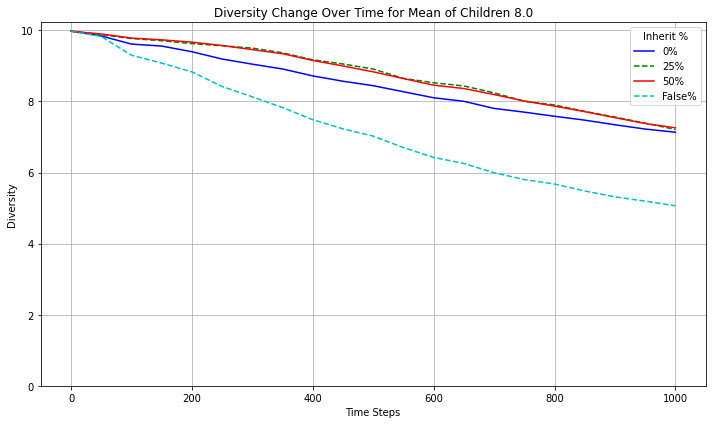

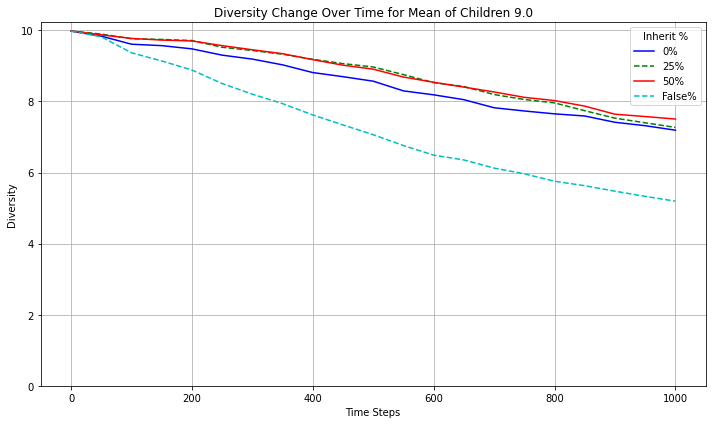

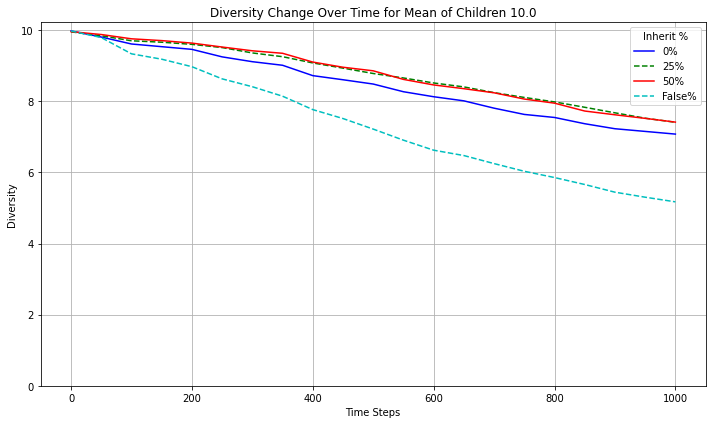

In [42]:
#heat_diversity_comm_level(GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children')
#diversity_change_graphs(GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children', limitant = True)
#diversity_change_by_row(GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children', limitant = True)
#diversity_change_by_column(GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children', limitant = True)

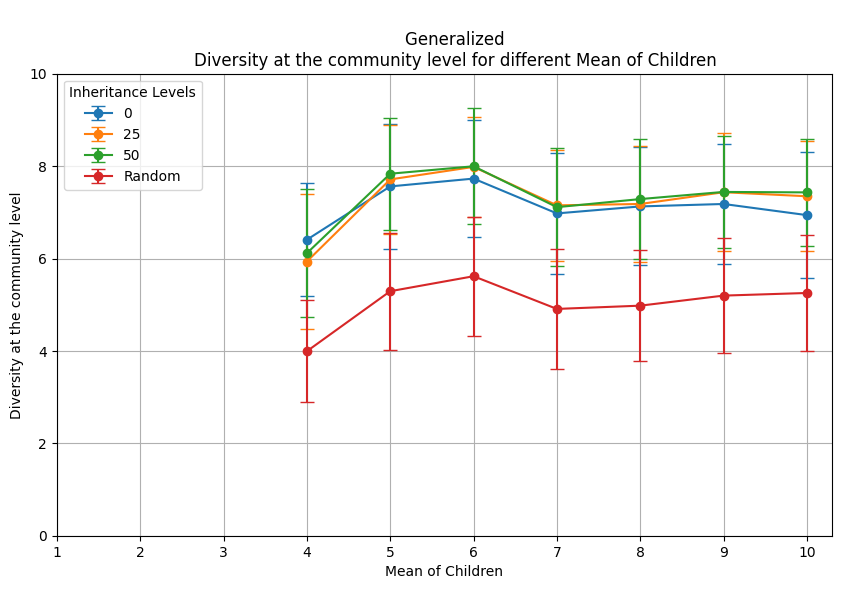

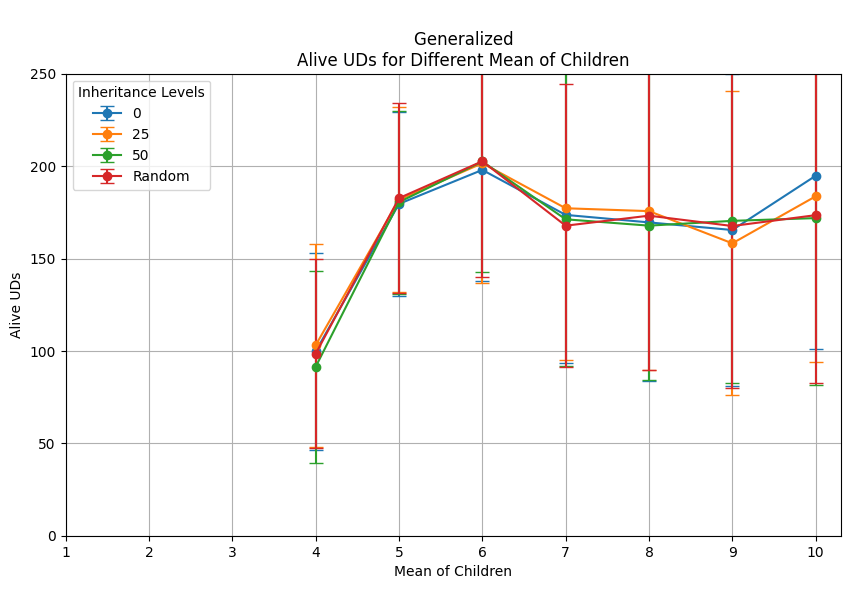

In [34]:
transversal_changes(GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children')
transversal_alive(GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children')

# Pop dynamics

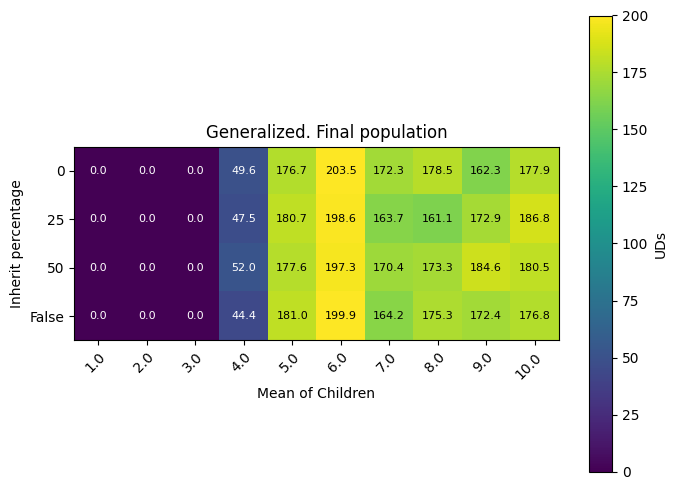

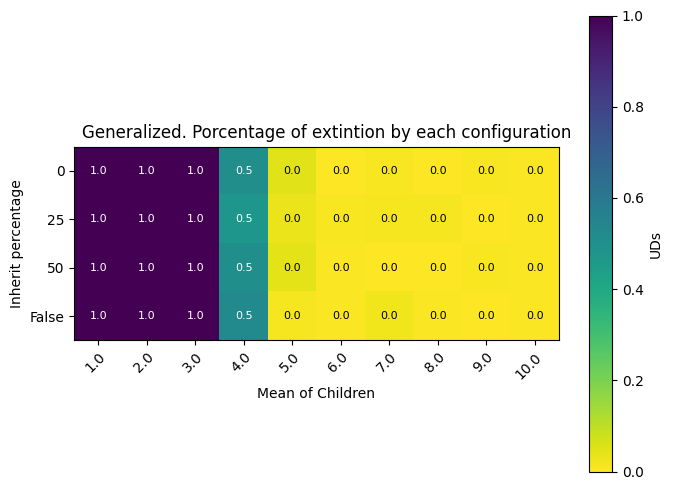

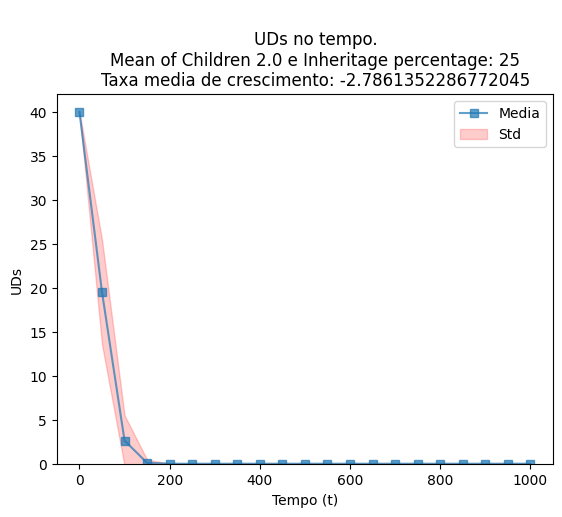

In [17]:
heat_population(GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children')
heat_percentage_population(GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children')
plot_specific_alivegraph(1, 1, GcM_datos, inherits, Gcalphas, 'Generalized', variable='Mean of Children')

## Mean varieties

In [35]:
# This experiment has different values for Initial varieties mv NEW TRY!
prob_morte = 0.06 #beta
media = 4 # Mean
m = 40
#v = 10 # Initial varieties
mv = 10
inherits = [0,25,50, 'False']
# inherits = [0,25,50] #Values for inherit
#inherits = [0, 'False'] #Values for inherit
Gmvalphas = np.linspace(1,mv,mv)# Mean varieties from 1 to mv
# For data of behaviour
vM = np.empty((len(inherits), len(Gmvalphas)), dtype=object) # alive, mean and diversity levels

punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))
experiments = 300


print(vM.shape)
start = time.time()
print(f"started at:  {datetime.now()}")
for i, inherit in enumerate(inherits):
    for j, mvarieties  in enumerate(Gmvalphas):
        star_configuration = time.time()
        #For population dynamics
        list_alive_UDs = []
        list_vivas_puntos_vista = []
        tasas_crecimiento = []
        #For diversity dynamics
        data_step_mean_var_ud = []
        data_step_var_system = []
        data_step_unique_system = []
        print(f"Experiments with inheritance {inherit} Initial UDs {m} and Mean varieties {mvarieties}")
        #Lists to store experiments' diversity data
        data_endo_mean_ud = []
        data_endo_com_level = []
        data_endo_total_varieties = []
        original_media = media
        #To see how frequent goes to extintion
        contador = 0
        for experiment in range(1, experiments+1):
            print(f'experimento {experiment}')
            ## Clans
            clans = (list(range(1, 4)) * (int(m) // 3 + 1))[:int(m)] # Just 3 clans
            random.shuffle(clans)
            if inherit != 'False':
                #### Initialization
                UD_generalized.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_generalized(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_generalized.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(10))]
                    for ud in UD_generalized.uds.values():
                        for _ in range(int(mvarieties)):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_generalized.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Gmvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), inherit, True, 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_generalized.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_generalized.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            else:# Now with inherit == False
                #### Initialization
                UD_generalized_al_inh.uds = {}
                instancias_ud = []
                for id_ud in range(1, int(m) + 1):
                    instancias_ud.append(UD_generalized_al_inh(id_ud, media, clans.pop()))
                ## Varieties
                limited_varieties = True
                if limited_varieties == False:
                    for id_ud, ud in UD_generalized_al_inh.uds.items():
                        for _ in range(3):
                            ud.varieties.append(Variety())
                else:
                    initial_varieties = [Variety() for _ in range (int(10))]
                    for ud in UD_generalized_al_inh.uds.values():
                        for _ in range(int(mvarieties)):
                            ud.varieties.append(random.choice(initial_varieties))   
                # Lists for graphs
                vivas_puntos_vista = [int(m)]
                vivas_tasa_crecimiento = [int(m)]
        #             mortas_puntos_vista = [0]
                #For diversity
                mean_var_ud = []
                var_system = []
                unique_system = []
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                # Simulation
                for t in range(1, tiempo):
                    uds_copy = {id_ud: ud for id_ud, ud in UD_generalized_al_inh.uds.items() if ud.activa}
                    items = list(uds_copy.items())
                    random.shuffle(items)
                    uds_copy = dict(items)
                    alive = len(uds_copy)
                    if alive > 200 and (media == original_media):
                        media -= media//2
                        if media >= 4:
                            media = media //2
                    elif alive < 150 and media < original_media:
                        media = original_media
                    if not uds_copy: #Extintion
                        # Only 0
                        print(f"acabó en 0 el experimento {experiment} con herencia {inherits[i]} con unidades {Gmvalphas[j]}")
                        contador += 1
                        break         
                    # Cycle:
                    varieties_list = [var for ud in uds_copy.values() for var in ud.varieties]
                    for id_ud, ud in uds_copy.items():
                        ud.ter_filho()
                        ud.buscar_ud(uds_copy, int(media), varieties_list, True, int(mvarieties), 0.2)
                        ud.incrementar_idade()
                        ud.death_probability(prob_morte)
                    # Collecting data
                    vivas_tasa_crecimiento.append(len([ud for id, ud in uds_copy.items() if ud.activa]))
                    if t % punto_vista == 0:
                        viv = len([ud for id, ud in uds_copy.items() if ud.activa])
                        #mort = len([ud for id, ud in uds_copy.items() if not ud.activa])
                        vivas_puntos_vista.append(viv)
                        # For diversity
                        var_ud = []
                        var_total = []
                        for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                            var_ud.append(len(ud.varieties))
                            for variety in ud.varieties:
                                var_total.append(variety.variety_id)
                        mean_var_ud.append(np.mean(var_ud))
                        var_system.append(len(var_total))
                        unique_system.append(len(set(var_total))) 
                viv = len([ud for id, ud in UD_generalized_al_inh.uds.items() if ud.activa])
                vivas_puntos_vista.append(viv)
                # For diversity
                var_ud = []
                var_total = []
                for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                    var_ud.append(len(ud.varieties))
                    for variety in ud.varieties:
                        var_total.append(variety.variety_id)
                mean_var_ud.append(np.mean(var_ud))
                var_system.append(len(var_total))
                unique_system.append(len(set(var_total)))
                alive = (len([ud for id, ud in uds_copy.items() if ud.activa]))
                if alive >= 1:   
                    total_varieties = []
                    varieties_per_UD = []
                    for ud in [ud for ud in UD_generalized_al_inh.uds.values() if ud.activa ==True]:
                        varieties_per_UD.append(len(ud.varieties))
                        for variety in ud.varieties:
                            total_varieties.append(variety.variety_id)
                    data_endo_mean_ud.append(np.mean(varieties_per_UD))
                    data_endo_com_level.append(len(set(total_varieties)))
                    data_endo_total_varieties.append(total_varieties)
            
            
            # Final collection of the data after the simulation!
            if len(uds_copy) > 0:  # Only collect data if the system is alive
                list_alive_UDs.append(len([ud for id, ud in uds_copy.items() if ud.activa == True]))  # For heatmap
                list_vivas_puntos_vista.append(vivas_puntos_vista)
                data_step_var_system.append(var_system)
                data_step_unique_system.append(unique_system)
                data_step_mean_var_ud.append(mean_var_ud)
            
            data_inherit_endo = [data_endo_mean_ud, data_endo_com_level, data_endo_total_varieties]
        data_steps_inherit_endo = [data_step_var_system, data_step_unique_system, data_step_mean_var_ud]
        media = original_media
        end_config = time.time()
        if list_alive_UDs:  # Check if there's valid data (i.e., the system survived)
            vM[i][j] = {
                'alive': np.mean(list_alive_UDs),
                'std': np.std(list_alive_UDs),
                'time used': end_config - star_configuration,
                'percentage_extinction': contador / experiments,
                'tempo': tempo, 
                'mean': np.mean(list_vivas_puntos_vista, axis=0), 
                'std': np.std(list_vivas_puntos_vista, axis=0),
                'growth rate': np.mean([np.mean(lista) for lista in tasas_crecimiento]),
                'diversity_info': data_inherit_endo,
                'diversity_info_steps': data_steps_inherit_endo,
            }
        else:  # Handle extinction-only scenarios
            vM[i][j] = {
                'alive': None,
                'std': None,
                'time used': end_config - star_configuration,
                'percentage_extinction': 1.0,  # All experiments went extinct
                'tempo': None, 
                'mean': None, 
                'std': None,
                'growth rate': None,
                'diversity_info': None,
                'diversity_info_steps': None,
            }
        print(f"""
The total time of the configuration of inherit percentage {inherit}, 
  initial UDs {m} and Mean varieties {mvarieties} is  {end_config - star_configuration}
        """)
# Folder
folder_name = 'Experiments_kinship_inheritance_parameters_newtrye'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)
# Heatmap and std
heat_std = os.path.join(folder_name, 'Generalized_Initial_Mean_varieties.npy')
np.save(heat_std, vM)
now = datetime.now()
finish = time.time()
print(f"""
It finished at: {now}
It lasted {finish-start}
""")
print("done")

(4, 10)
started at:  2024-12-14 05:33:39.841580
Experiments with inheritance 0 Initial UDs 40 and Mean varieties 1.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia 0 con unidades 1.0
experimento 3
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 1.0
experimento 5
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 1.0
experimento 7
acabó en 0 el experimento 7 con herencia 0 con unidades 1.0
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 1.0
experimento 10
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 0 con unidades 1.0
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 1.0
experimento 14
experimento 15
acabó en 0 el experimento 15 con herencia 0 con unidades 1.0
experimento 16
acabó en 0 el experimento 16 con herencia 0 con unidades 1.0
experimento 17
experimento 18
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con 

acabó en 0 el experimento 185 con herencia 0 con unidades 1.0
experimento 186
acabó en 0 el experimento 186 con herencia 0 con unidades 1.0
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia 0 con unidades 1.0
experimento 189
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia 0 con unidades 1.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 0 con unidades 1.0
experimento 194
acabó en 0 el experimento 194 con herencia 0 con unidades 1.0
experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia 0 con unidades 1.0
experimento 197
acabó en 0 el experimento 197 con herencia 0 con unidades 1.0
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 1.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 1.0
experimento 201
acabó en 0 el experimento 201 con herencia 0 con unidades 1.0
experimento 202
experimento 203
experimento 204
experimento 20

experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 0 con unidades 2.0
experimento 48
acabó en 0 el experimento 48 con herencia 0 con unidades 2.0
experimento 49
acabó en 0 el experimento 49 con herencia 0 con unidades 2.0
experimento 50
acabó en 0 el experimento 50 con herencia 0 con unidades 2.0
experimento 51
acabó en 0 el experimento 51 con herencia 0 con unidades 2.0
experimento 52
acabó en 0 el experimento 52 con herencia 0 con unidades 2.0
experimento 53
acabó en 0 el experimento 53 con herencia 0 con unidades 2.0
experimento 54
experimento 55
experimento 56
acabó en 0 el experimento 56 con herencia 0 con unidades 2.0
experimento 57
experimento 58
experimento 59
acabó en 0 el experimento 59 con herencia 0 con unidades 2.0
experimento 60
acabó en 0 el experimento 60 con herencia 0 con unidades 2.0
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 0 con unidades 2.0
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia 0 

experimento 212
acabó en 0 el experimento 212 con herencia 0 con unidades 2.0
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 0 con unidades 2.0
experimento 215
acabó en 0 el experimento 215 con herencia 0 con unidades 2.0
experimento 216
acabó en 0 el experimento 216 con herencia 0 con unidades 2.0
experimento 217
acabó en 0 el experimento 217 con herencia 0 con unidades 2.0
experimento 218
experimento 219
experimento 220
experimento 221
acabó en 0 el experimento 221 con herencia 0 con unidades 2.0
experimento 222
experimento 223
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia 0 con unidades 2.0
experimento 226
acabó en 0 el experimento 226 con herencia 0 con unidades 2.0
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia 0 con unidades 2.0
experimento 229
acabó en 0 el experimento 229 con herencia 0 con unidades 2.0
experimento 230
experimento 231
acabó en 0 el experimento 231 con herencia 0 con unidades 2.

experimento 87
acabó en 0 el experimento 87 con herencia 0 con unidades 3.0
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia 0 con unidades 3.0
experimento 91
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 0 con unidades 3.0
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 0 con unidades 3.0
experimento 97
experimento 98
acabó en 0 el experimento 98 con herencia 0 con unidades 3.0
experimento 99
acabó en 0 el experimento 99 con herencia 0 con unidades 3.0
experimento 100
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 3.0
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia 0 con unidades 3.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 0 con unidades 3.0
experimento 107
acabó en 0 el experimento 107 con herencia 0 con unidades 3.0
experimento 108
experimento 109
acabó en 0 el experimento 109 c

acabó en 0 el experimento 247 con herencia 0 con unidades 3.0
experimento 248
acabó en 0 el experimento 248 con herencia 0 con unidades 3.0
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 0 con unidades 3.0
experimento 251
acabó en 0 el experimento 251 con herencia 0 con unidades 3.0
experimento 252
acabó en 0 el experimento 252 con herencia 0 con unidades 3.0
experimento 253
acabó en 0 el experimento 253 con herencia 0 con unidades 3.0
experimento 254
experimento 255
acabó en 0 el experimento 255 con herencia 0 con unidades 3.0
experimento 256
experimento 257
experimento 258
experimento 259
experimento 260
acabó en 0 el experimento 260 con herencia 0 con unidades 3.0
experimento 261
acabó en 0 el experimento 261 con herencia 0 con unidades 3.0
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia 0 con unidades 3.0
experimento 264
experimento 265
experimento 266
acabó en 0 el experimento 266 con herencia 0 con unidades 3.0
experimento 26

acabó en 0 el experimento 131 con herencia 0 con unidades 4.0
experimento 132
acabó en 0 el experimento 132 con herencia 0 con unidades 4.0
experimento 133
acabó en 0 el experimento 133 con herencia 0 con unidades 4.0
experimento 134
experimento 135
acabó en 0 el experimento 135 con herencia 0 con unidades 4.0
experimento 136
experimento 137
acabó en 0 el experimento 137 con herencia 0 con unidades 4.0
experimento 138
experimento 139
experimento 140
acabó en 0 el experimento 140 con herencia 0 con unidades 4.0
experimento 141
experimento 142
experimento 143
experimento 144
experimento 145
experimento 146
acabó en 0 el experimento 146 con herencia 0 con unidades 4.0
experimento 147
acabó en 0 el experimento 147 con herencia 0 con unidades 4.0
experimento 148
experimento 149
acabó en 0 el experimento 149 con herencia 0 con unidades 4.0
experimento 150
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 0 con unidades 4.0
experimento 153
acabó en 0 el experimento 15

acabó en 0 el experimento 1 con herencia 0 con unidades 5.0
experimento 2
experimento 3
acabó en 0 el experimento 3 con herencia 0 con unidades 5.0
experimento 4
acabó en 0 el experimento 4 con herencia 0 con unidades 5.0
experimento 5
acabó en 0 el experimento 5 con herencia 0 con unidades 5.0
experimento 6
acabó en 0 el experimento 6 con herencia 0 con unidades 5.0
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia 0 con unidades 5.0
experimento 9
acabó en 0 el experimento 9 con herencia 0 con unidades 5.0
experimento 10
experimento 11
experimento 12
experimento 13
acabó en 0 el experimento 13 con herencia 0 con unidades 5.0
experimento 14
experimento 15
experimento 16
experimento 17
experimento 18
acabó en 0 el experimento 18 con herencia 0 con unidades 5.0
experimento 19
acabó en 0 el experimento 19 con herencia 0 con unidades 5.0
experimento 20
acabó en 0 el experimento 20 con herencia 0 con unidades 5.0
experimento 21
acabó en 0 el experimento 21 con herencia 0 

experimento 191
experimento 192
experimento 193
experimento 194
acabó en 0 el experimento 194 con herencia 0 con unidades 5.0
experimento 195
acabó en 0 el experimento 195 con herencia 0 con unidades 5.0
experimento 196
experimento 197
acabó en 0 el experimento 197 con herencia 0 con unidades 5.0
experimento 198
acabó en 0 el experimento 198 con herencia 0 con unidades 5.0
experimento 199
acabó en 0 el experimento 199 con herencia 0 con unidades 5.0
experimento 200
acabó en 0 el experimento 200 con herencia 0 con unidades 5.0
experimento 201
acabó en 0 el experimento 201 con herencia 0 con unidades 5.0
experimento 202
experimento 203
acabó en 0 el experimento 203 con herencia 0 con unidades 5.0
experimento 204
experimento 205
acabó en 0 el experimento 205 con herencia 0 con unidades 5.0
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 0 con unidades 5.0
experimento 208
experimento 209
acabó en 0 el experimento 209 con herencia 0 con unidades 5.0
experimento 21

experimento 69
acabó en 0 el experimento 69 con herencia 0 con unidades 6.0
experimento 70
acabó en 0 el experimento 70 con herencia 0 con unidades 6.0
experimento 71
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 0 con unidades 6.0
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 0 con unidades 6.0
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia 0 con unidades 6.0
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia 0 con unidades 6.0
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 0 con unidades 6.0
experimento 86
experimento 87
experimento 88
experimento 89
experimento 90
experimento 91
acabó en 0 el experimento 91 con herencia 0 con unidades 6.0
experimento 92
experimento 93
acabó en 0 el experimento 93 con herencia 0 con unidades 6.0
experimento 94
experimento 95
experimento 96
experimento 97
acabó en 0 el ex

experimento 232
acabó en 0 el experimento 232 con herencia 0 con unidades 6.0
experimento 233
acabó en 0 el experimento 233 con herencia 0 con unidades 6.0
experimento 234
acabó en 0 el experimento 234 con herencia 0 con unidades 6.0
experimento 235
experimento 236
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 0 con unidades 6.0
experimento 240
experimento 241
acabó en 0 el experimento 241 con herencia 0 con unidades 6.0
experimento 242
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 6.0
experimento 245
experimento 246
experimento 247
acabó en 0 el experimento 247 con herencia 0 con unidades 6.0
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia 0 con unidades 6.0
experimento 250
acabó en 0 el experimento 250 con herencia 0 con unidades 6.0
experimento 251
acabó en 0 el experimento 251 con herencia 0 con unidades 6.0
experimento 252
acabó en 0 el experimento 252 con herencia 0

acabó en 0 el experimento 103 con herencia 0 con unidades 7.0
experimento 104
experimento 105
acabó en 0 el experimento 105 con herencia 0 con unidades 7.0
experimento 106
acabó en 0 el experimento 106 con herencia 0 con unidades 7.0
experimento 107
experimento 108
acabó en 0 el experimento 108 con herencia 0 con unidades 7.0
experimento 109
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 7.0
experimento 112
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 7.0
experimento 115
experimento 116
acabó en 0 el experimento 116 con herencia 0 con unidades 7.0
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 7.0
experimento 118
experimento 119
experimento 120
acabó en 0 el experimento 120 con herencia 0 con unidades 7.0
experimento 121
acabó en 0 el experimento 121 con herencia 0 con unidades 7.0
experimento 122
acabó en 0 el experimento 122 con herencia 0 con unidades 7.0
experimento 12

experimento 271
acabó en 0 el experimento 271 con herencia 0 con unidades 7.0
experimento 272
acabó en 0 el experimento 272 con herencia 0 con unidades 7.0
experimento 273
experimento 274
acabó en 0 el experimento 274 con herencia 0 con unidades 7.0
experimento 275
experimento 276
acabó en 0 el experimento 276 con herencia 0 con unidades 7.0
experimento 277
acabó en 0 el experimento 277 con herencia 0 con unidades 7.0
experimento 278
acabó en 0 el experimento 278 con herencia 0 con unidades 7.0
experimento 279
acabó en 0 el experimento 279 con herencia 0 con unidades 7.0
experimento 280
acabó en 0 el experimento 280 con herencia 0 con unidades 7.0
experimento 281
experimento 282
experimento 283
acabó en 0 el experimento 283 con herencia 0 con unidades 7.0
experimento 284
experimento 285
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia 0 con unidades 7.0
experimento 288
acabó en 0 el experimento 288 con herencia 0 con unidades 7.0
experimento 289
experimento 29

acabó en 0 el experimento 154 con herencia 0 con unidades 8.0
experimento 155
acabó en 0 el experimento 155 con herencia 0 con unidades 8.0
experimento 156
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia 0 con unidades 8.0
experimento 159
acabó en 0 el experimento 159 con herencia 0 con unidades 8.0
experimento 160
experimento 161
experimento 162
experimento 163
experimento 164
experimento 165
acabó en 0 el experimento 165 con herencia 0 con unidades 8.0
experimento 166
acabó en 0 el experimento 166 con herencia 0 con unidades 8.0
experimento 167
experimento 168
experimento 169
acabó en 0 el experimento 169 con herencia 0 con unidades 8.0
experimento 170
acabó en 0 el experimento 170 con herencia 0 con unidades 8.0
experimento 171
acabó en 0 el experimento 171 con herencia 0 con unidades 8.0
experimento 172
acabó en 0 el experimento 172 con herencia 0 con unidades 8.0
experimento 173
experimento 174
acabó en 0 el experimento 174 con herencia 0 con unidades 8.

acabó en 0 el experimento 26 con herencia 0 con unidades 9.0
experimento 27
acabó en 0 el experimento 27 con herencia 0 con unidades 9.0
experimento 28
acabó en 0 el experimento 28 con herencia 0 con unidades 9.0
experimento 29
acabó en 0 el experimento 29 con herencia 0 con unidades 9.0
experimento 30
acabó en 0 el experimento 30 con herencia 0 con unidades 9.0
experimento 31
acabó en 0 el experimento 31 con herencia 0 con unidades 9.0
experimento 32
experimento 33
acabó en 0 el experimento 33 con herencia 0 con unidades 9.0
experimento 34
acabó en 0 el experimento 34 con herencia 0 con unidades 9.0
experimento 35
acabó en 0 el experimento 35 con herencia 0 con unidades 9.0
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
experimento 41
acabó en 0 el experimento 41 con herencia 0 con unidades 9.0
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 0 con unidades 9.0
experimento 44
experimento 45
experimento 46
experimento 47
experimento 48

acabó en 0 el experimento 224 con herencia 0 con unidades 9.0
experimento 225
acabó en 0 el experimento 225 con herencia 0 con unidades 9.0
experimento 226
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia 0 con unidades 9.0
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 0 con unidades 9.0
experimento 231
experimento 232
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 0 con unidades 9.0
experimento 235
acabó en 0 el experimento 235 con herencia 0 con unidades 9.0
experimento 236
acabó en 0 el experimento 236 con herencia 0 con unidades 9.0
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 0 con unidades 9.0
experimento 240
acabó en 0 el experimento 240 con herencia 0 con unidades 9.0
experimento 241
acabó en 0 el experimento 241 con herencia 0 con unidades 9.0
experimento 242
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia 0 con unidades 9.

experimento 100
acabó en 0 el experimento 100 con herencia 0 con unidades 10.0
experimento 101
experimento 102
acabó en 0 el experimento 102 con herencia 0 con unidades 10.0
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia 0 con unidades 10.0
experimento 105
experimento 106
experimento 107
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 0 con unidades 10.0
experimento 110
acabó en 0 el experimento 110 con herencia 0 con unidades 10.0
experimento 111
acabó en 0 el experimento 111 con herencia 0 con unidades 10.0
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia 0 con unidades 10.0
experimento 114
acabó en 0 el experimento 114 con herencia 0 con unidades 10.0
experimento 115
acabó en 0 el experimento 115 con herencia 0 con unidades 10.0
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia 0 con unidades 10.0
experimento 118
experimento 119
experimento 120
acabó en 0 el experimento 120 con 

acabó en 0 el experimento 268 con herencia 0 con unidades 10.0
experimento 269
experimento 270
experimento 271
experimento 272
experimento 273
acabó en 0 el experimento 273 con herencia 0 con unidades 10.0
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia 0 con unidades 10.0
experimento 276
acabó en 0 el experimento 276 con herencia 0 con unidades 10.0
experimento 277
experimento 278
acabó en 0 el experimento 278 con herencia 0 con unidades 10.0
experimento 279
experimento 280
acabó en 0 el experimento 280 con herencia 0 con unidades 10.0
experimento 281
acabó en 0 el experimento 281 con herencia 0 con unidades 10.0
experimento 282
experimento 283
acabó en 0 el experimento 283 con herencia 0 con unidades 10.0
experimento 284
experimento 285
experimento 286
experimento 287
acabó en 0 el experimento 287 con herencia 0 con unidades 10.0
experimento 288
acabó en 0 el experimento 288 con herencia 0 con unidades 10.0
experimento 289
experimento 290
experimento 291
ac

experimento 140
acabó en 0 el experimento 140 con herencia 25 con unidades 1.0
experimento 141
experimento 142
experimento 143
acabó en 0 el experimento 143 con herencia 25 con unidades 1.0
experimento 144
acabó en 0 el experimento 144 con herencia 25 con unidades 1.0
experimento 145
experimento 146
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 25 con unidades 1.0
experimento 149
acabó en 0 el experimento 149 con herencia 25 con unidades 1.0
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 25 con unidades 1.0
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 1.0
experimento 154
experimento 155
acabó en 0 el experimento 155 con herencia 25 con unidades 1.0
experimento 156
experimento 157
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 1.0
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 1.0
experimento 160
acabó en 0 el experimento 160 con 

experimento 6
experimento 7
experimento 8
experimento 9
acabó en 0 el experimento 9 con herencia 25 con unidades 2.0
experimento 10
acabó en 0 el experimento 10 con herencia 25 con unidades 2.0
experimento 11
experimento 12
experimento 13
experimento 14
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia 25 con unidades 2.0
experimento 17
acabó en 0 el experimento 17 con herencia 25 con unidades 2.0
experimento 18
experimento 19
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia 25 con unidades 2.0
experimento 22
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 2.0
experimento 24
acabó en 0 el experimento 24 con herencia 25 con unidades 2.0
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 2.0
experimento 26
experimento 27
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 2.0
experimento 30
acabó en 0 el experimento 30 con herencia 25 con unidades 2.0
experiment

acabó en 0 el experimento 185 con herencia 25 con unidades 2.0
experimento 186
experimento 187
acabó en 0 el experimento 187 con herencia 25 con unidades 2.0
experimento 188
experimento 189
acabó en 0 el experimento 189 con herencia 25 con unidades 2.0
experimento 190
experimento 191
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia 25 con unidades 2.0
experimento 194
acabó en 0 el experimento 194 con herencia 25 con unidades 2.0
experimento 195
experimento 196
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia 25 con unidades 2.0
experimento 199
experimento 200
acabó en 0 el experimento 200 con herencia 25 con unidades 2.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia 25 con unidades 2.0
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia 25 con unidades 2.0
experimento 205
acabó en 0 el experimento 205 con herencia 25 con unidades 2.0
experimento 206
experimento 207
experimento 208
ex

experimento 47
acabó en 0 el experimento 47 con herencia 25 con unidades 3.0
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 25 con unidades 3.0
experimento 50
acabó en 0 el experimento 50 con herencia 25 con unidades 3.0
experimento 51
experimento 52
acabó en 0 el experimento 52 con herencia 25 con unidades 3.0
experimento 53
acabó en 0 el experimento 53 con herencia 25 con unidades 3.0
experimento 54
acabó en 0 el experimento 54 con herencia 25 con unidades 3.0
experimento 55
acabó en 0 el experimento 55 con herencia 25 con unidades 3.0
experimento 56
experimento 57
experimento 58
acabó en 0 el experimento 58 con herencia 25 con unidades 3.0
experimento 59
acabó en 0 el experimento 59 con herencia 25 con unidades 3.0
experimento 60
acabó en 0 el experimento 60 con herencia 25 con unidades 3.0
experimento 61
experimento 62
acabó en 0 el experimento 62 con herencia 25 con unidades 3.0
experimento 63
experimento 64
acabó en 0 el experimento 64 con herencia 25 con

acabó en 0 el experimento 216 con herencia 25 con unidades 3.0
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 25 con unidades 3.0
experimento 219
experimento 220
experimento 221
acabó en 0 el experimento 221 con herencia 25 con unidades 3.0
experimento 222
acabó en 0 el experimento 222 con herencia 25 con unidades 3.0
experimento 223
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia 25 con unidades 3.0
experimento 226
experimento 227
acabó en 0 el experimento 227 con herencia 25 con unidades 3.0
experimento 228
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 25 con unidades 3.0
experimento 231
experimento 232
experimento 233
acabó en 0 el experimento 233 con herencia 25 con unidades 3.0
experimento 234
experimento 235
experimento 236
experimento 237
experimento 238
acabó en 0 el experimento 238 con herencia 25 con unidades 3.0
experimento 239
experimento 240
acabó en 0 el experimento 240 con herencia 25 con

experimento 91
acabó en 0 el experimento 91 con herencia 25 con unidades 4.0
experimento 92
experimento 93
experimento 94
acabó en 0 el experimento 94 con herencia 25 con unidades 4.0
experimento 95
experimento 96
experimento 97
acabó en 0 el experimento 97 con herencia 25 con unidades 4.0
experimento 98
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 25 con unidades 4.0
experimento 101
experimento 102
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia 25 con unidades 4.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 25 con unidades 4.0
experimento 107
acabó en 0 el experimento 107 con herencia 25 con unidades 4.0
experimento 108
acabó en 0 el experimento 108 con herencia 25 con unidades 4.0
experimento 109
acabó en 0 el experimento 109 con herencia 25 con unidades 4.0
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 25 con unidades 4.0
experimento 112
acabó en 0 el experimento 112 

experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia 25 con unidades 4.0
experimento 272
experimento 273
acabó en 0 el experimento 273 con herencia 25 con unidades 4.0
experimento 274
acabó en 0 el experimento 274 con herencia 25 con unidades 4.0
experimento 275
acabó en 0 el experimento 275 con herencia 25 con unidades 4.0
experimento 276
experimento 277
acabó en 0 el experimento 277 con herencia 25 con unidades 4.0
experimento 278
experimento 279
experimento 280
experimento 281
acabó en 0 el experimento 281 con herencia 25 con unidades 4.0
experimento 282
experimento 283
experimento 284
experimento 285
acabó en 0 el experimento 285 con herencia 25 con unidades 4.0
experimento 286
acabó en 0 el experimento 286 con herencia 25 con unidades 4.0
experimento 287
experimento 288
experimento 289
acabó en 0 el experimento 289 con herencia 25 con unidades 4.0
experimento 290
experimento 291
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
e

experimento 141
experimento 142
experimento 143
acabó en 0 el experimento 143 con herencia 25 con unidades 5.0
experimento 144
acabó en 0 el experimento 144 con herencia 25 con unidades 5.0
experimento 145
acabó en 0 el experimento 145 con herencia 25 con unidades 5.0
experimento 146
experimento 147
experimento 148
experimento 149
acabó en 0 el experimento 149 con herencia 25 con unidades 5.0
experimento 150
experimento 151
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 25 con unidades 5.0
experimento 154
acabó en 0 el experimento 154 con herencia 25 con unidades 5.0
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia 25 con unidades 5.0
experimento 157
acabó en 0 el experimento 157 con herencia 25 con unidades 5.0
experimento 158
acabó en 0 el experimento 158 con herencia 25 con unidades 5.0
experimento 159
acabó en 0 el experimento 159 con herencia 25 con unidades 5.0
experimento 160
acabó en 0 el experimento 160 con herencia 25 con 

experimento 22
acabó en 0 el experimento 22 con herencia 25 con unidades 6.0
experimento 23
acabó en 0 el experimento 23 con herencia 25 con unidades 6.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 25 con unidades 6.0
experimento 26
acabó en 0 el experimento 26 con herencia 25 con unidades 6.0
experimento 27
acabó en 0 el experimento 27 con herencia 25 con unidades 6.0
experimento 28
experimento 29
acabó en 0 el experimento 29 con herencia 25 con unidades 6.0
experimento 30
experimento 31
experimento 32
acabó en 0 el experimento 32 con herencia 25 con unidades 6.0
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 6.0
experimento 34
experimento 35
acabó en 0 el experimento 35 con herencia 25 con unidades 6.0
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 6.0
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 6.0
experimento 39
experimento 40
acabó en 0 el experimento 40 con 

experimento 199
acabó en 0 el experimento 199 con herencia 25 con unidades 6.0
experimento 200
acabó en 0 el experimento 200 con herencia 25 con unidades 6.0
experimento 201
experimento 202
experimento 203
experimento 204
experimento 205
acabó en 0 el experimento 205 con herencia 25 con unidades 6.0
experimento 206
acabó en 0 el experimento 206 con herencia 25 con unidades 6.0
experimento 207
experimento 208
acabó en 0 el experimento 208 con herencia 25 con unidades 6.0
experimento 209
acabó en 0 el experimento 209 con herencia 25 con unidades 6.0
experimento 210
acabó en 0 el experimento 210 con herencia 25 con unidades 6.0
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 25 con unidades 6.0
experimento 213
acabó en 0 el experimento 213 con herencia 25 con unidades 6.0
experimento 214
experimento 215
acabó en 0 el experimento 215 con herencia 25 con unidades 6.0
experimento 216
acabó en 0 el experimento 216 con herencia 25 con unidades 6.0
experimento 217
aca

acabó en 0 el experimento 74 con herencia 25 con unidades 7.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia 25 con unidades 7.0
experimento 77
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia 25 con unidades 7.0
experimento 81
acabó en 0 el experimento 81 con herencia 25 con unidades 7.0
experimento 82
acabó en 0 el experimento 82 con herencia 25 con unidades 7.0
experimento 83
acabó en 0 el experimento 83 con herencia 25 con unidades 7.0
experimento 84
experimento 85
acabó en 0 el experimento 85 con herencia 25 con unidades 7.0
experimento 86
experimento 87
acabó en 0 el experimento 87 con herencia 25 con unidades 7.0
experimento 88
acabó en 0 el experimento 88 con herencia 25 con unidades 7.0
experimento 89
experimento 90
experimento 91
experimento 92
acabó en 0 el experimento 92 con herencia 25 con unidades 7.0
experimento 93
acabó en 0 el experimento 93 con herencia 25 con unidades 7.0
experimento 94
experimento 95
aca

acabó en 0 el experimento 251 con herencia 25 con unidades 7.0
experimento 252
acabó en 0 el experimento 252 con herencia 25 con unidades 7.0
experimento 253
experimento 254
acabó en 0 el experimento 254 con herencia 25 con unidades 7.0
experimento 255
acabó en 0 el experimento 255 con herencia 25 con unidades 7.0
experimento 256
acabó en 0 el experimento 256 con herencia 25 con unidades 7.0
experimento 257
experimento 258
experimento 259
experimento 260
experimento 261
experimento 262
experimento 263
acabó en 0 el experimento 263 con herencia 25 con unidades 7.0
experimento 264
experimento 265
experimento 266
acabó en 0 el experimento 266 con herencia 25 con unidades 7.0
experimento 267
experimento 268
acabó en 0 el experimento 268 con herencia 25 con unidades 7.0
experimento 269
acabó en 0 el experimento 269 con herencia 25 con unidades 7.0
experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia 25 con unidades 7.0
experimento 272
experimento 273
experimento 274
ex

acabó en 0 el experimento 124 con herencia 25 con unidades 8.0
experimento 125
experimento 126
experimento 127
experimento 128
experimento 129
acabó en 0 el experimento 129 con herencia 25 con unidades 8.0
experimento 130
experimento 131
experimento 132
experimento 133
experimento 134
acabó en 0 el experimento 134 con herencia 25 con unidades 8.0
experimento 135
experimento 136
experimento 137
experimento 138
acabó en 0 el experimento 138 con herencia 25 con unidades 8.0
experimento 139
experimento 140
experimento 141
experimento 142
experimento 143
acabó en 0 el experimento 143 con herencia 25 con unidades 8.0
experimento 144
acabó en 0 el experimento 144 con herencia 25 con unidades 8.0
experimento 145
acabó en 0 el experimento 145 con herencia 25 con unidades 8.0
experimento 146
acabó en 0 el experimento 146 con herencia 25 con unidades 8.0
experimento 147
experimento 148
acabó en 0 el experimento 148 con herencia 25 con unidades 8.0
experimento 149
experimento 150
acabó en 0 el exp

acabó en 0 el experimento 293 con herencia 25 con unidades 8.0
experimento 294
acabó en 0 el experimento 294 con herencia 25 con unidades 8.0
experimento 295
acabó en 0 el experimento 295 con herencia 25 con unidades 8.0
experimento 296
experimento 297
experimento 298
acabó en 0 el experimento 298 con herencia 25 con unidades 8.0
experimento 299
acabó en 0 el experimento 299 con herencia 25 con unidades 8.0
experimento 300
acabó en 0 el experimento 300 con herencia 25 con unidades 8.0

The total time of the configuration of inherit percentage 25, 
  initial UDs 40 and Mean varieties 8.0 is  717.9013829231262
        
Experiments with inheritance 25 Initial UDs 40 and Mean varieties 9.0
experimento 1
acabó en 0 el experimento 1 con herencia 25 con unidades 9.0
experimento 2
acabó en 0 el experimento 2 con herencia 25 con unidades 9.0
experimento 3
acabó en 0 el experimento 3 con herencia 25 con unidades 9.0
experimento 4
experimento 5
experimento 6
acabó en 0 el experimento 6 con herenc

acabó en 0 el experimento 160 con herencia 25 con unidades 9.0
experimento 161
acabó en 0 el experimento 161 con herencia 25 con unidades 9.0
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia 25 con unidades 9.0
experimento 164
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 25 con unidades 9.0
experimento 167
acabó en 0 el experimento 167 con herencia 25 con unidades 9.0
experimento 168
acabó en 0 el experimento 168 con herencia 25 con unidades 9.0
experimento 169
experimento 170
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia 25 con unidades 9.0
experimento 173
experimento 174
experimento 175
experimento 176
experimento 177
experimento 178
experimento 179
experimento 180
experimento 181
acabó en 0 el experimento 181 con herencia 25 con unidades 9.0
experimento 182
experimento 183
experimento 184
acabó en 0 el experimento 184 con herencia 25 con unidades 9.0
experimento 185
experimento 186
acabó en 0 el exp

acabó en 0 el experimento 32 con herencia 25 con unidades 10.0
experimento 33
acabó en 0 el experimento 33 con herencia 25 con unidades 10.0
experimento 34
experimento 35
experimento 36
acabó en 0 el experimento 36 con herencia 25 con unidades 10.0
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia 25 con unidades 10.0
experimento 39
acabó en 0 el experimento 39 con herencia 25 con unidades 10.0
experimento 40
acabó en 0 el experimento 40 con herencia 25 con unidades 10.0
experimento 41
experimento 42
experimento 43
acabó en 0 el experimento 43 con herencia 25 con unidades 10.0
experimento 44
acabó en 0 el experimento 44 con herencia 25 con unidades 10.0
experimento 45
acabó en 0 el experimento 45 con herencia 25 con unidades 10.0
experimento 46
acabó en 0 el experimento 46 con herencia 25 con unidades 10.0
experimento 47
acabó en 0 el experimento 47 con herencia 25 con unidades 10.0
experimento 48
acabó en 0 el experimento 48 con herencia 25 con unidades 10.0
expe

experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia 25 con unidades 10.0
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia 25 con unidades 10.0
experimento 199
acabó en 0 el experimento 199 con herencia 25 con unidades 10.0
experimento 200
acabó en 0 el experimento 200 con herencia 25 con unidades 10.0
experimento 201
acabó en 0 el experimento 201 con herencia 25 con unidades 10.0
experimento 202
experimento 203
experimento 204
experimento 205
experimento 206
experimento 207
acabó en 0 el experimento 207 con herencia 25 con unidades 10.0
experimento 208
acabó en 0 el experimento 208 con herencia 25 con unidades 10.0
experimento 209
acabó en 0 el experimento 209 con herencia 25 con unidades 10.0
experimento 210
acabó en 0 el experimento 210 con herencia 25 con unidades 10.0
experimento 211
experimento 212
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 25 con unidades 10.0
experimento 215
experimento 216
acabó en

experimento 59
acabó en 0 el experimento 59 con herencia 50 con unidades 1.0
experimento 60
experimento 61
experimento 62
experimento 63
acabó en 0 el experimento 63 con herencia 50 con unidades 1.0
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 1.0
experimento 66
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 1.0
experimento 68
experimento 69
acabó en 0 el experimento 69 con herencia 50 con unidades 1.0
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 1.0
experimento 72
experimento 73
experimento 74
experimento 75
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia 50 con unidades 1.0
experimento 78
experimento 79
acabó en 0 el experimento 79 con herencia 50 con unidades 1.0
experimento 80
acabó en 0 el experimento 80 con herencia 50 con unidades 1.0
experimento 81
experimento 82
acabó en 0 el experimento 82 con herencia 50 con unidades 1.0
experimento 83
acabó

experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia 50 con unidades 1.0
experimento 243
experimento 244
experimento 245
experimento 246
acabó en 0 el experimento 246 con herencia 50 con unidades 1.0
experimento 247
acabó en 0 el experimento 247 con herencia 50 con unidades 1.0
experimento 248
experimento 249
experimento 250
acabó en 0 el experimento 250 con herencia 50 con unidades 1.0
experimento 251
experimento 252
acabó en 0 el experimento 252 con herencia 50 con unidades 1.0
experimento 253
acabó en 0 el experimento 253 con herencia 50 con unidades 1.0
experimento 254
acabó en 0 el experimento 254 con herencia 50 con unidades 1.0
experimento 255
acabó en 0 el experimento 255 con herencia 50 con unidades 1.0
experimento 256
acabó en 0 el experimento 256 con herencia 50 con unidades 1.0
experimento 257
acabó en 0 el experimento 257 con herencia 50 con unidades 1.0
experimento 258
acabó en 0 el experimento 258 con herencia 50 con unidades 1.0
experimento 259
exp

experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 2.0
experimento 114
experimento 115
acabó en 0 el experimento 115 con herencia 50 con unidades 2.0
experimento 116
experimento 117
experimento 118
experimento 119
acabó en 0 el experimento 119 con herencia 50 con unidades 2.0
experimento 120
acabó en 0 el experimento 120 con herencia 50 con unidades 2.0
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia 50 con unidades 2.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia 50 con unidades 2.0
experimento 125
acabó en 0 el experimento 125 con herencia 50 con unidades 2.0
experimento 126
experimento 127
acabó en 0 el experimento 127 con herencia 50 con unidades 2.0
experimento 128
experimento 129
experimento 130
acabó en 0 el experimento 130 con herencia 50 con unidades 2.0
experimento 131
acabó en 0 el experimento 131 con herencia 50 con unidades 2.0
experimento 132
experimento 133
acabó en 0 el experimento 133 con 

experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 2.0
experimento 284
experimento 285
experimento 286
acabó en 0 el experimento 286 con herencia 50 con unidades 2.0
experimento 287
experimento 288
experimento 289
acabó en 0 el experimento 289 con herencia 50 con unidades 2.0
experimento 290
acabó en 0 el experimento 290 con herencia 50 con unidades 2.0
experimento 291
acabó en 0 el experimento 291 con herencia 50 con unidades 2.0
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidades 2.0
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
acabó en 0 el experimento 297 con herencia 50 con unidades 2.0
experimento 298
acabó en 0 el experimento 298 con herencia 50 con unidades 2.0
experimento 299
acabó en 0 el experimento 299 con herencia 50 con unidades 2.0
experimento 300
acabó en 0 el experimento 300 con herencia 50 con unidades 2.0

The total time of the configuration of inherit percentage 50, 
  initial UDs 40 a

experimento 162
acabó en 0 el experimento 162 con herencia 50 con unidades 3.0
experimento 163
experimento 164
acabó en 0 el experimento 164 con herencia 50 con unidades 3.0
experimento 165
experimento 166
acabó en 0 el experimento 166 con herencia 50 con unidades 3.0
experimento 167
acabó en 0 el experimento 167 con herencia 50 con unidades 3.0
experimento 168
acabó en 0 el experimento 168 con herencia 50 con unidades 3.0
experimento 169
acabó en 0 el experimento 169 con herencia 50 con unidades 3.0
experimento 170
acabó en 0 el experimento 170 con herencia 50 con unidades 3.0
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia 50 con unidades 3.0
experimento 173
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia 50 con unidades 3.0
experimento 176
experimento 177
acabó en 0 el experimento 177 con herencia 50 con unidades 3.0
experimento 178
acabó en 0 el experimento 178 con herencia 50 con unidades 3.0
experimento 179
acabó en 0 el exper

acabó en 0 el experimento 7 con herencia 50 con unidades 4.0
experimento 8
acabó en 0 el experimento 8 con herencia 50 con unidades 4.0
experimento 9
experimento 10
acabó en 0 el experimento 10 con herencia 50 con unidades 4.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia 50 con unidades 4.0
experimento 13
experimento 14
acabó en 0 el experimento 14 con herencia 50 con unidades 4.0
experimento 15
acabó en 0 el experimento 15 con herencia 50 con unidades 4.0
experimento 16
acabó en 0 el experimento 16 con herencia 50 con unidades 4.0
experimento 17
experimento 18
experimento 19
experimento 20
acabó en 0 el experimento 20 con herencia 50 con unidades 4.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia 50 con unidades 4.0
experimento 23
acabó en 0 el experimento 23 con herencia 50 con unidades 4.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia 50 con unidades 4.0
experimento 26
acabó en 0 el experimento 26 con here

acabó en 0 el experimento 189 con herencia 50 con unidades 4.0
experimento 190
acabó en 0 el experimento 190 con herencia 50 con unidades 4.0
experimento 191
experimento 192
acabó en 0 el experimento 192 con herencia 50 con unidades 4.0
experimento 193
experimento 194
acabó en 0 el experimento 194 con herencia 50 con unidades 4.0
experimento 195
acabó en 0 el experimento 195 con herencia 50 con unidades 4.0
experimento 196
acabó en 0 el experimento 196 con herencia 50 con unidades 4.0
experimento 197
experimento 198
experimento 199
acabó en 0 el experimento 199 con herencia 50 con unidades 4.0
experimento 200
experimento 201
experimento 202
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia 50 con unidades 4.0
experimento 205
experimento 206
experimento 207
experimento 208
experimento 209
acabó en 0 el experimento 209 con herencia 50 con unidades 4.0
experimento 210
experimento 211
acabó en 0 el experimento 211 con herencia 50 con unidades 4.0
experimento 212
ex

acabó en 0 el experimento 52 con herencia 50 con unidades 5.0
experimento 53
acabó en 0 el experimento 53 con herencia 50 con unidades 5.0
experimento 54
acabó en 0 el experimento 54 con herencia 50 con unidades 5.0
experimento 55
experimento 56
experimento 57
experimento 58
experimento 59
experimento 60
acabó en 0 el experimento 60 con herencia 50 con unidades 5.0
experimento 61
acabó en 0 el experimento 61 con herencia 50 con unidades 5.0
experimento 62
experimento 63
acabó en 0 el experimento 63 con herencia 50 con unidades 5.0
experimento 64
experimento 65
acabó en 0 el experimento 65 con herencia 50 con unidades 5.0
experimento 66
acabó en 0 el experimento 66 con herencia 50 con unidades 5.0
experimento 67
acabó en 0 el experimento 67 con herencia 50 con unidades 5.0
experimento 68
acabó en 0 el experimento 68 con herencia 50 con unidades 5.0
experimento 69
experimento 70
experimento 71
acabó en 0 el experimento 71 con herencia 50 con unidades 5.0
experimento 72
experimento 73
aca

acabó en 0 el experimento 219 con herencia 50 con unidades 5.0
experimento 220
acabó en 0 el experimento 220 con herencia 50 con unidades 5.0
experimento 221
acabó en 0 el experimento 221 con herencia 50 con unidades 5.0
experimento 222
experimento 223
acabó en 0 el experimento 223 con herencia 50 con unidades 5.0
experimento 224
acabó en 0 el experimento 224 con herencia 50 con unidades 5.0
experimento 225
experimento 226
experimento 227
acabó en 0 el experimento 227 con herencia 50 con unidades 5.0
experimento 228
experimento 229
experimento 230
experimento 231
acabó en 0 el experimento 231 con herencia 50 con unidades 5.0
experimento 232
acabó en 0 el experimento 232 con herencia 50 con unidades 5.0
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia 50 con unidades 5.0
experimento 235
experimento 236
acabó en 0 el experimento 236 con herencia 50 con unidades 5.0
experimento 237
experimento 238
experimento 239
acabó en 0 el experimento 239 con herencia 50 con 

acabó en 0 el experimento 93 con herencia 50 con unidades 6.0
experimento 94
experimento 95
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 6.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 6.0
experimento 98
experimento 99
experimento 100
acabó en 0 el experimento 100 con herencia 50 con unidades 6.0
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 6.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 6.0
experimento 103
experimento 104
experimento 105
experimento 106
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 6.0
experimento 108
acabó en 0 el experimento 108 con herencia 50 con unidades 6.0
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 6.0
experimento 110
experimento 111
acabó en 0 el experimento 111 con herencia 50 con unidades 6.0
experimento 112
experimento 113
acabó en 0 el experimento 113 con herencia 50 con unidades 

acabó en 0 el experimento 267 con herencia 50 con unidades 6.0
experimento 268
acabó en 0 el experimento 268 con herencia 50 con unidades 6.0
experimento 269
acabó en 0 el experimento 269 con herencia 50 con unidades 6.0
experimento 270
experimento 271
acabó en 0 el experimento 271 con herencia 50 con unidades 6.0
experimento 272
experimento 273
acabó en 0 el experimento 273 con herencia 50 con unidades 6.0
experimento 274
experimento 275
acabó en 0 el experimento 275 con herencia 50 con unidades 6.0
experimento 276
experimento 277
acabó en 0 el experimento 277 con herencia 50 con unidades 6.0
experimento 278
experimento 279
acabó en 0 el experimento 279 con herencia 50 con unidades 6.0
experimento 280
acabó en 0 el experimento 280 con herencia 50 con unidades 6.0
experimento 281
acabó en 0 el experimento 281 con herencia 50 con unidades 6.0
experimento 282
experimento 283
experimento 284
acabó en 0 el experimento 284 con herencia 50 con unidades 6.0
experimento 285
experimento 286
exp

experimento 143
acabó en 0 el experimento 143 con herencia 50 con unidades 7.0
experimento 144
acabó en 0 el experimento 144 con herencia 50 con unidades 7.0
experimento 145
experimento 146
acabó en 0 el experimento 146 con herencia 50 con unidades 7.0
experimento 147
acabó en 0 el experimento 147 con herencia 50 con unidades 7.0
experimento 148
experimento 149
experimento 150
acabó en 0 el experimento 150 con herencia 50 con unidades 7.0
experimento 151
experimento 152
acabó en 0 el experimento 152 con herencia 50 con unidades 7.0
experimento 153
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 7.0
experimento 155
experimento 156
experimento 157
experimento 158
experimento 159
experimento 160
acabó en 0 el experimento 160 con herencia 50 con unidades 7.0
experimento 161
acabó en 0 el experimento 161 con herencia 50 con unidades 7.0
experimento 162
experimento 163
acabó en 0 el experimento 163 con herencia 50 con unidades 7.0
experimento 164
acabó en 0 el expe

experimento 35
acabó en 0 el experimento 35 con herencia 50 con unidades 8.0
experimento 36
acabó en 0 el experimento 36 con herencia 50 con unidades 8.0
experimento 37
acabó en 0 el experimento 37 con herencia 50 con unidades 8.0
experimento 38
acabó en 0 el experimento 38 con herencia 50 con unidades 8.0
experimento 39
acabó en 0 el experimento 39 con herencia 50 con unidades 8.0
experimento 40
experimento 41
experimento 42
acabó en 0 el experimento 42 con herencia 50 con unidades 8.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia 50 con unidades 8.0
experimento 45
experimento 46
experimento 47
acabó en 0 el experimento 47 con herencia 50 con unidades 8.0
experimento 48
experimento 49
acabó en 0 el experimento 49 con herencia 50 con unidades 8.0
experimento 50
experimento 51
experimento 52
experimento 53
acabó en 0 el experimento 53 con herencia 50 con unidades 8.0
experimento 54
acabó en 0 el experimento 54 con herencia 50 con unidades 8.0
experimento 55
aca

acabó en 0 el experimento 207 con herencia 50 con unidades 8.0
experimento 208
experimento 209
experimento 210
experimento 211
experimento 212
acabó en 0 el experimento 212 con herencia 50 con unidades 8.0
experimento 213
experimento 214
acabó en 0 el experimento 214 con herencia 50 con unidades 8.0
experimento 215
experimento 216
acabó en 0 el experimento 216 con herencia 50 con unidades 8.0
experimento 217
experimento 218
acabó en 0 el experimento 218 con herencia 50 con unidades 8.0
experimento 219
experimento 220
experimento 221
acabó en 0 el experimento 221 con herencia 50 con unidades 8.0
experimento 222
experimento 223
experimento 224
experimento 225
acabó en 0 el experimento 225 con herencia 50 con unidades 8.0
experimento 226
experimento 227
experimento 228
acabó en 0 el experimento 228 con herencia 50 con unidades 8.0
experimento 229
experimento 230
acabó en 0 el experimento 230 con herencia 50 con unidades 8.0
experimento 231
acabó en 0 el experimento 231 con herencia 50 con

acabó en 0 el experimento 95 con herencia 50 con unidades 9.0
experimento 96
acabó en 0 el experimento 96 con herencia 50 con unidades 9.0
experimento 97
acabó en 0 el experimento 97 con herencia 50 con unidades 9.0
experimento 98
acabó en 0 el experimento 98 con herencia 50 con unidades 9.0
experimento 99
experimento 100
experimento 101
acabó en 0 el experimento 101 con herencia 50 con unidades 9.0
experimento 102
acabó en 0 el experimento 102 con herencia 50 con unidades 9.0
experimento 103
acabó en 0 el experimento 103 con herencia 50 con unidades 9.0
experimento 104
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia 50 con unidades 9.0
experimento 107
acabó en 0 el experimento 107 con herencia 50 con unidades 9.0
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia 50 con unidades 9.0
experimento 110
acabó en 0 el experimento 110 con herencia 50 con unidades 9.0
experimento 111
experimento 112
experimento 113
experimento 114
acabó en 0 

experimento 282
acabó en 0 el experimento 282 con herencia 50 con unidades 9.0
experimento 283
acabó en 0 el experimento 283 con herencia 50 con unidades 9.0
experimento 284
experimento 285
experimento 286
acabó en 0 el experimento 286 con herencia 50 con unidades 9.0
experimento 287
experimento 288
acabó en 0 el experimento 288 con herencia 50 con unidades 9.0
experimento 289
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia 50 con unidades 9.0
experimento 292
acabó en 0 el experimento 292 con herencia 50 con unidades 9.0
experimento 293
experimento 294
acabó en 0 el experimento 294 con herencia 50 con unidades 9.0
experimento 295
experimento 296
acabó en 0 el experimento 296 con herencia 50 con unidades 9.0
experimento 297
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia 50 con unidades 9.0

The total time of the configuration of inherit percentage 50, 
  initial UDs 40 and Mean varieties 9.0 is  827.2703309059143
   

experimento 148
experimento 149
experimento 150
experimento 151
acabó en 0 el experimento 151 con herencia 50 con unidades 10.0
experimento 152
experimento 153
acabó en 0 el experimento 153 con herencia 50 con unidades 10.0
experimento 154
acabó en 0 el experimento 154 con herencia 50 con unidades 10.0
experimento 155
experimento 156
acabó en 0 el experimento 156 con herencia 50 con unidades 10.0
experimento 157
acabó en 0 el experimento 157 con herencia 50 con unidades 10.0
experimento 158
experimento 159
acabó en 0 el experimento 159 con herencia 50 con unidades 10.0
experimento 160
acabó en 0 el experimento 160 con herencia 50 con unidades 10.0
experimento 161
experimento 162
acabó en 0 el experimento 162 con herencia 50 con unidades 10.0
experimento 163
acabó en 0 el experimento 163 con herencia 50 con unidades 10.0
experimento 164
acabó en 0 el experimento 164 con herencia 50 con unidades 10.0
experimento 165
acabó en 0 el experimento 165 con herencia 50 con unidades 10.0
experime

acabó en 0 el experimento 8 con herencia False con unidades 1.0
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 1.0
experimento 10
acabó en 0 el experimento 10 con herencia False con unidades 1.0
experimento 11
experimento 12
acabó en 0 el experimento 12 con herencia False con unidades 1.0
experimento 13
experimento 14
experimento 15
experimento 16
acabó en 0 el experimento 16 con herencia False con unidades 1.0
experimento 17
acabó en 0 el experimento 17 con herencia False con unidades 1.0
experimento 18
acabó en 0 el experimento 18 con herencia False con unidades 1.0
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 1.0
experimento 20
acabó en 0 el experimento 20 con herencia False con unidades 1.0
experimento 21
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 1.0
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 1.0
experimento 24
experimento 25
experimento 26
acabó en 0 el expe

experimento 172
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 1.0
experimento 174
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 1.0
experimento 176
experimento 177
acabó en 0 el experimento 177 con herencia False con unidades 1.0
experimento 178
acabó en 0 el experimento 178 con herencia False con unidades 1.0
experimento 179
experimento 180
experimento 181
experimento 182
experimento 183
experimento 184
acabó en 0 el experimento 184 con herencia False con unidades 1.0
experimento 185
experimento 186
acabó en 0 el experimento 186 con herencia False con unidades 1.0
experimento 187
experimento 188
acabó en 0 el experimento 188 con herencia False con unidades 1.0
experimento 189
experimento 190
experimento 191
acabó en 0 el experimento 191 con herencia False con unidades 1.0
experimento 192
experimento 193
acabó en 0 el experimento 193 con herencia False con unidades 1.0
experimento 194
experimento 195
acabó en 0 el experime

experimento 35
experimento 36
experimento 37
experimento 38
experimento 39
experimento 40
acabó en 0 el experimento 40 con herencia False con unidades 2.0
experimento 41
acabó en 0 el experimento 41 con herencia False con unidades 2.0
experimento 42
acabó en 0 el experimento 42 con herencia False con unidades 2.0
experimento 43
experimento 44
acabó en 0 el experimento 44 con herencia False con unidades 2.0
experimento 45
acabó en 0 el experimento 45 con herencia False con unidades 2.0
experimento 46
acabó en 0 el experimento 46 con herencia False con unidades 2.0
experimento 47
acabó en 0 el experimento 47 con herencia False con unidades 2.0
experimento 48
acabó en 0 el experimento 48 con herencia False con unidades 2.0
experimento 49
acabó en 0 el experimento 49 con herencia False con unidades 2.0
experimento 50
acabó en 0 el experimento 50 con herencia False con unidades 2.0
experimento 51
acabó en 0 el experimento 51 con herencia False con unidades 2.0
experimento 52
experimento 53


experimento 195
experimento 196
acabó en 0 el experimento 196 con herencia False con unidades 2.0
experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia False con unidades 2.0
experimento 199
acabó en 0 el experimento 199 con herencia False con unidades 2.0
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 2.0
experimento 201
acabó en 0 el experimento 201 con herencia False con unidades 2.0
experimento 202
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia False con unidades 2.0
experimento 205
experimento 206
acabó en 0 el experimento 206 con herencia False con unidades 2.0
experimento 207
acabó en 0 el experimento 207 con herencia False con unidades 2.0
experimento 208
experimento 209
acabó en 0 el experimento 209 con herencia False con unidades 2.0
experimento 210
acabó en 0 el experimento 210 con herencia False con unidades 2.0
experimento 211
acabó en 0 el experimento 211 con herencia False con unidades 2.0
ex

acabó en 0 el experimento 69 con herencia False con unidades 3.0
experimento 70
acabó en 0 el experimento 70 con herencia False con unidades 3.0
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 3.0
experimento 73
experimento 74
acabó en 0 el experimento 74 con herencia False con unidades 3.0
experimento 75
acabó en 0 el experimento 75 con herencia False con unidades 3.0
experimento 76
experimento 77
acabó en 0 el experimento 77 con herencia False con unidades 3.0
experimento 78
acabó en 0 el experimento 78 con herencia False con unidades 3.0
experimento 79
experimento 80
experimento 81
acabó en 0 el experimento 81 con herencia False con unidades 3.0
experimento 82
experimento 83
acabó en 0 el experimento 83 con herencia False con unidades 3.0
experimento 84
acabó en 0 el experimento 84 con herencia False con unidades 3.0
experimento 85
acabó en 0 el experimento 85 con herencia False con unidades 3.0
experimento 86
experimento 87
acabó en 0 el e

acabó en 0 el experimento 234 con herencia False con unidades 3.0
experimento 235
acabó en 0 el experimento 235 con herencia False con unidades 3.0
experimento 236
experimento 237
experimento 238
acabó en 0 el experimento 238 con herencia False con unidades 3.0
experimento 239
acabó en 0 el experimento 239 con herencia False con unidades 3.0
experimento 240
acabó en 0 el experimento 240 con herencia False con unidades 3.0
experimento 241
experimento 242
experimento 243
acabó en 0 el experimento 243 con herencia False con unidades 3.0
experimento 244
experimento 245
acabó en 0 el experimento 245 con herencia False con unidades 3.0
experimento 246
experimento 247
acabó en 0 el experimento 247 con herencia False con unidades 3.0
experimento 248
acabó en 0 el experimento 248 con herencia False con unidades 3.0
experimento 249
experimento 250
experimento 251
acabó en 0 el experimento 251 con herencia False con unidades 3.0
experimento 252
experimento 253
acabó en 0 el experimento 253 con he

experimento 99
acabó en 0 el experimento 99 con herencia False con unidades 4.0
experimento 100
acabó en 0 el experimento 100 con herencia False con unidades 4.0
experimento 101
acabó en 0 el experimento 101 con herencia False con unidades 4.0
experimento 102
acabó en 0 el experimento 102 con herencia False con unidades 4.0
experimento 103
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 4.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia False con unidades 4.0
experimento 107
experimento 108
experimento 109
experimento 110
acabó en 0 el experimento 110 con herencia False con unidades 4.0
experimento 111
experimento 112
acabó en 0 el experimento 112 con herencia False con unidades 4.0
experimento 113
experimento 114
acabó en 0 el experimento 114 con herencia False con unidades 4.0
experimento 115
experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia False con unidades 4.0
experimento 118
acabó en 0 el experime

experimento 258
experimento 259
experimento 260
acabó en 0 el experimento 260 con herencia False con unidades 4.0
experimento 261
experimento 262
acabó en 0 el experimento 262 con herencia False con unidades 4.0
experimento 263
acabó en 0 el experimento 263 con herencia False con unidades 4.0
experimento 264
experimento 265
acabó en 0 el experimento 265 con herencia False con unidades 4.0
experimento 266
acabó en 0 el experimento 266 con herencia False con unidades 4.0
experimento 267
experimento 268
acabó en 0 el experimento 268 con herencia False con unidades 4.0
experimento 269
experimento 270
acabó en 0 el experimento 270 con herencia False con unidades 4.0
experimento 271
experimento 272
acabó en 0 el experimento 272 con herencia False con unidades 4.0
experimento 273
acabó en 0 el experimento 273 con herencia False con unidades 4.0
experimento 274
acabó en 0 el experimento 274 con herencia False con unidades 4.0
experimento 275
acabó en 0 el experimento 275 con herencia False con

experimento 116
experimento 117
acabó en 0 el experimento 117 con herencia False con unidades 5.0
experimento 118
experimento 119
experimento 120
experimento 121
experimento 122
acabó en 0 el experimento 122 con herencia False con unidades 5.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia False con unidades 5.0
experimento 125
acabó en 0 el experimento 125 con herencia False con unidades 5.0
experimento 126
experimento 127
experimento 128
acabó en 0 el experimento 128 con herencia False con unidades 5.0
experimento 129
acabó en 0 el experimento 129 con herencia False con unidades 5.0
experimento 130
acabó en 0 el experimento 130 con herencia False con unidades 5.0
experimento 131
acabó en 0 el experimento 131 con herencia False con unidades 5.0
experimento 132
experimento 133
acabó en 0 el experimento 133 con herencia False con unidades 5.0
experimento 134
acabó en 0 el experimento 134 con herencia False con unidades 5.0
experimento 135
experimento 136
acab

experimento 288
acabó en 0 el experimento 288 con herencia False con unidades 5.0
experimento 289
acabó en 0 el experimento 289 con herencia False con unidades 5.0
experimento 290
experimento 291
acabó en 0 el experimento 291 con herencia False con unidades 5.0
experimento 292
experimento 293
experimento 294
experimento 295
experimento 296
experimento 297
experimento 298
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia False con unidades 5.0

The total time of the configuration of inherit percentage False, 
  initial UDs 40 and Mean varieties 5.0 is  799.0319306850433
        
Experiments with inheritance False Initial UDs 40 and Mean varieties 6.0
experimento 1
experimento 2
acabó en 0 el experimento 2 con herencia False con unidades 6.0
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 6.0
experimento 6
acabó en 0 el experimento 6 con herencia False con unidades 6.0
experimento 7
acabó en 0 el experimento 7

acabó en 0 el experimento 159 con herencia False con unidades 6.0
experimento 160
acabó en 0 el experimento 160 con herencia False con unidades 6.0
experimento 161
acabó en 0 el experimento 161 con herencia False con unidades 6.0
experimento 162
acabó en 0 el experimento 162 con herencia False con unidades 6.0
experimento 163
acabó en 0 el experimento 163 con herencia False con unidades 6.0
experimento 164
acabó en 0 el experimento 164 con herencia False con unidades 6.0
experimento 165
acabó en 0 el experimento 165 con herencia False con unidades 6.0
experimento 166
experimento 167
acabó en 0 el experimento 167 con herencia False con unidades 6.0
experimento 168
experimento 169
experimento 170
acabó en 0 el experimento 170 con herencia False con unidades 6.0
experimento 171
experimento 172
acabó en 0 el experimento 172 con herencia False con unidades 6.0
experimento 173
experimento 174
experimento 175
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 6.0
ex

experimento 17
experimento 18
experimento 19
acabó en 0 el experimento 19 con herencia False con unidades 7.0
experimento 20
experimento 21
acabó en 0 el experimento 21 con herencia False con unidades 7.0
experimento 22
acabó en 0 el experimento 22 con herencia False con unidades 7.0
experimento 23
acabó en 0 el experimento 23 con herencia False con unidades 7.0
experimento 24
experimento 25
acabó en 0 el experimento 25 con herencia False con unidades 7.0
experimento 26
acabó en 0 el experimento 26 con herencia False con unidades 7.0
experimento 27
experimento 28
acabó en 0 el experimento 28 con herencia False con unidades 7.0
experimento 29
experimento 30
acabó en 0 el experimento 30 con herencia False con unidades 7.0
experimento 31
experimento 32
experimento 33
experimento 34
acabó en 0 el experimento 34 con herencia False con unidades 7.0
experimento 35
experimento 36
experimento 37
experimento 38
acabó en 0 el experimento 38 con herencia False con unidades 7.0
experimento 39
exper

experimento 197
experimento 198
acabó en 0 el experimento 198 con herencia False con unidades 7.0
experimento 199
experimento 200
acabó en 0 el experimento 200 con herencia False con unidades 7.0
experimento 201
experimento 202
acabó en 0 el experimento 202 con herencia False con unidades 7.0
experimento 203
experimento 204
acabó en 0 el experimento 204 con herencia False con unidades 7.0
experimento 205
acabó en 0 el experimento 205 con herencia False con unidades 7.0
experimento 206
acabó en 0 el experimento 206 con herencia False con unidades 7.0
experimento 207
acabó en 0 el experimento 207 con herencia False con unidades 7.0
experimento 208
acabó en 0 el experimento 208 con herencia False con unidades 7.0
experimento 209
experimento 210
experimento 211
experimento 212
experimento 213
acabó en 0 el experimento 213 con herencia False con unidades 7.0
experimento 214
acabó en 0 el experimento 214 con herencia False con unidades 7.0
experimento 215
experimento 216
acabó en 0 el experi

acabó en 0 el experimento 68 con herencia False con unidades 8.0
experimento 69
acabó en 0 el experimento 69 con herencia False con unidades 8.0
experimento 70
experimento 71
experimento 72
acabó en 0 el experimento 72 con herencia False con unidades 8.0
experimento 73
acabó en 0 el experimento 73 con herencia False con unidades 8.0
experimento 74
acabó en 0 el experimento 74 con herencia False con unidades 8.0
experimento 75
experimento 76
acabó en 0 el experimento 76 con herencia False con unidades 8.0
experimento 77
acabó en 0 el experimento 77 con herencia False con unidades 8.0
experimento 78
experimento 79
experimento 80
acabó en 0 el experimento 80 con herencia False con unidades 8.0
experimento 81
experimento 82
experimento 83
experimento 84
experimento 85
experimento 86
acabó en 0 el experimento 86 con herencia False con unidades 8.0
experimento 87
experimento 88
experimento 89
experimento 90
acabó en 0 el experimento 90 con herencia False con unidades 8.0
experimento 91
exper

acabó en 0 el experimento 232 con herencia False con unidades 8.0
experimento 233
experimento 234
acabó en 0 el experimento 234 con herencia False con unidades 8.0
experimento 235
acabó en 0 el experimento 235 con herencia False con unidades 8.0
experimento 236
experimento 237
acabó en 0 el experimento 237 con herencia False con unidades 8.0
experimento 238
acabó en 0 el experimento 238 con herencia False con unidades 8.0
experimento 239
experimento 240
experimento 241
experimento 242
acabó en 0 el experimento 242 con herencia False con unidades 8.0
experimento 243
experimento 244
acabó en 0 el experimento 244 con herencia False con unidades 8.0
experimento 245
acabó en 0 el experimento 245 con herencia False con unidades 8.0
experimento 246
acabó en 0 el experimento 246 con herencia False con unidades 8.0
experimento 247
acabó en 0 el experimento 247 con herencia False con unidades 8.0
experimento 248
experimento 249
acabó en 0 el experimento 249 con herencia False con unidades 8.0
ex

acabó en 0 el experimento 103 con herencia False con unidades 9.0
experimento 104
acabó en 0 el experimento 104 con herencia False con unidades 9.0
experimento 105
experimento 106
acabó en 0 el experimento 106 con herencia False con unidades 9.0
experimento 107
experimento 108
experimento 109
acabó en 0 el experimento 109 con herencia False con unidades 9.0
experimento 110
acabó en 0 el experimento 110 con herencia False con unidades 9.0
experimento 111
experimento 112
experimento 113
experimento 114
experimento 115
experimento 116
experimento 117
experimento 118
acabó en 0 el experimento 118 con herencia False con unidades 9.0
experimento 119
experimento 120
experimento 121
acabó en 0 el experimento 121 con herencia False con unidades 9.0
experimento 122
acabó en 0 el experimento 122 con herencia False con unidades 9.0
experimento 123
experimento 124
acabó en 0 el experimento 124 con herencia False con unidades 9.0
experimento 125
experimento 126
acabó en 0 el experimento 126 con here

experimento 296
acabó en 0 el experimento 296 con herencia False con unidades 9.0
experimento 297
acabó en 0 el experimento 297 con herencia False con unidades 9.0
experimento 298
acabó en 0 el experimento 298 con herencia False con unidades 9.0
experimento 299
experimento 300
acabó en 0 el experimento 300 con herencia False con unidades 9.0

The total time of the configuration of inherit percentage False, 
  initial UDs 40 and Mean varieties 9.0 is  836.3798575401306
        
Experiments with inheritance False Initial UDs 40 and Mean varieties 10.0
experimento 1
experimento 2
experimento 3
experimento 4
experimento 5
acabó en 0 el experimento 5 con herencia False con unidades 10.0
experimento 6
acabó en 0 el experimento 6 con herencia False con unidades 10.0
experimento 7
experimento 8
acabó en 0 el experimento 8 con herencia False con unidades 10.0
experimento 9
acabó en 0 el experimento 9 con herencia False con unidades 10.0
experimento 10
experimento 11
experimento 12
acabó en 0 el

experimento 166
acabó en 0 el experimento 166 con herencia False con unidades 10.0
experimento 167
experimento 168
acabó en 0 el experimento 168 con herencia False con unidades 10.0
experimento 169
acabó en 0 el experimento 169 con herencia False con unidades 10.0
experimento 170
experimento 171
acabó en 0 el experimento 171 con herencia False con unidades 10.0
experimento 172
experimento 173
acabó en 0 el experimento 173 con herencia False con unidades 10.0
experimento 174
acabó en 0 el experimento 174 con herencia False con unidades 10.0
experimento 175
acabó en 0 el experimento 175 con herencia False con unidades 10.0
experimento 176
acabó en 0 el experimento 176 con herencia False con unidades 10.0
experimento 177
experimento 178
experimento 179
acabó en 0 el experimento 179 con herencia False con unidades 10.0
experimento 180
experimento 181
acabó en 0 el experimento 181 con herencia False con unidades 10.0
experimento 182
experimento 183
experimento 184
acabó en 0 el experimento 

In [36]:
# Dowload the documents
#As a reference
mv = 10 # Mean
inherits = [0,25,50, 'False']
#inherits = [0,'False']
Dmvalphas = np.linspace(1,mv,mv) # Mean of children from 1 to n
punto_vista = 50
tiempo = 1000
tempo = list(range(0,tiempo+1,punto_vista))

#Folders
folder_name = 'Experiments_kinship_inheritance_parameters_newtrye'
heat_std = os.path.join(folder_name, 'Generalized_Initial_Mean_varieties.npy')

## General Data
DmvM_datosnew = np.load(heat_std, allow_pickle=True)

## Diversity dynamics

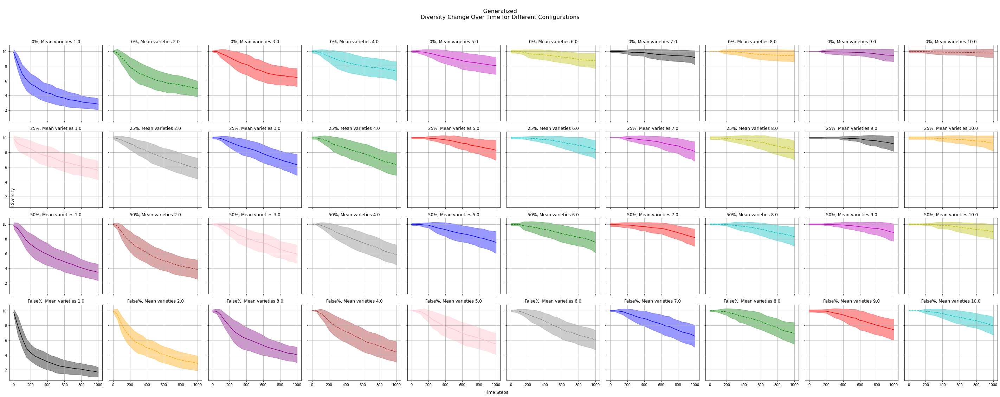

In [21]:
#heat_diversity_comm_level(DmvM_datos, inherits, Dmvalphas, 'Generalized', variable='Mean varieties')

diversity_change_graphs(DmvM_datos, inherits, Dmvalphas, 'Generalized', variable='Mean varieties', limitant = True)

In [37]:
diversity_change_by_row(DmvM_datos, inherits, Dmvalphas, 'Generalized', variable='Mean varieties', limitant = True)

diversity_change_by_column(DmvM_datos, inherits, Dmvalphas, 'Generalized', variable='Mean varieties', limitant = True)

NameError: name 'diversity_change_by_row' is not defined

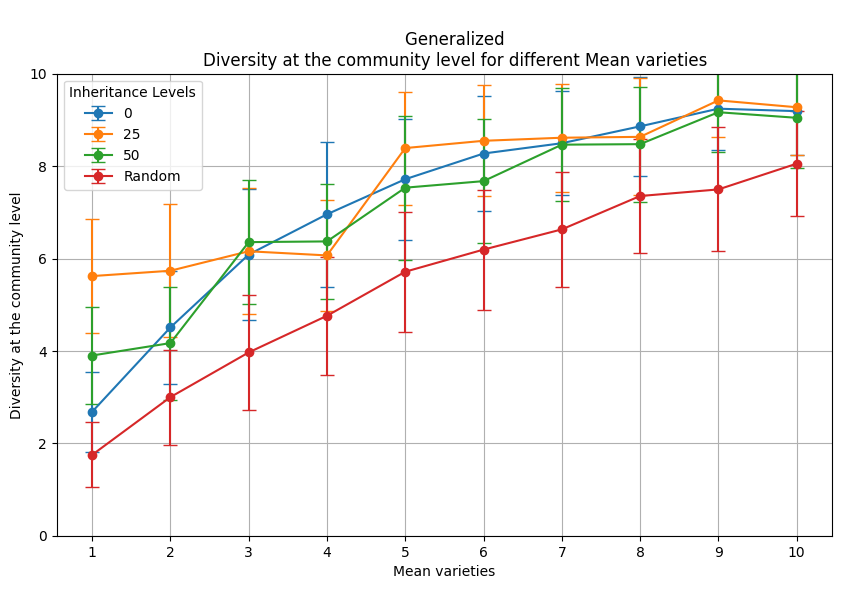

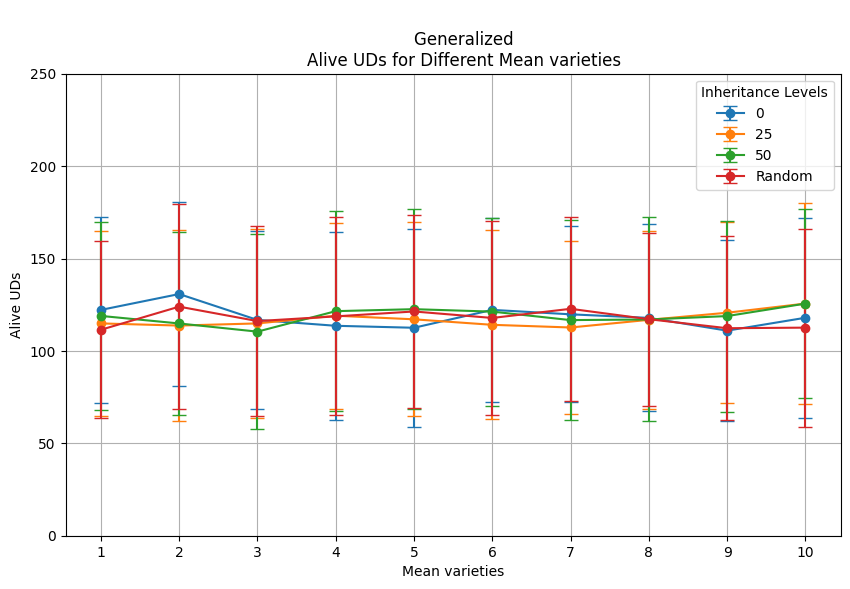

In [38]:
transversal_changes(DmvM_datos, inherits, Dmvalphas, 'Generalized', variable='Mean varieties')
transversal_alive(DmvM_datos, inherits, Dmvalphas, 'Generalized', variable='Mean varieties')

## Population Dynamics

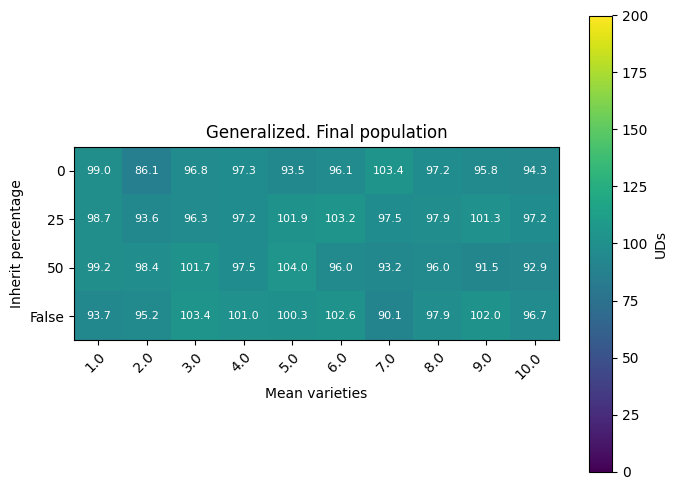

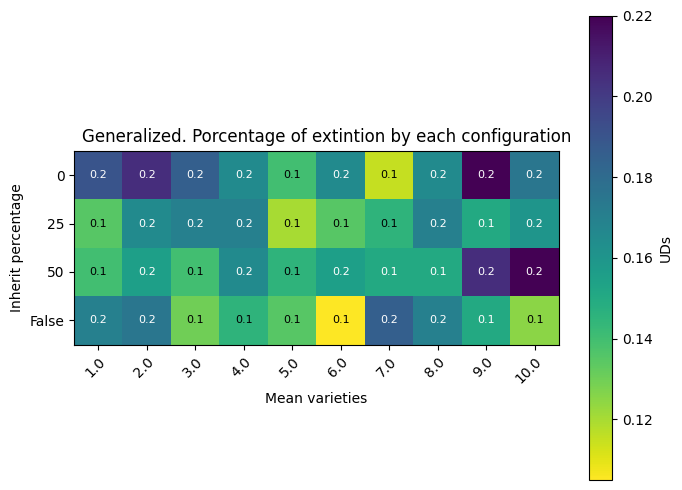

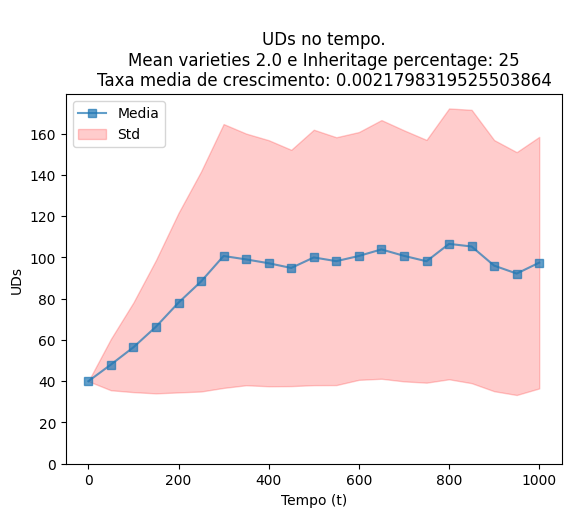

In [121]:
heat_population(DmvM_datos, inherits, Dmvalphas, 'Generalized', variable='Mean varieties')

heat_percentage_population(DmvM_datos, inherits, Dmvalphas, 'Generalized', variable='Mean varieties')

plot_specific_alivegraph(1, 1, DmvM_datos, inherits, Dmvalphas, 'Generalized', variable='Mean varieties')

In [22]:
DmvM_datosnew[1][0]

{'alive': np.float64(81.0),
 'std': array([ 0.        , 14.94991639, 26.31539473, 28.61380786, 23.41340428,
        20.18662924, 36.85444342, 43.96873889, 57.0542505 , 50.70687823,
        61.76771001, 34.21257079, 47.03389735, 19.14418972, 35.03569608,
        62.45148117, 71.83444508, 42.97964635, 52.68953881, 48.20269702,
        12.25765067]),
 'time used': 18.672905445098877,
 'percentage_extinction': 0.6,
 'tempo': [0,
  50,
  100,
  150,
  200,
  250,
  300,
  350,
  400,
  450,
  500,
  550,
  600,
  650,
  700,
  750,
  800,
  850,
  900,
  950,
  1000],
 'mean': array([ 40.  ,  50.  ,  61.  ,  59.5 ,  76.75,  73.  ,  88.5 , 110.5 ,
        111.25,  97.75, 105.5 ,  90.  ,  87.25,  93.  , 110.  , 129.75,
        122.75,  96.5 ,  95.75,  95.  ,  83.5 ]),
 'growth rate': np.float64(nan),
 'diversity_info': [[np.float64(4.0),
   np.float64(4.0),
   np.float64(4.0),
   np.float64(4.0)],
  [5, 5, 5, 5],
  [[3040604,
    3040604,
    3040604,
    3080405,
    6060508,
    6060508,
  

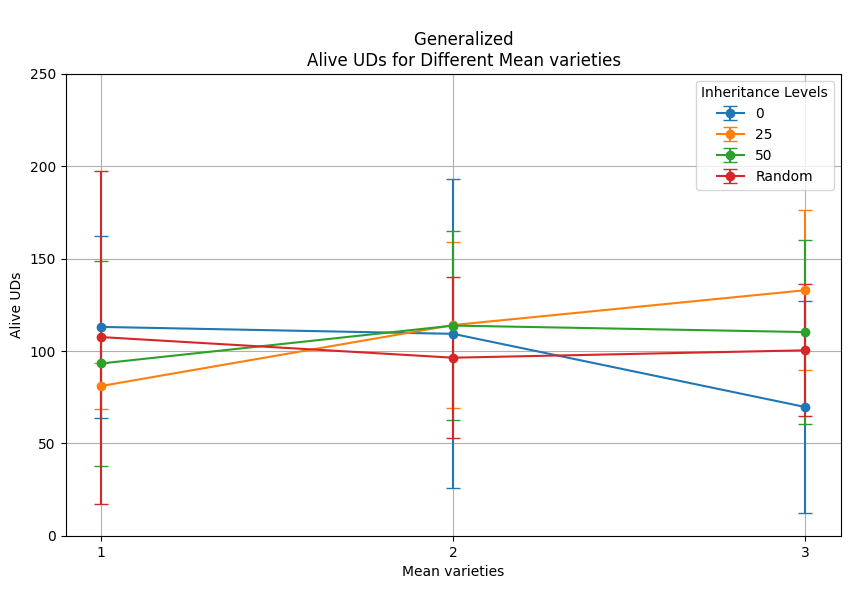

In [80]:
transversal_alive(DmvM_datosnew, inherits, Dmvalphas, 'Generalized', variable='Mean varieties')

In [ ]:
def transversal_changes(matrix, inherits, alphas, kinship_system, variable = ''):
    #Plot
    plt.figure(figsize=(10, 6))
    for i, inherit in enumerate(inherits):  # Loop for graphs
        means, stds = [], [] #Lists
        for j, malpha in enumerate(alphas):
            data = matrix[i][j]['diversity_info'][1]
            means.append(np.mean(data))  # Mean
            stds.append(np.std(data))    # Std
        #plot for each Initial UDs according to the inherit
        if inherit != 'False':
            plt.errorbar(alphas, means, yerr=stds, label=f'{inherit}', fmt='-o', capsize=5)
        else:
            plt.errorbar(alphas, means, yerr=stds, label=f'Random', fmt='-o', capsize=5)

    plt.xlabel(variable)
    plt.xticks(alphas)
    plt.ylabel('Diversity at the community level')
    plt.title(f'''
    {kinship_system}
    Diversity at the community level for different {variable}''')
    plt.legend(title="Inheritance Levels")
    plt.grid(True)
    plt.ylim(0,10)
    plt.show()